# Models for Pluto's and its Moons' System

# Models 1 - 4

##### In this notebook you will find the first 4 versions of our model. For more information on the theory and justification for our used equations, please read the project report.

## Libraries and Initial Conditions 

##### Here, we declare our libraries and the constants that each body will be using through our calculations.

In [1]:
#LIBRARIES:

#-------------------------------------------------------------------------------------------------------------------------------
#Libraries for the functions and math operations.
import numpy as np
import math

#Libraries for graph and plotting.
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
from matplotlib.patches import Ellipse
from matplotlib import cm

#Libraries for GIF animations.
import os
import imageio

#Library for the progress bar during loops.
from tqdm.notebook import tqdm, trange

#-------------------------------------------------------------------------------------------------------------------------------
#Line to activate the interface for matplotlib here in Jupyter Notebook. (Un-comment it if you want to use it)
#%matplotlib notebook

#-------------------------------------------------------------------------------------------------------------------------------
#Masses for each body.
pl_m = 1.3030e22  # ± 2.7e19 (kg)
ch_m = 1.587e21   # ± 1.5e19 (kg)
st_m = 7.5e15     # > real mass (kg)
ni_m = 4.5e16     # ± 4.0e16 (kg)
ke_m = 1.6e16     # ± 0.9e16 (kg)
hy_m = 4.8e16     # ± 4.2e16 (kg)

#Equatorial coordinates for the direction of the rotation´s north pole:
RA_pl = 132.99
dec_pl = 96.16

RA_ch = 132.99
dec_ch = 96.16

# 2nd Spheric Harmonics:
J2_pl = 1.249668221e-4
J2_ch = 5.707768698e-3

#Equatorial radii:
r_eq_pl = 1188 #km
r_eq_ch = 606 #km

#-------------------------------------------------------------------------------------------------------------------------------
#Colors for plotting and graphs:
col_pl = "red"
col_ch = "blue"
col_st = "green"
col_ni = "darkkhaki"
col_ke = "palevioletred"
col_hy = "darkorchid"


## JPL/NASA Data

#####  First, we analize the data from JPL/NASA of the Pluto and moons system (PLS from now on). We take the coordinates and velocities in a cartesian frame of reference known as ICRF. The XY plane is the ecliptic.

##### Each downloaded file from the HORIZONS system from JPL/NASA contains 34,561 registers for a body.

### Data Extraction and Analysis

##### First we extract the data from the files and we plot the coordinates to verify.

##### We open the text files (organized as CSV) with each body´s ephemeris. We used the dates between Jan/1/2021 up until May/1/2021 with a register every 5 min. This means we have 288 coordinates (and velocities) per day during those 4 months.

In [2]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function for a vector´s magnitude.
def mag(x, y, z):
    return math.sqrt(x**2 + y**2 + z**2)

#-------------------------------------------------------------------------------------------------------------------------------
#Function to extract the data from the file downloaded from JPLNASA (HORIZONS).
def ext_data(file):
    r = np.empty((0, 4), float)     # The matrices are declared.
    v = np.empty((0, 4), float)
    for line in file:
        lst = line.strip().split()    # This cuts extra spaces at the end of each line and separates
                                      # every "word" in an element of a STRING type array.
        
        # The values are added to the corresponding array.
        r = np.append(r, [[float(lst[4]), float(lst[5]), float(lst[6]), mag(float(lst[4]), float(lst[5]), float(lst[6]))]], axis=0)
        v = np.append(v, [[float(lst[7]), float(lst[8]), float(lst[9]), mag(float(lst[7]), float(lst[8]), float(lst[9]))]], axis=0)
    
    return r, v   # Returns the arrays.

#-------------------------------------------------------------------------------------------------------------------------------
#Functions for the data analysis.

#Function for the max. value in a matrix column.
def maxCol(mat, n):
    m = len(mat)          # No. of rows.
    col_max = mat[0, n]   # It begins with the first element in the column.
    for i in range(m):    # It compares each value with the loaded current highest value.
        col_max = max(col_max, mat[i, n])

    return col_max

#Function for the min. value in a matrix column.
def minCol(mat, n):
    m = len(mat)          # No. of rows.
    col_min = mat[0, n]   # It begins with the first element in the column.
    for i in range(m):    # It compares each value with the loaded current lowest value.
        col_min = min(col_min, mat[i, n]) 

    return col_min

#Function to calculate the approximated parameters for the elliptic trajectories.
def param(r, n):
    a = (maxCol(r, n) + minCol(r, n)) / 2    # It obtains an approximation of the major axis and divides it in 2.
    c = maxCol(r, n) - a                # It substracts "a" from the major axis (approx. of the focus-vertex distance).
    b = math.sqrt(a**2 - c**2)     # It calculates "b" with Pythagoras theorem.
    e = c / a                      # It calculates the eccentricity.
    return a, b, c, e

#-------------------------------------------------------------------------------------------------------------------------------
#Function to plot each trajectory individually.
def plot_orbit(title, r, color):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    if (title == "Kerberos"):
            ax.set_title(title + "' Trajectory", fontweight="bold", fontsize=14)
    else:
        ax.set_title(title + "'s Trajectory", fontweight="bold", fontsize=14)
    ax.scatter(0, 0, 0, marker="x", c="black");
    ax.scatter(r[:,0], r[:,1], r[:,2], marker="x", c=color, s=1);
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    fig.set_size_inches(8, 8)
    plt.show()


In [3]:
pluto    = open("data (M 1-4)/pluto1-4.txt")      # Each file is opened with its body´s name.
charon   = open("data (M 1-4)/charon1-4.txt")
styx     = open("data (M 1-4)/styx1-4.txt")
nix      = open("data (M 1-4)/nix1-4.txt")
kerberos = open("data (M 1-4)/kerberos1-4.txt")
hydra    = open("data (M 1-4)/hydra1-4.txt")

#-------------------------------------------------------------------------------------------------------------------------------
#We call the extracting function for each body.
pl_r, pl_v = ext_data(pluto)
ch_r, ch_v = ext_data(charon)
st_r, st_v = ext_data(styx)
ni_r, ni_v = ext_data(nix)
ke_r, ke_v = ext_data(kerberos)
hy_r, hy_v = ext_data(hydra)

#-------------------------------------------------------------------------------------------------------------------------------
#Approximation of the parameters for each elliptic trajectory.

# We obtained the largest and shortest radii from the data. We add them up and divide them in 2 to get an approximation of the
# semi-major axis from the elliptic trajectory of the body. Using this, calculating the approximated eccentricity was easy.

#    NOTE: It is important to say that these are NOT the parameters with which we compared our models. This is just an early
#          approximation to get an idea of what the later-obtained parameters will look like.

pl_a, pl_b, pl_c, pl_e = param(pl_r, 3)
ch_a, ch_b, ch_c, ch_e = param(ch_r, 3)
st_a, st_b, st_c, st_e = param(st_r, 3)
ni_a, ni_b, ni_c, ni_e = param(ni_r, 3)
ke_a, ke_b, ke_c, ke_e = param(ke_r, 3)
hy_a, hy_b, hy_c, hy_e = param(hy_r, 3)

print("READY")

READY


APPROXIMATION FOR THE TRAJECTORIES:
Pluto:    \ a: 2131.940860 \ b: 2131.940837 \ c: 0.312111 \ e: 0.000146
Charon:   \ a: 17468.574350 \ b: 17468.574332 \ c: 0.790691 \ e: 0.000045
Styx:     \ a: 42502.974303 \ b: 42501.511623 \ c: 352.610699 \ e: 0.008296
Nix:      \ a: 48736.291720 \ b: 48735.868347 \ c: 203.143014 \ e: 0.004168
Kerberos: \ a: 57772.871709 \ b: 57772.419968 \ c: 228.465602 \ e: 0.003955
Hydra:    \ a: 64731.770564 \ b: 64730.701767 \ c: 371.980031 \ e: 0.005746


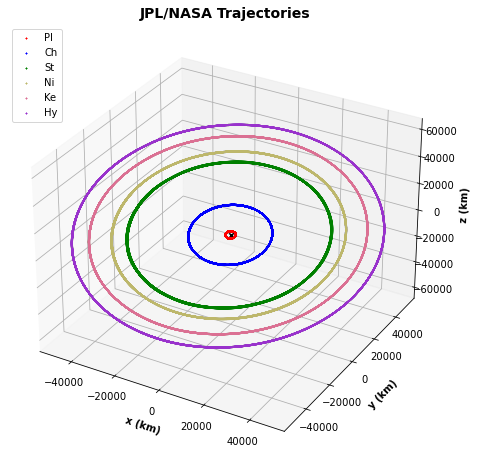

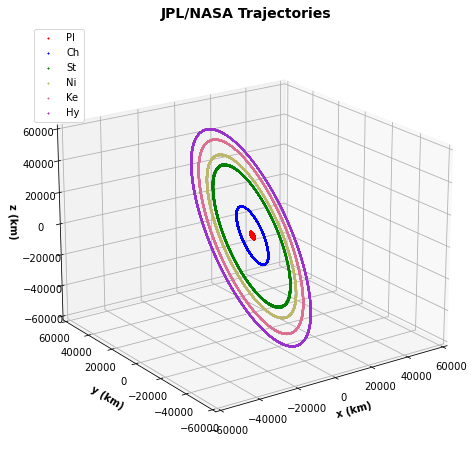

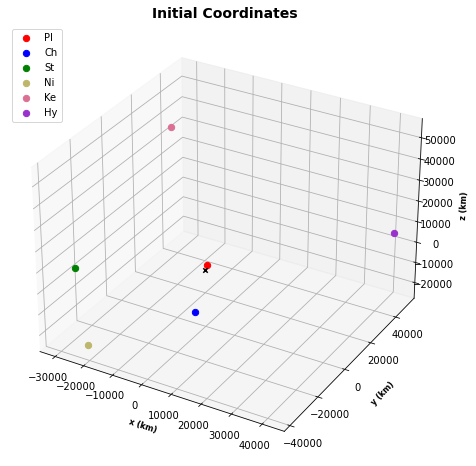

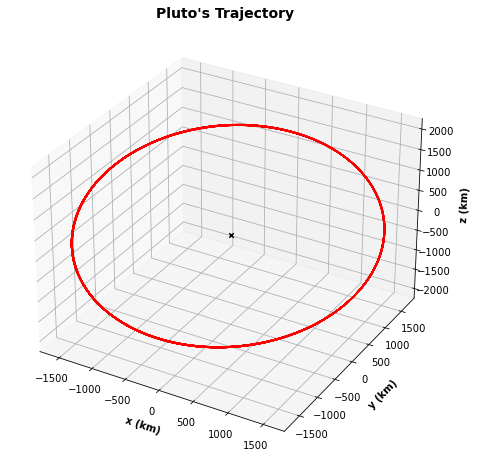

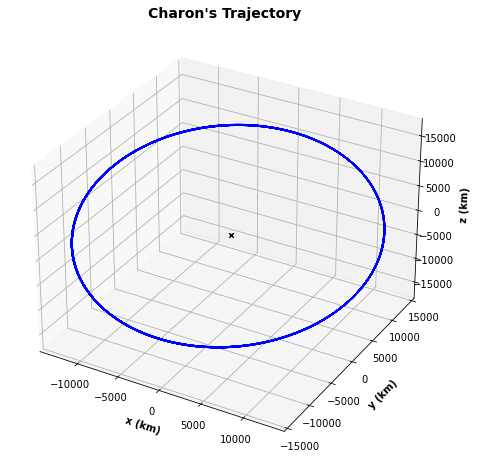

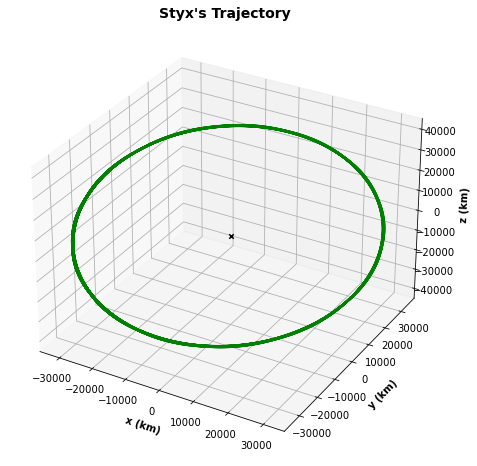

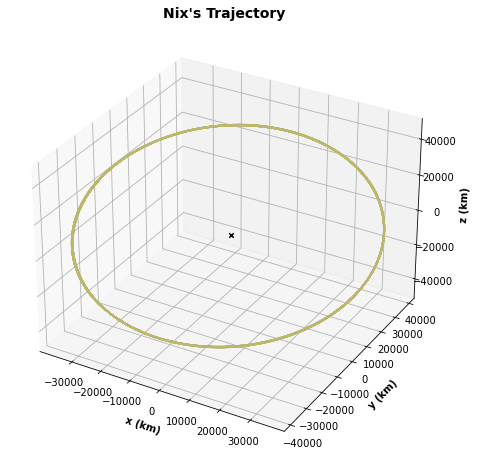

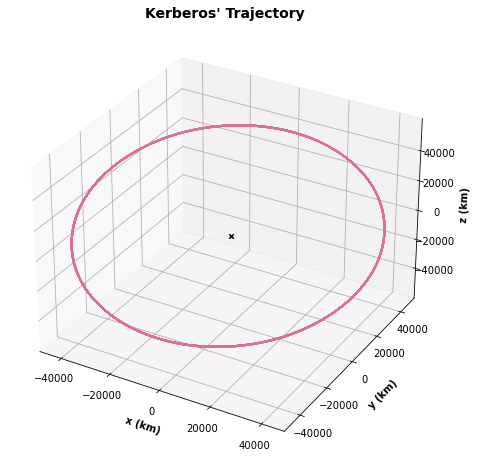

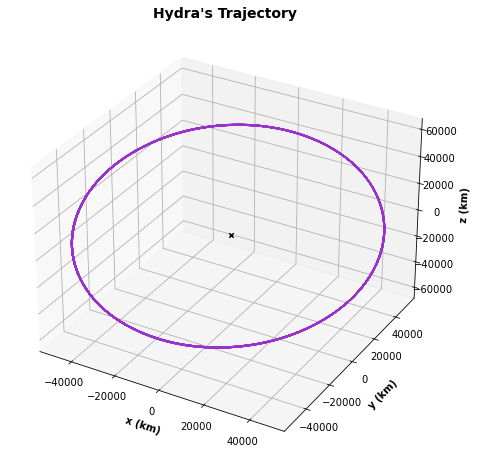

In [6]:
#-------------------------------------------------------------------------------------------------------------------------------
#Printing of the approximated parameters for each orbit´s ellipse.
print("APPROXIMATION FOR THE TRAJECTORIES:")
print("Pluto:    \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (pl_a, pl_b, pl_c, pl_e))
print("Charon:   \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (ch_a, ch_b, ch_c, ch_e))
print("Styx:     \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (st_a, st_b, st_c, st_e))
print("Nix:      \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (ni_a, ni_b, ni_c, ni_e))
print("Kerberos: \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (ke_a, ke_b, ke_c, ke_e))
print("Hydra:    \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (hy_a, hy_b, hy_c, hy_e))

#-------------------------------------------------------------------------------------------------------------------------------
#PLOTS

#All orbits together (all data from the 4 months).
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("JPL/NASA Trajectories", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(pl_r[:,0], pl_r[:,1], pl_r[:,2], marker="x", c=col_pl, label="Pl", s=1);
ax.scatter(ch_r[:,0], ch_r[:,1], ch_r[:,2], marker="x", c=col_ch, label="Ch", s=1);
ax.scatter(st_r[:,0], st_r[:,1], st_r[:,2], marker="x", c=col_st, label="St", s=1);
ax.scatter(ni_r[:,0], ni_r[:,1], ni_r[:,2], marker="x", c=col_ni, label="Ni", s=1);
ax.scatter(ke_r[:,0], ke_r[:,1], ke_r[:,2], marker="x", c=col_ke, label="Ke", s=1);
ax.scatter(hy_r[:,0], hy_r[:,1], hy_r[:,2], marker="x", c=col_hy, label="Hy", s=1);
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
ax.legend(loc='upper left')
fig.set_size_inches(8, 8)
plt.show()

#All orbits together, from another angle and with same-scale axes.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("JPL/NASA Trajectories", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(pl_r[:,0], pl_r[:,1], pl_r[:,2], marker="x", c=col_pl, label="Pl", s=1);
ax.scatter(ch_r[:,0], ch_r[:,1], ch_r[:,2], marker="x", c=col_ch, label="Ch", s=1);
ax.scatter(st_r[:,0], st_r[:,1], st_r[:,2], marker="x", c=col_st, label="St", s=1);
ax.scatter(ni_r[:,0], ni_r[:,1], ni_r[:,2], marker="x", c=col_ni, label="Ni", s=1);
ax.scatter(ke_r[:,0], ke_r[:,1], ke_r[:,2], marker="x", c=col_ke, label="Ke", s=1);
ax.scatter(hy_r[:,0], hy_r[:,1], hy_r[:,2], marker="x", c=col_hy, label="Hy", s=1);
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
ax.set_xlim3d(-60000, 60000)
ax.set_ylim3d(-60000, 60000)
ax.set_zlim3d(-60000, 60000)
ax.legend(loc='upper left')
ax.view_init(20, -125)
fig.set_size_inches(8, 8)
plt.show()

#Initial coordinates for all bodies.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Initial Coordinates", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(pl_r[0,0], pl_r[0,1], pl_r[0,2], c=col_pl, label="Pl", s=40);
ax.scatter(ch_r[0,0], ch_r[0,1], ch_r[0,2], c=col_ch, label="Ch", s=40);
ax.scatter(st_r[0,0], st_r[0,1], st_r[0,2], c=col_st, label="St", s=40);
ax.scatter(ni_r[0,0], ni_r[0,1], ni_r[0,2], c=col_ni, label="Ni", s=40);
ax.scatter(ke_r[0,0], ke_r[0,1], ke_r[0,2], c=col_ke, label="Ke", s=40);
ax.scatter(hy_r[0,0], hy_r[0,1], hy_r[0,2], c=col_hy, label="Hy", s=40);
ax.set_xlabel("x (km)", fontweight="bold", fontsize=8)
ax.set_ylabel("\ny (km)", fontweight="bold", fontsize=8)
ax.set_zlabel("\nz (km)", fontweight="bold", fontsize=8)
ax.legend(loc='upper left')
fig.set_size_inches(8, 8)
plt.show()

#We plot every individual orbit.
plot_orbit("Pluto",    pl_r, col_pl)
plot_orbit("Charon",   ch_r, col_ch)
plot_orbit("Styx",     st_r, col_st)
plot_orbit("Nix",      ni_r, col_ni)
plot_orbit("Kerberos", ke_r, col_ke)
plot_orbit("Hydra",    hy_r, col_hy)


### Animations

#### IMPORTANT: The following code are exclusivley to generate GIF animations that we used in presentations (PowerPoint, Prezi, etc.). It is NOT necessary to run these lines if you are only interested in the results.

##### The animations are saved in GIF format directly in the folder where this notebook is located. The path can be changed for each animation, as well as the file name.

In [9]:
#-------------------------------------------------------------------------------------------------------------------------------
#Orbits around barycenter - rotating perspective
del filenames   #If this is the first animation, comment this line.
filenames = []
T = 108
k = 360/T
lim = tqdm((range(T)), desc="GIF: ")
for i in lim:
    #Each frame is created.
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("JPL/NASA Trajectories", fontsize=16)
    ax.scatter(0, 0, 0, marker="x", c="black");
    ax.scatter(pl_r[:,0], pl_r[:,1], pl_r[:,2], marker="x", c=col_pl, label="Pl", s=1);
    ax.scatter(ch_r[:,0], ch_r[:,1], ch_r[:,2], marker="x", c=col_ch, label="Ch", s=1);
    ax.scatter(st_r[:,0], st_r[:,1], st_r[:,2], marker="x", c=col_st, label="St", s=1);
    ax.scatter(ni_r[:,0], ni_r[:,1], ni_r[:,2], marker="x", c=col_ni, label="Ni", s=1);
    ax.scatter(ke_r[:,0], ke_r[:,1], ke_r[:,2], marker="x", c=col_ke, label="Ke", s=1);
    ax.scatter(hy_r[:,0], hy_r[:,1], hy_r[:,2], marker="x", c=col_hy, label="Hy", s=1);
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    ax.set_xlim3d(-60000, 60000)
    ax.set_ylim3d(-60000, 60000)
    ax.set_zlim3d(-60000, 60000)
    ax.legend(loc='upper left')
    ax.view_init(20, -k*i)
    fig.set_size_inches(8, 8)
    
    # The PNG file to save the current frame is created.
    filename = f'{i}.png'
    filenames.append(filename)
    
    # The frame is saved in the PNG file.
    plt.savefig(filename)
    plt.close()

# The GIF is created.
with imageio.get_writer('Rotation_JPL.gif', mode='I', fps=10) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# The individual frame files are eliminated.
for filename in set(filenames):
    os.remove(filename)
    

GIF:   0%|          | 0/108 [00:00<?, ?it/s]

In [42]:
#-------------------------------------------------------------------------------------------------------------------------------
#Orbits around barycenter - movement animation.
T = 360
k = math.floor(len(pl_r[:,0])/T)         # Amount of data in each of the T partitions.

del filenames   #If this is the first animation, comment this line.
filenames = []
lim = tqdm((range(T)), desc="GIF: ")
i = 0
d = 1
for j in lim:
    
    if i == 3:
        d = d + 1
        i = 0
    i = i + 1
    
    #Each frame is created.
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("JPL/NASA Trajectories\n6 days /s   (Day "+str(d)+")", fontsize=16)
    ax.scatter(0, 0, 0, marker="x", c="black");
    ax.plot(pl_r[:j*k,0], pl_r[:j*k,1], pl_r[:j*k,2], lw=1, alpha=0.5, c=col_pl);
    ax.scatter(pl_r[j*k,0], pl_r[j*k,1], pl_r[j*k,2], c=col_pl, label="Pl", s=40);
    ax.plot(ch_r[:j*k,0], ch_r[:j*k,1], ch_r[:j*k,2], lw=1, alpha=0.5, c=col_ch);
    ax.scatter(ch_r[j*k,0], ch_r[j*k,1], ch_r[j*k,2], c=col_ch, label="Ch", s=40);
    ax.plot(st_r[:j*k,0], st_r[:j*k,1], st_r[:j*k,2], lw=1, alpha=0.5, c=col_st);
    ax.scatter(st_r[j*k,0], st_r[j*k,1], st_r[j*k,2], c=col_st, label="St", s=40);
    ax.plot(ni_r[:j*k,0], ni_r[:j*k,1], ni_r[:j*k,2], lw=1, alpha=0.5, c=col_ni);
    ax.scatter(ni_r[j*k,0], ni_r[j*k,1], ni_r[j*k,2], c=col_ni, label="Ni", s=40);
    ax.plot(ke_r[:j*k,0], ke_r[:j*k,1], ke_r[:j*k,2], lw=1, alpha=0.5, c=col_ke);
    ax.scatter(ke_r[j*k,0], ke_r[j*k,1], ke_r[j*k,2], c=col_ke, label="Ke", s=40);
    ax.plot(hy_r[:j*k,0], hy_r[:j*k,1], hy_r[:j*k,2], lw=1, alpha=0.5, c=col_hy);
    ax.scatter(hy_r[j*k,0], hy_r[j*k,1], hy_r[j*k,2], c=col_hy, label="Hy", s=40);
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    ax.set_xlim3d(-60000, 60000)
    ax.set_ylim3d(-60000, 60000)
    ax.set_zlim3d(-60000, 60000)
    ax.legend(loc='upper left')
    fig.set_size_inches(8, 8)
    
    # The PNG file to save the current frame is created.
    filename = f'{j}.png'
    filenames.append(filename)
    
    # The frame is saved in the PNG file.
    plt.savefig(filename)
    plt.close()
    
# The GIF is created.
with imageio.get_writer('Orbits_JPL.gif', mode='I', fps=18) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# The individual frame files are eliminated.
for filename in set(filenames):
    os.remove(filename)
    

GIF:   0%|          | 0/360 [00:00<?, ?it/s]

In [46]:
#-------------------------------------------------------------------------------------------------------------------------------
#Orbits around barycenter - movement animation (slower to have the same speed as the models).
T = 192
k = 90         # Amount of data in each of the T partitions.

del filenames   #If this is the first animation, comment this line.
filenames = []
lim = tqdm(range(T), desc="GIF: ")
i = 0
d = 1
for j in lim:
    
    if i == 5:
        d = d + 1
        i = 0
    i = i + 1
    
    #Each frame is created.
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("JPL/NASA Trajectories\n2 days /s   (Day "+str(d)+")", fontsize=16)
    ax.scatter(0, 0, 0, marker="x", c="black");
    ax.plot(pl_r[:j*k,0], pl_r[:j*k,1], pl_r[:j*k,2], lw=1, alpha=0.5, c=col_pl);
    ax.scatter(pl_r[j*k,0], pl_r[j*k,1], pl_r[j*k,2], c=col_pl, label="Pl", s=40);
    ax.plot(ch_r[:j*k,0], ch_r[:j*k,1], ch_r[:j*k,2], lw=1, alpha=0.5, c=col_ch);
    ax.scatter(ch_r[j*k,0], ch_r[j*k,1], ch_r[j*k,2], c=col_ch, label="Ch", s=40);
    ax.plot(st_r[:j*k,0], st_r[:j*k,1], st_r[:j*k,2], lw=1, alpha=0.5, c=col_st);
    ax.scatter(st_r[j*k,0], st_r[j*k,1], st_r[j*k,2], c=col_st, label="St", s=40);
    ax.plot(ni_r[:j*k,0], ni_r[:j*k,1], ni_r[:j*k,2], lw=1, alpha=0.5, c=col_ni);
    ax.scatter(ni_r[j*k,0], ni_r[j*k,1], ni_r[j*k,2], c=col_ni, label="Ni", s=40);
    ax.plot(ke_r[:j*k,0], ke_r[:j*k,1], ke_r[:j*k,2], lw=1, alpha=0.5, c=col_ke);
    ax.scatter(ke_r[j*k,0], ke_r[j*k,1], ke_r[j*k,2], c=col_ke, label="Ke", s=40);
    ax.plot(hy_r[:j*k,0], hy_r[:j*k,1], hy_r[:j*k,2], lw=1, alpha=0.5, c=col_hy);
    ax.scatter(hy_r[j*k,0], hy_r[j*k,1], hy_r[j*k,2], c=col_hy, label="Hy", s=40);
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    ax.set_xlim3d(-60000, 60000)
    ax.set_ylim3d(-60000, 60000)
    ax.set_zlim3d(-60000, 60000)
    ax.legend(loc='upper left')
    fig.set_size_inches(8, 8)
    
    # The PNG file to save the current frame is created.
    filename = f'{j}.png'
    filenames.append(filename)
    
    # The frame is saved in the PNG file.
    plt.savefig(filename)
    plt.close()
    
# The GIF is created.
with imageio.get_writer('Orbits_JPL_comp.gif', mode='I', fps=10) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# The individual frame files are eliminated.
for filename in set(filenames):
    os.remove(filename)
  

GIF:   0%|          | 0/192 [00:00<?, ?it/s]

### Fitted Planes and Orbital Periods

##### The "one_orbit()" function analizes the sign change in the "x" and "y" coordinates. When there is a sign change, it implies a change of quadrant in the XY plane. When enough sign changes happen, we are back at the starting quadrant. Then, we analyze the angle of each new coordinate. The moment that our new coordiante has a lower angle than the initial coordinate, it means we just went over our starting point, so we end the process ("break"). This way, we save only the cordinates that conform the first orbit.

##### Cabe remarcar que la condición que utilizamos para el ángulo es válida por la dirección en la que orbitan los cuerpos, ya que la dirección que llevan es en el "sentido de las manecillas del reloj" en cuanto a las coordenadas del plano. Si fueran en dirección contraria, se debe hacer "break" cuando el ángulo nuevo sea MAYOR al inicial.

##### However, the condition that we used for the angle (lower than) is only valid due to the direction the bodies are orbiting (counter-clockwise). If the bodies were orbiting ina clockwise direction, the process should "break" when the current coordinate angle is gretar than the initial one.

##### We invite the reader to generalize the process considering these conditions.

In [5]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to save the first orbit´s data.
def one_orbit(xs, ys, zs, title):
    p_r = np.empty((len(xs), 4), float)    #Preapres an array as if it were going to save all the data again.
    s1 = 0       # Variables to store the signs for the "x" and "y" coordinates.
    s2 = 0
    tho = math.atan(ys[0]/xs[0])       # Stores the initial angle.
    j = 0                              # Stores the amount of sign changes.
    lim = tqdm(range(len(xs)), desc="1st Orbit ("+title+"): ")
    for i in lim:
        if s1 != xs[i]/abs(xs[i]) or s2 != ys[i]/abs(ys[i]):     #Cond.: if 1 of the 2 signs is different...
            s1 = xs[i]/abs(xs[i])                                # ...store the new signs...
            s2 = ys[i]/abs(ys[i])
            j = j + 1                                            # ...and mark the quadrant change.
        th = math.atan(ys[i]/xs[i])                              # Calculate the initial angle.
        if j == 5 and th < tho:                                  # Cond.: if we are in the initial quadrant and
            n = i                                                #        the angle is lower than the initial one...
            break                                                # ... stop storing data.
        
        p_r[i,0], p_r[i,1], p_r[i,2], p_r[i,3] = xs[i], ys[i], zs[i], mag(xs[i], ys[i], zs[i])   # In each iteration it
                                                                                                 # stores the data.
    p = np.empty((n, 4), float)    # Creates a new matrix to hold only the 1st orbit data.
    for i in range(n):
        p[i,:] = p_r[i,:]          # Stores the data in the new matrix.
    
    return p

#-------------------------------------------------------------------------------------------------------------------------------
#Function to fit the plane to the trajectories of each body.
def plane(title, x, y, z):
    tmp_A = []    # The arrays are initialized.
    tmp_b = []

    # The matrices are generated.
    for i in range(len(x)):
        tmp_A.append([x[i], y[i], 1])
        tmp_b.append(z[i])
        
    b = np.matrix(tmp_b).T
    A = np.matrix(tmp_A)

    # Solution for the constants of the plane equation.
    fit = (A.T * A).I * A.T * b

    # The constants are stored in an array that the function returns.
    pln = np.squeeze(np.asarray(fit))
    
    # The plane equation is printed.
    print(title + ": %f x + %f y + %f = z" % (pln[0], pln[1], pln[2]))
    
    return pln

#-------------------------------------------------------------------------------------------------------------------------------
#Function to calculate the orbital period of a body.
def period(h, xs):
    per = (len(xs))*h + h/2   # Orbital period in terrestrial days.
    return per  # Remembering that, because of the data, it includes an error of +/- half of the step "h".

#      NOTE: We still haven´t used a step "h". However, we generalize this to use it later on with the models. For this
#            current case, we consider the step "h" to be 5 min (5.787037037 x 10^{-5} days).

#-------------------------------------------------------------------------------------------------------------------------------
#Function to print orbital periods.
def print_per(h, title, p_r, per):
    print(title + ":")
    print("Amount of Data: " + str(len(p_r[:,0])))
    print("Period (days):  " + str(per) + " +/- " + str(h/2) + "\n")


In [6]:
#Generating the fitted planes.

#-------------------------------------------------------------------------------------------------------------------------------
# Storing of the 1st orbit´s data.
p_r_pl = one_orbit(pl_r[:,0], pl_r[:,1], pl_r[:,2], "Pl")
p_r_ch = one_orbit(ch_r[:,0], ch_r[:,1], ch_r[:,2], "Ch")
p_r_st = one_orbit(st_r[:,0], st_r[:,1], st_r[:,2], "St")
p_r_ni = one_orbit(ni_r[:,0], ni_r[:,1], ni_r[:,2], "Ni")
p_r_ke = one_orbit(ke_r[:,0], ke_r[:,1], ke_r[:,2], "Ke")
p_r_hy = one_orbit(hy_r[:,0], hy_r[:,1], hy_r[:,2], "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
# The fitted plane is obtained.
print("FITTED PLANES:\n")
pln_pl = plane("Pluto",    p_r_pl[:,0], p_r_pl[:,1], p_r_pl[:,2])
pln_ch = plane("Charon",   p_r_ch[:,0], p_r_ch[:,1], p_r_ch[:,2])
pln_st = plane("Styx",     p_r_st[:,0], p_r_st[:,1], p_r_st[:,2])
pln_ni = plane("Nix",      p_r_ni[:,0], p_r_ni[:,1], p_r_ni[:,2])
pln_ke = plane("Kerberos", p_r_ke[:,0], p_r_ke[:,1], p_r_ke[:,2])
pln_hy = plane("Hydra",    p_r_hy[:,0], p_r_hy[:,1], p_r_hy[:,2])

#-------------------------------------------------------------------------------------------------------------------------------
# The orbital period is calculated.
h_jpl = 3.472121756e-3 #days     # Which is to say, one data every 5 min.

per_pl = period(h_jpl, p_r_pl[:,3])
per_ch = period(h_jpl, p_r_ch[:,3])
per_st = period(h_jpl, p_r_st[:,3])
per_ni = period(h_jpl, p_r_ni[:,3])
per_ke = period(h_jpl, p_r_ke[:,3])
per_hy = period(h_jpl, p_r_hy[:,3])

# The amount of data for the 1st orbit and the period is printed for each body.
print("\nORBITAL PERIOD (and amount of data for 1st orbit)\n")
print_per(h_jpl, "Pluto",    p_r_pl, per_pl)
print_per(h_jpl, "Charon",   p_r_ch, per_ch)
print_per(h_jpl, "Styx",     p_r_st, per_st)
print_per(h_jpl, "Nix",      p_r_ni, per_ni)
print_per(h_jpl, "Kerberos", p_r_ke, per_ke)
print_per(h_jpl, "Hydra",    p_r_hy, per_hy)


1st Orbit (Pl):   0%|          | 0/34561 [00:00<?, ?it/s]

1st Orbit (Ch):   0%|          | 0/34561 [00:00<?, ?it/s]

1st Orbit (St):   0%|          | 0/34561 [00:00<?, ?it/s]

1st Orbit (Ni):   0%|          | 0/34561 [00:00<?, ?it/s]

1st Orbit (Ke):   0%|          | 0/34561 [00:00<?, ?it/s]

1st Orbit (Hy):   0%|          | 0/34561 [00:00<?, ?it/s]

FITTED PLANES:

Pluto: -1.742640 x + 1.602680 y + -0.002008 = z
Charon: -1.742640 x + 1.602679 y + -0.002230 = z
Styx: -1.745971 x + 1.604349 y + 1.544035 = z
Nix: -1.741806 x + 1.598748 y + 1.804368 = z
Kerberos: -1.763612 x + 1.638540 y + 8.225412 = z
Hydra: -1.720599 x + 1.596033 y + 4.452288 = z

ORBITAL PERIOD (and amount of data for 1st orbit)

Pluto:
Amount of Data: 1840
Period (days):  6.390440091917999 +/- 0.001736060878

Charon:
Amount of Data: 1840
Period (days):  6.390440091917999 +/- 0.001736060878

Styx:
Amount of Data: 5807
Period (days):  20.164347097969998 +/- 0.001736060878

Nix:
Amount of Data: 7159
Period (days):  24.858655712081998 +/- 0.001736060878

Kerberos:
Amount of Data: 9265
Period (days):  32.170944130218004 +/- 0.001736060878

Hydra:
Amount of Data: 11002
Period (days):  38.202019620390004 +/- 0.001736060878



### Projecting the Points to the Fitted Plane

##### We obtained the projections of the points in the orbits to the plane we fitted previously. Using this, we calculated the polar coordinates within this plane. The fitted plane, as well as the projected points of the 1st orbit, can be seen in the following plots.

In [7]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to obtain the points, distances and angles within the plane.
def points_proj(x, y, z, pln, title):
    p_r = np.empty((len(x), 5), float)    # Declaring the matrix for the points.
    p_th = 0                              # Variable for the angle.

    N = np.array([pln[0], pln[1], -1])           # Perpendicular vector from the plane.
    modN = math.sqrt(pln[0]**2 + pln[1]**2 + 1)  # Calculating the unitary vector.
    n = N / modN

    d = np.empty(len(x), float)         # Array for the distances from a point to the plane.
    
    for i in range(len(x)):
        d[i] = abs(pln[0]*x[i] + pln[1]*y[i] - 1*z[i] + pln[2]) / modN       # Calculating the distance and
                                                                             # adding it to the "d" array.
    lim = tqdm(range(len(x)), desc="P. Proj. ("+title+") :")
    for i in lim:    # Storing the new projected points.
        if z[i] > (pln[0]*x[i] + pln[1]*y[i] + pln[2]):      # If the original point is under or above the plane, the
            p_x = x[i] + n[0]*d[i]                           # vector must be added or substracted to get to the
            p_y = y[i] + n[1]*d[i]                           # plane projection point.
            p_z = (z[i] + n[2]*d[i]) - pln[2]
        else:
            p_x = x[i] - n[0]*d[i]
            p_y = y[i] - n[1]*d[i]
            p_z = (z[i] - n[2]*d[i]) - pln[2]
        p_rad = math.sqrt(p_x**2 + p_y**2 + p_z**2)   # The polar coordinates within the plane are calculated.
        if p_x/abs(p_x) == 1:
            if p_y/abs(p_y) == 1:                     # This is to assure that the angle is in its quadrant.
                p_th = abs(math.atan(p_y/p_x))
            if p_y/abs(p_y) == -1:
                p_th = (3/2)*np.pi + (((1/2)*np.pi) - abs(math.atan(p_y/p_x)))
        if p_x/abs(p_x) == -1:
            if p_y/abs(p_y) == 1:
                p_th = (np.pi/2 + (np.pi/2 - abs(math.atan(p_y/p_x))))
            if p_y/abs(p_y) == -1:
                p_th = (np.pi + abs(math.atan(p_y/p_x)))
                
        p_r[i,0], p_r[i,1], p_r[i,2], p_r[i,3], p_r[i,4] = p_x, p_y, p_z, p_rad, p_th   # The data is stored in the initially
                                                                                        # declared matrix.
    return p_r    # Returns the projected points.

#-------------------------------------------------------------------------------------------------------------------------------
#Function to plot the 1st orbit within the plane.
def plot_plane(title, pln, color, p_r, grid):
    x = np.linspace(grid[0],grid[1],grid[2])
    y = np.linspace(grid[0],grid[1],grid[2])

    X,Y = np.meshgrid(x,y)               # This plots the grid to represent the fitted plane.
    Z=pln[0]*X + pln[1]*Y + pln[2]

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.scatter(0, 0, 0, marker="x", c="black")
    ax.scatter(p_r[:,0], p_r[:,1], p_r[:,2], marker="x", c=color, s=3)
    surf = ax.plot_wireframe(X, Y, Z, color="black", alpha=0.5)
    ax.set_title("Plane and Projections for " + title, fontweight="bold", fontsize=14)
    fig.set_size_inches(8, 8)
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    plt.show()


P. Proj. (Pl) ::   0%|          | 0/1840 [00:00<?, ?it/s]

P. Proj. (Ch) ::   0%|          | 0/1840 [00:00<?, ?it/s]

P. Proj. (St) ::   0%|          | 0/5807 [00:00<?, ?it/s]

P. Proj. (Ni) ::   0%|          | 0/7159 [00:00<?, ?it/s]

P. Proj. (Ke) ::   0%|          | 0/9265 [00:00<?, ?it/s]

P. Proj. (Hy) ::   0%|          | 0/11002 [00:00<?, ?it/s]

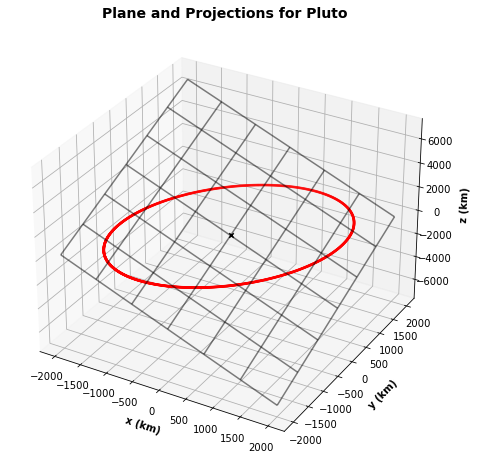

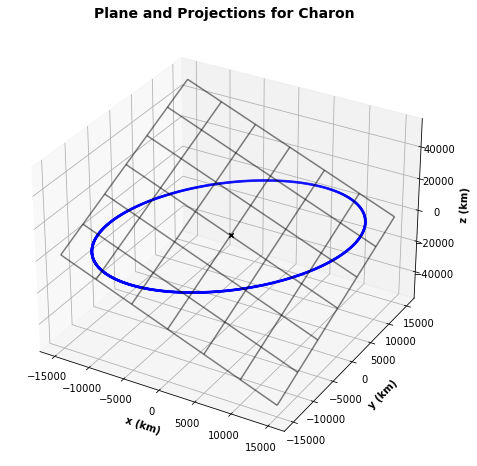

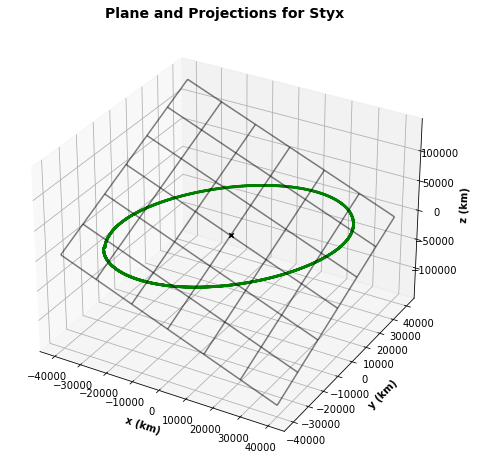

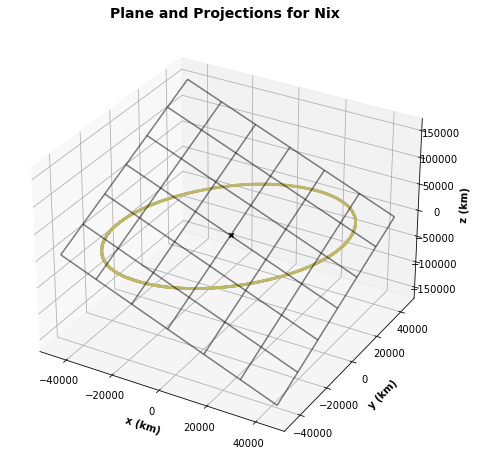

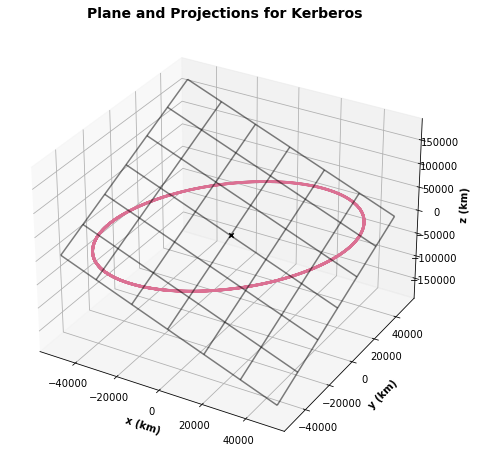

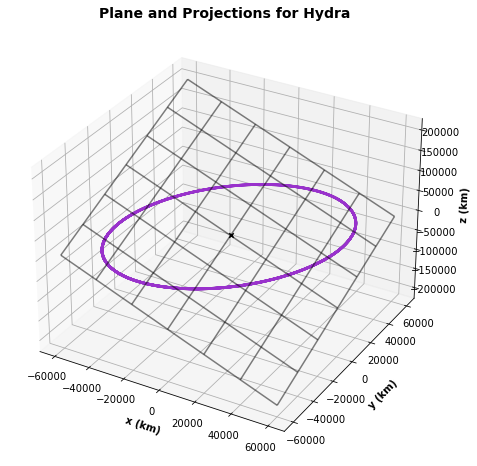

In [8]:
#-------------------------------------------------------------------------------------------------------------------------------
#Calling the function to project the points.
p_pl_r = points_proj(p_r_pl[:,0], p_r_pl[:,1], p_r_pl[:,2], pln_pl, "Pl")
p_ch_r = points_proj(p_r_ch[:,0], p_r_ch[:,1], p_r_ch[:,2], pln_ch, "Ch")
p_st_r = points_proj(p_r_st[:,0], p_r_st[:,1], p_r_st[:,2], pln_st, "St")
p_ni_r = points_proj(p_r_ni[:,0], p_r_ni[:,1], p_r_ni[:,2], pln_ni, "Ni")
p_ke_r = points_proj(p_r_ke[:,0], p_r_ke[:,1], p_r_ke[:,2], pln_ke, "Ke")
p_hy_r = points_proj(p_r_hy[:,0], p_r_hy[:,1], p_r_hy[:,2], pln_hy, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the points in the plane.

#Limits for the grid to represent the plane.
grid_pl = ([-2000, 2000, 7])
grid_ch = ([-15000,15000,7])
grid_st = ([-40000,40000,7])
grid_ni = ([-45000,45000,7])
grid_ke = ([-50000,50000,7])
grid_hy = ([-60000,60000,7])

#The points and planes are plotted.
plot_plane("Pluto",    pln_pl, col_pl, p_pl_r, grid_pl)
plot_plane("Charon",   pln_ch, col_ch, p_ch_r, grid_ch)
plot_plane("Styx",     pln_st, col_st, p_st_r, grid_st)
plot_plane("Nix",      pln_ni, col_ni, p_ni_r, grid_ni)
plot_plane("Kerberos", pln_ke, col_ke, p_ke_r, grid_ke)
plot_plane("Hydra",    pln_hy, col_hy, p_hy_r, grid_hy)


### Fitting Ellipses

##### We generate the 2D Cartesian coordinates for the points in the plane. We can use these coordinates to fit an ellipse to them.

In [9]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to convert from polar to Cartesian coordinates.
def points_2d(p_r, title):
    p_2d = np.empty((len(p_r), 2), float)    # The matrix to store the Cartesian coordinates is declared.
    lim = tqdm(range(len(p_r)), desc="2D Points ("+title+") :")
    for i in lim:
        p_2d[i,0], p_2d[i,1] = p_r[i,3]*math.cos(p_r[i,4]), p_r[i,3]*math.sin(p_r[i,4])   # The coordinates are converted.
        
    return p_2d

#-------------------------------------------------------------------------------------------------------------------------------
#Function to obtain the ellipse equation - (Ax^2 + Bxy + Cy^2 + Dx + Ey + F = 0)
def fit_ellipse(p_2d):
    # The initial matrices for the "x" and "y" axes are declared.
    X = np.reshape(p_2d[:,0], (len(p_2d[:,0]), 1))
    Y = np.reshape(p_2d[:,1], (len(p_2d[:,1]), 1))

    # Solving by least squares.
    A = np.hstack([X**2, X * Y, Y**2, X, Y])
    b = np.ones_like(X)
    x = np.linalg.lstsq(A, b)[0].squeeze()      # The constants are stored. They are for the equation of the form:
                                                #        Ax^2 + Bxy + Cy^2 + Dx + Ey = 1
    x = np.append(x, -1)                        # We add "F = -1" at the end of all equations.

    return x


In [10]:
#-------------------------------------------------------------------------------------------------------------------------------
#Generating the 2D points.
pl_2d_r = points_2d(p_pl_r, "Pl")
ch_2d_r = points_2d(p_ch_r, "Ch")
st_2d_r = points_2d(p_st_r, "St")
ni_2d_r = points_2d(p_ni_r, "Ni")
ke_2d_r = points_2d(p_ke_r, "Ke")
hy_2d_r = points_2d(p_hy_r, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#Fitting the ellipse

#The constants for each ellipse are obtained.
ell_pl = fit_ellipse(pl_2d_r)
ell_ch = fit_ellipse(ch_2d_r)
ell_st = fit_ellipse(st_2d_r)
ell_ni = fit_ellipse(ni_2d_r)
ell_ke = fit_ellipse(ke_2d_r)
ell_hy = fit_ellipse(hy_2d_r)


2D Points (Pl) ::   0%|          | 0/1840 [00:00<?, ?it/s]

2D Points (Ch) ::   0%|          | 0/1840 [00:00<?, ?it/s]

2D Points (St) ::   0%|          | 0/5807 [00:00<?, ?it/s]

2D Points (Ni) ::   0%|          | 0/7159 [00:00<?, ?it/s]

2D Points (Ke) ::   0%|          | 0/9265 [00:00<?, ?it/s]

2D Points (Hy) ::   0%|          | 0/11002 [00:00<?, ?it/s]

<ipython-input-9-8163926b49f2>:23: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  x = np.linalg.lstsq(A, b)[0].squeeze()      # The constants are stored. They are for the equation of the form:


EQUATIONS OF FITTED ELLIPSES:
Pluto:     2.2e-07x^2 + 2.1e-12xy+2.2e-07y^2+4.43e-08x+2.26e-08y = 1
Charon:    3.28e-09x^2 + -4.33e-16xy+3.28e-09y^2+-1.55e-09x+-2.51e-09y = 1
Styx:      5.54e-10x^2 + -5.77e-12xy+5.6e-10y^2+1.34e-07x+-7.54e-08y = 1
Nix:       4.22e-10x^2 + 7.19e-17xy+4.21e-10y^2+4.75e-08x+3.72e-08y = 1
Kerberos:  3e-10x^2 + -1.26e-13xy+3e-10y^2+9.91e-08x+-7.03e-09y = 1
Hydra:     2.39e-10x^2 + -2.54e-14xy+2.39e-10y^2+-1.56e-07x+1.61e-07y = 1


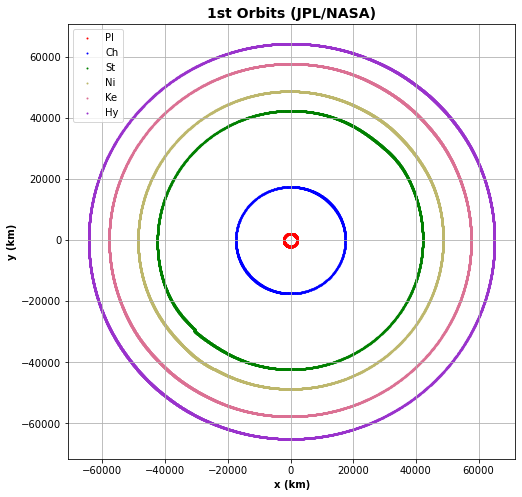

In [11]:
#-------------------------------------------------------------------------------------------------------------------------------
#Printing of each ellipse's equation.
print("EQUATIONS OF FITTED ELLIPSES:")
print('Pluto:     {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_pl[0], ell_pl[1], ell_pl[2], ell_pl[3], ell_pl[4]))
print('Charon:    {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_ch[0], ell_ch[1], ell_ch[2], ell_ch[3], ell_ch[4]))
print('Styx:      {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_st[0], ell_st[1], ell_st[2], ell_st[3], ell_st[4]))
print('Nix:       {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_ni[0], ell_ni[1], ell_ni[2], ell_ni[3], ell_ni[4]))
print('Kerberos:  {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_ke[0], ell_ke[1], ell_ke[2], ell_ke[3], ell_ke[4]))
print('Hydra:     {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_hy[0], ell_hy[1], ell_hy[2], ell_hy[3], ell_hy[4]))

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the points in a single graph (approximating all planes as equal).
fig = plt.figure()
plt.scatter(pl_2d_r[:,0], pl_2d_r[:,1], c=col_pl, s=1, label="Pl")
plt.scatter(ch_2d_r[:,0], ch_2d_r[:,1], c=col_ch, s=1, label="Ch")
plt.scatter(st_2d_r[:,0], st_2d_r[:,1], c=col_st, s=1, label="St")
plt.scatter(ni_2d_r[:,0], ni_2d_r[:,1], c=col_ni, s=1, label="Ni")
plt.scatter(ke_2d_r[:,0], ke_2d_r[:,1], c=col_ke, s=1, label="Ke")
plt.scatter(hy_2d_r[:,0], hy_2d_r[:,1], c=col_hy, s=1, label="Hy")
plt.title("1st Orbits (JPL/NASA)", fontweight="bold", fontsize=14)
plt.xlabel("x (km)", fontweight="bold")
plt.ylabel("y (km)", fontweight="bold")
plt.legend(loc='upper left')
fig.set_size_inches(8, 8)
plt.grid()
plt.xlim([min(hy_2d_r[:,0]) - (abs(min(hy_2d_r[:,0]))/10), max(hy_2d_r[:,0]) + (abs(max(hy_2d_r[:,0]))/10)])
plt.ylim([min(hy_2d_r[:,1]) - (abs(min(hy_2d_r[:,1]))/10), max(hy_2d_r[:,1]) + (abs(max(hy_2d_r[:,1]))/10)])
plt.show()  


### Fitted Ellipses' Parameters

##### Using the constatns of a rotated ellipse, we can get the constants of an ellipse whose axes are aligned with the axes of our coordinate system. Since it is easier to get the parameters of this aligned ellipse, we can get a realtion between our ellipse and its alligned version.

In [12]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to calculate the parameter using the ellipse´s constants.
def param_ellipse(ell):
    theta = (math.atan(ell[1]/(ell[0] - ell[2]))) / 2       # Calculate the angle by which our ellipse is rotated.

    #The constants for the alligned ellipse are calculated.
    A = ell[0]*(math.cos(theta))**2 + ell[1]*math.cos(theta)*math.sin(theta) + ell[2]*(math.sin(theta))**2
    B = 0
    C = ell[0]*(math.sin(theta))**2 - ell[1]*math.cos(theta)*math.sin(theta) + ell[2]*(math.cos(theta))**2
    D = ell[3]*math.cos(theta) + ell[4]*math.sin(theta)
    E = - ell[3]*math.sin(theta) + ell[4]*math.cos(theta)
    F = ell[5]

    #The ellipse´s axes are calculated.
    a = math.sqrt(abs((-4*F*A*C + C*(D**2) + A*(E**2)) / (4*(A**2)*C)))
    b = math.sqrt(abs((-4*F*A*C + C*(D**2) + A*(E**2)) / (4*A*(C**2))))

    #The axes are organized as semi-major and semi-minor.
    if b > a:       # Since we don´t know if the ellipse is alligned with the "x" or "y" axis, we must organize
        aux = b     # them as "a" for the semi-major axis and "b" for the semi-minor axis. This way, the following
        b = a       # calculations will make sense.
        a = aux
        
    c = math.sqrt(a**2 - b**2)        # Calculates the distance from the focus to the center of the ellipse.
    e = math.sqrt(1 - (b**2 / a**2))  # Calculates the eccentricity.
    
    return a, b, c, e

#-------------------------------------------------------------------------------------------------------------------------------
#Function to print the parameters (the initial approximation and the new ones).
def print_param(title, ell_a, ell_b, ell_c, ell_e, a, b, c, e):
    print(title + ':')
    print('Fitted Ellipse: a: ' + str(ell_a) + '   b: ' + str(ell_b) + '   c: ' + str(ell_c) + '   e: ' + str(ell_e))
    print('Init. Approx.:  a: ' + str(a)     + '   b: ' + str(b)     + '   c: ' + str(c)     + '   e: ' + str(e))
    print("")
    

In [13]:
#-------------------------------------------------------------------------------------------------------------------------------
#The parameters for each elliptical orbit are calculated.
ell_pl_a, ell_pl_b, ell_pl_c, ell_pl_e = param_ellipse(ell_pl)
ell_ch_a, ell_ch_b, ell_ch_c, ell_ch_e = param_ellipse(ell_ch)
ell_st_a, ell_st_b, ell_st_c, ell_st_e = param_ellipse(ell_st)
ell_ni_a, ell_ni_b, ell_ni_c, ell_ni_e = param_ellipse(ell_ni)
ell_ke_a, ell_ke_b, ell_ke_c, ell_ke_e = param_ellipse(ell_ke)
ell_hy_a, ell_hy_b, ell_hy_c, ell_hy_e = param_ellipse(ell_hy)

#-------------------------------------------------------------------------------------------------------------------------------
#Printing the parameters (initial approximation and new ones).
print("ELLIPTIC TRAJECTORIES' PARAMETERS:")
print("")
print_param("Pluto",    ell_pl_a, ell_pl_b, ell_pl_c, ell_pl_e, pl_a, pl_b, pl_c, pl_e)
print_param("Charon",   ell_ch_a, ell_ch_b, ell_ch_c, ell_ch_e, ch_a, ch_b, ch_c, ch_e)
print_param("Styx",     ell_st_a, ell_st_b, ell_st_c, ell_st_e, st_a, st_b, st_c, st_e)
print_param("Nix",      ell_ni_a, ell_ni_b, ell_ni_c, ell_ni_e, ni_a, ni_b, ni_c, ni_e)
print_param("Kerberos", ell_ke_a, ell_ke_b, ell_ke_c, ell_ke_e, ke_a, ke_b, ke_c, ke_e)
print_param("Hydra",    ell_hy_a, ell_hy_b, ell_hy_c, ell_hy_e, hy_a, hy_b, hy_c, hy_e)


ELLIPTIC TRAJECTORIES' PARAMETERS:

Pluto:
Fitted Ellipse: a: 2131.9525780276717   b: 2131.9404376378916   c: 7.194812241535554   e: 0.0033747524760581117
Init. Approx.:  a: 2131.9408596273315   b: 2131.940836781148   c: 0.3121112374897166   e: 0.00014639769957984407

Charon:
Fitted Ellipse: a: 17468.581965799047   b: 17468.569148617305   c: 21.161186529791404   e: 0.0012113854788459602
Init. Approx.:  a: 17468.57434964361   b: 17468.574331748823   c: 0.7906913852166326   e: 4.52636471294387e-05

Styx:
Fitted Ellipse: a: 42525.54676510166   b: 42227.76810928481   c: 5023.716570360756   e: 0.11813408533252373
Init. Approx.:  a: 42502.974302652925   b: 42501.51162331285   c: 352.6106994652728   e: 0.008296141746561575

Nix:
Fitted Ellipse: a: 48709.67732808009   b: 48690.25614757749   c: 1375.362384599781   e: 0.02823591655793805
Init. Approx.:  a: 48736.29171973665   b: 48735.8683467031   c: 203.14301389268076   e: 0.004168208263789884

Kerberos:
Fitted Ellipse: a: 57764.27472227483   b

### Angular Momentum Conservation

##### We calculate the linear momentum, and with it the angular momentum, for each coordinate of the data. This was useful later on to obtain the orbital parameter on a Kepler´s Problem. However, and more importantly, it showed us that it stays relatively constant during each bosy´s movement.

In [14]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to get the average.
def avg(arr):
    return sum(arr)/len(arr)

#-------------------------------------------------------------------------------------------------------------------------------
#Function to obtain the componentes and magnitude of the angular momentum.
def momentum(xs, ys, zs, vx, vy, vz, m, title):
    p = np.empty((len(xs), 3), float)    # Linear momentum matrix.
    Lt = np.empty((len(xs)), float)      # Angular momentum array.
    
    lim = tqdm(range(len(xs)), desc=title+"'s Momentum : ")
    for i in lim:    # The linear and angular momentum at each point are calculated.
        p[i,0], p[i,1], p[i,2] = m*vx[i], m*vy[i], m*vz[i]     # Linear momentum calculation.
        
        Lx = ys[i]*p[i,2] - zs[i]*p[i,1]    # Angular momentum calculation.
        Ly = zs[i]*p[i,0] - xs[i]*p[i,2]
        Lz = xs[i]*p[i,1] - ys[i]*p[i,0]

        Lt[i] = mag(Lx, Ly, Lz)  # Angular momentum magnitude.
        
    return Lt

#-------------------------------------------------------------------------------------------------------------------------------
#Function to plot the angular momentum for each coordinate for each body.
def plot_L(title, L, color, aver):
    fig = plt.figure()
    plt.scatter(range(len(L)), L, c=color, s=1, label="|L|")
    plt.title("|L| - " + title + " (avg.: " + str(aver) + ")\n", fontweight="bold")
    plt.xlabel("Coordinate Index", fontweight="bold")
    plt.ylabel("|L| (kg km^2 / s)", fontweight="bold")
    plt.legend(loc='upper left')
    plt.grid()
    plt.ylim([min(L) - (min(L)/10), max(L) + (max(L)/10)])   # Keeps the plor limits at 10% up and down of its values.
    plt.show()


In [15]:
#-------------------------------------------------------------------------------------------------------------------------------
#We obtain the angular momentum for each body.
pl_L = momentum(pl_r[:,0], pl_r[:,1], pl_r[:,2], pl_v[:,0], pl_v[:,1], pl_v[:,2], pl_m, "Pl")
ch_L = momentum(ch_r[:,0], ch_r[:,1], ch_r[:,2], ch_v[:,0], ch_v[:,1], ch_v[:,2], ch_m, "Ch")
st_L = momentum(st_r[:,0], st_r[:,1], st_r[:,2], st_v[:,0], st_v[:,1], st_v[:,2], st_m, "St")
ni_L = momentum(ni_r[:,0], ni_r[:,1], ni_r[:,2], ni_v[:,0], ni_v[:,1], ni_v[:,2], ni_m, "Ni")
ke_L = momentum(ke_r[:,0], ke_r[:,1], ke_r[:,2], ke_v[:,0], ke_v[:,1], ke_v[:,2], ke_m, "Ke")
hy_L = momentum(hy_r[:,0], hy_r[:,1], hy_r[:,2], hy_v[:,0], hy_v[:,1], hy_v[:,2], hy_m, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#Total angular momentum of the PLS.
L_t = np.empty((len(pl_L)), float)    # Array to store the PLS total angular momentum.
for i in range(len(pl_L)):
    L_t[i] = pl_L[i] + ch_L[i] + st_L[i] + ni_L[i] + ke_L[i] + hy_L[i]     # Everybody´s momentum is added together..

#-------------------------------------------------------------------------------------------------------------------------------
#Average of the angular momentum for all bodies.
aver_L_pl = avg(pl_L)
aver_L_ch = avg(ch_L)
aver_L_st = avg(st_L)
aver_L_ni = avg(ni_L)
aver_L_ke = avg(ke_L)
aver_L_hy = avg(hy_L)
aver_L_t  = avg(L_t)


Pl's Momentum :   0%|          | 0/34561 [00:00<?, ?it/s]

Ch's Momentum :   0%|          | 0/34561 [00:00<?, ?it/s]

St's Momentum :   0%|          | 0/34561 [00:00<?, ?it/s]

Ni's Momentum :   0%|          | 0/34561 [00:00<?, ?it/s]

Ke's Momentum :   0%|          | 0/34561 [00:00<?, ?it/s]

Hy's Momentum :   0%|          | 0/34561 [00:00<?, ?it/s]

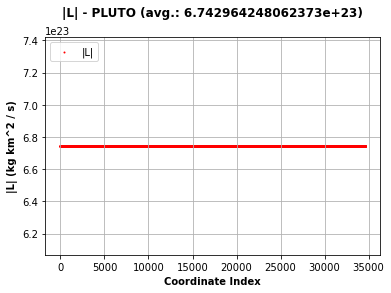

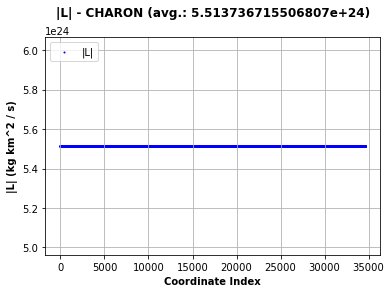

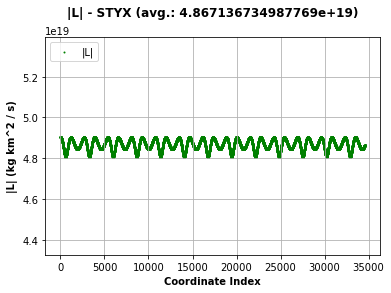

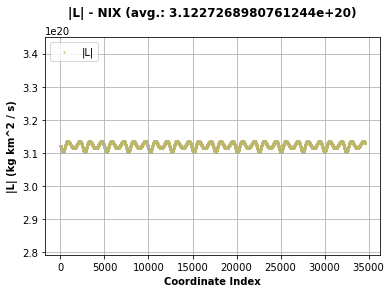

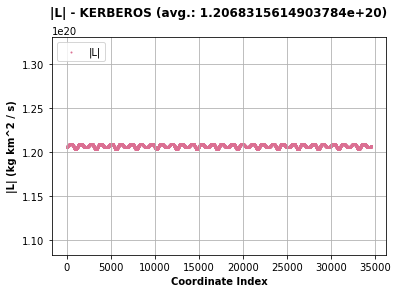

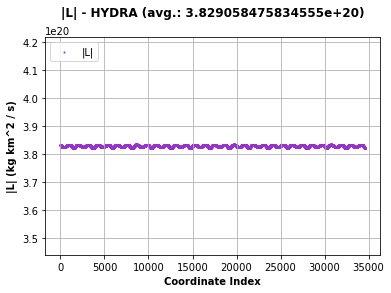

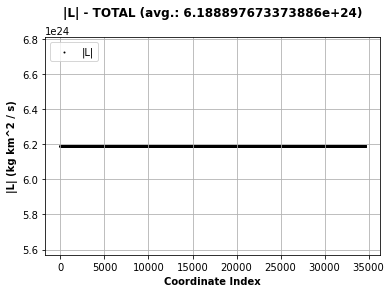

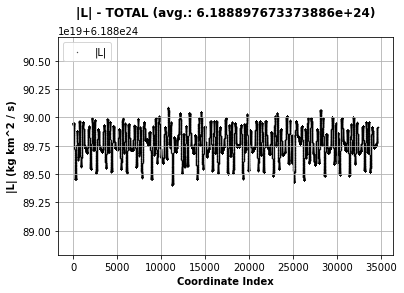

In [16]:
#-------------------------------------------------------------------------------------------------------------------------------
#PLOTS:

#Ploting to analyze if the angular momentu is conserved.
plot_L("PLUTO",    pl_L, col_pl, aver_L_pl)
plot_L("CHARON",   ch_L, col_ch, aver_L_ch)
plot_L("STYX",     st_L, col_st, aver_L_st)
plot_L("NIX",      ni_L, col_ni, aver_L_ni)
plot_L("KERBEROS", ke_L, col_ke, aver_L_ke)
plot_L("HYDRA",    hy_L, col_hy, aver_L_hy)
plot_L("TOTAL",    L_t, "black", aver_L_t)

#Plotting a zoom to the total angular momentum to appreciate variation.
fig = plt.figure()
plt.scatter(range(len(L_t)), L_t, c="black", s=0.1, label="|L|")
plt.title("|L| - TOTAL (avg.: " + str(aver_L_t) + ")\n", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("|L| (kg km^2 / s)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
plt.ylim([min(L_t) - (min(L_t)/1000000), max(L_t) + (max(L_t)/1000000)])  # Scaling for a zoom to appreciate variation.
plt.show()                                                                


## Model 1: Kepler´s Problem

##### For this model we considered the fact that the angular momentum and the energy (calculated for a Kepler´s problem) stay relatively constant. Since the Kepler´s problem solution is an ellipse whose parameters depend on these two values, we could model the PLS as if it was a superposition of 5 Kepler´s problems with these parameters.

### Kepler´s Problem - Energy Conservation

##### We calculate the kinetic, potential and total energies of each body as if it was a Kepler´s problem. This means each calculation considers Pluto to be fixed at the mass center and that each moon feels only its interaction.

In [17]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to calculate the energy.
def energy_kepler(r, v, m, title):
    # Declaring the arrays for the kinetic, potential and complete energies.
    T, U, E = np.empty((len(v[:,3])), float), np.empty((len(v[:,3])), float), np.empty((len(v[:,3])), float)

    lim = tqdm(range(len(v[:,3])), desc="Energy ("+title+"): ")
    for i in lim:        # The loop calculates the energies for each point from the data.
        T[i] = 0.5*m*(v[i,3]**2)         # Kinetic
        U[i] = (-G*m*pl_m) / (r[i,3])    # Potential (According to a Kepler´s problem)
        E[i] = T[i] + U[i]               # Complete
        
    return T, U, E

#-------------------------------------------------------------------------------------------------------------------------------
#Function to plot the energies for each body.
def plot_E(title, T, U, E, color):
    fig = plt.figure()
    ax1 = fig.add_subplot(111)  
    ax1.scatter(range(len(T)), T, c="salmon", s=10, label="|T|")
    ax1.scatter(range(len(U)), U, c="darkcyan", s=10, label="|U|")
    ax1.scatter(range(len(E)), E, c=color, s=1, label="|E|")
    plt.title("E,T and U - " + title, fontweight="bold", fontsize=12)
    plt.xlabel("Coordinate Index", fontweight="bold")
    plt.ylabel("E,T,U (kg km^2 / s^2)", fontweight="bold")
    plt.legend(loc='upper left')
    plt.grid()
    lim_inf = min(np.array([min(E), min(T), min(U)]))
    lim_sup = max(np.array([max(E), max(T), max(U)]))
    extra = max(np.array([abs(lim_inf), abs(lim_sup)]))
    plt.ylim([lim_inf - extra/10, lim_sup + extra/10])
    plt.show()


In [19]:
#-------------------------------------------------------------------------------------------------------------------------------
#Universal Gravitational Constant
G = 6.674e-20  #(km^3 / kg s^2)    # This is one of the few places through out the code that we use the
                                   # constant in units of seconds instead of days.

#-------------------------------------------------------------------------------------------------------------------------------
#Calculating the energies for each body.
ch_T, ch_U, ch_E = energy_kepler(ch_r, ch_v, ch_m, "Ch")
st_T, st_U, st_E = energy_kepler(st_r, st_v, st_m, "St")
ni_T, ni_U, ni_E = energy_kepler(ni_r, ni_v, ni_m, "Ni")
ke_T, ke_U, ke_E = energy_kepler(ke_r, ke_v, ke_m, "Ke")
hy_T, hy_U, hy_E = energy_kepler(hy_r, hy_v, hy_m, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#System´s total energy.
T_t, U_t, E_t = np.empty((len(ch_T)), float), np.empty((len(ch_U)), float), np.empty((len(ch_E)), float)
lim = tqdm(range(len(ch_E)), desc="Energies (Tot.): ")
for i in lim:
    T_t[i] = ch_T[i] + st_T[i] + ni_T[i] + ke_T[i] + hy_T[i]
    U_t[i] = ch_U[i] + st_U[i] + ni_U[i] + ke_U[i] + hy_U[i]
    E_t[i] = ch_E[i] + st_E[i] + ni_E[i] + ke_E[i] + hy_E[i]


Energy (Ch):   0%|          | 0/34561 [00:00<?, ?it/s]

Energy (St):   0%|          | 0/34561 [00:00<?, ?it/s]

Energy (Ni):   0%|          | 0/34561 [00:00<?, ?it/s]

Energy (Ke):   0%|          | 0/34561 [00:00<?, ?it/s]

Energy (Hy):   0%|          | 0/34561 [00:00<?, ?it/s]

Energies (Tot.):   0%|          | 0/34561 [00:00<?, ?it/s]

ENERGY AVERAGES:
Ch:      T =3.138847050582029e+19    U = -7.900417790891604e+19    E = -4.761570740309561e+19
St:      T =87787883204430.61    U = -153750823486180.44    E = -65962940281749.055
Ni:      T =456891388835451.06    U = -803565207971741.8    E = -346673819136288.44
Ke:      T =136470652603108.62    U = -240931459470461.6    E = -104460806867351.16
Hy:      T =364429846692049.6    U = -644784702560980.5    E = -280354855868925.03
Total:   T =3.138951608559161e+19    U = -7.900602094110843e+19    E = -4.761650485551759e+19


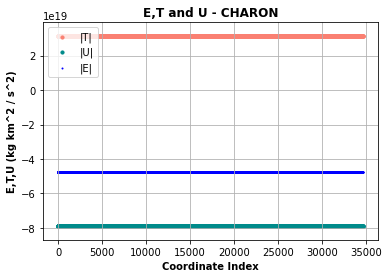

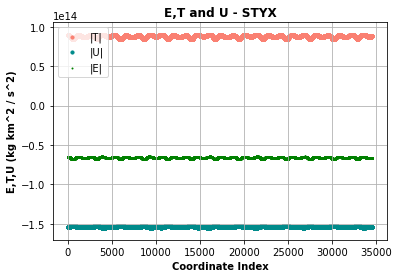

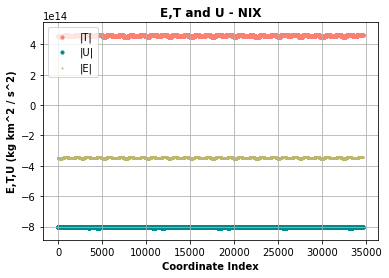

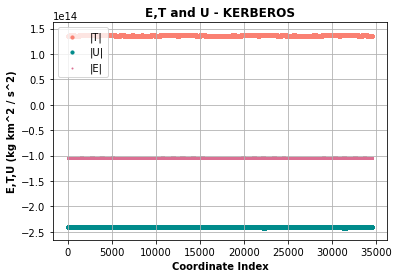

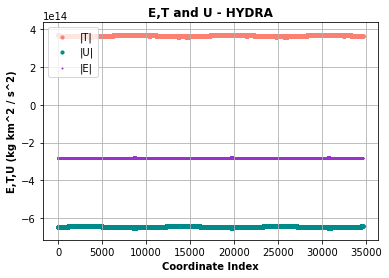

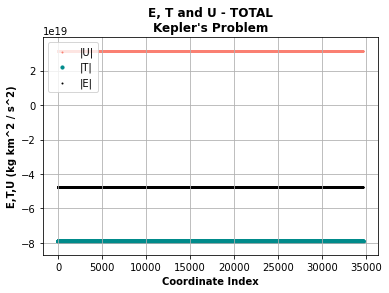

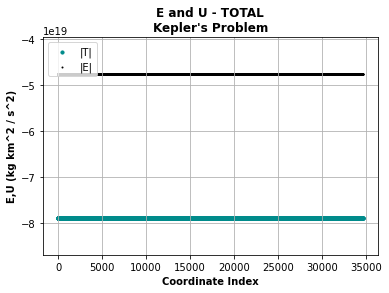

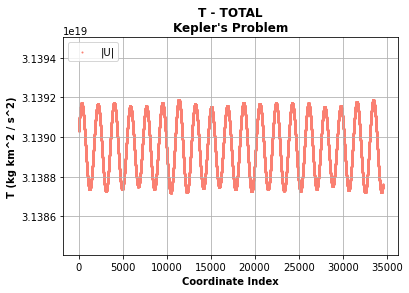

In [22]:
#-------------------------------------------------------------------------------------------------------------------------------
#Printing the energy averages for each body.
print("ENERGY AVERAGES:")
print("Ch:      T =" + str(avg(ch_T)) + "    U = " + str(avg(ch_U)) + "    E = " +  str(avg(ch_E)))
print("St:      T =" + str(avg(st_T)) + "    U = " + str(avg(st_U)) + "    E = " +  str(avg(st_E)))
print("Ni:      T =" + str(avg(ni_T)) + "    U = " + str(avg(ni_U)) + "    E = " +  str(avg(ni_E)))
print("Ke:      T =" + str(avg(ke_T)) + "    U = " + str(avg(ke_U)) + "    E = " +  str(avg(ke_E)))
print("Hy:      T =" + str(avg(hy_T)) + "    U = " + str(avg(hy_U)) + "    E = " +  str(avg(hy_E)))
print("Total:   T =" + str(avg(T_t))  + "    U = " + str(avg(U_t))  + "    E = " +  str(avg(E_t)))

#-------------------------------------------------------------------------------------------------------------------------------
#PLOTS:

#Plotting the energies.
plot_E("CHARON",   ch_T, ch_U, ch_E, col_ch)
plot_E("STYX",     st_T, st_U, st_E, col_st)
plot_E("NIX",      ni_T, ni_U, ni_E, col_ni)
plot_E("KERBEROS", ke_T, ke_U, ke_E, col_ke)
plot_E("HYDRA",    hy_T, hy_U, hy_E, col_hy)

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the PLS's total energy.
fig = plt.figure()
ax1 = fig.add_subplot(111)
ax1.scatter(range(len(T_t)), T_t, c="salmon", s=1, label="|U|")
ax1.scatter(range(len(U_t)), U_t, c="darkcyan", s=10, label="|T|")
ax1.scatter(range(len(E_t)), E_t, c="black", s=1, label="|E|")
plt.title("E, T and U - TOTAL\nKepler's Problem", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("E,T,U (kg km^2 / s^2)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
lim_inf = min(np.array([min(E_t), min(U_t), min(T_t)]))
lim_sup = max(np.array([max(E_t), max(U_t), max(T_t)]))
extra = max(np.array([abs(lim_inf), abs(lim_sup)]))
plt.ylim([lim_inf - extra/10, lim_sup + extra/10])
plt.show()

#Zoom to the potential and complete energy of the system.
fig = plt.figure()
ax1 = fig.add_subplot(111)  
ax1.scatter(range(len(U_t)), U_t, c="darkcyan", s=10, label="|T|")
ax1.scatter(range(len(E_t)), E_t, c="black", s=1, label="|E|")
plt.title("E and U - TOTAL\nKepler's Problem", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("E,U (kg km^2 / s^2)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
lim_inf = min(np.array([min(E_t), min(U_t)]))
lim_sup = max(np.array([max(E_t), max(U_t)]))
extra = max(np.array([abs(lim_inf), abs(lim_sup)]))
plt.ylim([lim_inf - extra/10, lim_sup + extra/10])
plt.show()

#Zoom to the kinetic energy of the system.
fig = plt.figure()
ax1 = fig.add_subplot(111)
ax1.scatter(range(len(T_t)), T_t, c="salmon", s=1, label="|U|")
plt.title("T - TOTAL\nKepler's Problem", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("T (kg km^2 / s^2)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
plt.ylim([min(T_t) - abs(min(T_t)/10000), max(T_t) + abs(max(T_t)/10000)])
plt.show()


### Generating Data and Parameters - Kepler´s Problem

##### As we explained earlier, we consider a Kepler´s problem (KP), assuming that Pluto is fixed in the MC of a 2-body system (Pluto and one moon). We compare the resulting ellipses with the trajectories obtained from analyzing the data from JPL/NASA.

##### NOTE: Using this model, we do not include Pluto, for it is supposed to be fixed at the origin (barycenter).

In [17]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to calculate each PK's parameter.
def param_kepler(E, L, m):
    e = math.sqrt(abs(1 + ((2*avg(E)*(avg(L)**2)) / (((G*pl_m*m)**2)*m))))   # Eccentricity defined as KP.
    d = abs((avg(L)**2) / (G*pl_m*(m**2)))                                   # p * e (p is the distance to the directrix).
    a = abs(d/(1 - (e**2)))                     # Calculating the semi-major axis.
    c = a*e
    b = math.sqrt(a**2 - c**2)

    r = d/((e*np.cos(theta)) + 1)          # Generating radii all along the 2pi radians.
            
    return a, b, c, e, d, r

#-------------------------------------------------------------------------------------------------------------------------------
#Function to obtain the "d" parameter for the ellipses from the JPL/NASA data.
def param_ori_d(a, e):
    d = a * (1 - e**2)        # p * e (p is the distance to the directrix).
    return d

#-------------------------------------------------------------------------------------------------------------------------------
#Function to print the parameters for a body (KP and JPL/NASA)
def print_param_kepler(title, a, b, c, e, d, ell_a, ell_b, ell_c, ell_e, ell_d):
    print(title + ":")
    print("KP:       a = " + str(a)     + "   b = " + str(b)     + "   c = " + str(c)     + "   d = " + str(d) + "   e = "     + str(e))
    print("JPL/NASA: a = " + str(ell_a) + "   b = " + str(ell_b) + "   d = " + str(ell_c) + "   d = " + str(ell_d) + "   e = " + str(ell_e))
    print("")

#-------------------------------------------------------------------------------------------------------------------------------
#Function to plot the individual trajectories for each body to compare them.
def plot_kp_jpl(title, th_k, r_k, r_o, col):
    fig = plt.figure()
    ax = plt.axes(polar = True)
    fig.set_size_inches(8, 8)
    ax.set_title(title + "'s Trajectory", va='bottom', fontweight="bold", fontsize=16)
    if col == col_pl:
        plt.scatter(0, 0, color=col_pl, s=15, label="KP")
    else:
        plt.polar(th_k, r_k, color=col, lw=2, label="KP")
    plt.polar(r_o[:,4], r_o[:,3], color=col, lw=2, label="JPL/NASA", linestyle='dashed')
    ax.legend(loc='lower right')
    ax.set_rlabel_position(40)
    label_position=ax.get_rlabel_position()
    ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radio (km)', rotation=label_position,ha='center',va='center')
    plt.show()


In [18]:
#-------------------------------------------------------------------------------------------------------------------------------
#Generating angles along the 2pi radians.
theta = np.linspace(0, 2*np.pi, 10000)

#Obtaining the KP parameters for each moon.
ch_a_k, ch_b_k, ch_c_k, ch_e_k, ch_d_k, ch_r_k = param_kepler(ch_E, ch_L, ch_m)
st_a_k, st_b_k, st_c_k, st_e_k, st_d_k, st_r_k = param_kepler(st_E, st_L, st_m)
ni_a_k, ni_b_k, ni_c_k, ni_e_k, ni_d_k, ni_r_k = param_kepler(ni_E, ni_L, ni_m)
ke_a_k, ke_b_k, ke_c_k, ke_e_k, ke_d_k, ke_r_k = param_kepler(ke_E, ke_L, ke_m)
hy_a_k, hy_b_k, hy_c_k, hy_e_k, hy_d_k, hy_r_k = param_kepler(hy_E, hy_L, hy_m)

#Obtaining the "d" parameter for the JPL/NASA trajectories.
ell_pl_d = param_ori_d(ell_pl_a, ell_pl_e)
ell_ch_d = param_ori_d(ell_ch_a, ell_ch_e)
ell_st_d = param_ori_d(ell_st_a, ell_st_e)
ell_ni_d = param_ori_d(ell_ni_a, ell_ni_e)
ell_ke_d = param_ori_d(ell_ke_a, ell_ke_e)
ell_hy_d = param_ori_d(ell_hy_a, ell_hy_e)


ELLIPTIC TRAJECTORIES' PARAMETERS:
Pluto:
KP:       a = n/a   b = n/a   c = n/a   d = n/a   e = n/a
JPL/NASA: a = 2131.9525780276717   b = 2131.9404376378916   d = 7.194812241535554   d = 2131.928297317245   e = 0.0033747524760581117

Charon:
KP:       a = 14491.966061920533   b = 14182.97844313014   c = 2976.609282650696   d = 13880.57884339512   e = 0.2053972021416826
JPL/NASA: a = 17468.581965799047   b = 17468.569148617305   d = 21.161186529791404   d = 17468.55633144497   e = 0.0012113854788459602

Styx:
KP:       a = 49438.11231080449   b = 48930.30408508912   c = 7067.693470746286   d = 48427.71185937963   e = 0.1429604234545515
JPL/NASA: a = 42525.54676510166   b = 42227.76810928481   d = 5023.716570360756   d = 41932.074603092246   e = 0.11813408533252373

Nix:
KP:       a = 56440.66099005818   b = 55905.202763322755   c = 7756.063240229893   d = 55374.824482632415   e = 0.1374197804238348
JPL/NASA: a = 48709.67732808009   b = 48690.25614757749   d = 1375.362384599781   d = 48

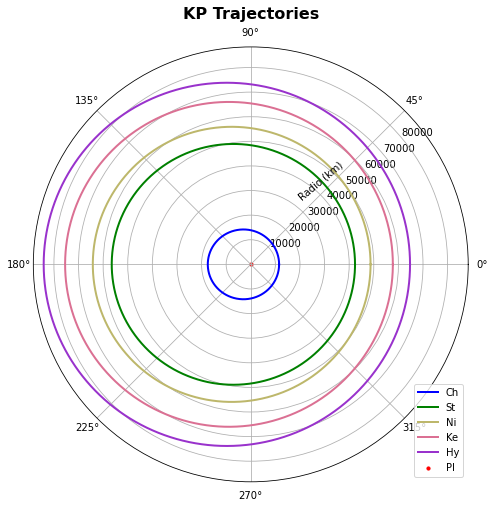

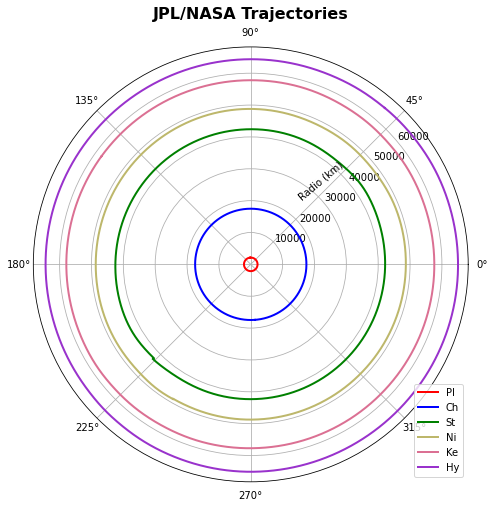

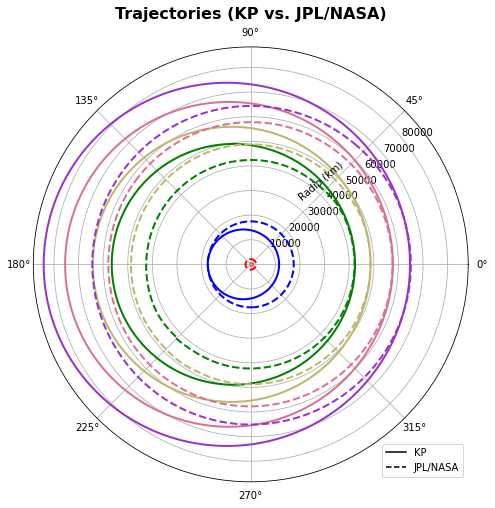

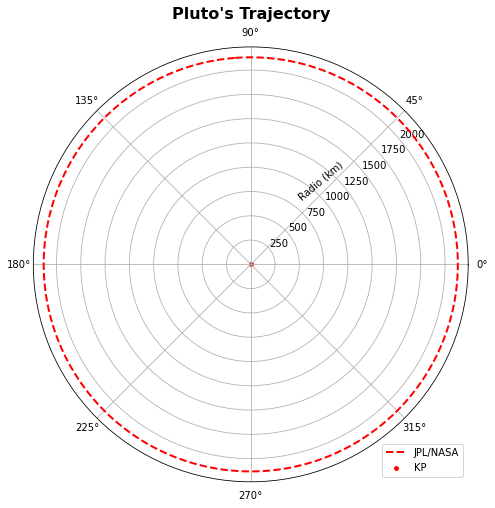

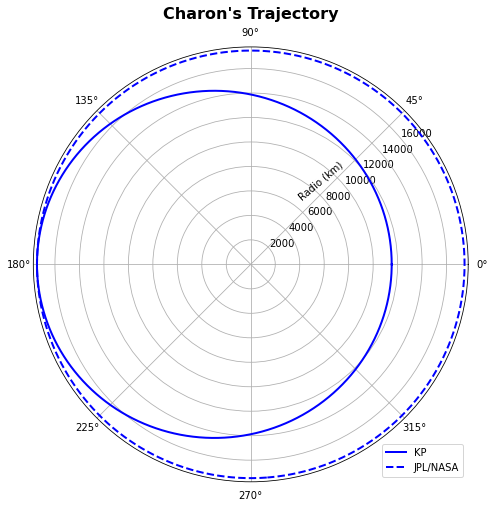

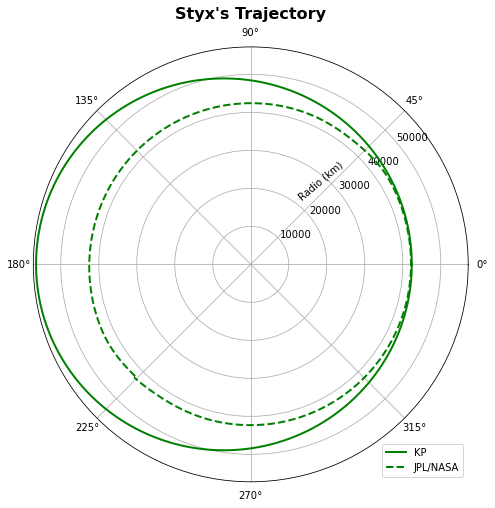

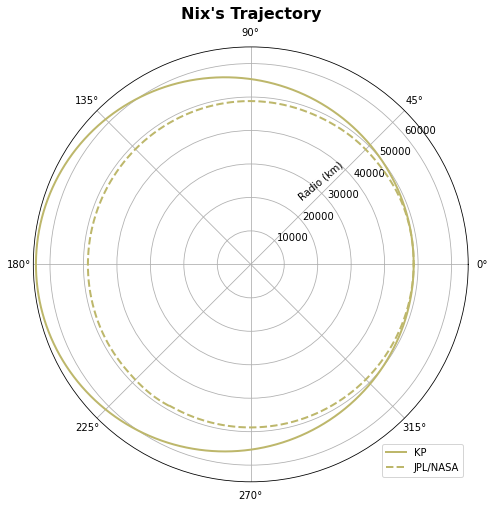

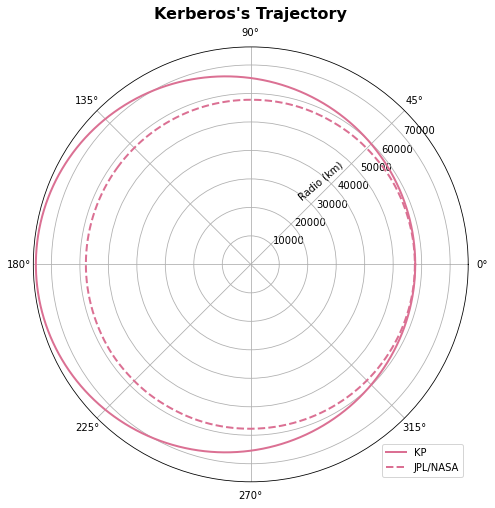

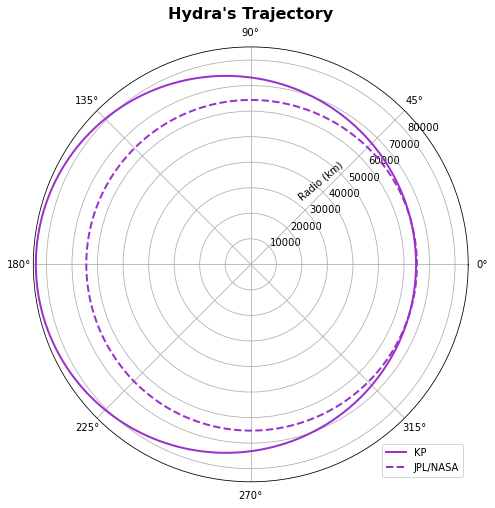

In [28]:
#-------------------------------------------------------------------------------------------------------------------------------
#Printing the KP parameters for each moon.
print("ELLIPTIC TRAJECTORIES' PARAMETERS:")
print_param_kepler("Pluto",    "n/a", "n/a", "n/a", "n/a", "n/a", ell_pl_a, ell_pl_b, ell_pl_c, ell_pl_e, ell_pl_d)
print_param_kepler("Charon",   ch_a_k, ch_b_k, ch_c_k, ch_e_k, ch_d_k, ell_ch_a, ell_ch_b, ell_ch_c, ell_ch_e, ell_ch_d)
print_param_kepler("Styx",     st_a_k, st_b_k, st_c_k, st_e_k, st_d_k, ell_st_a, ell_st_b, ell_st_c, ell_st_e, ell_st_d)
print_param_kepler("Nix",      ni_a_k, ni_b_k, ni_c_k, ni_e_k, ni_d_k, ell_ni_a, ell_ni_b, ell_ni_c, ell_ni_e, ell_ni_d)
print_param_kepler("Kerberos", ke_a_k, ke_b_k, ke_c_k, ke_e_k, ke_d_k, ell_ke_a, ell_ke_b, ell_ke_c, ell_ke_e, ell_ke_d)
print_param_kepler("Hydra",    hy_a_k, hy_b_k, hy_c_k, hy_e_k, hy_d_k, ell_hy_a, ell_hy_b, ell_hy_c, ell_hy_e, ell_hy_d)
                            
#-----------------------------------------------------------------------------------------------------------------
#Plotting the ellipses of the KP model.
fig = plt.figure()
ax = plt.subplot(111, polar=True)
fig.set_size_inches(8, 8)
ax.set_title("KP Trajectories", va='bottom', fontweight="bold", fontsize=16)
plt.scatter(0, 0, color=col_pl, s=10, label="Pl")
plt.polar(theta, ch_r_k, color=col_ch, lw=2, label="Ch")
plt.polar(theta, st_r_k, color=col_st, lw=2, label="St")
plt.polar(theta, ni_r_k, color=col_ni, lw=2, label="Ni")
plt.polar(theta, ke_r_k, color=col_ke, lw=2, label="Ke")
plt.polar(theta, hy_r_k, color=col_hy, lw=2, label="Hy")
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radio (km)', rotation=label_position,ha='center',va='center')
plt.show()

#Plotting the fitted ellipses from the JPL/NASA data.
fig = plt.figure()
ax = plt.axes(polar = True)
fig.set_size_inches(8, 8)
ax.set_title("JPL/NASA Trajectories", va='bottom', fontweight="bold", fontsize=16)
plt.polar(p_pl_r[:,4], p_pl_r[:,3], color=col_pl, lw=2, label="Pl")
plt.polar(p_ch_r[:,4], p_ch_r[:,3], color=col_ch, lw=2, label="Ch")
plt.polar(p_st_r[:,4], p_st_r[:,3], color=col_st, lw=2, label="St")
plt.polar(p_ni_r[:,4], p_ni_r[:,3], color=col_ni, lw=2, label="Ni")
plt.polar(p_ke_r[:,4], p_ke_r[:,3], color=col_ke, lw=2, label="Ke")
plt.polar(p_hy_r[:,4], p_hy_r[:,3], color=col_hy, lw=2, label="Hy")
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radio (km)', rotation=label_position,ha='center',va='center')
plt.show()

#Plotting to compare trajectories (KP and JPL/NASA).
fig = plt.figure()
ax = plt.axes(polar = True)
fig.set_size_inches(8, 8)
ax.set_title("Trajectories (KP vs. JPL/NASA)", va='bottom', fontweight="bold", fontsize=16)
plt.plot(0, 0, color="black", label="KP")                            # These plots are
plt.plot(0, 0, color="black", label="JPL/NASA", linestyle="dashed")  # only for the labels.
plt.scatter(0, 0, color=col_pl, s=15)
plt.polar(theta, ch_r_k, color=col_ch, lw=2)
plt.polar(theta, st_r_k, color=col_st, lw=2)
plt.polar(theta, ni_r_k, color=col_ni, lw=2)
plt.polar(theta, ke_r_k, color=col_ke, lw=2)
plt.polar(theta, hy_r_k, color=col_hy, lw=2)
plt.polar(p_pl_r[:,4], p_pl_r[:,3], color=col_pl, lw=2, linestyle='dashed')
plt.polar(p_ch_r[:,4], p_ch_r[:,3], color=col_ch, lw=2, linestyle='dashed')
plt.polar(p_st_r[:,4], p_st_r[:,3], color=col_st, lw=2, linestyle='dashed')
plt.polar(p_ni_r[:,4], p_ni_r[:,3], color=col_ni, lw=2, linestyle='dashed')
plt.polar(p_ke_r[:,4], p_ke_r[:,3], color=col_ke, lw=2, linestyle='dashed')
plt.polar(p_hy_r[:,4], p_hy_r[:,3], color=col_hy, lw=2, linestyle='dashed')
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radio (km)', rotation=label_position,ha='center',va='center')
plt.show()

#Plotting the elliptic trajectories of each body (KP vs. JPL/NASA).
plot_kp_jpl("Pluto",    theta, 0,      p_pl_r, col_pl)
plot_kp_jpl("Charon",   theta, ch_r_k, p_ch_r, col_ch)
plot_kp_jpl("Styx",     theta, st_r_k, p_st_r, col_st)
plot_kp_jpl("Nix",      theta, ni_r_k, p_ni_r, col_ni)
plot_kp_jpl("Kerberos", theta, ke_r_k, p_ke_r, col_ke)
plot_kp_jpl("Hydra",    theta, hy_r_k, p_hy_r, col_hy)


## Model 2: 6-Body Problem

##### In this new model, instead of only considering Pluto, every moon feels the gravitational attraction of all other moons. We solve the 6-equation system numerically using 4th order Runge-Kutta method (non-symplectic).

### Generating the Data - 6-Body Problem

##### We make a function for the acceleration and we use it with the Runge-Kutta method (RK) to obtain the velocities. Then, we use RK again with these velocities to obtain the positions.

In [143]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to obtain the position vector magnitude.
def radii(xs, ys, zs, title):
    rs = np.empty((len(xs)), float)   # Declaring the array to store the radii.
    lim = tqdm(range(len(xs)), desc=title+"'s Radii :")
    for i in lim:
        rs[i] = math.sqrt(xs[i]**2 + ys[i]**2 + zs[i]**2)    # Calculates the magnitude for each point.
    return rs

#-------------------------------------------------------------------------------------------------------------------------------
#Function to get the approximated parameters of the elliptic trajectories.
def param_RK(r):
    a = (max(r) + min(r)) / 2    # Obtaining an approximation of the major axis and dividing it in 2.
    c = max(r) - a               # Substracting "a" from the major radius (approx. of the vertix-focus distance).
    b = math.sqrt(a**2 - c**2)   # Calculating "c" with Pythagoras' theorem.
    e = c / a                    # Calculating the eccentricity.
    return a, b, c, e

#-------------------------------------------------------------------------------------------------------------------------------
#Acceleration equation (6-body problem).
def func_6BP(x1, y1, z1, x2, y2, z2, x3, y3, z3, x4, y4, z4, x5, y5, z5, x6, y6, z6, m2, m3, m4, m5, m6): 
    d12 = mag((x2 - x1), (y2 - y1), (z2 - z1))
    d13 = mag((x3 - x1), (y3 - y1), (z3 - z1))   # Distances between bodies.
    d14 = mag((x4 - x1), (y4 - y1), (z4 - z1))
    d15 = mag((x5 - x1), (y5 - y1), (z5 - z1))
    d16 = mag((x6 - x1), (y6 - y1), (z6 - z1))

    ax = (((G*m2) / (d12**3))*(x2 - x1)) + (((G*m3) / (d13**3))*(x3 - x1)) + (((G*m4) / (d14**3))*(x4 - x1)) + (((G*m5) / (d15**3))*(x5 - x1)) + (((G*m6) / (d16**3))*(x6 - x1))
    ay = (((G*m2) / (d12**3))*(y2 - y1)) + (((G*m3) / (d13**3))*(y3 - y1)) + (((G*m4) / (d14**3))*(y4 - y1)) + (((G*m5) / (d15**3))*(y5 - y1)) + (((G*m6) / (d16**3))*(y6 - y1))
    az = (((G*m2) / (d12**3))*(z2 - z1)) + (((G*m3) / (d13**3))*(z3 - z1)) + (((G*m4) / (d14**3))*(z4 - z1)) + (((G*m5) / (d15**3))*(z5 - z1)) + (((G*m6) / (d16**3))*(z6 - z1))
      
    return ax, ay, az

#-------------------------------------------------------------------------------------------------------------------------------
#Function to obtain the points to plot.
def points_plot(h, T, xs, ys, zs, title):
    k = math.floor(len(xs)/T)         # Amount of data in one of the T partitions.
    r_g = np.empty((T, 3), float)
    lim = tqdm(range(T), desc="Points to Plot ("+title+"): ")
    for i in lim: 
        r_g[i,0], r_g[i,1], r_g[i,2] = xs[i*k], ys[i*k], zs[i*k]      # Storing every 1000 points to plot.
            
    return r_g

#-------------------------------------------------------------------------------------------------------------------------------
#Function to plot each trajectory individually.
def plot_orbit(title, xs, ys, zs, color, lbl):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title(title+"'s Trajectory", fontweight="bold", fontsize=14)
    ax.scatter(0, 0, 0, marker="x", c="black");
    ax.scatter(xs, ys, zs, marker="x", c=color, s=1, label=lbl);
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    fig.set_size_inches(8, 8)
    plt.show()


In [21]:
#-------------------------------------------------------------------------------------------------------------------------------
#Universal Gravitational Constant (days).
G = 4.982174e-10  #(km^3 / kg d^2) 

#-------------------------------------------------------------------------------------------------------------------------------
#Setting the step "h".

N = 1000000      # No. of iterations.
a = 0            # Initial time = 0.
b = 40           # No. of days.

h_RK = (b-a)/N   # Step "h".

t_RK = np.empty((N+1), float)    #Array to store time values.
t_RK[0] = a

#-------------------------------------------------------------------------------------------------------------------------------
#Declaring position and velocity arrays en each axis.

pl_x_RK, pl_y_RK, pl_z_RK = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ch_x_RK, ch_y_RK, ch_z_RK = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
st_x_RK, st_y_RK, st_z_RK = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ni_x_RK, ni_y_RK, ni_z_RK = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ke_x_RK, ke_y_RK, ke_z_RK = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
hy_x_RK, hy_y_RK, hy_z_RK = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)

pl_vx_RK, pl_vy_RK, pl_vz_RK = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ch_vx_RK, ch_vy_RK, ch_vz_RK = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
st_vx_RK, st_vy_RK, st_vz_RK = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ni_vx_RK, ni_vy_RK, ni_vz_RK = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ke_vx_RK, ke_vy_RK, ke_vz_RK = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
hy_vx_RK, hy_vy_RK, hy_vz_RK = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)

#-------------------------------------------------------------------------------------------------------------------------------
#Initial Conditions (00:00:00 1/Ene/2021).

#We use the initial coordinates.
pl_x_RK[0], pl_y_RK[0], pl_z_RK[0] = pl_r[0,0], pl_r[0,1], pl_r[0,2]
ch_x_RK[0], ch_y_RK[0], ch_z_RK[0] = ch_r[0,0], ch_r[0,1], ch_r[0,2]
st_x_RK[0], st_y_RK[0], st_z_RK[0] = st_r[0,0], st_r[0,1], st_r[0,2]
ni_x_RK[0], ni_y_RK[0], ni_z_RK[0] = ni_r[0,0], ni_r[0,1], ni_r[0,2]
ke_x_RK[0], ke_y_RK[0], ke_z_RK[0] = ke_r[0,0], ke_r[0,1], ke_r[0,2]
hy_x_RK[0], hy_y_RK[0], hy_z_RK[0] = hy_r[0,0], hy_r[0,1], hy_r[0,2]

#We use the initial velocities.
n = 86400   # Converting from sec. to days.

pl_vx_RK[0], pl_vy_RK[0], pl_vz_RK[0] = n*pl_v[0,0], n*pl_v[0,1], n*pl_v[0,2]
ch_vx_RK[0], ch_vy_RK[0], ch_vz_RK[0] = n*ch_v[0,0], n*ch_v[0,1], n*ch_v[0,2]
st_vx_RK[0], st_vy_RK[0], st_vz_RK[0] = n*st_v[0,0], n*st_v[0,1], n*st_v[0,2]
ni_vx_RK[0], ni_vy_RK[0], ni_vz_RK[0] = n*ni_v[0,0], n*ni_v[0,1], n*ni_v[0,2]
ke_vx_RK[0], ke_vy_RK[0], ke_vz_RK[0] = n*ke_v[0,0], n*ke_v[0,1], n*ke_v[0,2]
hy_vx_RK[0], hy_vy_RK[0], hy_vz_RK[0] = n*hy_v[0,0], n*hy_v[0,1], n*hy_v[0,2]

#-------------------------------------------------------------------------------------------------------------------------------
#Loop to calculate the PLS trajectories (4th order Runge-Kutta).
lim = tqdm(range(int(N)), desc="RK Loop: ")
for i in lim:
    
    #Pluto
    
    # Generating the "k" constants of the RK methods to get the velocity.
    k1x, k1y, k1z = func_6BP(pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], ch_m, st_m, ni_m, ke_m, hy_m)
    k1x, k1y, k1z = h_RK*k1x, h_RK*k1y, h_RK*k1z
    k2x, k2y, k2z = func_6BP(pl_x_RK[i] + k1x/2, pl_y_RK[i] + k1y/2, pl_z_RK[i] + k1z/2, ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], ch_m, st_m, ni_m, ke_m, hy_m)
    k2x, k2y, k2z = h_RK*k2x, h_RK*k2y, h_RK*k2z
    k3x, k3y, k3z = func_6BP(pl_x_RK[i] + k2x/2, pl_y_RK[i] + k2y/2, pl_z_RK[i] + k2z/2, ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], ch_m, st_m, ni_m, ke_m, hy_m)
    k3x, k3y, k3z = h_RK*k3x, h_RK*k3y, h_RK*k3z
    k4x, k4y, k4z = func_6BP(pl_x_RK[i] + k3x, pl_y_RK[i] + k3y, pl_z_RK[i] + k3z, ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], ch_m, st_m, ni_m, ke_m, hy_m)
    k4x, k4y, k4z = h_RK*k4x, h_RK*k4y, h_RK*k4z
    
    # Generating the next value for the velocity in each axis.
    pl_vx_RK[i+1] = pl_vx_RK[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    pl_vy_RK[i+1] = pl_vy_RK[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    pl_vz_RK[i+1] = pl_vz_RK[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    # Generating the "k" constants to get the position.
    k1x, k1y, k1z = h_RK*pl_vx_RK[i], h_RK*pl_vy_RK[i], h_RK*pl_vz_RK[i]
    k2x, k2y, k2z = h_RK*(pl_vx_RK[i] + k1x/2), h_RK*(pl_vy_RK[i] + k1y/2), h_RK*(pl_vz_RK[i] + k1z/2)
    k3x, k3y, k3z = h_RK*(pl_vx_RK[i] + k2x/2), h_RK*(pl_vy_RK[i] + k2y/2), h_RK*(pl_vz_RK[i] + k2z/2)
    k4x, k4y, k4z = h_RK*(pl_vx_RK[i] + k3x), h_RK*(pl_vy_RK[i] + k3y), h_RK*(pl_vz_RK[i] + k3z)

    # Generating the next value for the position in each axis.
    pl_x_RK[i+1] = pl_x_RK[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    pl_y_RK[i+1] = pl_y_RK[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    pl_z_RK[i+1] = pl_z_RK[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
    #Charon
    k1x, k1y, k1z = func_6BP(ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, st_m, ni_m, ke_m, hy_m)
    k1x, k1y, k1z = h_RK*k1x, h_RK*k1y, h_RK*k1z
    k2x, k2y, k2z = func_6BP(ch_x_RK[i] + k1x/2, ch_y_RK[i] + k1y/2, ch_z_RK[i] + k1z/2, pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, st_m, ni_m, ke_m, hy_m)
    k2x, k2y, k2z = h_RK*k2x, h_RK*k2y, h_RK*k2z
    k3x, k3y, k3z = func_6BP(ch_x_RK[i] + k2x/2, ch_y_RK[i] + k2y/2, ch_z_RK[i] + k2z/2, pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, st_m, ni_m, ke_m, hy_m)
    k3x, k3y, k3z = h_RK*k3x, h_RK*k3y, h_RK*k3z
    k4x, k4y, k4z = func_6BP(ch_x_RK[i] + k3x, ch_y_RK[i] + k3y, ch_z_RK[i] + k3z, pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, st_m, ni_m, ke_m, hy_m)
    k4x, k4y, k4z = h_RK*k4x, h_RK*k4y, h_RK*k4z
    
    ch_vx_RK[i+1] = ch_vx_RK[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ch_vy_RK[i+1] = ch_vy_RK[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ch_vz_RK[i+1] = ch_vz_RK[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK*ch_vx_RK[i], h_RK*ch_vy_RK[i], h_RK*ch_vz_RK[i]
    k2x, k2y, k2z = h_RK*(ch_vx_RK[i] + k1x/2), h_RK*(ch_vy_RK[i] + k1y/2), h_RK*(ch_vz_RK[i] + k1z/2)
    k3x, k3y, k3z = h_RK*(ch_vx_RK[i] + k2x/2), h_RK*(ch_vy_RK[i] + k2y/2), h_RK*(ch_vz_RK[i] + k2z/2)
    k4x, k4y, k4z = h_RK*(ch_vx_RK[i] + k3x), h_RK*(ch_vy_RK[i] + k3y), h_RK*(ch_vz_RK[i] + k3z)

    ch_x_RK[i+1] = ch_x_RK[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ch_y_RK[i+1] = ch_y_RK[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ch_z_RK[i+1] = ch_z_RK[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
    #Styx
    k1x, k1y, k1z = func_6BP(st_x_RK[i], st_y_RK[i], st_z_RK[i], pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, ch_m, ni_m, ke_m, hy_m)
    k1x, k1y, k1z = h_RK*k1x, h_RK*k1y, h_RK*k1z
    k2x, k2y, k2z = func_6BP(st_x_RK[i] + k1x/2, st_y_RK[i] + k1y/2, st_z_RK[i] + k1z/2, pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, ch_m, ni_m, ke_m, hy_m)
    k2x, k2y, k2z = h_RK*k2x, h_RK*k2y, h_RK*k2z
    k3x, k3y, k3z = func_6BP(st_x_RK[i] + k2x/2, st_y_RK[i] + k2y/2, st_z_RK[i] + k2z/2, pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, ch_m, ni_m, ke_m, hy_m)
    k3x, k3y, k3z = h_RK*k3x, h_RK*k3y, h_RK*k3z
    k4x, k4y, k4z = func_6BP(st_x_RK[i] + k3x, st_y_RK[i] + k3y, st_z_RK[i] + k3z, pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, ch_m, ni_m, ke_m, hy_m)
    k4x, k4y, k4z = h_RK*k4x, h_RK*k4y, h_RK*k4z
    
    st_vx_RK[i+1] = st_vx_RK[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    st_vy_RK[i+1] = st_vy_RK[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    st_vz_RK[i+1] = st_vz_RK[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK*st_vx_RK[i], h_RK*st_vy_RK[i], h_RK*st_vz_RK[i]
    k2x, k2y, k2z = h_RK*(st_vx_RK[i] + k1x/2), h_RK*(st_vy_RK[i] + k1y/2), h_RK*(st_vz_RK[i] + k1z/2)
    k3x, k3y, k3z = h_RK*(st_vx_RK[i] + k2x/2), h_RK*(st_vy_RK[i] + k2y/2), h_RK*(st_vz_RK[i] + k2z/2)
    k4x, k4y, k4z = h_RK*(st_vx_RK[i] + k3x), h_RK*(st_vy_RK[i] + k3y), h_RK*(st_vz_RK[i] + k3z)

    st_x_RK[i+1] = st_x_RK[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    st_y_RK[i+1] = st_y_RK[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    st_z_RK[i+1] = st_z_RK[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
    #Nix
    k1x, k1y, k1z = func_6BP(ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, ch_m, st_m, ke_m, hy_m)
    k1x, k1y, k1z = h_RK*k1x, h_RK*k1y, h_RK*k1z
    k2x, k2y, k2z = func_6BP(ni_x_RK[i] + k1x/2, ni_y_RK[i] + k1y/2, ni_z_RK[i] + k1z/2, pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, ch_m, st_m, ke_m, hy_m)
    k2x, k2y, k2z = h_RK*k2x, h_RK*k2y, h_RK*k2z
    k3x, k3y, k3z = func_6BP(ni_x_RK[i] + k2x/2, ni_y_RK[i] + k2y/2, ni_z_RK[i] + k2z/2, pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, ch_m, st_m, ke_m, hy_m)
    k3x, k3y, k3z = h_RK*k3x, h_RK*k3y, h_RK*k3z
    k4x, k4y, k4z = func_6BP(ni_x_RK[i] + k3x, ni_y_RK[i] + k3y, ni_z_RK[i] + k3z, pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, ch_m, st_m, ke_m, hy_m)
    k4x, k4y, k4z = h_RK*k4x, h_RK*k4y, h_RK*k4z
    
    ni_vx_RK[i+1] = ni_vx_RK[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ni_vy_RK[i+1] = ni_vy_RK[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ni_vz_RK[i+1] = ni_vz_RK[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK*ni_vx_RK[i], h_RK*ni_vy_RK[i], h_RK*ni_vz_RK[i]
    k2x, k2y, k2z = h_RK*(ni_vx_RK[i] + k1x/2), h_RK*(ni_vy_RK[i] + k1y/2), h_RK*(ni_vz_RK[i] + k1z/2)
    k3x, k3y, k3z = h_RK*(ni_vx_RK[i] + k2x/2), h_RK*(ni_vy_RK[i] + k2y/2), h_RK*(ni_vz_RK[i] + k2z/2)
    k4x, k4y, k4z = h_RK*(ni_vx_RK[i] + k3x), h_RK*(ni_vy_RK[i] + k3y), h_RK*(ni_vz_RK[i] + k3z)

    ni_x_RK[i+1] = ni_x_RK[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ni_y_RK[i+1] = ni_y_RK[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ni_z_RK[i+1] = ni_z_RK[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
    #Kerberos
    k1x, k1y, k1z = func_6BP(ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, ch_m, st_m, ni_m, hy_m)
    k1x, k1y, k1z = h_RK*k1x, h_RK*k1y, h_RK*k1z
    k2x, k2y, k2z = func_6BP(ke_x_RK[i] + k1x/2, ke_y_RK[i] + k1y/2, ke_z_RK[i] + k1z/2, pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, ch_m, st_m, ni_m, hy_m)
    k2x, k2y, k2z = h_RK*k2x, h_RK*k2y, h_RK*k2z
    k3x, k3y, k3z = func_6BP(ke_x_RK[i] + k2x/2, ke_y_RK[i] + k2y/2, ke_z_RK[i] + k2z/2, pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, ch_m, st_m, ni_m, hy_m)
    k3x, k3y, k3z = h_RK*k3x, h_RK*k3y, h_RK*k3z
    k4x, k4y, k4z = func_6BP(ke_x_RK[i] + k3x, ke_y_RK[i] + k3y, ke_z_RK[i] + k3z, pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_m, ch_m, st_m, ni_m, hy_m)
    k4x, k4y, k4z = h_RK*k4x, h_RK*k4y, h_RK*k4z
    
    ke_vx_RK[i+1] = ke_vx_RK[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ke_vy_RK[i+1] = ke_vy_RK[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ke_vz_RK[i+1] = ke_vz_RK[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK*ke_vx_RK[i], h_RK*ke_vy_RK[i], h_RK*ke_vz_RK[i]
    k2x, k2y, k2z = h_RK*(ke_vx_RK[i] + k1x/2), h_RK*(ke_vy_RK[i] + k1y/2), h_RK*(ke_vz_RK[i] + k1z/2)
    k3x, k3y, k3z = h_RK*(ke_vx_RK[i] + k2x/2), h_RK*(ke_vy_RK[i] + k2y/2), h_RK*(ke_vz_RK[i] + k2z/2)
    k4x, k4y, k4z = h_RK*(ke_vx_RK[i] + k3x), h_RK*(ke_vy_RK[i] + k3y), h_RK*(ke_vz_RK[i] + k3z)

    ke_x_RK[i+1] = ke_x_RK[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ke_y_RK[i+1] = ke_y_RK[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ke_z_RK[i+1] = ke_z_RK[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
    #Hydra
    k1x, k1y, k1z = func_6BP(hy_x_RK[i], hy_y_RK[i], hy_z_RK[i], pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], pl_m, ch_m, st_m, ni_m, ke_m)
    k1x, k1y, k1z = h_RK*k1x, h_RK*k1y, h_RK*k1z
    k2x, k2y, k2z = func_6BP(hy_x_RK[i] + k1x/2, hy_y_RK[i] + k1y/2, hy_z_RK[i] + k1z/2, pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], pl_m, ch_m, st_m, ni_m, ke_m)
    k2x, k2y, k2z = h_RK*k2x, h_RK*k2y, h_RK*k2z
    k3x, k3y, k3z = func_6BP(hy_x_RK[i] + k2x/2, hy_y_RK[i] + k2y/2, hy_z_RK[i] + k2z/2, pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], pl_m, ch_m, st_m, ni_m, ke_m)
    k3x, k3y, k3z = h_RK*k3x, h_RK*k3y, h_RK*k3z
    k4x, k4y, k4z = func_6BP(hy_x_RK[i] + k3x, hy_y_RK[i] + k3y, hy_z_RK[i] + k3z, pl_x_RK[i], pl_y_RK[i], pl_z_RK[i], ch_x_RK[i], ch_y_RK[i], ch_z_RK[i], st_x_RK[i], st_y_RK[i], st_z_RK[i], ni_x_RK[i], ni_y_RK[i], ni_z_RK[i], ke_x_RK[i], ke_y_RK[i], ke_z_RK[i], pl_m, ch_m, st_m, ni_m, ke_m)
    k4x, k4y, k4z = h_RK*k4x, h_RK*k4y, h_RK*k4z
    
    hy_vx_RK[i+1] = hy_vx_RK[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    hy_vy_RK[i+1] = hy_vy_RK[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    hy_vz_RK[i+1] = hy_vz_RK[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK*hy_vx_RK[i], h_RK*hy_vy_RK[i], h_RK*hy_vz_RK[i]
    k2x, k2y, k2z = h_RK*(hy_vx_RK[i] + k1x/2), h_RK*(hy_vy_RK[i] + k1y/2), h_RK*(hy_vz_RK[i] + k1z/2)
    k3x, k3y, k3z = h_RK*(hy_vx_RK[i] + k2x/2), h_RK*(hy_vy_RK[i] + k2y/2), h_RK*(hy_vz_RK[i] + k2z/2)
    k4x, k4y, k4z = h_RK*(hy_vx_RK[i] + k3x), h_RK*(hy_vy_RK[i] + k3y), h_RK*(hy_vz_RK[i] + k3z)

    hy_x_RK[i+1] = hy_x_RK[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    hy_y_RK[i+1] = hy_y_RK[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    hy_z_RK[i+1] = hy_z_RK[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    

    #Updating the time value:
    t_RK[i+1] = t_RK[i] + h_RK
    
#-------------------------------------------------------------------------------------------------------------------------------
#Initial approximation for the parameters of the elliptic trajectories.

#We use the functions created previously when analyzing the JPL/NASA data.

#Obtaining the distance from the barycenter to each point.
pl_r_RK = radii(pl_x_RK, pl_y_RK, pl_z_RK, "Pl r")
ch_r_RK = radii(ch_x_RK, ch_y_RK, ch_z_RK, "Ch r")
st_r_RK = radii(st_x_RK, st_y_RK, st_z_RK, "St r")
ni_r_RK = radii(ni_x_RK, ni_y_RK, ni_z_RK, "Ni r")
ke_r_RK = radii(ke_x_RK, ke_y_RK, ke_z_RK, "Ke r")
hy_r_RK = radii(hy_x_RK, hy_y_RK, hy_z_RK, "Hy r")

#Obtaining the total velocity at each point for each body.
pl_v_RK = radii(pl_vx_RK, pl_vy_RK, pl_vz_RK, "Pl v")
ch_v_RK = radii(ch_vx_RK, ch_vy_RK, ch_vz_RK, "Ch v")
st_v_RK = radii(st_vx_RK, st_vy_RK, st_vz_RK, "St v")
ni_v_RK = radii(ni_vx_RK, ni_vy_RK, ni_vz_RK, "Ni v")
ke_v_RK = radii(ke_vx_RK, ke_vy_RK, ke_vz_RK, "Ke v")
hy_v_RK = radii(hy_vx_RK, hy_vy_RK, hy_vz_RK, "Hy v")

#Obtaining the approximated parameters for each body (assuming an elliptic trajectory).
pl_a_RKi, pl_b_RKi, pl_c_RKi, pl_e_RKi = param_RK(pl_r_RK)
ch_a_RKi, ch_b_RKi, ch_c_RKi, ch_e_RKi = param_RK(ch_r_RK)
st_a_RKi, st_b_RKi, st_c_RKi, st_e_RKi = param_RK(st_r_RK)
ni_a_RKi, ni_b_RKi, ni_c_RKi, ni_e_RKi = param_RK(ni_r_RK)
ke_a_RKi, ke_b_RKi, ke_c_RKi, ke_e_RKi = param_RK(ke_r_RK)
hy_a_RKi, hy_b_RKi, hy_c_RKi, hy_e_RKi = param_RK(hy_r_RK)


RK Loop:   0%|          | 0/1000000 [00:00<?, ?it/s]

Pl r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ch r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

St r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ni r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ke r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Hy r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Pl v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ch v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

St v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ni v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ke v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Hy v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

ELLIPTIC TRAJECTORIES' APPROXIMATED PARAMETERS:
Pluto:    \ a: 2141.581938 \ b: 2136.426617 \ c: 148.507590 \ e: 0.069345
Charn:    \ a: 17528.370351 \ b: 17527.741589 \ c: 148.465317 \ e: 0.008470
Styx:     \ a: 42563.163917 \ b: 42561.302372 \ c: 398.074099 \ e: 0.009353
Nix:      \ a: 48804.395672 \ b: 48804.144497 \ c: 156.578478 \ e: 0.003208
Kerberos: \ a: 57740.813252 \ b: 57740.652662 \ c: 136.180836 \ e: 0.002358
Hydra:    \ a: 64739.109057 \ b: 64738.060805 \ c: 368.408248 \ e: 0.005691


Points to Plot (Pl):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Ch):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (St):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Ni):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Ke):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Hy):   0%|          | 0/1000 [00:00<?, ?it/s]

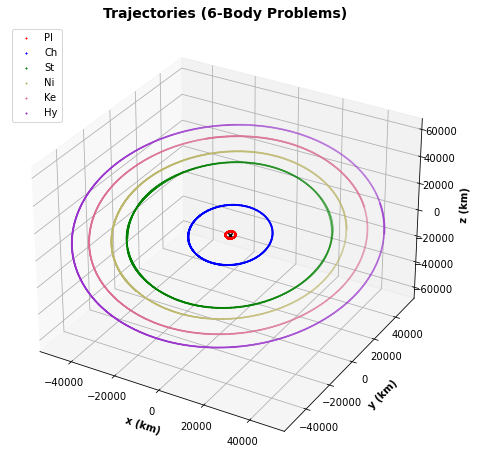

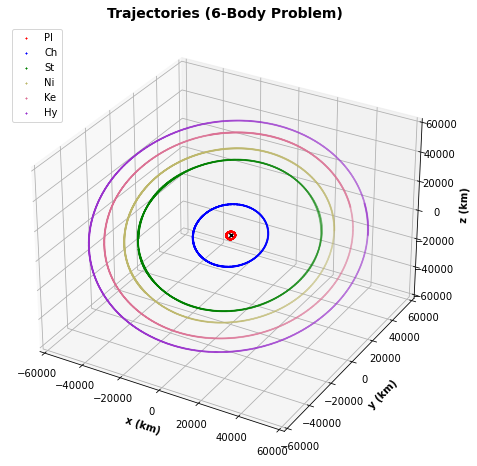

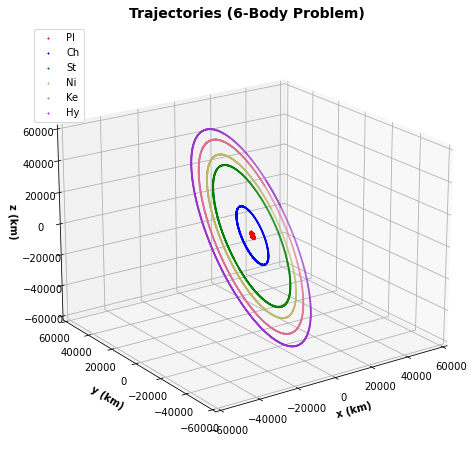

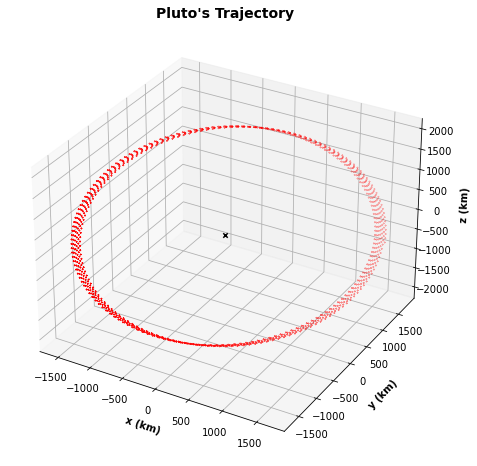

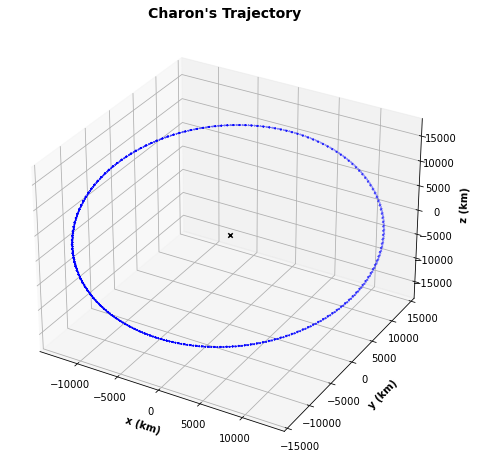

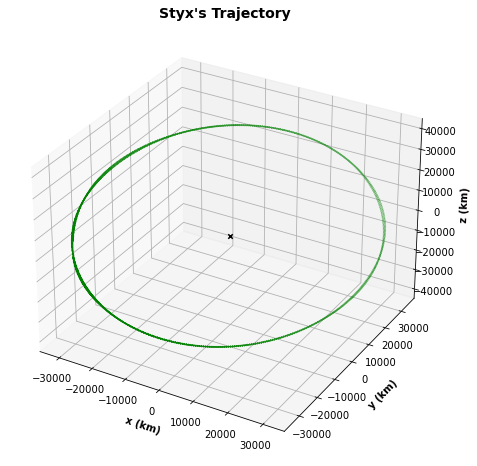

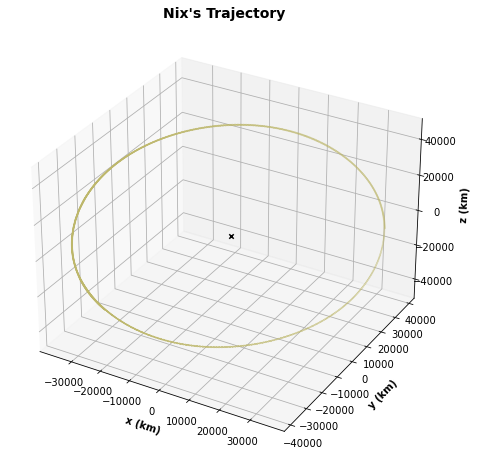

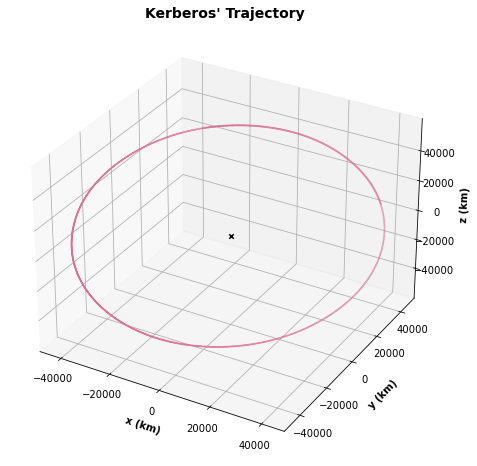

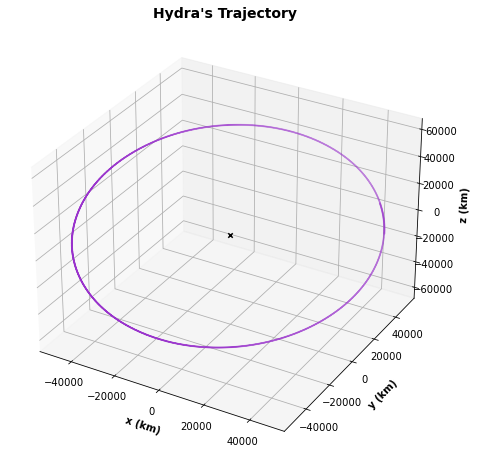

In [38]:
#-------------------------------------------------------------------------------------------------------------------------------
#Printing the approximated parameters for each body´s ellipse.
print("ELLIPTIC TRAJECTORIES' APPROXIMATED PARAMETERS:")
print("Pluto:    \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (pl_a_RKi, pl_b_RKi, pl_c_RKi, pl_e_RKi))
print("Charn:    \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (ch_a_RKi, ch_b_RKi, ch_c_RKi, ch_e_RKi))
print("Styx:     \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (st_a_RKi, st_b_RKi, st_c_RKi, st_e_RKi))
print("Nix:      \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (ni_a_RKi, ni_b_RKi, ni_c_RKi, ni_e_RKi))
print("Kerberos: \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (ke_a_RKi, ke_b_RKi, ke_c_RKi, ke_e_RKi))
print("Hydra:    \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (hy_a_RKi, hy_b_RKi, hy_c_RKi, hy_e_RKi))

#-------------------------------------------------------------------------------------------------------------------------------
#PLOTS:

#Loop to plot only certain points (to ease the graphcator's job).

T = 1000                         # Amount of elements to plot (T=1000 means plotting every 1000).

pl_r_RK_g = points_plot(h_RK, T, pl_x_RK, pl_y_RK, pl_z_RK, "Pl")
ch_r_RK_g = points_plot(h_RK, T, ch_x_RK, ch_y_RK, ch_z_RK, "Ch")
st_r_RK_g = points_plot(h_RK, T, st_x_RK, st_y_RK, st_z_RK, "St")
ni_r_RK_g = points_plot(h_RK, T, ni_x_RK, ni_y_RK, ni_z_RK, "Ni")
ke_r_RK_g = points_plot(h_RK, T, ke_x_RK, ke_y_RK, ke_z_RK, "Ke")
hy_r_RK_g = points_plot(h_RK, T, hy_x_RK, hy_y_RK, hy_z_RK, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting all orbits together.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Trajectories (6-Body Problems)", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(pl_r_RK_g[:,0], pl_r_RK_g[:,1], pl_r_RK_g[:,2], marker="x", c=col_pl, s=1, label="Pl");
ax.scatter(ch_r_RK_g[:,0], ch_r_RK_g[:,1], ch_r_RK_g[:,2], marker="x", c=col_ch, s=1, label="Ch");
ax.scatter(st_r_RK_g[:,0], st_r_RK_g[:,1], st_r_RK_g[:,2], marker="x", c=col_st, s=1, label="St");
ax.scatter(ni_r_RK_g[:,0], ni_r_RK_g[:,1], ni_r_RK_g[:,2], marker="x", c=col_ni, s=1, label="Ni");
ax.scatter(ke_r_RK_g[:,0], ke_r_RK_g[:,1], ke_r_RK_g[:,2], marker="x", c=col_ke, s=1, label="Ke");
ax.scatter(hy_r_RK_g[:,0], hy_r_RK_g[:,1], hy_r_RK_g[:,2], marker="x", c=col_hy, s=1, label="Hy");
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
ax.legend(loc='upper left')
fig.set_size_inches(8, 8)
plt.show()

#Plotting all orbits together with axes at the same scale.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Trajectories (6-Body Problem)", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(pl_r_RK_g[:,0], pl_r_RK_g[:,1], pl_r_RK_g[:,2], marker="x", c=col_pl, label="Pl", s=1);
ax.scatter(ch_r_RK_g[:,0], ch_r_RK_g[:,1], ch_r_RK_g[:,2], marker="x", c=col_ch, label="Ch", s=1);
ax.scatter(st_r_RK_g[:,0], st_r_RK_g[:,1], st_r_RK_g[:,2], marker="x", c=col_st, label="St", s=1);
ax.scatter(ni_r_RK_g[:,0], ni_r_RK_g[:,1], ni_r_RK_g[:,2], marker="x", c=col_ni, label="Ni", s=1);
ax.scatter(ke_r_RK_g[:,0], ke_r_RK_g[:,1], ke_r_RK_g[:,2], marker="x", c=col_ke, label="Ke", s=1);
ax.scatter(hy_r_RK_g[:,0], hy_r_RK_g[:,1], hy_r_RK_g[:,2], marker="x", c=col_hy, label="Hy", s=1);
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
ax.set_xlim3d(-60000, 60000)
ax.set_ylim3d(-60000, 60000)
ax.set_zlim3d(-60000, 60000)
ax.legend(loc='upper left')
fig.set_size_inches(8, 8)
plt.show()

#Plotting all orbits together, from a different perspective.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Trajectories (6-Body Problem)", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(pl_r_RK_g[:,0], pl_r_RK_g[:,1], pl_r_RK_g[:,2], marker="x", c=col_pl, label="Pl", s=1);
ax.scatter(ch_r_RK_g[:,0], ch_r_RK_g[:,1], ch_r_RK_g[:,2], marker="x", c=col_ch, label="Ch", s=1);
ax.scatter(st_r_RK_g[:,0], st_r_RK_g[:,1], st_r_RK_g[:,2], marker="x", c=col_st, label="St", s=1);
ax.scatter(ni_r_RK_g[:,0], ni_r_RK_g[:,1], ni_r_RK_g[:,2], marker="x", c=col_ni, label="Ni", s=1);
ax.scatter(ke_r_RK_g[:,0], ke_r_RK_g[:,1], ke_r_RK_g[:,2], marker="x", c=col_ke, label="Ke", s=1);
ax.scatter(hy_r_RK_g[:,0], hy_r_RK_g[:,1], hy_r_RK_g[:,2], marker="x", c=col_hy, label="Hy", s=1);
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
ax.set_xlim3d(-60000, 60000)
ax.set_ylim3d(-60000, 60000)
ax.set_zlim3d(-60000, 60000)
ax.legend(loc='upper left')
ax.view_init(20, -125)
fig.set_size_inches(8, 8)
plt.show()

#Plotting all individual orbits.
plot_orbit("Pluto",    pl_r_RK_g[:,0], pl_r_RK_g[:,1], pl_r_RK_g[:,2], col_pl, "Pl")
plot_orbit("Charon",   ch_r_RK_g[:,0], ch_r_RK_g[:,1], ch_r_RK_g[:,2], col_ch, "Ch")
plot_orbit("Styx",     st_r_RK_g[:,0], st_r_RK_g[:,1], st_r_RK_g[:,2], col_st, "St")
plot_orbit("Nix",      ni_r_RK_g[:,0], ni_r_RK_g[:,1], ni_r_RK_g[:,2], col_ni, "Ni")

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Kerberos' Trajectory", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(ke_r_RK_g[:,0], ke_r_RK_g[:,1], ke_r_RK_g[:,2], marker="x", c=col_ke, s=1, label="Ke");
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
fig.set_size_inches(8, 8)
plt.show()

plot_orbit("Hydra",    hy_r_RK_g[:,0], hy_r_RK_g[:,1], hy_r_RK_g[:,2], col_hy, "Hy")


## Animations - 6-Body Problem

#### IMPORTANT: The following code are exclusivley to generate GIF animations that we used in presentations (PowerPoint, Prezi, etc.). It is NOT necessary to run these lines if you are only interested in the results.

##### The animations are saved in GIF format directly in the folder where this notebook is located. The path can be changed for each animation, as well as the file name.

In [38]:
#-------------------------------------------------------------------------------------------------------------------------------
#Orbits around barycenter - rotating perspective
del filenames   #If this is the first animation, comment this line.
filenames = []
T = 108
k = 360/T
lim = tqdm((range(T)), desc="GIF: ")
for i in lim:
    #Creating each frame.
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("Trajectories\n6-Body Problem", fontsize=16)
    ax.scatter(0, 0, 0, marker="x", c="black");
    ax.scatter(pl_r_RK_g[:,0], pl_r_RK_g[:,1], pl_r_RK_g[:,2], marker="x", c=col_pl, s=1, label="Pl");
    ax.scatter(ch_r_RK_g[:,0], ch_r_RK_g[:,1], ch_r_RK_g[:,2], marker="x", c=col_ch, s=1, label="Ch");
    ax.scatter(st_r_RK_g[:,0], st_r_RK_g[:,1], st_r_RK_g[:,2], marker="x", c=col_st, s=1, label="St");
    ax.scatter(ni_r_RK_g[:,0], ni_r_RK_g[:,1], ni_r_RK_g[:,2], marker="x", c=col_ni, s=1, label="Ni");
    ax.scatter(ke_r_RK_g[:,0], ke_r_RK_g[:,1], ke_r_RK_g[:,2], marker="x", c=col_ke, s=1, label="Ke");
    ax.scatter(hy_r_RK_g[:,0], hy_r_RK_g[:,1], hy_r_RK_g[:,2], marker="x", c=col_hy, s=1, label="Hy");
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    ax.set_xlim3d(-60000, 60000)
    ax.set_ylim3d(-60000, 60000)
    ax.set_zlim3d(-60000, 60000)
    ax.legend(loc='upper left')
    ax.view_init(20, -k*i)
    fig.set_size_inches(8, 8)
    
    # The PNG file to save the current frame is created.
    filename = f'{i}.png'
    filenames.append(filename)
    
    # The frame is saved in the PNG file.
    plt.savefig(filename)
    plt.close()

# The GIF is created.
with imageio.get_writer('Rotation_6BP.gif', mode='I', fps=10) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# The individual frame files are eliminated.
for filename in set(filenames):
    os.remove(filename)
    

GIF:   0%|          | 0/108 [00:00<?, ?it/s]

In [41]:
#-------------------------------------------------------------------------------------------------------------------------------
#Orbits around barycenter - movement animation.
T = 200
k = math.floor(len(pl_r_RK_g[:,0])/T)         # Amount of data in each of the T partitions.

del filenames   #If this is the first animation, comment this line.
filenames = []
lim = tqdm((range(T)), desc="GIF: ")
i = 0
d = 1
for j in lim:
    
    if i == 5:
        d = d + 1
        i = 0
    i = i + 1
    
    #Creating each frame.
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("Trajectories\n6-Body Problem\n2 days /s   (Day "+str(d)+")", fontsize=16)
    ax.scatter(0, 0, 0, marker="x", c="black");
    ax.plot(pl_r_RK_g[:j*k,0], pl_r_RK_g[:j*k,1], pl_r_RK_g[:j*k,2], lw=1, alpha=0.5, c=col_pl);
    ax.scatter(pl_r_RK_g[j*k,0], pl_r_RK_g[j*k,1], pl_r_RK_g[j*k,2], c=col_pl, label="Pl", s=40);
    ax.plot(ch_r_RK_g[:j*k,0], ch_r_RK_g[:j*k,1], ch_r_RK_g[:j*k,2], lw=1, alpha=0.5, c=col_ch);
    ax.scatter(ch_r_RK_g[j*k,0], ch_r_RK_g[j*k,1], ch_r_RK_g[j*k,2], c=col_ch, label="Ca", s=40);
    ax.plot(st_r_RK_g[:j*k,0], st_r_RK_g[:j*k,1], st_r_RK_g[:j*k,2], lw=1, alpha=0.5, c=col_st);
    ax.scatter(st_r_RK_g[j*k,0], st_r_RK_g[j*k,1], st_r_RK_g[j*k,2], c=col_st, label="Es", s=40);
    ax.plot(ni_r_RK_g[:j*k,0], ni_r_RK_g[:j*k,1], ni_r_RK_g[:j*k,2], lw=1, alpha=0.5, c=col_ni);
    ax.scatter(ni_r_RK_g[j*k,0], ni_r_RK_g[j*k,1], ni_r_RK_g[j*k,2], c=col_ni, label="Ni", s=40);
    ax.plot(ke_r_RK_g[:j*k,0], ke_r_RK_g[:j*k,1], ke_r_RK_g[:j*k,2], lw=1, alpha=0.5, c=col_ke);
    ax.scatter(ke_r_RK_g[j*k,0], ke_r_RK_g[j*k,1], ke_r_RK_g[j*k,2], c=col_ke, label="Ce", s=40);
    ax.plot(hy_r_RK_g[:j*k,0], hy_r_RK_g[:j*k,1], hy_r_RK_g[:j*k,2], lw=1, alpha=0.5, c=col_hy);
    ax.scatter(hy_r_RK_g[j*k,0], hy_r_RK_g[j*k,1], hy_r_RK_g[j*k,2], c=col_hy, label="Hi", s=40);
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    ax.set_xlim3d(-60000, 60000)
    ax.set_ylim3d(-60000, 60000)
    ax.set_zlim3d(-60000, 60000)
    ax.legend(loc='upper left')
    fig.set_size_inches(8, 8)
    
    # The PNG file to save the current frame is created.
    filename = f'{j}.png'
    filenames.append(filename)
    
    # The frame is saved in the PNG file.
    plt.savefig(filename)
    plt.close()
    
# The GIF is created.
with imageio.get_writer('Orbits_6BP.gif', mode='I', fps=10) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# The individual frame files are eliminated.
for filename in set(filenames):
    os.remove(filename)
    

GIF:   0%|          | 0/200 [00:00<?, ?it/s]

### Fitted Planes and Orbital Periods - 6-Body Problem

In [22]:
#-------------------------------------------------------------------------------------------------------------------------------
#Storing the data of the first orbit for each body.
p_r_pl_RK = one_orbit(pl_x_RK, pl_y_RK, pl_z_RK, "Pl")
p_r_ch_RK = one_orbit(ch_x_RK, ch_y_RK, ch_z_RK, "Ch")
p_r_st_RK = one_orbit(st_x_RK, st_y_RK, st_z_RK, "St")
p_r_ni_RK = one_orbit(ni_x_RK, ni_y_RK, ni_z_RK, "Ni")
p_r_ke_RK = one_orbit(ke_x_RK, ke_y_RK, ke_z_RK, "Ke")
p_r_hy_RK = one_orbit(hy_x_RK, hy_y_RK, hy_z_RK, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#Generating the fitted plane for each orbit.
print("FITTED PLANES:\n")
pln_pl_RK = plane("Pluto",    p_r_pl_RK[:,0], p_r_pl_RK[:,1], p_r_pl_RK[:,2])
pln_ch_RK = plane("Charon",   p_r_ch_RK[:,0], p_r_ch_RK[:,1], p_r_ch_RK[:,2])
pln_st_RK = plane("Styx",     p_r_st_RK[:,0], p_r_st_RK[:,1], p_r_st_RK[:,2])
pln_ni_RK = plane("Nix",      p_r_ni_RK[:,0], p_r_ni_RK[:,1], p_r_ni_RK[:,2])
pln_ke_RK = plane("Kerberos", p_r_ke_RK[:,0], p_r_ke_RK[:,1], p_r_ke_RK[:,2])
pln_hy_RK = plane("Hydra",    p_r_hy_RK[:,0], p_r_hy_RK[:,1], p_r_hy_RK[:,2])

#-------------------------------------------------------------------------------------------------------------------------------
#The orbital period is calculated.
per_pl_RK = period(h_RK, p_r_pl_RK[:,3])
per_ch_RK = period(h_RK, p_r_ch_RK[:,3])
per_st_RK = period(h_RK, p_r_st_RK[:,3])
per_ni_RK = period(h_RK, p_r_ni_RK[:,3])
per_ke_RK = period(h_RK, p_r_ke_RK[:,3])
per_hy_RK = period(h_RK, p_r_hy_RK[:,3])

print("\nORBITAL PERIOD (and amount of data for 1st orbit)\n")
print_per(h_RK, "Pluto",    p_r_pl_RK, per_pl_RK)
print_per(h_RK, "Charon",   p_r_ch_RK, per_ch_RK)
print_per(h_RK, "Styx",     p_r_st_RK, per_st_RK)
print_per(h_RK, "Nix",      p_r_ni_RK, per_ni_RK)
print_per(h_RK, "Kerberos", p_r_ke_RK, per_ke_RK)
print_per(h_RK, "Hydra",    p_r_hy_RK, per_hy_RK)


1st Orbit (Pl):   0%|          | 0/1000001 [00:00<?, ?it/s]

1st Orbit (Ch):   0%|          | 0/1000001 [00:00<?, ?it/s]

1st Orbit (St):   0%|          | 0/1000001 [00:00<?, ?it/s]

1st Orbit (Ni):   0%|          | 0/1000001 [00:00<?, ?it/s]

1st Orbit (Ke):   0%|          | 0/1000001 [00:00<?, ?it/s]

1st Orbit (Hy):   0%|          | 0/1000001 [00:00<?, ?it/s]

FITTED PLANES:

Pluto: -1.742641 x + 1.602680 y + -0.001560 = z
Charon: -1.742640 x + 1.602679 y + -0.001489 = z
Styx: -1.745969 x + 1.604347 y + 1.600630 = z
Nix: -1.741802 x + 1.598745 y + 1.911094 = z
Kerberos: -1.763611 x + 1.638548 y + 7.779843 = z
Hydra: -1.720573 x + 1.596011 y + 3.566819 = z

ORBITAL PERIOD (and amount of data for 1st orbit)

Pluto:
Amount of Data: 159632
Period (days):  6.385300000000001 +/- 2e-05

Charon:
Amount of Data: 159962
Period (days):  6.3985 +/- 2e-05

Styx:
Amount of Data: 504949
Period (days):  20.19798 +/- 2e-05

Nix:
Amount of Data: 622970
Period (days):  24.91882 +/- 2e-05

Kerberos:
Amount of Data: 803986
Period (days):  32.15946 +/- 2e-05

Hydra:
Amount of Data: 955559
Period (days):  38.22238 +/- 2e-05



### Pluto's Trajectory Plot - 6-Body Problem

##### To better analyze what happens in this model, we plot Pluto´s trajectory. It is noticeable that there is an orbital precession that is not as visible in the JPL/NASA data. Both plots include all points from each set of coordinates.

P. Proj. (Pl) ::   0%|          | 0/1000 [00:00<?, ?it/s]

P. Proj. (Pl) ::   0%|          | 0/34561 [00:00<?, ?it/s]

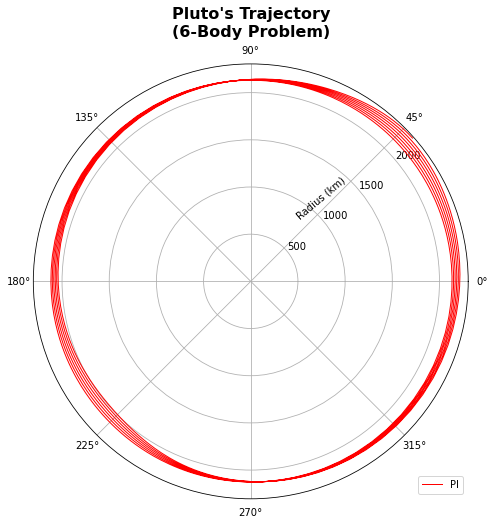

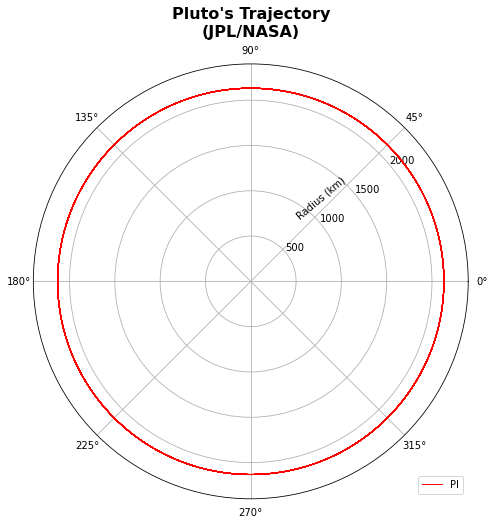

In [25]:
#-------------------------------------------------------------------------------------------------------------------------------
#Projecting all points on Pluto´s plane.
p_pl_r_RK_g = points_proj(pl_r_RK_g[:,0], pl_r_RK_g[:,1], pl_r_RK_g[:,2], pln_pl_RK, "Pl")
p_pl_r_g = points_proj(pl_r[:,0], pl_r[:,1], pl_r[:,2], pln_pl, "Pl")


#Plotting (polar) Pluto´s trajectory (6-Body Problem).
fig = plt.figure()
ax = plt.subplot(111, polar=True)
fig.set_size_inches(8, 8)
ax.set_title("Pluto's Trajectory\n(6-Body Problem)", va='bottom', fontweight="bold", fontsize=16)
plt.polar(p_pl_r_RK_g[:,4], p_pl_r_RK_g[:,3], color=col_pl, lw=1, label="Pl")
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()

#Plotting (polar) Pluto´s Trajectory (JPL/NASA).
fig = plt.figure()
ax = plt.subplot(111, polar=True)
fig.set_size_inches(8, 8)
ax.set_title("Pluto's Trajectory\n(JPL/NASA)", va='bottom', fontweight="bold", fontsize=16)
plt.polar(p_pl_r_g[:,4], p_pl_r_g[:,3], color=col_pl, lw=1, label="Pl")
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
ax.set_rmax(2400)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()


### Projecting the Points to the Fitted Plane - 6-Body Problem

##### As we did for the analysis of the JPL/NASA data, we project the points onto the fitted plane to use those projections to fit an ellipse for  the body´s trajectory.

P. Proj. (Pl) ::   0%|          | 0/159632 [00:00<?, ?it/s]

P. Proj. (Ch) ::   0%|          | 0/159962 [00:00<?, ?it/s]

P. Proj. (St) ::   0%|          | 0/504949 [00:00<?, ?it/s]

P. Proj. (Ni) ::   0%|          | 0/622970 [00:00<?, ?it/s]

P. Proj. (Ke) ::   0%|          | 0/803986 [00:00<?, ?it/s]

P. Proj. (Hy) ::   0%|          | 0/955559 [00:00<?, ?it/s]

Points to Plot (Pl):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Ch):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (St):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Ni):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Ke):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Hy):   0%|          | 0/1000 [00:00<?, ?it/s]

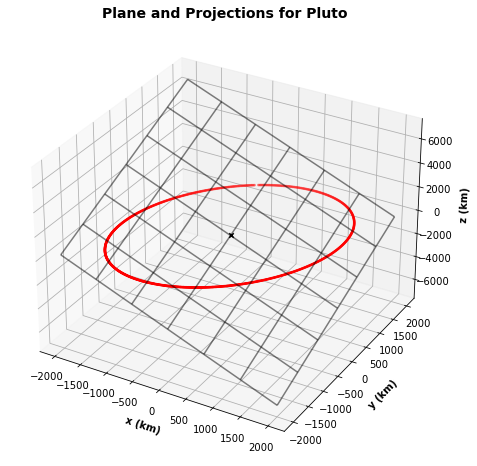

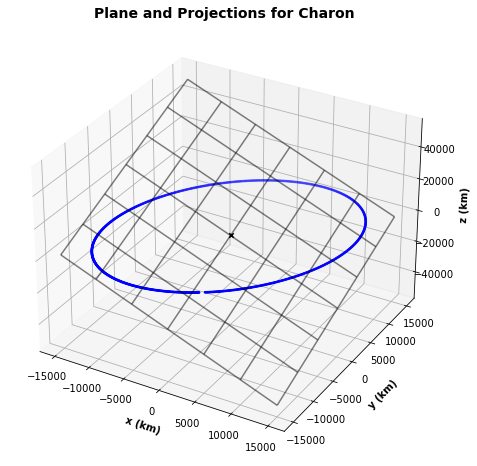

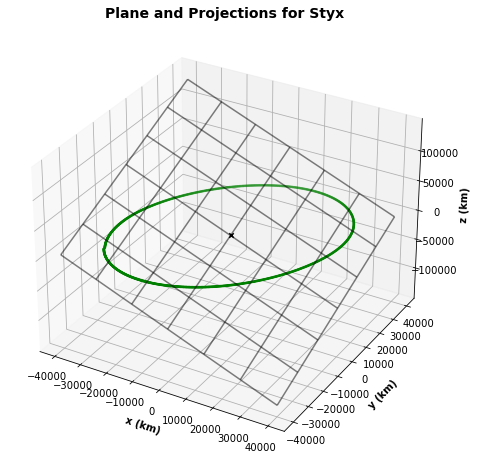

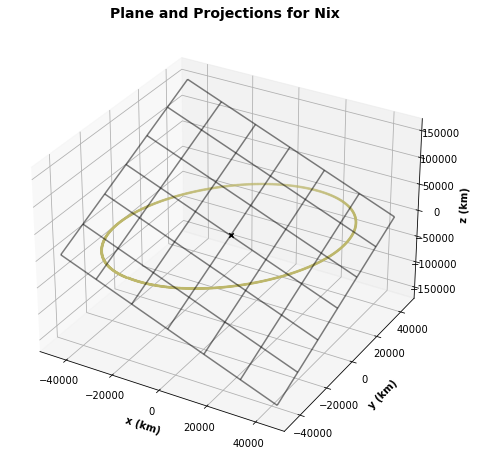

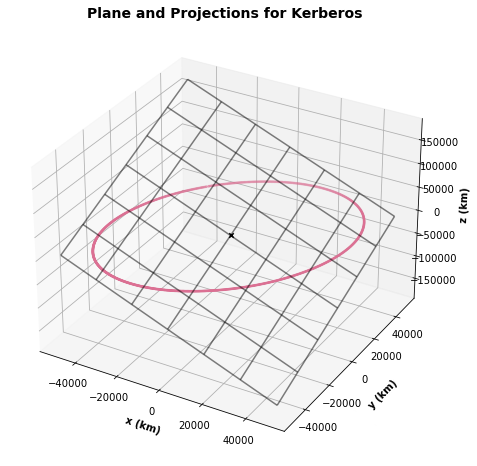

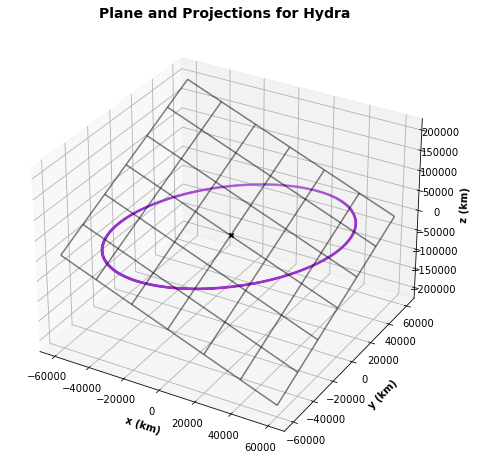

In [97]:
#-------------------------------------------------------------------------------------------------------------------------------
#Projecting the points to the plane.
p_pl_r_RK = points_proj(p_r_pl_RK[:,0], p_r_pl_RK[:,1], p_r_pl_RK[:,2], pln_pl_RK, "Pl")
p_ch_r_RK = points_proj(p_r_ch_RK[:,0], p_r_ch_RK[:,1], p_r_ch_RK[:,2], pln_ch_RK, "Ch")
p_st_r_RK = points_proj(p_r_st_RK[:,0], p_r_st_RK[:,1], p_r_st_RK[:,2], pln_st_RK, "St")
p_ni_r_RK = points_proj(p_r_ni_RK[:,0], p_r_ni_RK[:,1], p_r_ni_RK[:,2], pln_ni_RK, "Ni")
p_ke_r_RK = points_proj(p_r_ke_RK[:,0], p_r_ke_RK[:,1], p_r_ke_RK[:,2], pln_ke_RK, "Ke")
p_hy_r_RK = points_proj(p_r_hy_RK[:,0], p_r_hy_RK[:,1], p_r_hy_RK[:,2], pln_hy_RK, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the points in the plane.
T = 1000

p_pl_r_RK_g = points_plot(h_RK, T, p_pl_r_RK[:,0], p_pl_r_RK[:,1], p_pl_r_RK[:,2], "Pl")
p_ch_r_RK_g = points_plot(h_RK, T, p_ch_r_RK[:,0], p_ch_r_RK[:,1], p_ch_r_RK[:,2], "Ch")
p_st_r_RK_g = points_plot(h_RK, T, p_st_r_RK[:,0], p_st_r_RK[:,1], p_st_r_RK[:,2], "St")
p_ni_r_RK_g = points_plot(h_RK, T, p_ni_r_RK[:,0], p_ni_r_RK[:,1], p_ni_r_RK[:,2], "Ni")
p_ke_r_RK_g = points_plot(h_RK, T, p_ke_r_RK[:,0], p_ke_r_RK[:,1], p_ke_r_RK[:,2], "Ke")
p_hy_r_RK_g = points_plot(h_RK, T, p_hy_r_RK[:,0], p_hy_r_RK[:,1], p_hy_r_RK[:,2], "Hy")

grid_pl = ([-2000, 2000, 7])
grid_ch = ([-15000,15000,7])
grid_st = ([-40000,40000,7])
grid_ni = ([-45000,45000,7])
grid_ke = ([-50000,50000,7])
grid_hy = ([-60000,60000,7])

#Plotting the points and the plane.
plot_plane("Pluto",    pln_pl_RK, col_pl, p_pl_r_RK_g, grid_pl)
plot_plane("Charon",   pln_ch_RK, col_ch, p_ch_r_RK_g, grid_ch)
plot_plane("Styx",     pln_st_RK, col_st, p_st_r_RK_g, grid_st)
plot_plane("Nix",      pln_ni_RK, col_ni, p_ni_r_RK_g, grid_ni)
plot_plane("Kerberos", pln_ke_RK, col_ke, p_ke_r_RK_g, grid_ke)
plot_plane("Hydra",    pln_hy_RK, col_hy, p_hy_r_RK_g, grid_hy)


### Fitting Ellipses - 6-Body Problem

In [27]:
#-------------------------------------------------------------------------------------------------------------------------------
#Generating the 2D points.
pl_2d_r_RK = points_2d(p_pl_r_RK, "Pl")
ch_2d_r_RK = points_2d(p_ch_r_RK, "Ch")
st_2d_r_RK = points_2d(p_st_r_RK, "St")
ni_2d_r_RK = points_2d(p_ni_r_RK, "Ni")
ke_2d_r_RK = points_2d(p_ke_r_RK, "Ke")
hy_2d_r_RK = points_2d(p_hy_r_RK, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#Fitting the ellipse.

#The constants for the ellipse equation are calculated for each body.
ell_pl_RK = fit_ellipse(pl_2d_r_RK)
ell_ch_RK = fit_ellipse(ch_2d_r_RK)
ell_st_RK = fit_ellipse(st_2d_r_RK)
ell_ni_RK = fit_ellipse(ni_2d_r_RK)
ell_ke_RK = fit_ellipse(ke_2d_r_RK)
ell_hy_RK = fit_ellipse(hy_2d_r_RK)


2D Points (Pl) ::   0%|          | 0/159632 [00:00<?, ?it/s]

2D Points (Ch) ::   0%|          | 0/159962 [00:00<?, ?it/s]

2D Points (St) ::   0%|          | 0/504949 [00:00<?, ?it/s]

2D Points (Ni) ::   0%|          | 0/622970 [00:00<?, ?it/s]

2D Points (Ke) ::   0%|          | 0/803986 [00:00<?, ?it/s]

2D Points (Hy) ::   0%|          | 0/955559 [00:00<?, ?it/s]

<ipython-input-8-8163926b49f2>:23: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  x = np.linalg.lstsq(A, b)[0].squeeze()      # The constants are stored. They are for the equation of the form:


EQUATIONS OF FITTED ELLIPSES:
Pluto:     2.21e-07x^2 + 9.49e-10xy+2.21e-07y^2+-4.18e-06x+-1.79e-06y = 1
Charon:    3.27e-09x^2 + -7.61e-13xy+3.27e-09y^2+-3.56e-08x+-1.14e-07y = 1
Styx:      5.53e-10x^2 + -5.4e-12xy+5.59e-10y^2+7.16e-08x+-1.12e-07y = 1
Nix:       4.2e-10x^2 + -1.73e-13xy+4.2e-10y^2+2.52e-08x+-2.41e-08y = 1
Kerberos:  3e-10x^2 + 1.99e-13xy+3e-10y^2+6.58e-08x+-2.2e-08y = 1
Hydra:     2.39e-10x^2 + -1.64e-14xy+2.38e-10y^2+-1.67e-07x+1.47e-07y = 1


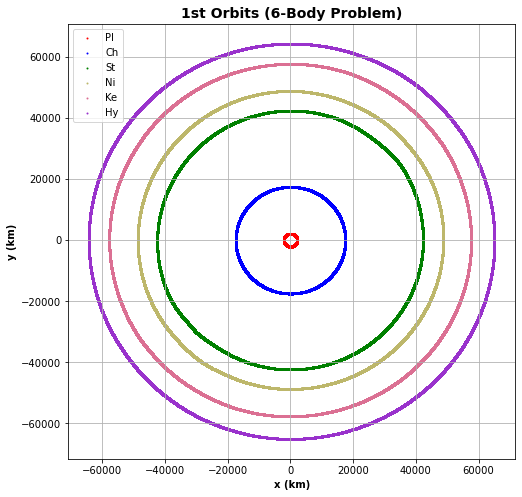

In [30]:
#-------------------------------------------------------------------------------------------------------------------------------
#Printing of each ellipse´s equation.
print("EQUATIONS OF FITTED ELLIPSES:")
print('Pluto:     {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_pl_RK[0], ell_pl_RK[1], ell_pl_RK[2], ell_pl_RK[3], ell_pl_RK[4]))
print('Charon:    {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_ch_RK[0], ell_ch_RK[1], ell_ch_RK[2], ell_ch_RK[3], ell_ch_RK[4]))
print('Styx:      {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_st_RK[0], ell_st_RK[1], ell_st_RK[2], ell_st_RK[3], ell_st_RK[4]))
print('Nix:       {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_ni_RK[0], ell_ni_RK[1], ell_ni_RK[2], ell_ni_RK[3], ell_ni_RK[4]))
print('Kerberos:  {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_ke_RK[0], ell_ke_RK[1], ell_ke_RK[2], ell_ke_RK[3], ell_ke_RK[4]))
print('Hydra:     {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_hy_RK[0], ell_hy_RK[1], ell_hy_RK[2], ell_hy_RK[3], ell_hy_RK[4]))

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the points in a single graph (approximating all planes as equal).
fig = plt.figure()
plt.scatter(pl_2d_r_RK[:,0], pl_2d_r_RK[:,1], c=col_pl, s=1, label="Pl")
plt.scatter(ch_2d_r_RK[:,0], ch_2d_r_RK[:,1], c=col_ch, s=1, label="Ch")
plt.scatter(st_2d_r_RK[:,0], st_2d_r_RK[:,1], c=col_st, s=1, label="St")
plt.scatter(ni_2d_r_RK[:,0], ni_2d_r_RK[:,1], c=col_ni, s=1, label="Ni")
plt.scatter(ke_2d_r_RK[:,0], ke_2d_r_RK[:,1], c=col_ke, s=1, label="Ke")
plt.scatter(hy_2d_r_RK[:,0], hy_2d_r_RK[:,1], c=col_hy, s=1, label="Hy")
plt.title("1st Orbits (6-Body Problem)", fontweight="bold", fontsize=14)
plt.xlabel("x (km)", fontweight="bold")
plt.ylabel("y (km)", fontweight="bold")
plt.legend(loc='upper left')
fig.set_size_inches(8, 8)
plt.grid()
plt.xlim([min(hy_2d_r_RK[:,0]) - (abs(min(hy_2d_r_RK[:,0]))/10), max(hy_2d_r_RK[:,0]) + (abs(max(hy_2d_r_RK[:,0]))/10)])
plt.ylim([min(hy_2d_r_RK[:,1]) - (abs(min(hy_2d_r_RK[:,1]))/10), max(hy_2d_r_RK[:,1]) + (abs(max(hy_2d_r_RK[:,1]))/10)])
plt.show()


### Fitted Ellipses' Parameters - 6-Body Problem

##### With the ellipses' equations, we obtained its parameters the same way we calculated the parameters for the JPL/NASA trajectories. We get an alligned ellipse and then calculate its parameters instead.

In [31]:
#-------------------------------------------------------------------------------------------------------------------------------
#The parameters for each elliptical orbit are calculated.
ell_pl_a_RK, ell_pl_b_RK, ell_pl_c_RK, ell_pl_e_RK = param_ellipse(ell_pl_RK)
ell_ch_a_RK, ell_ch_b_RK, ell_ch_c_RK, ell_ch_e_RK = param_ellipse(ell_ch_RK)
ell_st_a_RK, ell_st_b_RK, ell_st_c_RK, ell_st_e_RK = param_ellipse(ell_st_RK)
ell_ni_a_RK, ell_ni_b_RK, ell_ni_c_RK, ell_ni_e_RK = param_ellipse(ell_ni_RK)
ell_ke_a_RK, ell_ke_b_RK, ell_ke_c_RK, ell_ke_e_RK = param_ellipse(ell_ke_RK)
ell_hy_a_RK, ell_hy_b_RK, ell_hy_c_RK, ell_hy_e_RK = param_ellipse(ell_hy_RK)

#-------------------------------------------------------------------------------------------------------------------------------
#Printing the parameters along with the ones from JPL/NASA.

#Function to print both sets of parameters (JPL/NASA and 6BP).
def print_param_RK(title, ell_a, ell_b, ell_c, ell_e, a, b, c, e):
    print(title + ':')
    print('6BP:        a: ' + str(ell_a) + '   b: ' + str(ell_b) + '   c: ' + str(ell_c) + '   e: ' + str(ell_e))
    print('JPL/NASA:   a: ' + str(a) + '   b: ' + str(b) + '   c: ' + str(c) + '   e: ' + str(e))
    print("")

#Printing the parameters (6BP vs. JPL/NASA).
print("ELLIPTIC TRAJECTORIES' PARAMETERS:")
print_param_RK("Pluto",    ell_pl_a_RK, ell_pl_b_RK, ell_pl_c_RK, ell_pl_e_RK, ell_pl_a, ell_pl_b, ell_pl_c, ell_pl_e)
print_param_RK("Charon",   ell_ch_a_RK, ell_ch_b_RK, ell_ch_c_RK, ell_ch_e_RK, ell_ch_a, ell_ch_b, ell_ch_c, ell_ch_e)
print_param_RK("Styx",     ell_st_a_RK, ell_st_b_RK, ell_st_c_RK, ell_st_e_RK, ell_st_a, ell_st_b, ell_st_c, ell_st_e)
print_param_RK("Nix",      ell_ni_a_RK, ell_ni_b_RK, ell_ni_c_RK, ell_ni_e_RK, ell_ni_a, ell_ni_b, ell_ni_c, ell_ni_e)
print_param_RK("Kerberos", ell_ke_a_RK, ell_ke_b_RK, ell_ke_c_RK, ell_ke_e_RK, ell_ke_a, ell_ke_b, ell_ke_c, ell_ke_e)
print_param_RK("Hydra",    ell_hy_a_RK, ell_hy_b_RK, ell_hy_c_RK, ell_hy_e_RK, ell_hy_a, ell_hy_b, ell_hy_c, ell_hy_e)


ELLIPTIC TRAJECTORIES' PARAMETERS:
Pluto:
6BP:        a: 2129.6116009394364   b: 2123.995437354353   c: 154.5605155067764   e: 0.07257685647401403
JPL/NASA:   a: 2131.9525780276717   b: 2131.9404376378916   c: 7.194812241535554   e: 0.0033747524760581117

Charon:
6BP:        a: 17493.817078995406   b: 17487.699841038626   c: 462.59081604474335   e: 0.02644310352371181
JPL/NASA:   a: 17468.581965799047   b: 17468.569148617305   c: 21.161186529791404   e: 0.0012113854788459602

Styx:
6BP:        a: 42580.860031286546   b: 42270.26251740858   c: 5133.6680564075605   e: 0.1205628080934853
JPL/NASA:   a: 42525.54676510166   b: 42227.76810928481   c: 5023.716570360756   e: 0.11813408533252373

Nix:
6BP:        a: 48779.395367579564   b: 48768.21569830037   c: 1044.2940345954407   e: 0.021408507151966474
JPL/NASA:   a: 48709.67732808009   b: 48690.25614757749   c: 1375.362384599781   e: 0.02823591655793805

Kerberos:
6BP:        a: 57753.04147563112   b: 57724.62836292024   c: 1811.3751816541

### Trajectory Comparison (6-Body Problem vs. JPL/NASA)

##### We plot the elliptic trajectories from the 6BP model along with the one from the data analysis of JPL/NASA to compare them.

In [36]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to plot each body´s trajectory to compare.
def plot_6BP_RK(title, th_k, r_k, th_o, r_o, col):
    fig = plt.figure()
    ax = plt.axes(polar = True)
    fig.set_size_inches(8, 8)
    ax.set_title(title+"'s Trajectories", va='bottom', fontweight="bold", fontsize=16)
    plt.polar(th_k, r_k, color=col, lw=2, label="6BP")
    plt.polar(th_o, r_o, color=col, lw=3, linestyle='dashed')
    plt.polar(0, 0, color=col, label="JPL/NASA", linestyle="dashed")
    ax.legend(loc='lower right')
    ax.set_rlabel_position(40)
    label_position=ax.get_rlabel_position()
    ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
    plt.show()


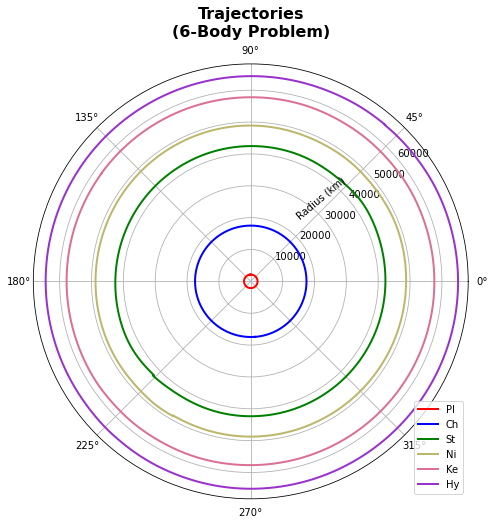

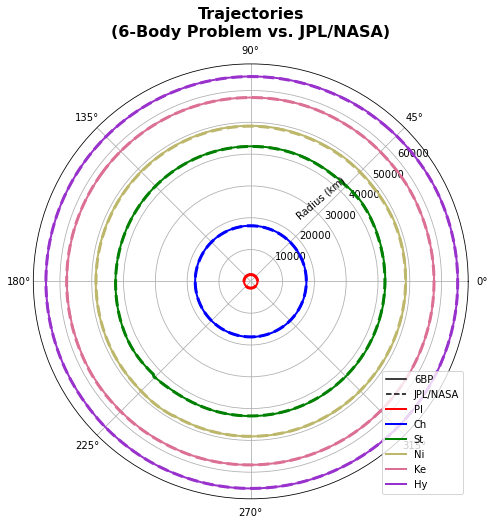

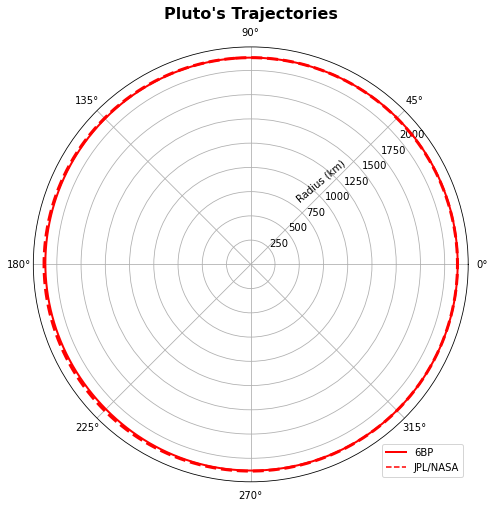

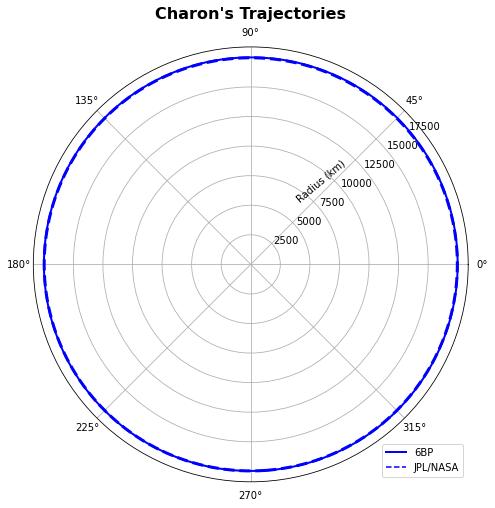

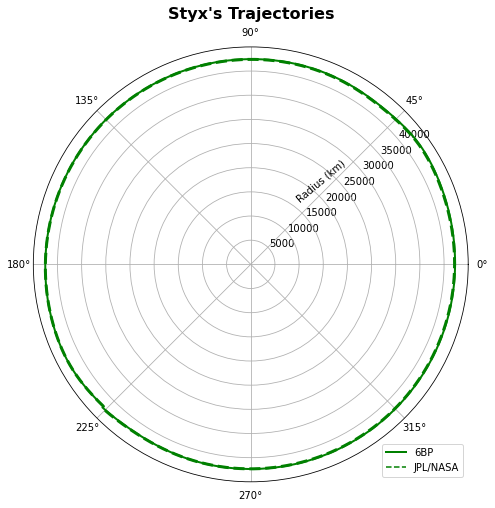

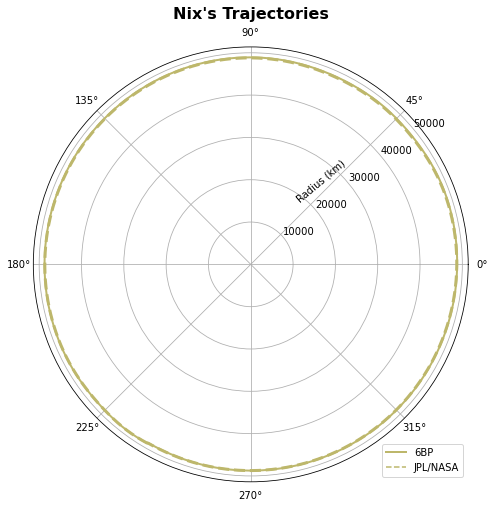

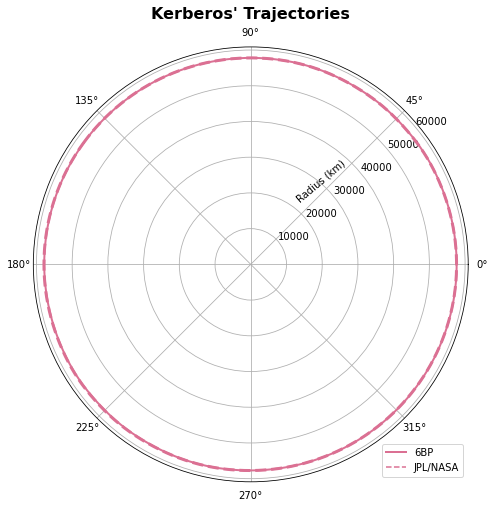

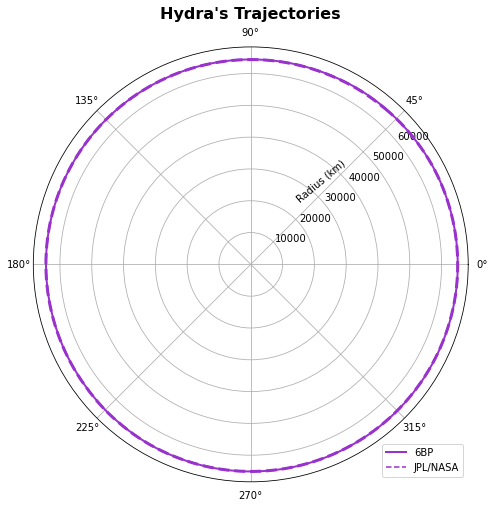

In [37]:
#-------------------------------------------------------------------------------------------------------------------------------
#Plotting all 6BP trajectories.
fig = plt.figure()
ax = plt.subplot(111, polar=True)
fig.set_size_inches(8, 8)
ax.set_title("Trajectories\n(6-Body Problem)", va='bottom', fontweight="bold", fontsize=16)
plt.polar(p_pl_r_RK[:,4], p_pl_r_RK[:,3], color=col_pl, lw=2, label="Pl")
plt.polar(p_ch_r_RK[:,4], p_ch_r_RK[:,3], color=col_ch, lw=2, label="Ch")
plt.polar(p_st_r_RK[:,4], p_st_r_RK[:,3], color=col_st, lw=2, label="St")
plt.polar(p_ni_r_RK[:,4], p_ni_r_RK[:,3], color=col_ni, lw=2, label="Ni")
plt.polar(p_ke_r_RK[:,4], p_ke_r_RK[:,3], color=col_ke, lw=2, label="Ke")
plt.polar(p_hy_r_RK[:,4], p_hy_r_RK[:,3], color=col_hy, lw=2, label="Hy")
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()

#Plotting the comparison: 6-Body Problem vs. JPL/NASA.
fig = plt.figure()
ax = plt.axes(polar = True)
fig.set_size_inches(8, 8)
ax.set_title("Trajectories\n(6-Body Problem vs. JPL/NASA)", va='bottom', fontweight="bold", fontsize=16)
plt.plot(0, 0, color="black", label="6BP")                            # These plots are
plt.plot(0, 0, color="black", label="JPL/NASA", linestyle="dashed")   # just for the labels.
plt.polar(p_pl_r_RK[:,4], p_pl_r_RK[:,3], color=col_pl, lw=2, label="Pl")
plt.polar(p_ch_r_RK[:,4], p_ch_r_RK[:,3], color=col_ch, lw=2, label="Ch")
plt.polar(p_st_r_RK[:,4], p_st_r_RK[:,3], color=col_st, lw=2, label="St")
plt.polar(p_ni_r_RK[:,4], p_ni_r_RK[:,3], color=col_ni, lw=2, label="Ni")
plt.polar(p_ke_r_RK[:,4], p_ke_r_RK[:,3], color=col_ke, lw=2, label="Ke")
plt.polar(p_hy_r_RK[:,4], p_hy_r_RK[:,3], color=col_hy, lw=2, label="Hy")
plt.polar(p_pl_r[:,4], p_pl_r[:,3], color=col_pl, lw=3, linestyle='dashed')
plt.polar(p_ch_r[:,4], p_ch_r[:,3], color=col_ch, lw=3, linestyle='dashed')
plt.polar(p_st_r[:,4], p_st_r[:,3], color=col_st, lw=3, linestyle='dashed')
plt.polar(p_ni_r[:,4], p_ni_r[:,3], color=col_ni, lw=3, linestyle='dashed')
plt.polar(p_ke_r[:,4], p_ke_r[:,3], color=col_ke, lw=3, linestyle='dashed')
plt.polar(p_hy_r[:,4], p_hy_r[:,3], color=col_hy, lw=3, linestyle='dashed')
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()

#Plotting the comparison for each individual body.
plot_6BP_RK("Pluto",    p_pl_r_RK[:,4], p_pl_r_RK[:,3], p_pl_r[:,4], p_pl_r[:,3], col_pl)
plot_6BP_RK("Charon",   p_ch_r_RK[:,4], p_ch_r_RK[:,3], p_ch_r[:,4], p_ch_r[:,3], col_ch)
plot_6BP_RK("Styx",     p_st_r_RK[:,4], p_st_r_RK[:,3], p_st_r[:,4], p_st_r[:,3], col_st)
plot_6BP_RK("Nix",      p_ni_r_RK[:,4], p_ni_r_RK[:,3], p_ni_r[:,4], p_ni_r[:,3], col_ni)

fig = plt.figure()
ax = plt.axes(polar = True)
fig.set_size_inches(8, 8)
ax.set_title("Kerberos' Trajectories", va='bottom', fontweight="bold", fontsize=16)
plt.polar(p_ke_r_RK[:,4], p_ke_r_RK[:,3], color=col_ke, lw=2, label="6BP")
plt.polar(p_ke_r[:,4], p_ke_r[:,3], color=col_ke, lw=3, linestyle='dashed')
plt.polar(0, 0, color=col_ke, label="JPL/NASA", linestyle="dashed")
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()

plot_6BP_RK("Hydra",    p_hy_r_RK[:,4], p_hy_r_RK[:,3], p_hy_r[:,4], p_hy_r[:,3], col_hy)


### Angular Momentum Conservation - 6-Body Problem

##### This model also presents a conservation of the angular momentum around an average value.

In [43]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to plot the angular momentum for every coordinate.
def plot_L_RK(title, L, color, aver):
    fig = plt.figure()
    plt.scatter(range(len(L)), L, c=color, s=1, label="|L|")
    plt.title("|L| - " + title + " (avg.: " + str(aver) + ")\n", fontweight="bold", fontsize=12)
    plt.xlabel("Coordinate Index", fontweight="bold")
    plt.ylabel("|L| (kg km^2 / d)", fontweight="bold")
    plt.legend(loc='upper left')
    plt.grid()
    plt.ylim([min(L) - (min(L)/10), max(L) + (max(L)/10)])   # Keeps the plot limits by 10% above and under
    plt.show()                                               # the highest and lowest values plotted.


In [44]:
#-------------------------------------------------------------------------------------------------------------------------------
#Calculating the angular momentum for every body.
pl_L_RK = momentum(pl_x_RK, pl_y_RK, pl_z_RK, pl_vx_RK, pl_vy_RK, pl_vz_RK, pl_m, "Pl")
ch_L_RK = momentum(ch_x_RK, ch_y_RK, ch_z_RK, ch_vx_RK, ch_vy_RK, ch_vz_RK, ch_m, "Ch")
st_L_RK = momentum(st_x_RK, st_y_RK, st_z_RK, st_vx_RK, st_vy_RK, st_vz_RK, st_m, "St")
ni_L_RK = momentum(ni_x_RK, ni_y_RK, ni_z_RK, ni_vx_RK, ni_vy_RK, ni_vz_RK, ni_m, "Ni")
ke_L_RK = momentum(ke_x_RK, ke_y_RK, ke_z_RK, ke_vx_RK, ke_vy_RK, ke_vz_RK, ke_m, "Ke")
hy_L_RK = momentum(hy_x_RK, hy_y_RK, hy_z_RK, hy_vx_RK, hy_vy_RK, hy_vz_RK, hy_m, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#PLS's total angular momentum.
L_t_RK = np.empty((len(pl_L_RK)), float)
lim = tqdm(range(len(pl_L_RK)), desc="Total Momentum: ")
for i in lim:
    L_t_RK[i] = pl_L_RK[i] + ch_L_RK[i] + st_L_RK[i] + ni_L_RK[i] + ke_L_RK[i] + hy_L_RK[i]

#-------------------------------------------------------------------------------------------------------------------------------
#Averages.
aver_L_pl_RK = avg(pl_L_RK)
aver_L_ch_RK = avg(ch_L_RK)
aver_L_st_RK = avg(st_L_RK)
aver_L_ni_RK = avg(ni_L_RK)
aver_L_ke_RK = avg(ke_L_RK)
aver_L_hy_RK = avg(hy_L_RK)
aver_L_t_RK  = avg(L_t_RK)


Pl's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Ch's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

St's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Ni's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Ke's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Hy's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Total Momentum:   0%|          | 0/1000001 [00:00<?, ?it/s]

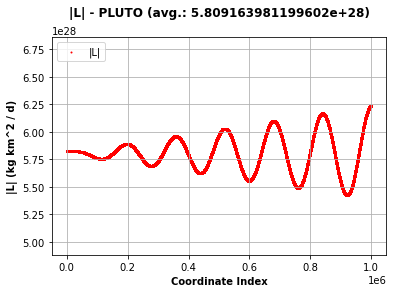

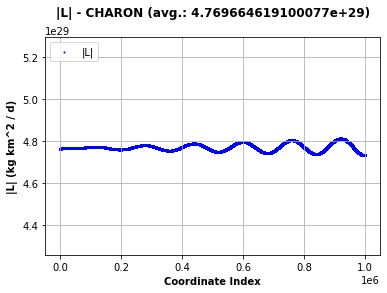

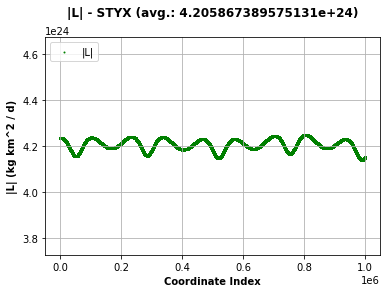

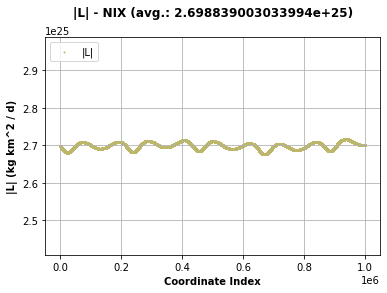

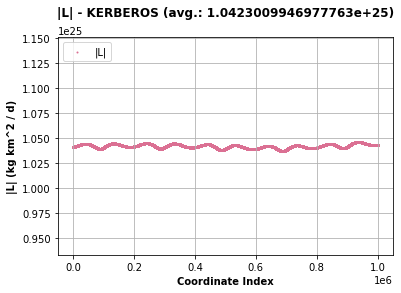

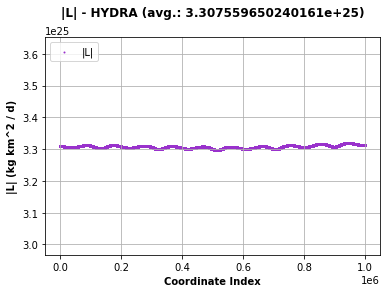

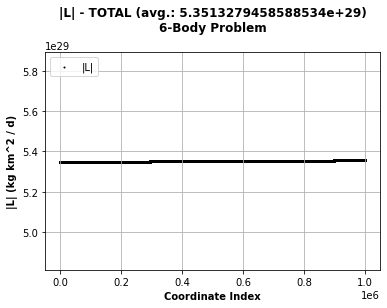

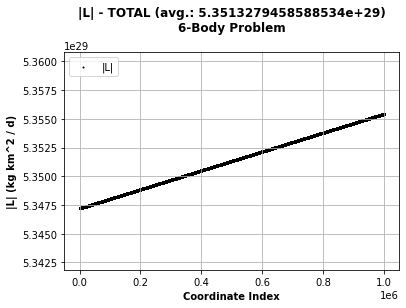

In [45]:
#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the angular momentum of each body.
plot_L_RK("PLUTO",    pl_L_RK, col_pl, aver_L_pl_RK)
plot_L_RK("CHARON",   ch_L_RK, col_ch, aver_L_ch_RK)
plot_L_RK("STYX",     st_L_RK, col_st, aver_L_st_RK)
plot_L_RK("NIX",      ni_L_RK, col_ni, aver_L_ni_RK)
plot_L_RK("KERBEROS", ke_L_RK, col_ke, aver_L_ke_RK)
plot_L_RK("HYDRA",    hy_L_RK, col_hy, aver_L_hy_RK)

#Plotting the PLS's total angular momentum.
fig = plt.figure()
plt.scatter(range(len(L_t_RK)), L_t_RK, c="black", s=1, label="|L|")
plt.title("|L| - TOTAL (avg.: " + str(aver_L_t_RK) + ")\n6-Body Problem\n", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("|L| (kg km^2 / d)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
plt.ylim([min(L_t_RK) - (min(L_t_RK)/10), max(L_t_RK) + (max(L_t_RK)/10)])   # Keeps the plot limits 10% above and under
plt.show()                                                                   # the highest and lowest values plotted.

#Zoom to notice the PLS's total angular momentum variation.
fig = plt.figure()
plt.scatter(range(len(L_t_RK)), L_t_RK, c="black", s=1, label="|L|")
plt.title("|L| - TOTAL (avg.: " + str(aver_L_t_RK) + ")\n6-Body Problem\n", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("|L| (kg km^2 / d)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
plt.ylim([min(L_t_RK) - (min(L_t_RK)/1000), max(L_t_RK) + (max(L_t_RK)/1000)])  # The limits are established to hace the zoom.
plt.show()


### Energy Conservation - 6-Body Problem

##### This model also presents a conservation of the energy around an average value.

In [49]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Universal Gravitational Constant (days).
G = 4.982174e-10  #(km^3 / kg d^2) 

#-------------------------------------------------------------------------------------------------------------------------------
#Function to calculate the distances.
def dist(x1, y1, z1, x2, y2, z2, x3, y3, z3, x4, y4, z4, x5, y5, z5, x6, y6, z6):
    ds1 = np.empty((len(x1), 5), float)
    ds2 = np.empty((len(x1), 5), float)
    ds3 = np.empty((len(x1), 5), float)      # Matrices to store each body´s distances to the other bodies.
    ds4 = np.empty((len(x1), 5), float)
    ds5 = np.empty((len(x1), 5), float)
    ds6 = np.empty((len(x1), 5), float)
    
    lim = tqdm(range(len(x1)), desc="Dist. Loop: ")
    for i in lim:
        #Pluto's Distances.
        d12 = math.sqrt((x2[i] - x1[i])**2 + (y2[i] - y1[i])**2 + (z2[i] - z1[i])**2)   # For each instant, it calculates
        d13 = math.sqrt((x3[i] - x1[i])**2 + (y3[i] - y1[i])**2 + (z3[i] - z1[i])**2)   # the distance from each body to
        d14 = math.sqrt((x4[i] - x1[i])**2 + (y4[i] - y1[i])**2 + (z4[i] - z1[i])**2)   # all other bodies.
        d15 = math.sqrt((x5[i] - x1[i])**2 + (y5[i] - y1[i])**2 + (z5[i] - z1[i])**2)
        d16 = math.sqrt((x6[i] - x1[i])**2 + (y6[i] - y1[i])**2 + (z6[i] - z1[i])**2)

        ds1[i,0], ds1[i,1], ds1[i,2], ds1[i,3], ds1[i,4] = d12, d13, d14, d15, d16   # Storing all distances in a line of
                                                                                     # the matrix.
        #Charon's Distances.
        d21 = d12
        d23 = math.sqrt((x3[i] - x2[i])**2 + (y3[i] - y2[i])**2 + (z3[i] - z2[i])**2)
        d24 = math.sqrt((x4[i] - x2[i])**2 + (y4[i] - y2[i])**2 + (z4[i] - z2[i])**2)
        d25 = math.sqrt((x5[i] - x2[i])**2 + (y5[i] - y2[i])**2 + (z5[i] - z2[i])**2)
        d26 = math.sqrt((x6[i] - x2[i])**2 + (y6[i] - y2[i])**2 + (z6[i] - z2[i])**2)
        
        ds2[i,0], ds2[i,1], ds2[i,2], ds2[i,3], ds2[i,4] = d21, d23, d24, d25, d26
        
        #Styx's Distances.
        d31 = d13
        d32 = d23
        d34 = math.sqrt((x4[i] - x3[i])**2 + (y4[i] - y3[i])**2 + (z4[i] - z3[i])**2)
        d35 = math.sqrt((x5[i] - x3[i])**2 + (y5[i] - y3[i])**2 + (z5[i] - z3[i])**2)
        d36 = math.sqrt((x6[i] - x3[i])**2 + (y6[i] - y3[i])**2 + (z6[i] - z3[i])**2)

        ds3[i,0], ds3[i,1], ds3[i,2], ds3[i,3], ds3[i,4] = d31, d32, d34, d35, d36
        
        #Nix's Distances.
        d41 = d14
        d42 = d24
        d43 = d34
        d45 = math.sqrt((x5[i] - x4[i])**2 + (y5[i] - y4[i])**2 + (z5[i] - z4[i])**2)
        d46 = math.sqrt((x6[i] - x4[i])**2 + (y6[i] - y4[i])**2 + (z6[i] - z4[i])**2)

        ds4[i,0], ds4[i,1], ds4[i,2], ds4[i,3], ds4[i,4] = d41, d42, d43, d45, d46
        
        #Kerberos' Distances.
        d51 = d15
        d52 = d25
        d53 = d35
        d54 = d45
        d56 = math.sqrt((x6[i] - x5[i])**2 + (y6[i] - y5[i])**2 + (z6[i] - z5[i])**2)

        ds5[i,0], ds5[i,1], ds5[i,2], ds5[i,3], ds5[i,4] = d51, d52, d53, d54, d56
        
        #Hydra's Distances.
        d61 = d16
        d62 = d26
        d63 = d36
        d64 = d46
        d65 = d56

        ds6[i,0], ds6[i,1], ds6[i,2], ds6[i,3], ds6[i,4] = d61, d62, d63, d64, d65

    return ds1, ds2, ds3, ds4, ds5, ds6     # Resturns all matrices.

#-------------------------------------------------------------------------------------------------------------------------------
#Function to calculate the energy.
def energy_RK(ds, v, m1, m2, m3, m4, m5, m6, title):
    T, U, E = np.empty((len(v)), float), np.empty((len(v)), float), np.empty((len(v)), float)

    lim = tqdm(range(len(v)), desc="Energy ("+title+"): ")
    for i in lim:        # The loop calculates the energy for each coordinate.
        T[i] = 0.5*m1*(v[i]**2)
        U[i] = ((-G*m1*m2) / (ds[i,0])) + ((-G*m1*m3) / (ds[i,1])) + ((-G*m1*m4) / (ds[i,2])) + ((-G*m1*m5) / (ds[i,3])) + ((-G*m1*m6) / (ds[i,4]))
        E[i] = T[i] + U[i]
        
    return T, U, E

#-------------------------------------------------------------------------------------------------------------------------------
#Function to plot the energy for each body.
def plot_E_RK(title, T, U, E, color):
    fig = plt.figure()
    ax1 = fig.add_subplot(111)  
    ax1.scatter(range(len(T)), T, c="salmon", s=10, label="|T|")
    ax1.scatter(range(len(U)), U, c="darkcyan", s=10, label="|U|")
    ax1.scatter(range(len(E)), E, c=color, s=1, label="|E|")
    plt.title("E,T and U - " + title, fontweight="bold", fontsize=12)
    plt.xlabel("Coordinate Index", fontweight="bold")
    plt.ylabel("E,T,U (kg km^2 / d^2)", fontweight="bold")
    plt.legend(loc='upper left')
    plt.grid()
    lim_inf = min(np.array([min(E), min(T), min(U)]))
    lim_sup = max(np.array([max(E), max(T), max(U)]))
    extra = max(np.array([abs(lim_inf), abs(lim_sup)]))
    plt.ylim([lim_inf - extra/10, lim_sup + extra/10])
    plt.show()


In [50]:
#-------------------------------------------------------------------------------------------------------------------------------
#Calculating the distances between the bodies.
pl_d_RK, ch_d_RK, st_d_RK, ni_d_RK, ke_d_RK, hy_d_RK = dist(pl_x_RK, pl_y_RK, pl_z_RK, ch_x_RK, ch_y_RK, ch_z_RK, st_x_RK, st_y_RK, st_z_RK, ni_x_RK, ni_y_RK, ni_z_RK, ke_x_RK, ke_y_RK, ke_z_RK, hy_x_RK, hy_y_RK, hy_z_RK)


Dist. Loop:   0%|          | 0/1000001 [00:00<?, ?it/s]

In [51]:
#-------------------------------------------------------------------------------------------------------------------------------
#Calculating the energies for each body.
pl_T_RK, pl_U_RK, pl_E_RK = energy_RK(pl_d_RK, pl_v_RK, pl_m, ch_m, st_m, ni_m, ke_m, hy_m, "Pl")
ch_T_RK, ch_U_RK, ch_E_RK = energy_RK(ch_d_RK, ch_v_RK, ch_m, pl_m, st_m, ni_m, ke_m, hy_m, "Ch")
st_T_RK, st_U_RK, st_E_RK = energy_RK(st_d_RK, st_v_RK, st_m, pl_m, ch_m, ni_m, ke_m, hy_m, "St")
ni_T_RK, ni_U_RK, ni_E_RK = energy_RK(ni_d_RK, ni_v_RK, ni_m, pl_m, ch_m, st_m, ke_m, hy_m, "Ni")
ke_T_RK, ke_U_RK, ke_E_RK = energy_RK(ke_d_RK, ke_v_RK, ke_m, pl_m, ch_m, st_m, ni_m, hy_m, "Ke")
hy_T_RK, hy_U_RK, hy_E_RK = energy_RK(hy_d_RK, hy_v_RK, hy_m, pl_m, ch_m, st_m, ni_m, ke_m, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#PLS's total energy.
T_t_RK, U_t_RK, E_t_RK = np.empty((len(pl_E_RK)), float), np.empty((len(pl_E_RK)), float), np.empty((len(pl_E_RK)), float)

lim =tqdm(range(len(pl_E_RK)), desc="TOTAL Energy: ")
for i in lim:
    T_t_RK[i] = pl_T_RK[i] + ch_T_RK[i] + st_T_RK[i] + ni_T_RK[i] + ke_T_RK[i] + hy_T_RK[i]
    U_t_RK[i] = pl_U_RK[i] + ch_U_RK[i] + st_U_RK[i] + ni_U_RK[i] + ke_U_RK[i] + hy_U_RK[i]
    E_t_RK[i] = pl_E_RK[i] + ch_E_RK[i] + st_E_RK[i] + ni_E_RK[i] + ke_E_RK[i] + hy_E_RK[i]


Energy (Pl):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energy (Ch):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energy (St):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energy (Ni):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energy (Ke):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energy (Hy):   0%|          | 0/1000001 [00:00<?, ?it/s]

TOTAL Energy:   0%|          | 0/1000001 [00:00<?, ?it/s]

ENERGY AVERAGES:
Pl:      T =2.8475712424231597e+28    U = -5.245246004667669e+29    E = -4.960488880425099e+29
Ch:      T =2.3378727804069093e+29    U = -5.2451257627590604e+29    E = -2.9072529823518e+29
St:      T =6.53851777825282e+23    U = -1.2936020010370754e+24    E = -6.397502232117412e+23
Ni:      T =3.4017993384681134e+24    U = -6.748591116562239e+24    E = -3.346791778094329e+24
Ke:      T =1.0179527607019776e+24    U = -2.0233780921864662e+24    E = -1.0054253314845002e+24
Hy:      T =2.718305101480549e+24    U = -5.4112616597726e+24    E = -2.6929565582921853e+24
Total:   T =2.6227078237390634e+29    U = -1.0490526535755063e+30    E = -7.867818712015808e+29


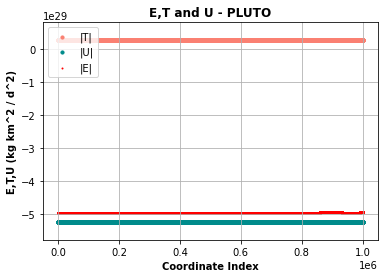

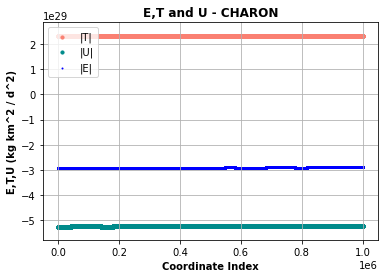

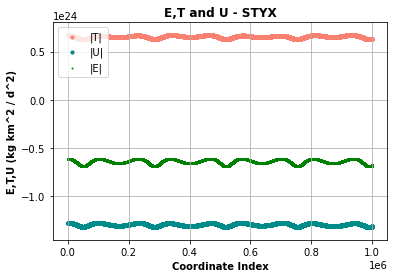

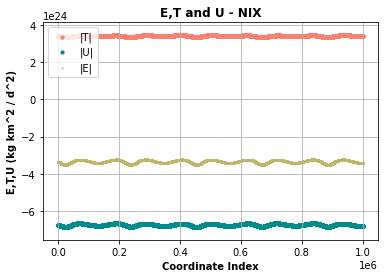

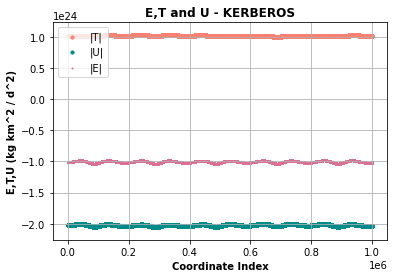

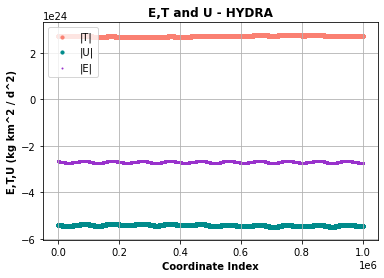

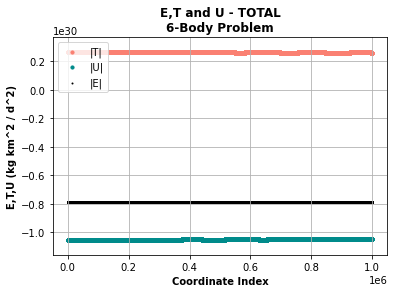

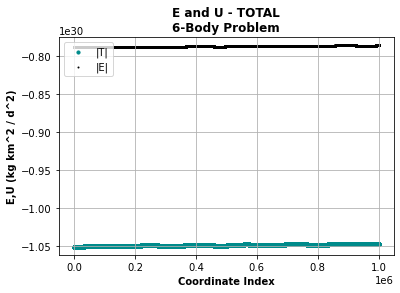

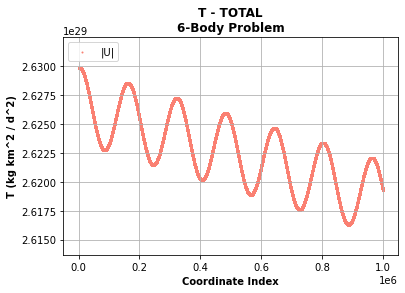

In [52]:
#-------------------------------------------------------------------------------------------------------------------------------
#Averages for each body´s energy.
print("ENERGY AVERAGES:")
print("Pl:      T =" + str(avg(pl_T_RK)) + "    U = " + str(avg(pl_U_RK)) + "    E = " +  str(avg(pl_E_RK)))
print("Ch:      T =" + str(avg(ch_T_RK)) + "    U = " + str(avg(ch_U_RK)) + "    E = " +  str(avg(ch_E_RK)))
print("St:      T =" + str(avg(st_T_RK)) + "    U = " + str(avg(st_U_RK)) + "    E = " +  str(avg(st_E_RK)))
print("Ni:      T =" + str(avg(ni_T_RK)) + "    U = " + str(avg(ni_U_RK)) + "    E = " +  str(avg(ni_E_RK)))
print("Ke:      T =" + str(avg(ke_T_RK)) + "    U = " + str(avg(ke_U_RK)) + "    E = " +  str(avg(ke_E_RK)))
print("Hy:      T =" + str(avg(hy_T_RK)) + "    U = " + str(avg(hy_U_RK)) + "    E = " +  str(avg(hy_E_RK)))
print("Total:   T =" + str(avg(T_t_RK))  + "    U = " + str(avg(U_t_RK))  + "    E = " +  str(avg(E_t_RK)))

#-------------------------------------------------------------------------------------------------------------------------------
#PLOTS:

#Plotting each body's energy.
plot_E_RK("PLUTO",    pl_T_RK, pl_U_RK, pl_E_RK, col_pl)
plot_E_RK("CHARON",   ch_T_RK, ch_U_RK, ch_E_RK, col_ch)
plot_E_RK("STYX",     st_T_RK, st_U_RK, st_E_RK, col_st)
plot_E_RK("NIX",      ni_T_RK, ni_U_RK, ni_E_RK, col_ni)
plot_E_RK("KERBEROS", ke_T_RK, ke_U_RK, ke_E_RK, col_ke)
plot_E_RK("HYDRA",    hy_T_RK, hy_U_RK, hy_E_RK, col_hy)

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the PLS's total energy.
fig = plt.figure()
ax1 = fig.add_subplot(111)  
ax1.scatter(range(len(T_t_RK)), T_t_RK, c="salmon", s=10, label="|T|")
ax1.scatter(range(len(U_t_RK)), U_t_RK, c="darkcyan", s=10, label="|U|")
ax1.scatter(range(len(E_t_RK)), E_t_RK, c="black", s=1, label="|E|")
plt.title("E,T and U - TOTAL\n6-Body Problem", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("E,T,U (kg km^2 / d^2)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
lim_inf = min(np.array([min(E_t_RK), min(T_t_RK), min(U_t_RK)]))
lim_sup = max(np.array([max(E_t_RK), max(T_t_RK), max(U_t_RK)]))
extra = max(np.array([abs(lim_inf), abs(lim_sup)]))
plt.ylim([lim_inf - extra/10, lim_sup + extra/10])
plt.show()

#Zoom to the complete and potential energy of the complete PLS.
fig = plt.figure()
ax1 = fig.add_subplot(111)  
ax1.scatter(range(len(U_t_RK)), U_t_RK, c="darkcyan", s=10, label="|T|")
ax1.scatter(range(len(E_t_RK)), E_t_RK, c="black", s=1, label="|E|")
plt.title("E and U - TOTAL\n6-Body Problem", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("E,U (kg km^2 / d^2)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
lim_inf = min(np.array([min(E_t_RK), min(U_t_RK)]))
lim_sup = max(np.array([max(E_t_RK), max(U_t_RK)]))
extra = max(np.array([abs(lim_inf), abs(lim_sup)]))
plt.ylim([lim_inf - extra/100, lim_sup + extra/100])
plt.show()

#Zoom to the kinetic energy of the complete PLS.
fig = plt.figure()
ax1 = fig.add_subplot(111)  
ax1.scatter(range(len(T_t_RK)), T_t_RK, c="salmon", s=1, label="|U|")
plt.title("T - TOTAL\n6-Body Problem", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("T (kg km^2 / d^2)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
plt.ylim([min(T_t_RK) - abs(min(T_t_RK)/1000), max(T_t_RK) + abs(max(T_t_RK)/1000)])
plt.show()


## Model 3.1: Oblate Pl and Ch (Kepler's Problem - Fixed Pl)

##### Now we add the consideration that Pluto and Charon are not perfect spheres and we approximate their shape as an oblate ellipsoid. The potential changes, since we have to add an extra term obtained by an approximation using spherical harmonics. We go back to the consideration of Kepler's problem. In this case, Pluto is fixed at the center, as if its mass is considerably larger than that of every other moon.

### Generating the Data - Oblate Pl and Ch (Kepler's Problem - Fixed Pl)

##### Previously we obtained the parameters to Kepler's problem's  solution using the previous datafor the energy and angular momentum. However, since the potential has changed, the data is now numerically generated.

##### It is important to remember that the masses are actually comparable, so the expected result is not an ellipse.

In [61]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to get the unitary vector.
def unitary(x, y, z):
    d = mag(x, y, z)
    return ([x/d, y/d, z/d])

#Function for the scalar product.
def prod_dot(vec1, vec2):
    return (vec1[0]*vec2[0]) + (vec1[1]*vec2[1]) + (vec1[2]*vec2[2])

#Function for the vector product.
def prod_cross(vec1, vec2):
    x = (vec1[1]*vec2[2] - vec1[2]*vec2[1])
    y = (vec1[2]*vec2[0] - vec1[0]*vec2[2])
    z = (vec1[0]*vec2[1] - vec1[1]*vec2[0])
    r = mag(x, y, z)
    return ([x, y, z, r])

#-------------------------------------------------------------------------------------------------------------------------------
#Generating a new coordinate system whose XY plane is the equator plane (Pl or Ch).
def plane_equator(RA, dec):
    RA = deg_rad(RA)      # Converting to radians.
    dec = deg_rad(dec)

    #Generating the new coordinate system aligned with the equator.
    n = ([math.sin(dec)*math.cos(RA), math.sin(dec)*math.sin(RA), math.cos(dec), 1])    # Calculating new "z" axis.
    
    xp = ([0.5, 0.5, (-n[0]/n[2])*0.5 + (-n[1]/n[2])*0.5])    # Creating a new arbitrary "x" axis.
    xp = np.append(xp, mag(xp[0], xp[1], xp[2]))
    xp = xp/xp[3]
    yp = prod_cross(n, xp)                                    # Calulating the new "y" axis from the other two axes.
    A = ([[xp[0], yp[0], n[0]], [xp[1], yp[1], n[1]], [xp[2], yp[2], n[2]]])  # Transformation matrix.
    Ainv = np.linalg.inv(A)                                                   # Inverse transformation matrix.
    
    return A, Ainv

#Function to convert from degrees to radians.
def deg_rad(ang):
    return ang*math.pi/180

#Function to convert from radians to degrees.
def rad_deg(ang):
    return ang*180/math.pi

#-------------------------------------------------------------------------------------------------------------------------------
#Function for the acceleration for Charon.
def func_kepler_OPC_ch(Apl, Ainvpl, Ach, Ainvch, m, x, y, z):
    mu = G*pl_m*m
                                          # First, the perturbation caused by Pl is calculated.
    rn = Ainvpl.dot([x, y, z])            # The position vector in the new system is calculated.
    r = mag(rn[0], rn[1], rn[2])
    ru = unitary(rn[0], rn[1], rn[2])    # The unitary vector in the radial direction is calculated.
    
    ax_p_pl = - (3/2)*(J2_pl/m)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 5*(ru[2]**2))*ru[0]    # The perturbative terms
    ay_p_pl = - (3/2)*(J2_pl/m)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 5*(ru[2]**2))*ru[1]    # are calculated in
    az_p_pl = - (3/2)*(J2_pl/m)*(mu/(r**2))*((r_eq_pl/r)**2)*(3 - 5*(ru[2]**2))*ru[2]    # each component.
    
    a_p_pl = Apl.dot([ax_p_pl, ay_p_pl, az_p_pl])   # The perturbations are added to an array.

    rn = Ainvch.dot([-x, -y, -z])              # Same process for Charon.
    r = mag(rn[0], rn[1], rn[2])
    ru = unitary(rn[0], rn[1], rn[2])
    
    ax_p_ch = - (3/2)*(J2_ch/pl_m)*(mu/(r**2))*((r_eq_ch/r)**2)*(1 - 5*(ru[2]**2))*ru[0]
    ay_p_ch = - (3/2)*(J2_ch/pl_m)*(mu/(r**2))*((r_eq_ch/r)**2)*(1 - 5*(ru[2]**2))*ru[1]
    az_p_ch = - (3/2)*(J2_ch/pl_m)*(mu/(r**2))*((r_eq_ch/r)**2)*(3 - 5*(ru[2]**2))*ru[2]
    
    a_p_ch = Ach.dot([ax_p_ch, ay_p_ch, az_p_ch])
    
    ax = - (((G*pl_m) / (r**3))*x) + a_p_pl[0] - a_p_ch[0]   # All perturbations are added to the acceleration.
    ay = - (((G*pl_m) / (r**3))*y) + a_p_pl[1] - a_p_ch[1]
    az = - (((G*pl_m) / (r**3))*z) + a_p_pl[2] - a_p_ch[2]
    
    return ax, ay, az

#Function for the acceleration for the rest of moons.
def func_kepler_OPC(A, Ainv, m, x, y, z):
    mu = G*pl_m*m
    
    rn = Ainv.dot([x, y, z])                # Same process but without considering Charon's perturbation.
    r = mag(rn[0], rn[1], rn[2])
    ru = unitary(rn[0], rn[1], rn[2])
    
    ax_p = - (3/2)*(J2_pl/m)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 5*(ru[2]**2))*ru[0]
    ay_p = - (3/2)*(J2_pl/m)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 5*(ru[2]**2))*ru[1]
    az_p = - (3/2)*(J2_pl/m)*(mu/(r**2))*((r_eq_pl/r)**2)*(3 - 5*(ru[2]**2))*ru[2]
    
    a_p = A.dot([ax_p, ay_p, az_p])

    ax = - (((G*pl_m) / (r**3))*x) + a_p[0]
    ay = - (((G*pl_m) / (r**3))*y) + a_p[1]
    az = - (((G*pl_m) / (r**3))*z) + a_p[2]
    
    return ax, ay, az

#-------------------------------------------------------------------------------------------------------------------------------
#Function to plot each trajectory.
def plot_orbit_kepler(title, xs, ys, zs, color, lbl):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title(title+"'s Trajectory", fontweight="bold", fontsize=14)
    ax.scatter(0, 0, 0, marker="x", c="red", label="Pl");
    ax.scatter(xs, ys, zs, marker="x", c=color, s=1, label=lbl);
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    fig.set_size_inches(8, 8)
    plt.show()


In [58]:
#-------------------------------------------------------------------------------------------------------------------------------
#Universal Gravitational Constant (days).
G = 4.982174e-10  #(km^3 / kg d^2)

#-------------------------------------------------------------------------------------------------------------------------------
#Transformation matrices for the coordinate system aligned to the body's equator.
A_pl, Ainv_pl = plane_equator(RA_pl, dec_pl)
A_pl, Ainv_pl = np.array(A_pl), np.array(Ainv_pl)

A_ch, Ainv_ch = plane_equator(RA_ch, dec_ch)
A_ch, Ainv_ch = np.array(A_ch), np.array(Ainv_ch)

#-------------------------------------------------------------------------------------------------------------------------------
#Step settings.

N = 1000000      # Amount of iterations.
a = 0            # Initial time = 0.
b = 60           # Amount of days.

h_RK2 = (b-a)/N      # Step

t_RK2 = np.empty((N+1), float)
t_RK2[0] = a        # Array to store time.

#-------------------------------------------------------------------------------------------------------------------------------
#Declaring the arrays.

pl_x_RK2, pl_y_RK2, pl_z_RK2 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ch_x_RK2, ch_y_RK2, ch_z_RK2 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
st_x_RK2, st_y_RK2, st_z_RK2 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ni_x_RK2, ni_y_RK2, ni_z_RK2 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ke_x_RK2, ke_y_RK2, ke_z_RK2 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
hy_x_RK2, hy_y_RK2, hy_z_RK2 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)

pl_vx_RK2, pl_vy_RK2, pl_vz_RK2 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ch_vx_RK2, ch_vy_RK2, ch_vz_RK2 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
st_vx_RK2, st_vy_RK2, st_vz_RK2 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ni_vx_RK2, ni_vy_RK2, ni_vz_RK2 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ke_vx_RK2, ke_vy_RK2, ke_vz_RK2 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
hy_vx_RK2, hy_vy_RK2, hy_vz_RK2 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)

#-------------------------------------------------------------------------------------------------------------------------------
#Initial Conditions (00:00:00 1/Ene/2021).

#Initial coordinates.
pl_x_RK2[0], pl_y_RK2[0], pl_z_RK2[0] = pl_r[0,0], pl_r[0,1], pl_r[0,2]
ch_x_RK2[0], ch_y_RK2[0], ch_z_RK2[0] = ch_r[0,0], ch_r[0,1], ch_r[0,2]
st_x_RK2[0], st_y_RK2[0], st_z_RK2[0] = st_r[0,0], st_r[0,1], st_r[0,2]
ni_x_RK2[0], ni_y_RK2[0], ni_z_RK2[0] = ni_r[0,0], ni_r[0,1], ni_r[0,2]
ke_x_RK2[0], ke_y_RK2[0], ke_z_RK2[0] = ke_r[0,0], ke_r[0,1], ke_r[0,2]
hy_x_RK2[0], hy_y_RK2[0], hy_z_RK2[0] = hy_r[0,0], hy_r[0,1], hy_r[0,2]

#Initial velocities.
n = 86400   # Converting from sec. to days.

pl_vx_RK2[0], pl_vy_RK2[0], pl_vz_RK2[0] = n*pl_v[0,0], n*pl_v[0,1], n*pl_v[0,2]
ch_vx_RK2[0], ch_vy_RK2[0], ch_vz_RK2[0] = n*ch_v[0,0], n*ch_v[0,1], n*ch_v[0,2]
st_vx_RK2[0], st_vy_RK2[0], st_vz_RK2[0] = n*st_v[0,0], n*st_v[0,1], n*st_v[0,2]
ni_vx_RK2[0], ni_vy_RK2[0], ni_vz_RK2[0] = n*ni_v[0,0], n*ni_v[0,1], n*ni_v[0,2]
ke_vx_RK2[0], ke_vy_RK2[0], ke_vz_RK2[0] = n*ke_v[0,0], n*ke_v[0,1], n*ke_v[0,2]
hy_vx_RK2[0], hy_vy_RK2[0], hy_vz_RK2[0] = n*hy_v[0,0], n*hy_v[0,1], n*hy_v[0,2]

#-------------------------------------------------------------------------------------------------------------------------------
#Loops to calculate each moon's trajectory.

#Charon
lim = tqdm(range(int(N)), desc="RK Loop (Ch): ")
for i in lim:
    # Generating the "k" constants for the velocity.
    k1x, k1y, k1z = func_kepler_OPC_ch(A_pl, Ainv_pl, A_ch, Ainv_ch, ch_m, ch_x_RK2[i], ch_y_RK2[i], ch_z_RK2[i])
    k1x, k1y, k1z = h_RK2*k1x, h_RK2*k1y, h_RK2*k1z
    k2x, k2y, k2z = func_kepler_OPC_ch(A_pl, Ainv_pl, A_ch, Ainv_ch, ch_m, ch_x_RK2[i] + k1x/2, ch_y_RK2[i] + k1y/2, ch_z_RK2[i] + k1z/2)
    k2x, k2y, k2z = h_RK2*k2x, h_RK2*k2y, h_RK2*k2z
    k3x, k3y, k3z = func_kepler_OPC_ch(A_pl, Ainv_pl, A_ch, Ainv_ch, ch_m, ch_x_RK2[i] + k2x/2, ch_y_RK2[i] + k2y/2, ch_z_RK2[i] + k2z/2)
    k3x, k3y, k3z = h_RK2*k3x, h_RK2*k3y, h_RK2*k3z
    k4x, k4y, k4z = func_kepler_OPC_ch(A_pl, Ainv_pl, A_ch, Ainv_ch, ch_m, ch_x_RK2[i] + k3x, ch_y_RK2[i] + k3y, ch_z_RK2[i] + k3z)
    k4x, k4y, k4z = h_RK2*k4x, h_RK2*k4y, h_RK2*k4z
    
    # Generating the next velocity value.
    ch_vx_RK2[i+1] = ch_vx_RK2[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ch_vy_RK2[i+1] = ch_vy_RK2[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ch_vz_RK2[i+1] = ch_vz_RK2[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    # Generating the "k" constants for the position.
    k1x, k1y, k1z = h_RK2*ch_vx_RK2[i], h_RK2*ch_vy_RK2[i], h_RK2*ch_vz_RK2[i]
    k2x, k2y, k2z = h_RK2*(ch_vx_RK2[i] + k1x/2), h_RK2*(ch_vy_RK2[i] + k1y/2), h_RK2*(ch_vz_RK2[i] + k1z/2)
    k3x, k3y, k3z = h_RK2*(ch_vx_RK2[i] + k2x/2), h_RK2*(ch_vy_RK2[i] + k2y/2), h_RK2*(ch_vz_RK2[i] + k2z/2)
    k4x, k4y, k4z = h_RK2*(ch_vx_RK2[i] + k3x), h_RK2*(ch_vy_RK2[i] + k3y), h_RK2*(ch_vz_RK2[i] + k3z)

    # Generating the next position value.
    ch_x_RK2[i+1] = ch_x_RK2[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ch_y_RK2[i+1] = ch_y_RK2[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ch_z_RK2[i+1] = ch_z_RK2[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)

    # Updating time.
    t_RK2[i+1] = t_RK2[i] + h_RK2
    

#Styx
lim = tqdm(range(int(N)), desc="RK Loop (St): ")
for i in lim:
    k1x, k1y, k1z = func_kepler_OPC(A_pl, Ainv_pl, st_m, st_x_RK2[i], st_y_RK2[i], st_z_RK2[i])
    k1x, k1y, k1z = h_RK2*k1x, h_RK2*k1y, h_RK2*k1z
    k2x, k2y, k2z = func_kepler_OPC(A_pl, Ainv_pl, st_m, st_x_RK2[i] + k1x/2, st_y_RK2[i] + k1y/2, st_z_RK2[i] + k1z/2)
    k2x, k2y, k2z = h_RK2*k2x, h_RK2*k2y, h_RK2*k2z
    k3x, k3y, k3z = func_kepler_OPC(A_pl, Ainv_pl, st_m, st_x_RK2[i] + k2x/2, st_y_RK2[i] + k2y/2, st_z_RK2[i] + k2z/2)
    k3x, k3y, k3z = h_RK2*k3x, h_RK2*k3y, h_RK2*k3z
    k4x, k4y, k4z = func_kepler_OPC(A_pl, Ainv_pl, st_m, st_x_RK2[i] + k3x, st_y_RK2[i] + k3y, st_z_RK2[i] + k3z)
    k4x, k4y, k4z = h_RK2*k4x, h_RK2*k4y, h_RK2*k4z
    
    st_vx_RK2[i+1] = st_vx_RK2[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    st_vy_RK2[i+1] = st_vy_RK2[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    st_vz_RK2[i+1] = st_vz_RK2[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK2*st_vx_RK2[i], h_RK2*st_vy_RK2[i], h_RK2*st_vz_RK2[i]
    k2x, k2y, k2z = h_RK2*(st_vx_RK2[i] + k1x/2), h_RK2*(st_vy_RK2[i] + k1y/2), h_RK2*(st_vz_RK2[i] + k1z/2)
    k3x, k3y, k3z = h_RK2*(st_vx_RK2[i] + k2x/2), h_RK2*(st_vy_RK2[i] + k2y/2), h_RK2*(st_vz_RK2[i] + k2z/2)
    k4x, k4y, k4z = h_RK2*(st_vx_RK2[i] + k3x), h_RK2*(st_vy_RK2[i] + k3y), h_RK2*(st_vz_RK2[i] + k3z)

    st_x_RK2[i+1] = st_x_RK2[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    st_y_RK2[i+1] = st_y_RK2[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    st_z_RK2[i+1] = st_z_RK2[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
#Nix
lim = tqdm(range(int(N)), desc="RK Loop (Ni): ")
for i in lim:
    k1x, k1y, k1z = func_kepler_OPC(A_pl, Ainv_pl, ni_m, ni_x_RK2[i], ni_y_RK2[i], ni_z_RK2[i])
    k1x, k1y, k1z = h_RK2*k1x, h_RK2*k1y, h_RK2*k1z
    k2x, k2y, k2z = func_kepler_OPC(A_pl, Ainv_pl, ni_m, ni_x_RK2[i] + k1x/2, ni_y_RK2[i] + k1y/2, ni_z_RK2[i] + k1z/2)
    k2x, k2y, k2z = h_RK2*k2x, h_RK2*k2y, h_RK2*k2z
    k3x, k3y, k3z = func_kepler_OPC(A_pl, Ainv_pl, ni_m, ni_x_RK2[i] + k2x/2, ni_y_RK2[i] + k2y/2, ni_z_RK2[i] + k2z/2)
    k3x, k3y, k3z = h_RK2*k3x, h_RK2*k3y, h_RK2*k3z
    k4x, k4y, k4z = func_kepler_OPC(A_pl, Ainv_pl, ni_m, ni_x_RK2[i] + k3x, ni_y_RK2[i] + k3y, ni_z_RK2[i] + k3z)
    k4x, k4y, k4z = h_RK2*k4x, h_RK2*k4y, h_RK2*k4z
    
    ni_vx_RK2[i+1] = ni_vx_RK2[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ni_vy_RK2[i+1] = ni_vy_RK2[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ni_vz_RK2[i+1] = ni_vz_RK2[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK2*ni_vx_RK2[i], h_RK2*ni_vy_RK2[i], h_RK2*ni_vz_RK2[i]
    k2x, k2y, k2z = h_RK2*(ni_vx_RK2[i] + k1x/2), h_RK2*(ni_vy_RK2[i] + k1y/2), h_RK2*(ni_vz_RK2[i] + k1z/2)
    k3x, k3y, k3z = h_RK2*(ni_vx_RK2[i] + k2x/2), h_RK2*(ni_vy_RK2[i] + k2y/2), h_RK2*(ni_vz_RK2[i] + k2z/2)
    k4x, k4y, k4z = h_RK2*(ni_vx_RK2[i] + k3x), h_RK2*(ni_vy_RK2[i] + k3y), h_RK2*(ni_vz_RK2[i] + k3z)

    ni_x_RK2[i+1] = ni_x_RK2[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ni_y_RK2[i+1] = ni_y_RK2[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ni_z_RK2[i+1] = ni_z_RK2[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
#Kerberos
lim = tqdm(range(int(N)), desc="RK Loop (Ke): ")
for i in lim:
    k1x, k1y, k1z = func_kepler_OPC(A_pl, Ainv_pl, ke_m, ke_x_RK2[i], ke_y_RK2[i], ke_z_RK2[i])
    k1x, k1y, k1z = h_RK2*k1x, h_RK2*k1y, h_RK2*k1z
    k2x, k2y, k2z = func_kepler_OPC(A_pl, Ainv_pl, ke_m, ke_x_RK2[i] + k1x/2, ke_y_RK2[i] + k1y/2, ke_z_RK2[i] + k1z/2)
    k2x, k2y, k2z = h_RK2*k2x, h_RK2*k2y, h_RK2*k2z
    k3x, k3y, k3z = func_kepler_OPC(A_pl, Ainv_pl, ke_m, ke_x_RK2[i] + k2x/2, ke_y_RK2[i] + k2y/2, ke_z_RK2[i] + k2z/2)
    k3x, k3y, k3z = h_RK2*k3x, h_RK2*k3y, h_RK2*k3z
    k4x, k4y, k4z = func_kepler_OPC(A_pl, Ainv_pl, ke_m, ke_x_RK2[i] + k3x, ke_y_RK2[i] + k3y, ke_z_RK2[i] + k3z)
    k4x, k4y, k4z = h_RK2*k4x, h_RK2*k4y, h_RK2*k4z
    
    ke_vx_RK2[i+1] = ke_vx_RK2[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ke_vy_RK2[i+1] = ke_vy_RK2[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ke_vz_RK2[i+1] = ke_vz_RK2[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK2*ke_vx_RK2[i], h_RK2*ke_vy_RK2[i], h_RK2*ke_vz_RK2[i]
    k2x, k2y, k2z = h_RK2*(ke_vx_RK2[i] + k1x/2), h_RK2*(ke_vy_RK2[i] + k1y/2), h_RK2*(ke_vz_RK2[i] + k1z/2)
    k3x, k3y, k3z = h_RK2*(ke_vx_RK2[i] + k2x/2), h_RK2*(ke_vy_RK2[i] + k2y/2), h_RK2*(ke_vz_RK2[i] + k2z/2)
    k4x, k4y, k4z = h_RK2*(ke_vx_RK2[i] + k3x), h_RK2*(ke_vy_RK2[i] + k3y), h_RK2*(ke_vz_RK2[i] + k3z)

    ke_x_RK2[i+1] = ke_x_RK2[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ke_y_RK2[i+1] = ke_y_RK2[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ke_z_RK2[i+1] = ke_z_RK2[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
#Hydra
lim = tqdm(range(int(N)), desc="RK Loop (Hy): ")
for i in lim:
    k1x, k1y, k1z = func_kepler_OPC(A_pl, Ainv_pl, hy_m, hy_x_RK2[i], hy_y_RK2[i], hy_z_RK2[i])
    k1x, k1y, k1z = h_RK2*k1x, h_RK2*k1y, h_RK2*k1z
    k2x, k2y, k2z = func_kepler_OPC(A_pl, Ainv_pl, hy_m, hy_x_RK2[i] + k1x/2, hy_y_RK2[i] + k1y/2, hy_z_RK2[i] + k1z/2)
    k2x, k2y, k2z = h_RK2*k2x, h_RK2*k2y, h_RK2*k2z
    k3x, k3y, k3z = func_kepler_OPC(A_pl, Ainv_pl, hy_m, hy_x_RK2[i] + k2x/2, hy_y_RK2[i] + k2y/2, hy_z_RK2[i] + k2z/2)
    k3x, k3y, k3z = h_RK2*k3x, h_RK2*k3y, h_RK2*k3z
    k4x, k4y, k4z = func_kepler_OPC(A_pl, Ainv_pl, hy_m, hy_x_RK2[i] + k3x, hy_y_RK2[i] + k3y, hy_z_RK2[i] + k3z)
    k4x, k4y, k4z = h_RK2*k4x, h_RK2*k4y, h_RK2*k4z
    
    hy_vx_RK2[i+1] = hy_vx_RK2[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    hy_vy_RK2[i+1] = hy_vy_RK2[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    hy_vz_RK2[i+1] = hy_vz_RK2[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK2*hy_vx_RK2[i], h_RK2*hy_vy_RK2[i], h_RK2*hy_vz_RK2[i]
    k2x, k2y, k2z = h_RK2*(hy_vx_RK2[i] + k1x/2), h_RK2*(hy_vy_RK2[i] + k1y/2), h_RK2*(hy_vz_RK2[i] + k1z/2)
    k3x, k3y, k3z = h_RK2*(hy_vx_RK2[i] + k2x/2), h_RK2*(hy_vy_RK2[i] + k2y/2), h_RK2*(hy_vz_RK2[i] + k2z/2)
    k4x, k4y, k4z = h_RK2*(hy_vx_RK2[i] + k3x), h_RK2*(hy_vy_RK2[i] + k3y), h_RK2*(hy_vz_RK2[i] + k3z)

    hy_x_RK2[i+1] = hy_x_RK2[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    hy_y_RK2[i+1] = hy_y_RK2[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    hy_z_RK2[i+1] = hy_z_RK2[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
#-------------------------------------------------------------------------------------------------------------------------------
#Initial approximation for the elliptic trajectory's parameters.

#The same fucntions used to analyze the JPL/NASA data and the 6BP model are used.

#Calculating the distance from each body to the origin.
ch_r_RK2 = radii(ch_x_RK2, ch_y_RK2, ch_z_RK2, "Ch r")
st_r_RK2 = radii(st_x_RK2, st_y_RK2, st_z_RK2, "St r")
ni_r_RK2 = radii(ni_x_RK2, ni_y_RK2, ni_z_RK2, "Ni r")
ke_r_RK2 = radii(ke_x_RK2, ke_y_RK2, ke_z_RK2, "Ke r")
hy_r_RK2 = radii(hy_x_RK2, hy_y_RK2, hy_z_RK2, "Hy r")

#Calculating the total velocity for each point for each body.
ch_v_RK2 = radii(ch_vx_RK2, ch_vy_RK2, ch_vz_RK2, "Ch v")
st_v_RK2 = radii(st_vx_RK2, st_vy_RK2, st_vz_RK2, "St v")
ni_v_RK2 = radii(ni_vx_RK2, ni_vy_RK2, ni_vz_RK2, "Ni v")
ke_v_RK2 = radii(ke_vx_RK2, ke_vy_RK2, ke_vz_RK2, "Ke v")
hy_v_RK2 = radii(hy_vx_RK2, hy_vy_RK2, hy_vz_RK2, "Hy v")

#Calculating the approximated parameters for each body (assuming an elliptic trajectory).
ch_a_RK2, ch_b_RK2, ch_c_RK2, ch_e_RK2 = param_RK(ch_r_RK2)
st_a_RK2, st_b_RK2, st_c_RK2, st_e_RK2 = param_RK(st_r_RK2)
ni_a_RK2, ni_b_RK2, ni_c_RK2, ni_e_RK2 = param_RK(ni_r_RK2)
ke_a_RK2, ke_b_RK2, ke_c_RK2, ke_e_RK2 = param_RK(ke_r_RK2)
hy_a_RK2, hy_b_RK2, hy_c_RK2, hy_e_RK2 = param_RK(hy_r_RK2)


RK Loop (Ch):   0%|          | 0/1000000 [00:00<?, ?it/s]

RK Loop (St):   0%|          | 0/1000000 [00:00<?, ?it/s]

RK Loop (Ni):   0%|          | 0/1000000 [00:00<?, ?it/s]

RK Loop (Ke):   0%|          | 0/1000000 [00:00<?, ?it/s]

RK Loop (Hy):   0%|          | 0/1000000 [00:00<?, ?it/s]

Ch r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

St r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ni r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ke r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Hy r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ch v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

St v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ni v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ke v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Hy v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

ELLIPTIC TRAJECTORIES' APPROXIMATED PARAMETERS:
Charon:   \ a: 14652.771550 \ b: 14313.681742 \ c: 3134.043568 \ e: 0.213887
Styx:     \ a: 50450.657928 \ b: 49791.717986 \ c: 8127.343068 \ e: 0.161095
Nix:      \ a: 56383.164181 \ b: 55871.907025 \ c: 7575.698551 \ e: 0.134361
Kerberos: \ a: 66377.136858 \ b: 65829.380083 \ c: 8509.818759 \ e: 0.128204
Hydra:    \ a: 74612.055486 \ b: 73944.959196 \ c: 9954.990373 \ e: 0.133423


Points to Plot (Ch x):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (St x):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Ni x):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Ke x):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Hy x):   0%|          | 0/1000 [00:00<?, ?it/s]

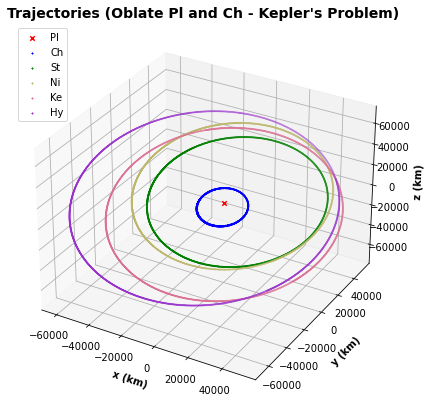

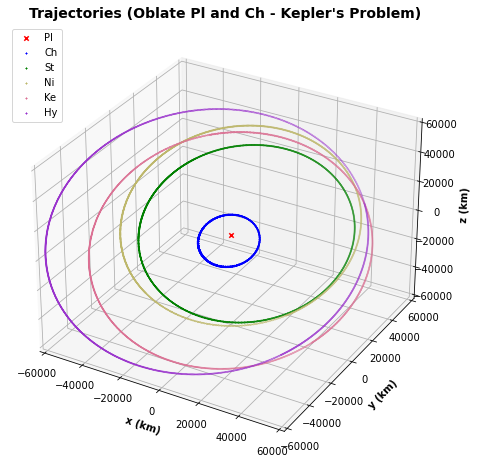

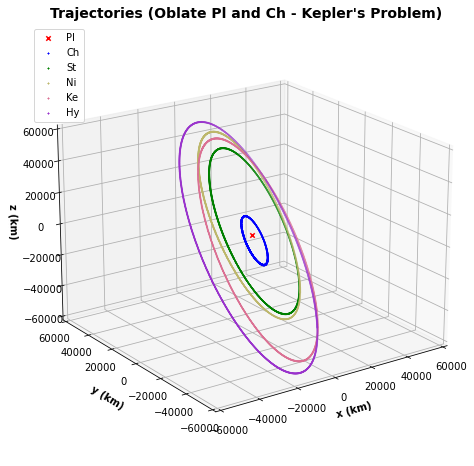

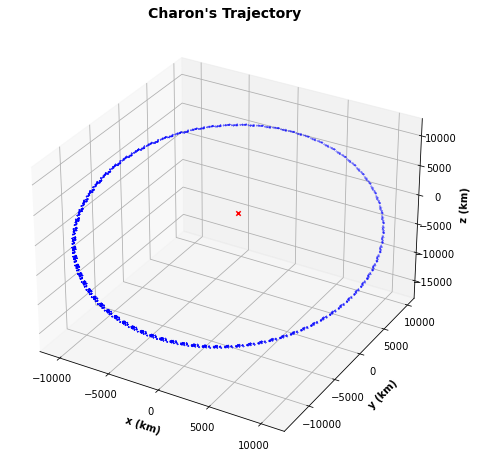

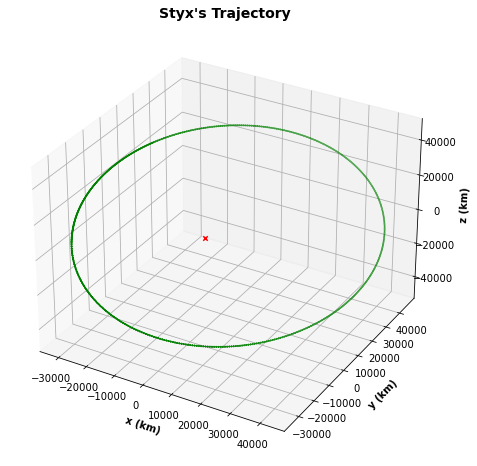

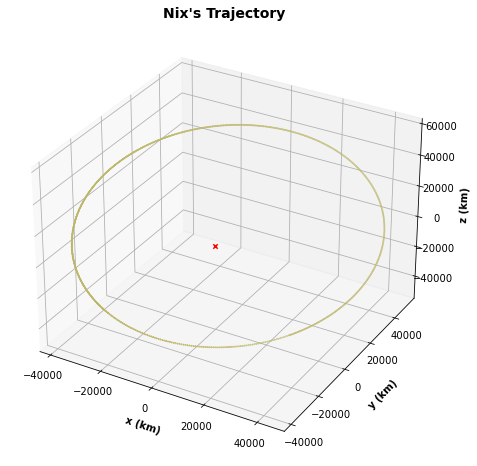

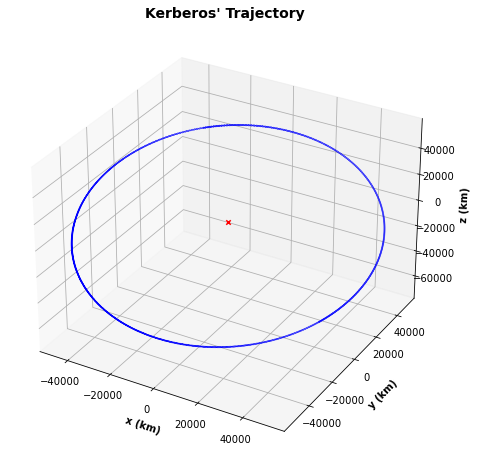

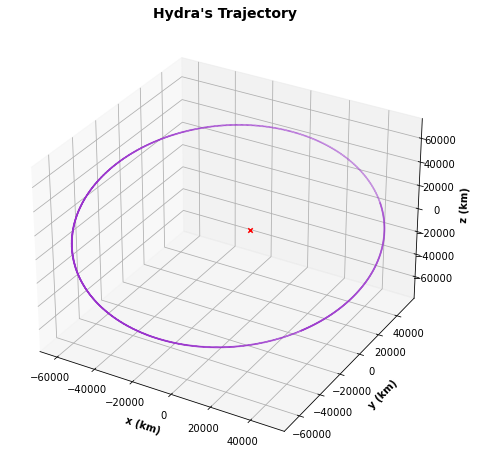

In [62]:
#-------------------------------------------------------------------------------------------------------------------------------
#Printing the approximated parameters for each body´s ellipse.
print("ELLIPTIC TRAJECTORIES' APPROXIMATED PARAMETERS:")
print("Charon:   \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (ch_a_RK2, ch_b_RK2, ch_c_RK2, ch_e_RK2))
print("Styx:     \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (st_a_RK2, st_b_RK2, st_c_RK2, st_e_RK2))
print("Nix:      \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (ni_a_RK2, ni_b_RK2, ni_c_RK2, ni_e_RK2))
print("Kerberos: \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (ke_a_RK2, ke_b_RK2, ke_c_RK2, ke_e_RK2))
print("Hydra:    \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (hy_a_RK2, hy_b_RK2, hy_c_RK2, hy_e_RK2))

#     NOTE: These approximations were obtained only to follow the established method of analysis. Since we know that the
#           resulting trajectory is NOT an ellipse, these parameters lose their value and meaning. With the plots created
#           here, the resulting shape for each body's trajectory can be seen.

#-------------------------------------------------------------------------------------------------------------------------------
#PLOTS:

#Loop to plot only certain points (to ease the graphcator's job).

T = 1000                         # Amount of elements to plot (T=1000 means plotting every 1000).

ch_r_RK2_g = points_plot(h_RK2, T, ch_x_RK2, ch_y_RK2, ch_z_RK2, "Ch x")
st_r_RK2_g = points_plot(h_RK2, T, st_x_RK2, st_y_RK2, st_z_RK2, "St x")
ni_r_RK2_g = points_plot(h_RK2, T, ni_x_RK2, ni_y_RK2, ni_z_RK2, "Ni x")
ke_r_RK2_g = points_plot(h_RK2, T, ke_x_RK2, ke_y_RK2, ke_z_RK2, "Ke x")
hy_r_RK2_g = points_plot(h_RK2, T, hy_x_RK2, hy_y_RK2, hy_z_RK2, "Hy x")

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting all orbits together.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Trajectories (Oblate Pl and Ch - Kepler's Problem)", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="red", label = "Pl");
ax.scatter(ch_r_RK2_g[:,0], ch_r_RK2_g[:,1], ch_r_RK2_g[:,2], marker="x", c=col_ch, s=1, label="Ch");
ax.scatter(st_r_RK2_g[:,0], st_r_RK2_g[:,1], st_r_RK2_g[:,2], marker="x", c=col_st, s=1, label="St");
ax.scatter(ni_r_RK2_g[:,0], ni_r_RK2_g[:,1], ni_r_RK2_g[:,2], marker="x", c=col_ni, s=1, label="Ni");
ax.scatter(ke_r_RK2_g[:,0], ke_r_RK2_g[:,1], ke_r_RK2_g[:,2], marker="x", c=col_ke, s=1, label="Ke");
ax.scatter(hy_r_RK2_g[:,0], hy_r_RK2_g[:,1], hy_r_RK2_g[:,2], marker="x", c=col_hy, s=1, label="Hy");
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
ax.legend(loc='upper left')
fig.set_size_inches(7, 7)
plt.show()

#Plotting all orbits together with axes at the same scale.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Trajectories (Oblate Pl and Ch - Kepler's Problem)", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="red", label = "Pl");
ax.scatter(ch_r_RK2_g[:,0], ch_r_RK2_g[:,1], ch_r_RK2_g[:,2], marker="x", c=col_ch, label="Ch", s=1);
ax.scatter(st_r_RK2_g[:,0], st_r_RK2_g[:,1], st_r_RK2_g[:,2], marker="x", c=col_st, label="St", s=1);
ax.scatter(ni_r_RK2_g[:,0], ni_r_RK2_g[:,1], ni_r_RK2_g[:,2], marker="x", c=col_ni, label="Ni", s=1);
ax.scatter(ke_r_RK2_g[:,0], ke_r_RK2_g[:,1], ke_r_RK2_g[:,2], marker="x", c=col_ke, label="Ke", s=1);
ax.scatter(hy_r_RK2_g[:,0], hy_r_RK2_g[:,1], hy_r_RK2_g[:,2], marker="x", c=col_hy, label="Hy", s=1);
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
ax.set_xlim3d(-60000, 60000)
ax.set_ylim3d(-60000, 60000)
ax.set_zlim3d(-60000, 60000)
ax.legend(loc='upper left')
fig.set_size_inches(8, 8)
plt.show()

#Plotting all orbits together, from a different perspective.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Trajectories (Oblate Pl and Ch - Kepler's Problem)", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="red", label = "Pl");
ax.scatter(ch_r_RK2_g[:,0], ch_r_RK2_g[:,1], ch_r_RK2_g[:,2], marker="x", c=col_ch, label="Ch", s=1);
ax.scatter(st_r_RK2_g[:,0], st_r_RK2_g[:,1], st_r_RK2_g[:,2], marker="x", c=col_st, label="St", s=1);
ax.scatter(ni_r_RK2_g[:,0], ni_r_RK2_g[:,1], ni_r_RK2_g[:,2], marker="x", c=col_ni, label="Ni", s=1);
ax.scatter(ke_r_RK2_g[:,0], ke_r_RK2_g[:,1], ke_r_RK2_g[:,2], marker="x", c=col_ke, label="Ke", s=1);
ax.scatter(hy_r_RK2_g[:,0], hy_r_RK2_g[:,1], hy_r_RK2_g[:,2], marker="x", c=col_hy, label="Hy", s=1);
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
ax.set_xlim3d(-60000, 60000)
ax.set_ylim3d(-60000, 60000)
ax.set_zlim3d(-60000, 60000)
ax.legend(loc='upper left')
ax.view_init(20, -125)
fig.set_size_inches(8, 8)
plt.show()

#Plotting all individual orbits.
plot_orbit_kepler("Charon",   ch_r_RK2_g[:,0], ch_r_RK2_g[:,1], ch_r_RK2_g[:,2], col_ch, "Ch")
plot_orbit_kepler("Styx",     st_r_RK2_g[:,0], st_r_RK2_g[:,1], st_r_RK2_g[:,2], col_st, "St")
plot_orbit_kepler("Nix",      ni_r_RK2_g[:,0], ni_r_RK2_g[:,1], ni_r_RK2_g[:,2], col_ni, "Ni")
    
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Kerberos' Trajectory", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="red", label="Pl");
ax.scatter(ke_r_RK2_g[:,0], ke_r_RK2_g[:,1], ke_r_RK2_g[:,2], marker="x", c=col_ch, s=1, label="Ch");
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
fig.set_size_inches(8, 8)
plt.show()
    
plot_orbit_kepler("Hydra",    hy_r_RK2_g[:,0], hy_r_RK2_g[:,1], hy_r_RK2_g[:,2], col_hy, "Hy")


## Animations - Oblate Pl and Ch (Kepler's Problem - Fixed Pl)

#### IMPORTANT: The following code are exclusivley to generate GIF animations that we used in presentations (PowerPoint, Prezi, etc.). It is NOT necessary to run these lines if you are only interested in the results.

##### The animations are saved in GIF format directly in the folder where this notebook is located. The path can be changed for each animation, as well as the file name.

In [64]:
#-------------------------------------------------------------------------------------------------------------------------------
#Orbits around barycenter - rotating perspective
del filenames   #If this is the first animation, comment this line.
filenames = []
T = 108
k = 360/T
lim = tqdm((range(T)), desc="GIF: ")
for i in lim:
    #Creating each frame.
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("Trajectories\nOblate Pl and Ch (Kepler's Problem - Fixed Pl)", fontsize=16)
    ax.scatter(0, 0, 0, marker="x", c=col_pl, label="Pl");
    ax.scatter(ch_r_RK2_g[:,0], ch_r_RK2_g[:,1], ch_r_RK2_g[:,2], marker="x", c=col_ch, s=1, label="Ch");
    ax.scatter(st_r_RK2_g[:,0], st_r_RK2_g[:,1], st_r_RK2_g[:,2], marker="x", c=col_st, s=1, label="St");
    ax.scatter(ni_r_RK2_g[:,0], ni_r_RK2_g[:,1], ni_r_RK2_g[:,2], marker="x", c=col_ni, s=1, label="Ni");
    ax.scatter(ke_r_RK2_g[:,0], ke_r_RK2_g[:,1], ke_r_RK2_g[:,2], marker="x", c=col_ke, s=1, label="Ke");
    ax.scatter(hy_r_RK2_g[:,0], hy_r_RK2_g[:,1], hy_r_RK2_g[:,2], marker="x", c=col_hy, s=1, label="Hy");
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    ax.set_xlim3d(-60000, 60000)
    ax.set_ylim3d(-60000, 60000)
    ax.set_zlim3d(-60000, 60000)
    ax.legend(loc='upper left')
    ax.view_init(20, -k*i)
    fig.set_size_inches(8, 8)
    
    # The PNG file to save the current frame is created.
    filename = f'{i}.png'
    filenames.append(filename)
    
    # The frame is saved in the PNG file.
    plt.savefig(filename)
    plt.close()
    
# The GIF is created.
with imageio.get_writer('Rotation_OPC(KP).gif', mode='I', fps=10) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# The individual frame files are eliminated.
for filename in set(filenames):
    os.remove(filename)


GIF:   0%|          | 0/108 [00:00<?, ?it/s]

In [65]:
#-------------------------------------------------------------------------------------------------------------------------------
#Orbits around barycenter - movement animation.
T = 300
k = math.floor(len(ch_r_RK2_g[:,0])/T)         # Amount of data in each of the T partitions.

del filenames   #If this is the first animation, comment this line.
filenames = []
lim = tqdm((range(T)), desc="GIF: ")
i = 0
d = 1
for j in lim:
    
    if i == 5:
        d = d + 1
        i = 0
    i = i + 1
    
    #Creating each frame.
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("Trajectories\nOblate Pl and Ch (Kepler's Problem - Fixed Pl)\n2 days /s   (Day "+str(d)+")", fontsize=16)
    ax.scatter(0, 0, 0, marker="x", c=col_pl);
    ax.plot(ch_r_RK2_g[:j*k,0], ch_r_RK2_g[:j*k,1], ch_r_RK2_g[:j*k,2], lw=1, alpha=0.5, c=col_ch);
    ax.scatter(ch_r_RK2_g[j*k,0], ch_r_RK2_g[j*k,1], ch_r_RK2_g[j*k,2], c=col_ch, label="Ch", s=40);
    ax.plot(st_r_RK2_g[:j*k,0], st_r_RK2_g[:j*k,1], st_r_RK2_g[:j*k,2], lw=1, alpha=0.5, c=col_st);
    ax.scatter(st_r_RK2_g[j*k,0], st_r_RK2_g[j*k,1], st_r_RK2_g[j*k,2], c=col_st, label="St", s=40);
    ax.plot(ni_r_RK2_g[:j*k,0], ni_r_RK2_g[:j*k,1], ni_r_RK2_g[:j*k,2], lw=1, alpha=0.5, c=col_ni);
    ax.scatter(ni_r_RK2_g[j*k,0], ni_r_RK2_g[j*k,1], ni_r_RK2_g[j*k,2], c=col_ni, label="Ni", s=40);
    ax.plot(ke_r_RK2_g[:j*k,0], ke_r_RK2_g[:j*k,1], ke_r_RK2_g[:j*k,2], lw=1, alpha=0.5, c=col_ke);
    ax.scatter(ke_r_RK2_g[j*k,0], ke_r_RK2_g[j*k,1], ke_r_RK2_g[j*k,2], c=col_ke, label="Ke", s=40);
    ax.plot(hy_r_RK2_g[:j*k,0], hy_r_RK2_g[:j*k,1], hy_r_RK2_g[:j*k,2], lw=1, alpha=0.5, c=col_hy);
    ax.scatter(hy_r_RK2_g[j*k,0], hy_r_RK2_g[j*k,1], hy_r_RK2_g[j*k,2], c=col_hy, label="Hy", s=40);
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    ax.set_xlim3d(-60000, 60000)
    ax.set_ylim3d(-60000, 60000)
    ax.set_zlim3d(-60000, 60000)
    ax.legend(loc='upper left')
    fig.set_size_inches(8, 8)
    
    # The PNG file to save the current frame is created.
    filename = f'{j}.png'
    filenames.append(filename)
    
    # The frame is saved in the PNG file.
    plt.savefig(filename)
    plt.close()
    
# The GIF is created.
with imageio.get_writer('Orbits_OPC(KP).gif', mode='I', fps=10) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# The individual frame files are eliminated.
for filename in set(filenames):
    os.remove(filename)


GIF:   0%|          | 0/300 [00:00<?, ?it/s]

### Fitted Planes and Orbital Periods - Oblate Pl and Ch (Kepler's Problem - Fixed Pl)

##### We remark the fact that, just as the initially approximated parameters, all this analysis is made knowing that the trajectory is not elliptic. However, the analysis is useful to compare the big difference with the other models.

In [66]:
#-------------------------------------------------------------------------------------------------------------------------------
#Storing the data of the first orbit for each body.
p_r_ch_RK2 = one_orbit(ch_x_RK2, ch_y_RK2, ch_z_RK2, "Ch")
p_r_st_RK2 = one_orbit(st_x_RK2, st_y_RK2, st_z_RK2, "St")
p_r_ni_RK2 = one_orbit(ni_x_RK2, ni_y_RK2, ni_z_RK2, "Ni")
p_r_ke_RK2 = one_orbit(ke_x_RK2, ke_y_RK2, ke_z_RK2, "Ke")
p_r_hy_RK2 = one_orbit(hy_x_RK2, hy_y_RK2, hy_z_RK2, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#Generating the fitted plane for each orbit.
print("FITTED PLANES:\n")
pln_ch_RK2 = plane("Charon",   p_r_ch_RK2[:,0], p_r_ch_RK2[:,1], p_r_ch_RK2[:,2])
pln_st_RK2 = plane("Styx",     p_r_st_RK2[:,0], p_r_st_RK2[:,1], p_r_st_RK2[:,2])
pln_ni_RK2 = plane("Nix",      p_r_ni_RK2[:,0], p_r_ni_RK2[:,1], p_r_ni_RK2[:,2])
pln_ke_RK2 = plane("Kerberos", p_r_ke_RK2[:,0], p_r_ke_RK2[:,1], p_r_ke_RK2[:,2])
pln_hy_RK2 = plane("Hydra",    p_r_hy_RK2[:,0], p_r_hy_RK2[:,1], p_r_hy_RK2[:,2])

#-------------------------------------------------------------------------------------------------------------------------------
#The orbital period is calculated.
per_ch_RK2 = period(h_RK2, p_r_ch_RK2[:,3])
per_st_RK2 = period(h_RK2, p_r_st_RK2[:,3])
per_ni_RK2 = period(h_RK2, p_r_ni_RK2[:,3])
per_ke_RK2 = period(h_RK2, p_r_ke_RK2[:,3])
per_hy_RK2 = period(h_RK2, p_r_hy_RK2[:,3])

print("\nORBITAL PERIOD (and amount of data for 1st orbit)\n")
print_per(h_RK2, "Charon",   p_r_ch_RK2, per_ch_RK2)
print_per(h_RK2, "Styx",     p_r_st_RK2, per_st_RK2)
print_per(h_RK2, "Nix",      p_r_ni_RK2, per_ni_RK2)
print_per(h_RK2, "Kerberos", p_r_ke_RK2, per_ke_RK2)
print_per(h_RK2, "Hydra",    p_r_hy_RK2, per_hy_RK2)


1st Orbit (Ch):   0%|          | 0/1000001 [00:00<?, ?it/s]

1st Orbit (St):   0%|          | 0/1000001 [00:00<?, ?it/s]

1st Orbit (Ni):   0%|          | 0/1000001 [00:00<?, ?it/s]

1st Orbit (Ke):   0%|          | 0/1000001 [00:00<?, ?it/s]

1st Orbit (Hy):   0%|          | 0/1000001 [00:00<?, ?it/s]

FITTED PLANES:

Charon: -1.742631 x + 1.602680 y + 0.042626 = z
Styx: -1.746167 x + 1.604718 y + 0.000348 = z
Nix: -1.742127 x + 1.598946 y + 0.002144 = z
Kerberos: -1.762286 x + 1.638253 y + -0.002485 = z
Hydra: -1.720132 x + 1.595301 y + -0.000771 = z

ORBITAL PERIOD (and amount of data for 1st orbit)

Charon:
Amount of Data: 71746
Period (days):  4.30479 +/- 3e-05

Styx:
Amount of Data: 465633
Period (days):  27.93801 +/- 3e-05

Nix:
Amount of Data: 550156
Period (days):  33.00939 +/- 3e-05

Kerberos:
Amount of Data: 702883
Period (days):  42.173010000000005 +/- 3e-05

Hydra:
Amount of Data: 837610
Period (days):  50.25663 +/- 3e-05



### Plotting Charon's Trajectory - Oblate Pl and Ch (Kepler's Problem - Fixed Pl)

##### We plot Charon's trajectory to better observe its non-elliptic shape. The unusual form is due to the fact that, although we placed Pluto fixed at the origin, it is not possible to approximate the mass center to be at the origin too. The mass center is orbiting Pluto, always between it and Charon. The same happens with all the other moons, all in a different orientation because of the different initial conditions.

P. Proj. (Ch) ::   0%|          | 0/1000 [00:00<?, ?it/s]

No handles with labels found to put in legend.


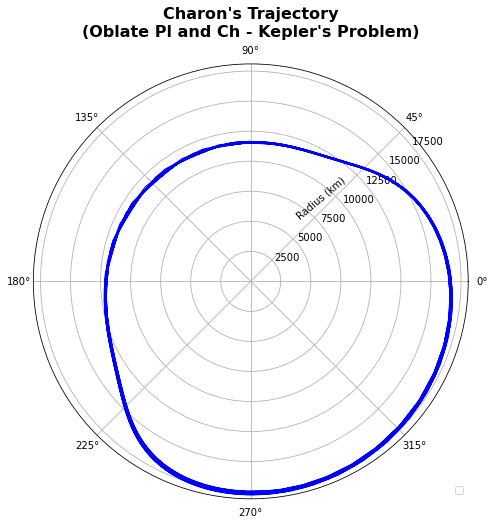

In [67]:
#-------------------------------------------------------------------------------------------------------------------------------
#Projecting the points on Charon's plane.
p_ch_r_RK2_g = points_proj(ch_r_RK2_g[:,0], ch_r_RK2_g[:,1], ch_r_RK2_g[:,2], pln_ch_RK2, "Ch")

#Polar plot of Charon's trajectory.
fig = plt.figure()
ax = plt.subplot(111, polar=True)
fig.set_size_inches(8, 8)
ax.set_title("Charon's Trajectory\n(Oblate Pl and Ch - Kepler's Problem)", va='bottom', fontweight="bold", fontsize=16)
plt.polar(p_ch_r_RK2_g[:,4], p_ch_r_RK2_g[:,3], color=col_ch, lw=1)
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()


### Projecting the Points to the Fitted Plane - Oblate Pl and Ch (Kepler's Problem - Fixed Pl)

P. Proj. (Ch) ::   0%|          | 0/71746 [00:00<?, ?it/s]

P. Proj. (St) ::   0%|          | 0/465633 [00:00<?, ?it/s]

P. Proj. (Ni) ::   0%|          | 0/550156 [00:00<?, ?it/s]

P. Proj. (Ke) ::   0%|          | 0/702883 [00:00<?, ?it/s]

P. Proj. (Hy) ::   0%|          | 0/837610 [00:00<?, ?it/s]

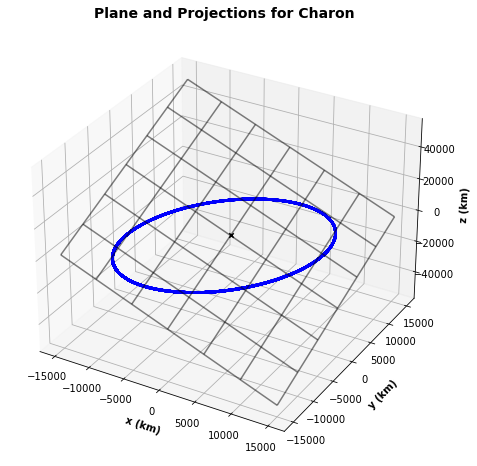

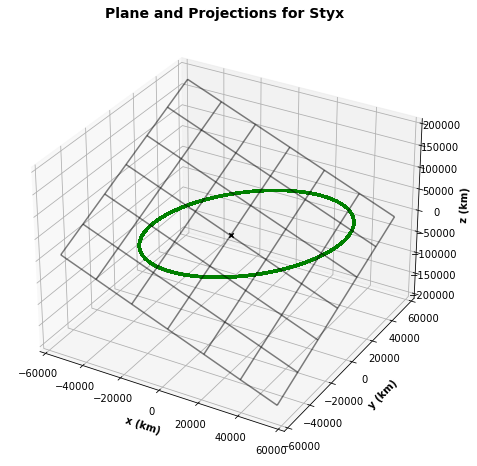

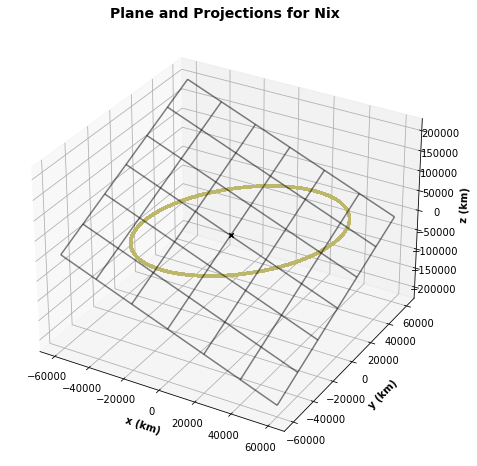

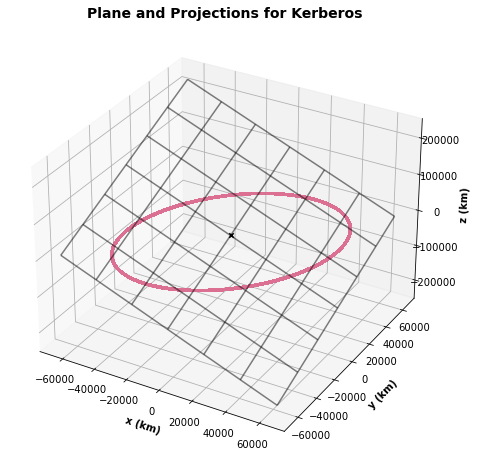

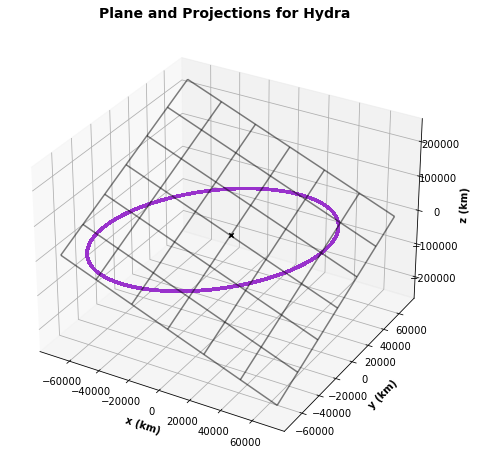

In [96]:
#-------------------------------------------------------------------------------------------------------------------------------
#Projecting the points to their corresponding planes.
p_ch_r_RK2 = points_proj(p_r_ch_RK2[:,0], p_r_ch_RK2[:,1], p_r_ch_RK2[:,2], pln_ch_RK2, "Ch")
p_st_r_RK2 = points_proj(p_r_st_RK2[:,0], p_r_st_RK2[:,1], p_r_st_RK2[:,2], pln_st_RK2, "St")
p_ni_r_RK2 = points_proj(p_r_ni_RK2[:,0], p_r_ni_RK2[:,1], p_r_ni_RK2[:,2], pln_ni_RK2, "Ni")
p_ke_r_RK2 = points_proj(p_r_ke_RK2[:,0], p_r_ke_RK2[:,1], p_r_ke_RK2[:,2], pln_ke_RK2, "Ke")
p_hy_r_RK2 = points_proj(p_r_hy_RK2[:,0], p_r_hy_RK2[:,1], p_r_hy_RK2[:,2], pln_hy_RK2, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the points on their planes.

#Limits for the grid to represent the fitted plane.
grid_pl = ([-2000, 2000, 7])
grid_ch = ([-15000,15000,7])
grid_st = ([-55000,55000,7])
grid_ni = ([-60000,60000,7])
grid_ke = ([-65000,65000,7])
grid_hy = ([-70000,70000,7])

#Plotting the points on their plane for each body.
plot_plane("Charon",   pln_ch_RK2, col_ch, p_ch_r_RK2, grid_ch)
plot_plane("Styx",     pln_st_RK2, col_st, p_st_r_RK2, grid_st)
plot_plane("Nix",      pln_ni_RK2, col_ni, p_ni_r_RK2, grid_ni)
plot_plane("Kerberos", pln_ke_RK2, col_ke, p_ke_r_RK2, grid_ke)
plot_plane("Hydra",    pln_hy_RK2, col_hy, p_hy_r_RK2, grid_hy)


### Fitting Ellipses - Oblate Pl and Ch (Kepler's Problem - Fixed Pl)

2D Points (Ch) ::   0%|          | 0/71746 [00:00<?, ?it/s]

2D Points (St) ::   0%|          | 0/465633 [00:00<?, ?it/s]

2D Points (Ni) ::   0%|          | 0/550156 [00:00<?, ?it/s]

2D Points (Ke) ::   0%|          | 0/702883 [00:00<?, ?it/s]

2D Points (Hy) ::   0%|          | 0/837610 [00:00<?, ?it/s]

<ipython-input-8-8163926b49f2>:23: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  x = np.linalg.lstsq(A, b)[0].squeeze()      # The constants are stored. They are for the equation of the form:


EQUATIONS OF FITTED ELLIPSES:
Charon:    5.18e-09x^2 + -4.37e-10xy+5.05e-09y^2+-2.22e-05x+3.13e-05y = 1
Styx:      4.14e-10x^2 + -2.86e-11xy+4.12e-10y^2+-3.96e-06x+-3.51e-06y = 1
Nix:       3.28e-10x^2 + -1.42e-11xy+3.23e-10y^2+6.1e-07x+-4.86e-06y = 1
Kerberos:  2.34e-10x^2 + -8.47e-12xy+2.33e-10y^2+-3.83e-06x+3.5e-06y = 1
Hydra:     1.86e-10x^2 + -8.64e-12xy+1.85e-10y^2+1.44e-06x+2.64e-06y = 1


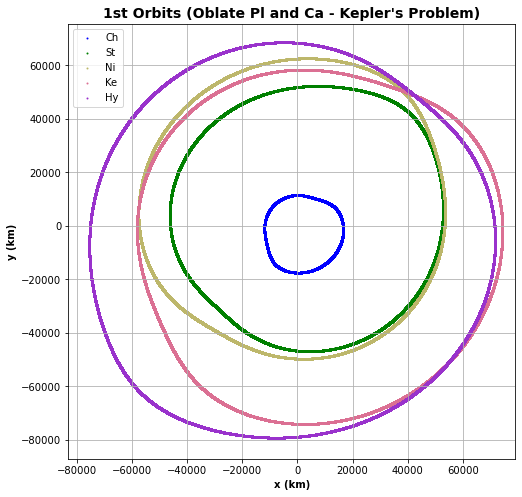

In [69]:
#-------------------------------------------------------------------------------------------------------------------------------
#Generating the 2D points.
ch_2d_r_RK2 = points_2d(p_ch_r_RK2, "Ch")
st_2d_r_RK2 = points_2d(p_st_r_RK2, "St")
ni_2d_r_RK2 = points_2d(p_ni_r_RK2, "Ni")
ke_2d_r_RK2 = points_2d(p_ke_r_RK2, "Ke")
hy_2d_r_RK2 = points_2d(p_hy_r_RK2, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#Fitting the Ellipses.

#Generating the constants for the equations of the ellipses for each trajectory.
ell_ch_RK2 = fit_ellipse(ch_2d_r_RK2)
ell_st_RK2 = fit_ellipse(st_2d_r_RK2)
ell_ni_RK2 = fit_ellipse(ni_2d_r_RK2)
ell_ke_RK2 = fit_ellipse(ke_2d_r_RK2)
ell_hy_RK2 = fit_ellipse(hy_2d_r_RK2)

#Printing each trajectory's equation.
print("EQUATIONS OF FITTED ELLIPSES:")
print('Charon:    {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_ch_RK2[0], ell_ch_RK2[1], ell_ch_RK2[2], ell_ch_RK2[3], ell_ch_RK2[4]))
print('Styx:      {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_st_RK2[0], ell_st_RK2[1], ell_st_RK2[2], ell_st_RK2[3], ell_st_RK2[4]))
print('Nix:       {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_ni_RK2[0], ell_ni_RK2[1], ell_ni_RK2[2], ell_ni_RK2[3], ell_ni_RK2[4]))
print('Kerberos:  {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_ke_RK2[0], ell_ke_RK2[1], ell_ke_RK2[2], ell_ke_RK2[3], ell_ke_RK2[4]))
print('Hydra:     {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_hy_RK2[0], ell_hy_RK2[1], ell_hy_RK2[2], ell_hy_RK2[3], ell_hy_RK2[4]))

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the points in a single graph (approximating all planes as equal).
fig = plt.figure()
plt.scatter(ch_2d_r_RK2[:,0], ch_2d_r_RK2[:,1], c=col_ch, s=1, label="Ch")
plt.scatter(st_2d_r_RK2[:,0], st_2d_r_RK2[:,1], c=col_st, s=1, label="St")
plt.scatter(ni_2d_r_RK2[:,0], ni_2d_r_RK2[:,1], c=col_ni, s=1, label="Ni")
plt.scatter(ke_2d_r_RK2[:,0], ke_2d_r_RK2[:,1], c=col_ke, s=1, label="Ke")
plt.scatter(hy_2d_r_RK2[:,0], hy_2d_r_RK2[:,1], c=col_hy, s=1, label="Hy")
plt.title("1st Orbits (Oblate Pl and Ca - Kepler's Problem)", fontweight="bold", fontsize=14)
plt.xlabel("x (km)", fontweight="bold")
plt.ylabel("y (km)", fontweight="bold")
plt.legend(loc='upper left')
fig.set_size_inches(8, 8)
plt.grid()
plt.xlim([min(hy_2d_r_RK2[:,0]) - (abs(min(hy_2d_r_RK2[:,0]))/10), max(hy_2d_r_RK2[:,0]) + (abs(max(hy_2d_r_RK2[:,0]))/10)])
plt.ylim([min(hy_2d_r_RK2[:,1]) - (abs(min(hy_2d_r_RK2[:,1]))/10), max(hy_2d_r_RK2[:,1]) + (abs(max(hy_2d_r_RK2[:,1]))/10)])
plt.show()


### Fitted Ellipses' Parameters - Oblate Pl and Ch (Kepler's Problem - Fixed Pl)

In [70]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to print both sets of paramteres (OPC(KP) vs. JPL/NASA).
def print_param_RK2(title, ell_a, ell_b, ell_c, ell_e, a, b, c, e):
    print(title + ':')
    print('Oblate Pl and Ch (Kepler): a: ' + str(ell_a) + '   b: ' + str(ell_b) + '   c: ' + str(ell_c) + '   e: ' + str(ell_e))
    print('JPL/NASA:                  a: ' + str(a) + '   b: ' + str(b) + '   c: ' + str(c) + '   e: ' + str(e))
    print("")
    

In [71]:
#-------------------------------------------------------------------------------------------------------------------------------
#Calculating the parameters of the fitted ellipses.
ell_ch_a_RK2, ell_ch_b_RK2, ell_ch_c_RK2, ell_ch_e_RK2 = param_ellipse(ell_ch_RK2)
ell_st_a_RK2, ell_st_b_RK2, ell_st_c_RK2, ell_st_e_RK2 = param_ellipse(ell_st_RK2)
ell_ni_a_RK2, ell_ni_b_RK2, ell_ni_c_RK2, ell_ni_e_RK2 = param_ellipse(ell_ni_RK2)
ell_ke_a_RK2, ell_ke_b_RK2, ell_ke_c_RK2, ell_ke_e_RK2 = param_ellipse(ell_ke_RK2)
ell_hy_a_RK2, ell_hy_b_RK2, ell_hy_c_RK2, ell_hy_e_RK2 = param_ellipse(ell_hy_RK2)

#-------------------------------------------------------------------------------------------------------------------------------
#Se imprimen los parámetros junto con los obtenidos para los datos del JPL/NASA.
#Printing parameters to compare (OPC(KP) vs. JPL/NASA).
print("ELLIPTIC TRAJECTORIES' PARAMETERS:")
print_param_RK2("Charon",   ell_ch_a_RK2, ell_ch_b_RK2, ell_ch_c_RK2, ell_ch_e_RK2, ell_ch_a, ell_ch_b, ell_ch_c, ell_ch_e)
print_param_RK2("Styx",     ell_st_a_RK2, ell_st_b_RK2, ell_st_c_RK2, ell_st_e_RK2, ell_st_a, ell_st_b, ell_st_c, ell_st_e)
print_param_RK2("Nix",      ell_ni_a_RK2, ell_ni_b_RK2, ell_ni_c_RK2, ell_ni_e_RK2, ell_ni_a, ell_ni_b, ell_ni_c, ell_ni_e)
print_param_RK2("Kerberos", ell_ke_a_RK2, ell_ke_b_RK2, ell_ke_c_RK2, ell_ke_e_RK2, ell_ke_a, ell_ke_b, ell_ke_c, ell_ke_e)
print_param_RK2("Hydra",    ell_hy_a_RK2, ell_hy_b_RK2, ell_hy_c_RK2, ell_hy_e_RK2, ell_hy_a, ell_hy_b, ell_hy_c, ell_hy_e)


ELLIPTIC TRAJECTORIES' PARAMETERS:
Charon:
Oblate Pl and Ch (Kepler): a: 14788.975768212356   b: 14144.059123606143   c: 4319.652275439086   e: 0.2920859661372771
JPL/NASA:                  a: 17468.581965799047   b: 17468.569148617305   c: 21.161186529791404   e: 0.0012113854788459602

Styx:
Oblate Pl and Ch (Kepler): a: 50526.547408612256   b: 48805.27454356921   c: 13075.823865499915   e: 0.2587911610060089
JPL/NASA:                  a: 42525.54676510166   b: 42227.76810928481   c: 5023.716570360756   e: 0.11813408533252373

Nix:
Oblate Pl and Ch (Kepler): a: 56629.45092517728   b: 55328.82387086236   c: 12067.14386895896   e: 0.21308954390009707
JPL/NASA:                  a: 48709.67732808009   b: 48690.25614757749   c: 1375.362384599781   e: 0.02823591655793805

Kerberos:
Oblate Pl and Ch (Kepler): a: 66990.25156037087   b: 65782.63486883693   c: 12662.49398163934   e: 0.18901994971952069
JPL/NASA:                  a: 57764.27472227483   b: 57751.79959118285   c: 1200.449153563541

### Trajectory Comparison (Oblate Pl and Ch (Kepler's Problem - Fixed Pl) vs. JPL/NASA)

##### With these plots it is even more evident how different these results were.

In [72]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to plot each individual trajectory to compare.
def plot_OPC_KP(title, th_k, r_k, th_o, r_o, col):
    fig = plt.figure()
    ax = plt.axes(polar = True)
    fig.set_size_inches(8, 8)
    ax.set_title(title+"'s Trajectories", va='bottom', fontweight="bold", fontsize=16)
    plt.scatter(0, 0, color=col_pl, lw=2, label="Pl")
    plt.polar(p_pl_r[:,4], p_pl_r[:,3], color=col_pl, lw=3, linestyle='dashed')
    plt.polar(th_k, r_k, color=col, lw=2, label="OPC (KP)")
    plt.polar(th_o, r_o, color=col, lw=3, linestyle='dashed')
    plt.polar(0, 0, color=col, label="JPL/NASA", linestyle="dashed")
    ax.legend(loc='lower right')
    ax.set_rlabel_position(40)
    label_position=ax.get_rlabel_position()
    ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
    plt.show()
    

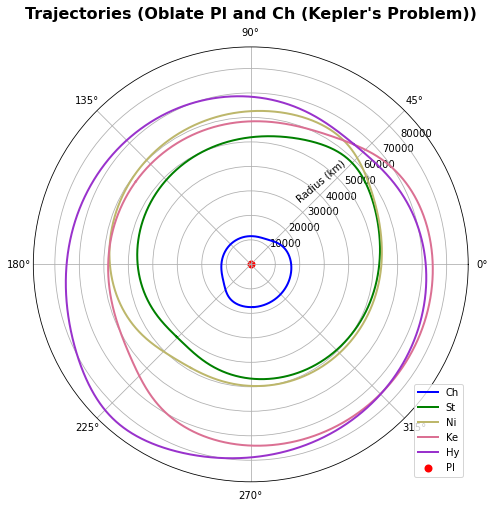

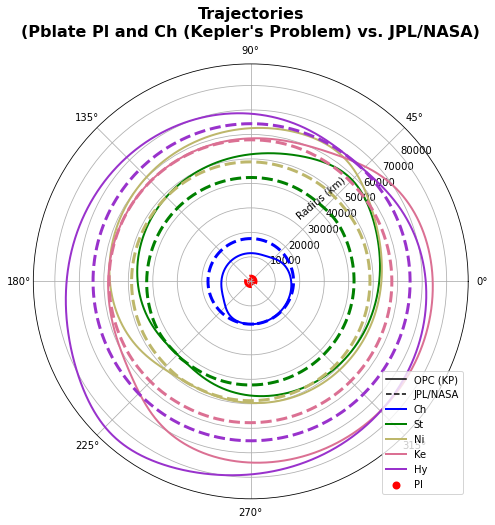

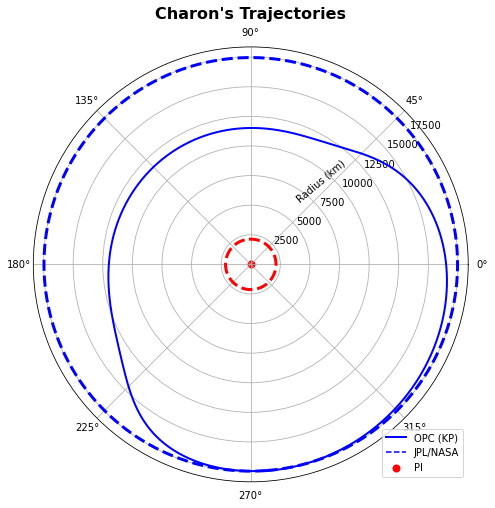

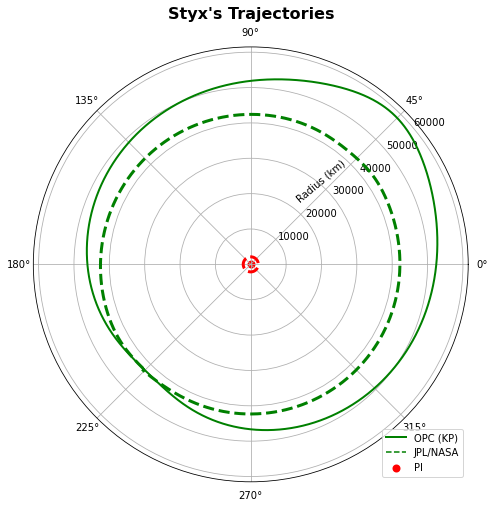

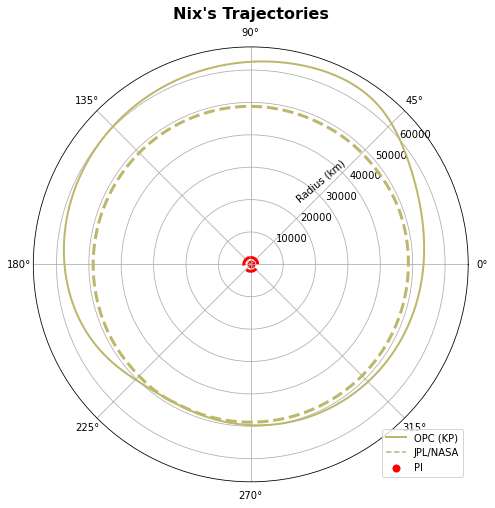

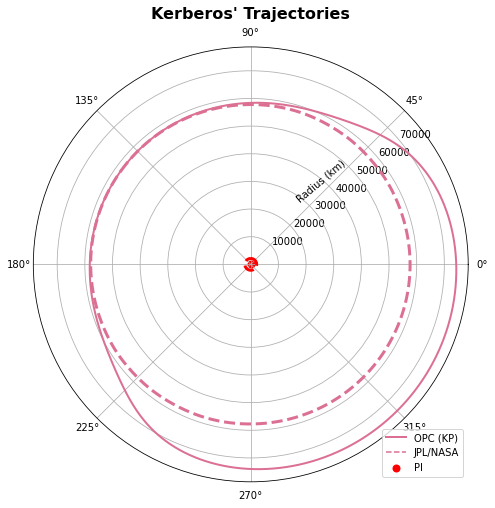

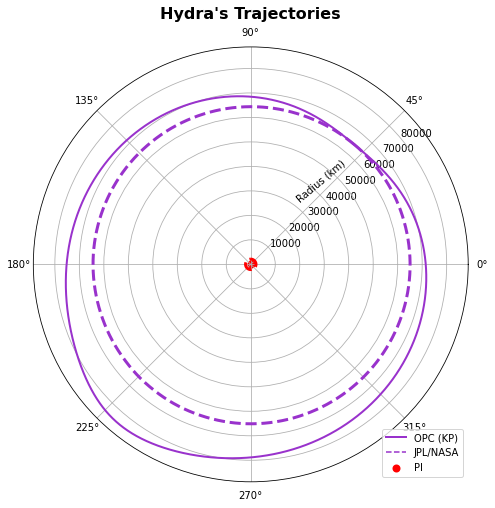

In [73]:
#-------------------------------------------------------------------------------------------------------------------------------
#Plotting all trajectories of this model.
fig = plt.figure()
ax = plt.subplot(111, polar=True)
fig.set_size_inches(8, 8)
ax.set_title("Trajectories (Oblate Pl and Ch (Kepler's Problem))", va='bottom', fontweight="bold", fontsize=16)
plt.scatter(0, 0, color=col_pl, lw=2, label="Pl")
plt.polar(p_ch_r_RK2[:,4], p_ch_r_RK2[:,3], color=col_ch, lw=2, label="Ch")
plt.polar(p_st_r_RK2[:,4], p_st_r_RK2[:,3], color=col_st, lw=2, label="St")
plt.polar(p_ni_r_RK2[:,4], p_ni_r_RK2[:,3], color=col_ni, lw=2, label="Ni")
plt.polar(p_ke_r_RK2[:,4], p_ke_r_RK2[:,3], color=col_ke, lw=2, label="Ke")
plt.polar(p_hy_r_RK2[:,4], p_hy_r_RK2[:,3], color=col_hy, lw=2, label="Hy")
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()

#Plotting all trajectories compared to the ones from JPL/NASA.
fig = plt.figure()
ax = plt.axes(polar = True)
fig.set_size_inches(8, 8)
ax.set_title("Trajectories\n(Pblate Pl and Ch (Kepler's Problem) vs. JPL/NASA)", va='bottom', fontweight="bold", fontsize=16)
plt.plot(0, 0, color="black", label="OPC (KP)")                        # These plots are
plt.plot(0, 0, color="black", label="JPL/NASA", linestyle="dashed")    # just for the labels.
plt.scatter(0, 0, color=col_pl, lw=2, label="Pl")
plt.polar(p_ch_r_RK2[:,4], p_ch_r_RK2[:,3], color=col_ch, lw=2, label="Ch")
plt.polar(p_st_r_RK2[:,4], p_st_r_RK2[:,3], color=col_st, lw=2, label="St")
plt.polar(p_ni_r_RK2[:,4], p_ni_r_RK2[:,3], color=col_ni, lw=2, label="Ni")
plt.polar(p_ke_r_RK2[:,4], p_ke_r_RK2[:,3], color=col_ke, lw=2, label="Ke")
plt.polar(p_hy_r_RK2[:,4], p_hy_r_RK2[:,3], color=col_hy, lw=2, label="Hy")
plt.polar(p_pl_r[:,4], p_pl_r[:,3], color=col_pl, lw=3, linestyle='dashed')
plt.polar(p_ch_r[:,4], p_ch_r[:,3], color=col_ch, lw=3, linestyle='dashed')
plt.polar(p_st_r[:,4], p_st_r[:,3], color=col_st, lw=3, linestyle='dashed')
plt.polar(p_ni_r[:,4], p_ni_r[:,3], color=col_ni, lw=3, linestyle='dashed')
plt.polar(p_ke_r[:,4], p_ke_r[:,3], color=col_ke, lw=3, linestyle='dashed')
plt.polar(p_hy_r[:,4], p_hy_r[:,3], color=col_hy, lw=3, linestyle='dashed')
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()

#Plotting the trajectory of each individual body.
plot_OPC_KP("Charon",   p_ch_r_RK2[:,4], p_ch_r_RK2[:,3], p_ch_r[:,4], p_ch_r[:,3], col_ch)
plot_OPC_KP("Styx",     p_st_r_RK2[:,4], p_st_r_RK2[:,3], p_st_r[:,4], p_st_r[:,3], col_st)
plot_OPC_KP("Nix",      p_ni_r_RK2[:,4], p_ni_r_RK2[:,3], p_ni_r[:,4], p_ni_r[:,3], col_ni)

fig = plt.figure()
ax = plt.axes(polar = True)
fig.set_size_inches(8, 8)
ax.set_title("Kerberos' Trajectories", va='bottom', fontweight="bold", fontsize=16)
plt.scatter(0, 0, color=col_pl, lw=2, label="Pl")
plt.polar(p_pl_r[:,4], p_pl_r[:,3], color=col_pl, lw=3, linestyle='dashed')
plt.polar(p_ke_r_RK2[:,4], p_ke_r_RK2[:,3], color=col_ke, lw=2, label="OPC (KP)")
plt.polar(p_ke_r[:,4], p_ke_r[:,3], color=col_ke, lw=3, linestyle='dashed')
plt.polar(0, 0, color=col_ke, label="JPL/NASA", linestyle="dashed")
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()

plot_OPC_KP("Hydra",    p_hy_r_RK2[:,4], p_hy_r_RK2[:,3], p_hy_r[:,4], p_hy_r[:,3], col_hy)


### Angular Momentum Conservation - Oblate Pl and Ch (Kepler's Problem - Fixed Pl)

##### Even though the resulting trajectories were very different, the angular momentum kept relatively constant through each body's movement.

In [75]:
#-------------------------------------------------------------------------------------------------------------------------------
#Calculating the angular momentum for each body.
ch_L_RK2 = momentum(ch_x_RK2, ch_y_RK2, ch_z_RK2, ch_vx_RK2, ch_vy_RK2, ch_vz_RK2, ch_m, "Ch")
st_L_RK2 = momentum(st_x_RK2, st_y_RK2, st_z_RK2, st_vx_RK2, st_vy_RK2, st_vz_RK2, st_m, "St")
ni_L_RK2 = momentum(ni_x_RK2, ni_y_RK2, ni_z_RK2, ni_vx_RK2, ni_vy_RK2, ni_vz_RK2, ni_m, "Ni")
ke_L_RK2 = momentum(ke_x_RK2, ke_y_RK2, ke_z_RK2, ke_vx_RK2, ke_vy_RK2, ke_vz_RK2, ke_m, "Ke")
hy_L_RK2 = momentum(hy_x_RK2, hy_y_RK2, hy_z_RK2, hy_vx_RK2, hy_vy_RK2, hy_vz_RK2, hy_m, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#PLS's total angular momentum.
L_t_RK2 = np.empty((len(ch_L_RK2)), float)
lim = tqdm(range(len(ch_L_RK2)), desc="Total Momentum: ")
for i in lim:
    L_t_RK2[i] = ch_L_RK2[i] + st_L_RK2[i] + ni_L_RK2[i] + ke_L_RK2[i] + hy_L_RK2[i]


Ch's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

St's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Ni's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Ke's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Hy's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Total Momentum:   0%|          | 0/1000001 [00:00<?, ?it/s]

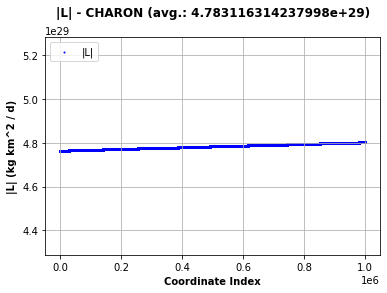

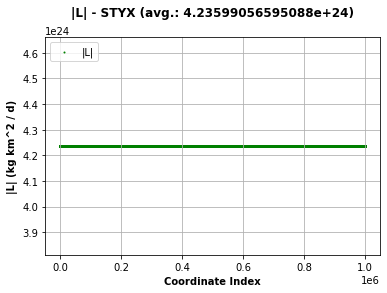

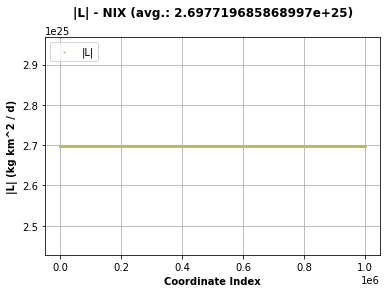

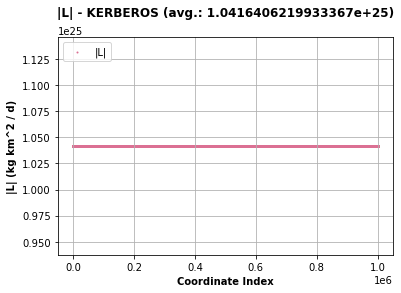

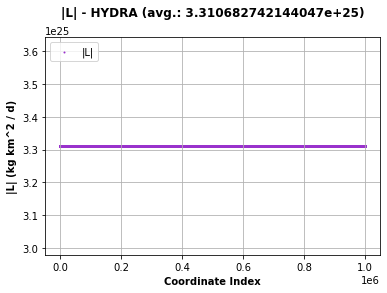

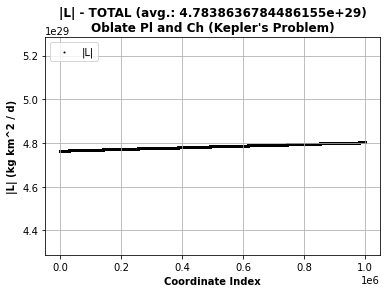

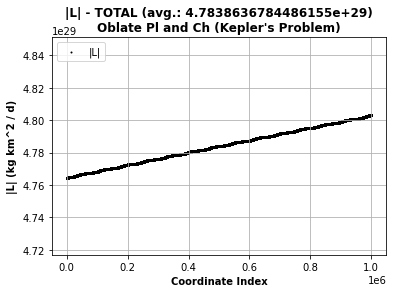

In [76]:
#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the PLS's and each body's angular momentum.

#Averages.
aver_L_ch_RK2 = avg(ch_L_RK2)
aver_L_st_RK2 = avg(st_L_RK2)
aver_L_ni_RK2 = avg(ni_L_RK2)
aver_L_ke_RK2 = avg(ke_L_RK2)
aver_L_hy_RK2 = avg(hy_L_RK2)
aver_L_t_RK2  = avg(L_t_RK2)

#Plotting each body's angular momentum.
plot_L_RK("CHARON",   ch_L_RK2, col_ch, aver_L_ch_RK2)
plot_L_RK("STYX",     st_L_RK2, col_st, aver_L_st_RK2)
plot_L_RK("NIX",      ni_L_RK2, col_ni, aver_L_ni_RK2)
plot_L_RK("KERBEROS", ke_L_RK2, col_ke, aver_L_ke_RK2)
plot_L_RK("HYDRA",    hy_L_RK2, col_hy, aver_L_hy_RK2)

#Plotting the PLS's complete angular momentum.
fig = plt.figure()
plt.scatter(range(len(L_t_RK2)), L_t_RK2, c="black", s=1, label="|L|")
plt.title("|L| - TOTAL (avg.: " + str(aver_L_t_RK2) + ")\nOblate Pl and Ch (Kepler's Problem)", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("|L| (kg km^2 / d)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
plt.ylim([min(L_t_RK2) - (min(L_t_RK2)/10), max(L_t_RK2) + (max(L_t_RK2)/10)])   # Keeps the plot's limits 10% above and under
plt.show()                                                                       # the highest and lowest value plotted.

#Zoom to appreciate variation.
fig = plt.figure()
plt.scatter(range(len(L_t_RK2)), L_t_RK2, c="black", s=1, label="|L|")
plt.title("|L| - TOTAL (avg.: " + str(aver_L_t_RK2) + ")\nOblate Pl and Ch (Kepler's Problem)", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("|L| (kg km^2 / d)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
plt.ylim([min(L_t_RK2) - (min(L_t_RK2)/100), max(L_t_RK2) + (max(L_t_RK2)/100)])  # Limits are established to have the
plt.show()                                                                        # zoom and appreciate the variation.


### Energy Conservation - Oblate Pl and Ch (Kepler's Problem - Fixed Pl)

##### Similar to the angular momentum, the energy also kept oscilating around a constant average value throughout the movement. However, the variation was much more noticeable.

In [78]:
#-------------------------------------------------------------------------------------------------------------------------------
#Universal Gravitational Constant (days).
G = 4.982174e-10  #(km^3 / kg d^2)

#Transformation matrices for a new system whose XY plane aligns with the body's equator.
A_pl, Ainv_pl = plane_equator(RA_pl, dec_pl)
A_pl, Ainv_pl = np.array(A_pl), np.array(Ainv_pl)

A_ch, Ainv_ch = plane_equator(RA_ch, dec_ch)
A_ch, Ainv_ch = np.array(A_ch), np.array(Ainv_ch)

#Mass gravitational constant.
mu = G*pl_m

#-------------------------------------------------------------------------------------------------------------------------------
#Calculating each body's energy.

#Charon
ch_T_RK2, ch_U_RK2, ch_E_RK2 = np.empty((len(ch_x_RK2)), float), np.empty((len(ch_x_RK2)), float), np.empty((len(ch_x_RK2)), float)
lim = tqdm(range(len(ch_x_RK2)), desc="Energies (Ch): ")
for i in lim:
    rn = Ainv_pl.dot([ch_x_RK2[i], ch_y_RK2[i], ch_z_RK2[i]])  # The position vector from Pluto is calculated.
    ru = unitary(rn[0], rn[1], rn[2])                          # The unitary vector in the radial direction is calculated.

    #Perturbative term (Pluto).
    U_p_pl = - (1/2)*(J2_pl)*(mu/(ch_r_RK2[i]**2))*((r_eq_pl/ch_r_RK2[i])**2)*(3*(ru[2]**2) - 1)
    
    rn = Ainv_pl.dot([-ch_x_RK2[i], -ch_y_RK2[i], -ch_z_RK2[i]])   # The position vector from Charon is calculated.
    ru = unitary(rn[0], rn[1], rn[2])                             # The unitary vector in the radial direction is calculated.
    
    #Perturbative term (Charon).
    U_p_ch = - (1/2)*(J2_ch)*(G*ch_m/(ch_r_RK2[i]**2))*((r_eq_ch/ch_r_RK2[i])**2)*(3*(ru[2]**2) - 1)
    
    ch_T_RK2[i] = 0.5*ch_m*(ch_v_RK2[i]**2)
    ch_U_RK2[i] = (((-ch_m*mu)/ch_r_RK2[i]) - U_p_pl + U_p_ch)  # Including the perturbative terms.
    ch_E_RK2[i] = ch_T_RK2[i] + ch_U_RK2[i]

#Styx
st_T_RK2, st_U_RK2, st_E_RK2 = np.empty((len(st_x_RK2)), float), np.empty((len(st_x_RK2)), float), np.empty((len(st_x_RK2)), float)
lim = tqdm(range(len(st_x_RK2)), desc="Energies (St): ")
for i in lim:
    rn = Ainv_pl.dot([st_x_RK2[i], st_y_RK2[i], st_z_RK2[i]])
    ru = unitary(rn[0], rn[1], rn[2])

    U_p = - (1/2)*(J2_pl)*(mu/(st_r_RK2[i]**2))*((r_eq_pl/st_r_RK2[i])**2)*(3*(ru[2]**2) - 1)
        
    st_T_RK2[i] = 0.5*st_m*(st_v_RK2[i]**2)
    st_U_RK2[i] = (((-st_m*mu)/st_r_RK2[i]) - U_p)
    st_E_RK2[i] = st_T_RK2[i] + st_U_RK2[i]

#Nix
ni_T_RK2, ni_U_RK2, ni_E_RK2 = np.empty((len(ni_x_RK2)), float), np.empty((len(ni_x_RK2)), float), np.empty((len(ni_x_RK2)), float)
lim = tqdm(range(len(ni_x_RK2)), desc="Energies (Ni): ")
for i in lim:
    rn = Ainv_pl.dot([ni_x_RK2[i], ni_y_RK2[i], ni_z_RK2[i]])
    ru = unitary(rn[0], rn[1], rn[2])

    U_p = - (1/2)*(J2_pl)*(mu/(ni_r_RK2[i]**2))*((r_eq_pl/ni_r_RK2[i])**2)*(3*(ru[2]**2) - 1)
        
    ni_T_RK2[i] = 0.5*ni_m*(ni_v_RK2[i]**2)
    ni_U_RK2[i] = (((-ni_m*mu)/ni_r_RK2[i]) - U_p)
    ni_E_RK2[i] = ni_T_RK2[i] + ni_U_RK2[i]
    
#Kerberos
ke_T_RK2, ke_U_RK2, ke_E_RK2 = np.empty((len(ke_x_RK2)), float), np.empty((len(ke_x_RK2)), float), np.empty((len(ke_x_RK2)), float)
lim = tqdm(range(len(ke_x_RK2)), desc="Energies (Ke): ")
for i in lim:
    rn = Ainv_pl.dot([ke_x_RK2[i], ke_y_RK2[i], ke_z_RK2[i]])
    ru = unitary(rn[0], rn[1], rn[2])

    U_p = - (1/2)*(J2_pl)*(mu/(ke_r_RK2[i]**2))*((r_eq_pl/ke_r_RK2[i])**2)*(3*(ru[2]**2) - 1)
        
    ke_T_RK2[i] = 0.5*ke_m*(ke_v_RK2[i]**2)
    ke_U_RK2[i] = (((-ke_m*mu)/ke_r_RK2[i]) - U_p)
    ke_E_RK2[i] = ke_T_RK2[i] + ke_U_RK2[i]
    
#Hydra
hy_T_RK2, hy_U_RK2, hy_E_RK2 = np.empty((len(hy_x_RK2)), float), np.empty((len(hy_x_RK2)), float), np.empty((len(hy_x_RK2)), float)
lim = tqdm(range(len(hy_x_RK2)), desc="Energies (Hy): ")
for i in lim:
    rn = Ainv_pl.dot([hy_x_RK2[i], hy_y_RK2[i], hy_z_RK2[i]])
    ru = unitary(rn[0], rn[1], rn[2])

    U_p = - (1/2)*(J2_pl)*(mu/(hy_r_RK2[i]**2))*((r_eq_pl/hy_r_RK2[i])**2)*(3*(ru[2]**2) - 1)
        
    hy_T_RK2[i] = 0.5*hy_m*(hy_v_RK2[i]**2)
    hy_U_RK2[i] = (((-hy_m*mu)/hy_r_RK2[i]) - U_p)
    hy_E_RK2[i] = hy_T_RK2[i] + hy_U_RK2[i]

#-------------------------------------------------------------------------------------------------------------------------------
#PLS's total energy.
T_t_RK2, U_t_RK2, E_t_RK2 = np.empty((len(ch_E_RK2)), float), np.empty((len(ch_E_RK2)), float), np.empty((len(ch_E_RK2)), float)
lim = tqdm(range(len(ch_E_RK2)), desc="Energies (Tot.): ")
for i in lim:
    T_t_RK2[i] = ch_T_RK2[i] + st_T_RK2[i] + ni_T_RK2[i] + ke_T_RK2[i] + hy_T_RK2[i]
    U_t_RK2[i] = ch_U_RK2[i] + st_U_RK2[i] + ni_U_RK2[i] + ke_U_RK2[i] + hy_U_RK2[i]
    E_t_RK2[i] = ch_E_RK2[i] + st_E_RK2[i] + ni_E_RK2[i] + ke_E_RK2[i] + hy_E_RK2[i]


Energies (Ch):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energies (St):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energies (Ni):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energies (Ke):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energies (Hy):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energies (Tot.):   0%|          | 0/1000001 [00:00<?, ?it/s]

ENERGY AVERAGES:
Ch:      T =3.541092743500506e+29    U = -7.06516926056248e+29    E = -3.524076517062155e+29
St:      T =4.921203450740852e+23    U = -9.746876941388941e+23    E = -4.8256734906485377e+23
Ni:      T =2.5282747979637995e+24    U = -5.119070521768595e+24    E = -2.590795723804725e+24
Ke:      T =7.928806357151158e+23    U = -1.5752750919610355e+24    E = -7.823944562458233e+23
Hy:      T =2.1575901548203189e+24    U = -4.245837446572383e+24    E = -2.0882472917519952e+24
Total:   T =3.5411524521598534e+29    U = -7.06528840926991e+29    E = -3.5241359571103624e+29


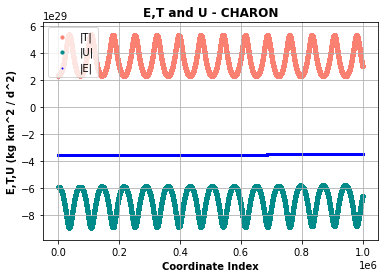

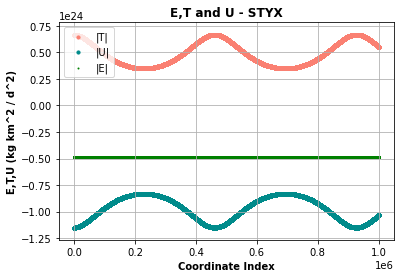

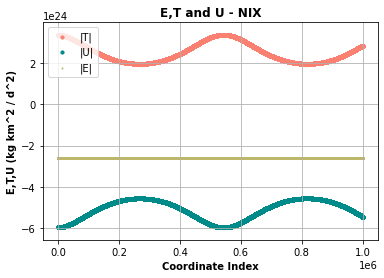

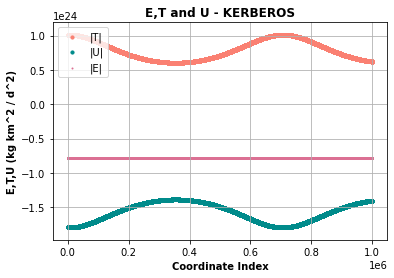

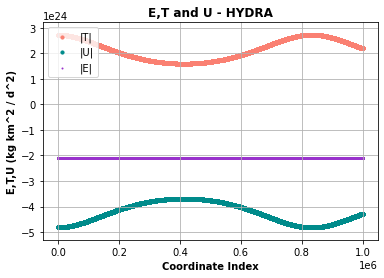

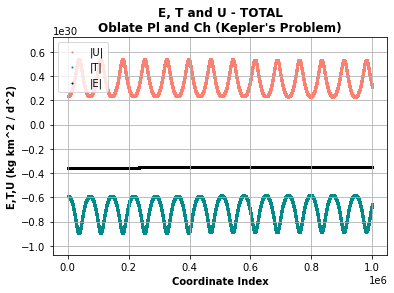

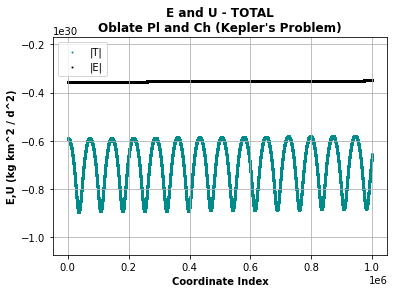

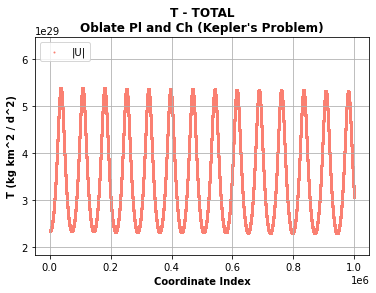

In [79]:
#-------------------------------------------------------------------------------------------------------------------------------
#Average energy for each body.
print("ENERGY AVERAGES:")
print("Ch:      T =" + str(avg(ch_T_RK2)) + "    U = " + str(avg(ch_U_RK2)) + "    E = " +  str(avg(ch_E_RK2)))
print("St:      T =" + str(avg(st_T_RK2)) + "    U = " + str(avg(st_U_RK2)) + "    E = " +  str(avg(st_E_RK2)))
print("Ni:      T =" + str(avg(ni_T_RK2)) + "    U = " + str(avg(ni_U_RK2)) + "    E = " +  str(avg(ni_E_RK2)))
print("Ke:      T =" + str(avg(ke_T_RK2)) + "    U = " + str(avg(ke_U_RK2)) + "    E = " +  str(avg(ke_E_RK2)))
print("Hy:      T =" + str(avg(hy_T_RK2)) + "    U = " + str(avg(hy_U_RK2)) + "    E = " +  str(avg(hy_E_RK2)))
print("Total:   T =" + str(avg(T_t_RK2))  + "    U = " + str(avg(U_t_RK2))  + "    E = " +  str(avg(E_t_RK2)))

#-------------------------------------------------------------------------------------------------------------------------------
#PLOTS:

#Plotting each body's energy.
plot_E_RK("CHARON",   ch_T_RK2, ch_U_RK2, ch_E_RK2, col_ch)
plot_E_RK("STYX",     st_T_RK2, st_U_RK2, st_E_RK2, col_st)
plot_E_RK("NIX",      ni_T_RK2, ni_U_RK2, ni_E_RK2, col_ni)
plot_E_RK("KERBEROS", ke_T_RK2, ke_U_RK2, ke_E_RK2, col_ke)
plot_E_RK("HYDRA",    hy_T_RK2, hy_U_RK2, hy_E_RK2, col_hy)

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the PLS's complete energy.
fig = plt.figure()
ax1 = fig.add_subplot(111)
ax1.scatter(range(len(T_t_RK2)), T_t_RK2, c="salmon", s=1, label="|U|")
ax1.scatter(range(len(U_t_RK2)), U_t_RK2, c="darkcyan", s=1, label="|T|")
ax1.scatter(range(len(E_t_RK2)), E_t_RK2, c="black", s=1, label="|E|")
plt.title("E, T and U - TOTAL\nOblate Pl and Ch (Kepler's Problem)", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("E,T,U (kg km^2 / d^2)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
lim_inf = min(np.array([min(E_t_RK2), min(U_t_RK2), min(T_t_RK2)]))
lim_sup = max(np.array([max(E_t_RK2), max(U_t_RK2), max(T_t_RK2)]))
extra = max(np.array([abs(lim_inf), abs(lim_sup)]))
plt.ylim([lim_inf - extra/5, lim_sup + extra/5])
plt.show()

#Zoom to the total and potential energy of the PLS.
fig = plt.figure()
ax1 = fig.add_subplot(111)  
ax1.scatter(range(len(U_t_RK2)), U_t_RK2, c="darkcyan", s=1, label="|T|")
ax1.scatter(range(len(E_t_RK2)), E_t_RK2, c="black", s=1, label="|E|")
plt.title("E and U - TOTAL\nOblate Pl and Ch (Kepler's Problem)", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("E,U (kg km^2 / d^2)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
lim_inf = min(np.array([min(E_t_RK2), min(U_t_RK2)]))
lim_sup = max(np.array([max(E_t_RK2), max(U_t_RK2)]))
extra = max(np.array([abs(lim_inf), abs(lim_sup)]))
plt.ylim([lim_inf - extra/5, lim_sup + extra/5])
plt.show()

#Zoom to the kinetic energy of the PLS.
fig = plt.figure()
ax1 = fig.add_subplot(111)  
ax1.scatter(range(len(T_t_RK2)), T_t_RK2, c="salmon", s=1, label="|U|")
plt.title("T - TOTAL\nOblate Pl and Ch (Kepler's Problem)", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("T (kg km^2 / d^2)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
plt.ylim([min(T_t_RK2) - abs(min(T_t_RK2)/5), max(T_t_RK2) + abs(max(T_t_RK2)/5)])
plt.show()


## Model 3.2: Oblate Pl and Ch (2-Body Problem)

##### In this model, we consider a 2-body problem between Pluto and Charon taking into account that neither has a spheric shape. Even though we include the other moons, we still use numerical integration. Therefore, we introduce Pluto's initial velocity, whose amgnitude is due to Pluto's interaction with Charon. When including a 2-body problem between Pluto and any other moon, Pluto's initial velocity makes the other moon to go in spyral following Pluto. This happens because the other moon is not massive enough to keep Pluto on a relatively local orbit. So, the important part of this model is to confirm that we are able to include the perturbative terms in an n-body problem, in this case being n=2.

### Generating the Data - Oblate Pl and Ch (2-Body Problem)

##### Again, we used non-symplectic 4th order Runge-Kutta to generate the data.

In [116]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Universal Gravitational Constant (days).
G = 4.982174e-10  #(km^3 / kg d^2)

#-------------------------------------------------------------------------------------------------------------------------------
#Function for the acceleration with oblate Pl for the other moons (2-body systems).
def func_kepler_OPC2(Apl, Ainvpl, m1, m2, x, y, z, ban):
    mu = G*m1*m2
    
    rnpl = Ainvpl.dot([x, y, z])                  # The position vector from Pluto is calculated.
    rupl = unitary(rnpl[0], rnpl[1], rnpl[2])     # The unitary vector in the radial direction is calculated..
    
    r = mag(x, y, z)    # Distance between bodies.
    
    ax_p = - (3/2)*(J2_pl/m1)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 5*(rupl[2]**2))*rupl[0]    # The perturbative terms are
    ay_p = - (3/2)*(J2_pl/m1)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 5*(rupl[2]**2))*rupl[1]    # calculated for each
    az_p = - (3/2)*(J2_pl/m1)*(mu/(r**2))*((r_eq_pl/r)**2)*(3 - 5*(rupl[2]**2))*rupl[2]    # component.
    
    if ban == 1:    # m1 = pl_m
        ax_p = - ax_p
        ay_p = - ay_p
        az_p = - az_p
    
    a_p_pl = Apl.dot([ax_p, ay_p, az_p])  # The perturbative term is stored.
        
    ax = ((-mu/m1) / (r**3))*x + a_p_pl[0]    # The perturbative terms are added.
    ay = ((-mu/m1) / (r**3))*y + a_p_pl[1]
    az = ((-mu/m1) / (r**3))*z + a_p_pl[2]
    
    return ax, ay, az

#Function for acceleration for Charon consideroing Pl and Ch as oblate spheroids (2-body system).
def func_kepler_OPC2_ch(Apl, Ainvpl, Ach, Ainvch, m1, m2, x, y, z, ban):
    mu = G*m1*m2
    
    rnpl = Ainvpl.dot([x, y, z])                  # The position vector from Pluto is calculated.
    rupl = unitary(rnpl[0], rnpl[1], rnpl[2])     # The unitary vector in the radial direction is calculated.
    
    rnch = Ainvch.dot([-x, -y, -z])               # The position vector from Charon is calculated.
    ruch = unitary(rnch[0], rnch[1], rnch[2])    # The unitary vector in the radial direction is calculated.
    
    r = mag(x, y, z)      # Distance between the bodies.
    
    if ban == 0:    # m2 = pl_m
        ax_p = - (3/2)*(J2_pl/m1)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 5*(rupl[2]**2))*rupl[0]    # The perturbative terms are
        ay_p = - (3/2)*(J2_pl/m1)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 5*(rupl[2]**2))*rupl[1]    # calculated for each
        az_p = - (3/2)*(J2_pl/m1)*(mu/(r**2))*((r_eq_pl/r)**2)*(3 - 5*(rupl[2]**2))*rupl[2]    # component.
    
        a_p_pl = Apl.dot([ax_p, ay_p, az_p])    # The perturbative term is stored (Pluto).
        
        ax_p = - (3/2)*(J2_ch/m2)*(mu/(r**2))*((r_eq_ch/r)**2)*(1 - 5*(ruch[2]**2))*ruch[0]
        ay_p = - (3/2)*(J2_ch/m2)*(mu/(r**2))*((r_eq_ch/r)**2)*(1 - 5*(ruch[2]**2))*ruch[1]
        az_p = - (3/2)*(J2_ch/m2)*(mu/(r**2))*((r_eq_ch/r)**2)*(3 - 5*(ruch[2]**2))*ruch[2]

        a_p_ch = Ach.dot([ax_p, ay_p, az_p])    # The perturbative term is stored (Charon).
        
        ax = ((-mu/m1) / (r**3))*x - a_p_pl[0] + a_p_ch[0]    # The perturbative terms are added.
        ay = ((-mu/m1) / (r**3))*y - a_p_pl[1] + a_p_ch[1]
        az = ((-mu/m1) / (r**3))*z - a_p_pl[2] + a_p_ch[2]
        
    if ban == 1:    # m1 = pl_m
        ax_p = - (3/2)*(J2_pl/m2)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 5*(rupl[2]**2))*rupl[0]
        ay_p = - (3/2)*(J2_pl/m2)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 5*(rupl[2]**2))*rupl[1]
        az_p = - (3/2)*(J2_pl/m2)*(mu/(r**2))*((r_eq_pl/r)**2)*(3 - 5*(rupl[2]**2))*rupl[2]
    
        a_p_pl = Apl.dot([ax_p, ay_p, az_p])

        ax_p = - (3/2)*(J2_ch/m1)*(mu/(r**2))*((r_eq_ch/r)**2)*(1 - 5*(ruch[2]**2))*ruch[0]
        ay_p = - (3/2)*(J2_ch/m1)*(mu/(r**2))*((r_eq_ch/r)**2)*(1 - 5*(ruch[2]**2))*ruch[1]
        az_p = - (3/2)*(J2_ch/m1)*(mu/(r**2))*((r_eq_ch/r)**2)*(3 - 5*(ruch[2]**2))*ruch[2]
       
        a_p_ch = Ach.dot([ax_p, ay_p, az_p])
        
        ax = ((-mu/m1) / (r**3))*x + a_p_pl[0] - a_p_ch[0]
        ay = ((-mu/m1) / (r**3))*y + a_p_pl[1] - a_p_ch[1]
        az = ((-mu/m1) / (r**3))*z + a_p_pl[2] - a_p_ch[2]
        
    
    
    return ax, ay, az

#-------------------------------------------------------------------------------------------------------------------------------
#Function to plot each body's trajectory.
def plot_orbit_kepler2(title, xs, ys, zs, plx, ply, plz, color, lbl):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title(title+"'s Trajectory", fontweight="bold", fontsize=14)
    ax.scatter(0, 0, 0, marker="x", c="black");
    ax.scatter(xs, ys, zs, marker="x", c=color, s=1, label=lbl);
    ax.scatter(plx, ply, plz, marker="x", c=col_pl, s=1, label="Pl");
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    fig.set_size_inches(8, 8)
    plt.show()
    

In [117]:
#-------------------------------------------------------------------------------------------------------------------------------
#Universal Gravitational Constant (days).
G = 4.982174e-10  #(km^3 / kg d^2)

#-------------------------------------------------------------------------------------------------------------------------------
#Transformation matrices for the new systems whose XY plane is aligned to the body's equator.
A_pl, Ainv_pl = plane_equator(RA_pl, dec_pl)
A_pl, Ainv_pl = np.array(A_pl), np.array(Ainv_pl)

A_ch, Ainv_ch = plane_equator(RA_ch, dec_ch)
A_ch, Ainv_ch = np.array(A_ch), np.array(Ainv_ch)

#-------------------------------------------------------------------------------------------------------------------------------
#Step settings

N = 1000000      # Amount of iterations.
a = 0            # Initial time = 0.
b = 40           # Amount of days.

h_RK22 = (b-a)/N      # Step.

t_RK22 = np.empty((N+1), float)
t_RK22[0] = a        # Array to store time.

#-------------------------------------------------------------------------------------------------------------------------------
#Declaring the arrays.

#Arrays for Pluto's position in each 2-body problem.
pl_ch_x_RK22, pl_ch_y_RK22, pl_ch_z_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
pl_st_x_RK22, pl_st_y_RK22, pl_st_z_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
pl_ni_x_RK22, pl_ni_y_RK22, pl_ni_z_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
pl_ke_x_RK22, pl_ke_y_RK22, pl_ke_z_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
pl_hy_x_RK22, pl_hy_y_RK22, pl_hy_z_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)

#Arrays for the moons' positions.
ch_x_RK22, ch_y_RK22, ch_z_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
st_x_RK22, st_y_RK22, st_z_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ni_x_RK22, ni_y_RK22, ni_z_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ke_x_RK22, ke_y_RK22, ke_z_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
hy_x_RK22, hy_y_RK22, hy_z_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)


#Arrays for Pluto's velocity in each 2-body problem.
pl_ch_vx_RK22, pl_ch_vy_RK22, pl_ch_vz_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
pl_st_vx_RK22, pl_st_vy_RK22, pl_st_vz_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
pl_ni_vx_RK22, pl_ni_vy_RK22, pl_ni_vz_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
pl_ke_vx_RK22, pl_ke_vy_RK22, pl_ke_vz_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
pl_hy_vx_RK22, pl_hy_vy_RK22, pl_hy_vz_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)

#Arrays for the moons' velocities.
ch_vx_RK22, ch_vy_RK22, ch_vz_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
st_vx_RK22, st_vy_RK22, st_vz_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ni_vx_RK22, ni_vy_RK22, ni_vz_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ke_vx_RK22, ke_vy_RK22, ke_vz_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
hy_vx_RK22, hy_vy_RK22, hy_vz_RK22 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)

#-------------------------------------------------------------------------------------------------------------------------------
#Initial Conditions (00:00:00 1/Ene/2021).

#Initial positions.
pl_ch_x_RK22[0], pl_ch_y_RK22[0], pl_ch_z_RK22[0] = pl_r[0,0], pl_r[0,1], pl_r[0,2]
pl_st_x_RK22[0], pl_st_y_RK22[0], pl_st_z_RK22[0] = pl_r[0,0], pl_r[0,1], pl_r[0,2]
pl_ni_x_RK22[0], pl_ni_y_RK22[0], pl_ni_z_RK22[0] = pl_r[0,0], pl_r[0,1], pl_r[0,2]
pl_ke_x_RK22[0], pl_ke_y_RK22[0], pl_ke_z_RK22[0] = pl_r[0,0], pl_r[0,1], pl_r[0,2]
pl_hy_x_RK22[0], pl_hy_y_RK22[0], pl_hy_z_RK22[0] = pl_r[0,0], pl_r[0,1], pl_r[0,2]

ch_x_RK22[0], ch_y_RK22[0], ch_z_RK22[0] = ch_r[0,0], ch_r[0,1], ch_r[0,2]
st_x_RK22[0], st_y_RK22[0], st_z_RK22[0] = st_r[0,0], st_r[0,1], st_r[0,2]
ni_x_RK22[0], ni_y_RK22[0], ni_z_RK22[0] = ni_r[0,0], ni_r[0,1], ni_r[0,2]
ke_x_RK22[0], ke_y_RK22[0], ke_z_RK22[0] = ke_r[0,0], ke_r[0,1], ke_r[0,2]
hy_x_RK22[0], hy_y_RK22[0], hy_z_RK22[0] = hy_r[0,0], hy_r[0,1], hy_r[0,2]

#Initial velocities.
n = 86400   # Converting from sec. to days.

pl_ch_vx_RK22[0], pl_ch_vy_RK22[0], pl_ch_vz_RK22[0] = n*pl_v[0,0], n*pl_v[0,1], n*pl_v[0,2]
pl_st_vx_RK22[0], pl_st_vy_RK22[0], pl_st_vz_RK22[0] = n*pl_v[0,0], n*pl_v[0,1], n*pl_v[0,2]
pl_ni_vx_RK22[0], pl_ni_vy_RK22[0], pl_ni_vz_RK22[0] = n*pl_v[0,0], n*pl_v[0,1], n*pl_v[0,2]
pl_ke_vx_RK22[0], pl_ke_vy_RK22[0], pl_ke_vz_RK22[0] = n*pl_v[0,0], n*pl_v[0,1], n*pl_v[0,2]
pl_hy_vx_RK22[0], pl_hy_vy_RK22[0], pl_hy_vz_RK22[0] = n*pl_v[0,0], n*pl_v[0,1], n*pl_v[0,2]

ch_vx_RK22[0], ch_vy_RK22[0], ch_vz_RK22[0] = n*ch_v[0,0], n*ch_v[0,1], n*ch_v[0,2]
st_vx_RK22[0], st_vy_RK22[0], st_vz_RK22[0] = n*st_v[0,0], n*st_v[0,1], n*st_v[0,2]
ni_vx_RK22[0], ni_vy_RK22[0], ni_vz_RK22[0] = n*ni_v[0,0], n*ni_v[0,1], n*ni_v[0,2]
ke_vx_RK22[0], ke_vy_RK22[0], ke_vz_RK22[0] = n*ke_v[0,0], n*ke_v[0,1], n*ke_v[0,2]
hy_vx_RK22[0], hy_vy_RK22[0], hy_vz_RK22[0] = n*hy_v[0,0], n*hy_v[0,1], n*hy_v[0,2]

#-------------------------------------------------------------------------------------------------------------------------------
#Loops for each 2-body problem.

#Charon
lim = tqdm(range(int(N)), desc="RK Loop(Ch): ")
for i in lim:
    # First, Charon's values are chlculated.
    
    # Generating the "k" constants for the velocity.
    r = np.array([(ch_x_RK22[i] - pl_ch_x_RK22[i]), (ch_y_RK22[i] - pl_ch_y_RK22[i]), (ch_z_RK22[i] - pl_ch_z_RK22[i])])
    k1x, k1y, k1z = func_kepler_OPC2_ch(A_pl, Ainv_pl, A_ch, Ainv_ch, ch_m, pl_m, r[0], r[1], r[2], 0)
    k1x, k1y, k1z = h_RK22*k1x, h_RK22*k1y, h_RK22*k1z
    r = np.array([(ch_x_RK22[i] + k1x/2 - pl_ch_x_RK22[i]), (ch_y_RK22[i] + k1y/2 - pl_ch_y_RK22[i]), (ch_z_RK22[i] + k1z/2 - pl_ch_z_RK22[i])])
    k2x, k2y, k2z = func_kepler_OPC2_ch(A_pl, Ainv_pl, A_ch, Ainv_ch, ch_m, pl_m, r[0], r[1], r[2], 0)
    k2x, k2y, k2z = h_RK22*k2x, h_RK22*k2y, h_RK22*k2z
    r = np.array([(ch_x_RK22[i] + k2x/2 - pl_ch_x_RK22[i]), (ch_y_RK22[i] + k2y/2 - pl_ch_y_RK22[i]), (ch_z_RK22[i] + k2z/2 - pl_ch_z_RK22[i])])
    k3x, k3y, k3z = func_kepler_OPC2_ch(A_pl, Ainv_pl, A_ch, Ainv_ch, ch_m, pl_m, r[0], r[1], r[2], 0)
    k3x, k3y, k3z = h_RK22*k3x, h_RK22*k3y, h_RK22*k3z
    r = np.array([(ch_x_RK22[i] + k3x - pl_ch_x_RK22[i]), (ch_y_RK22[i] + k3y - pl_ch_y_RK22[i]), (ch_z_RK22[i] + k3z - pl_ch_z_RK22[i])])
    k4x, k4y, k4z = func_kepler_OPC2_ch(A_pl, Ainv_pl, A_ch, Ainv_ch, ch_m, pl_m, r[0], r[1], r[2], 0)
    k4x, k4y, k4z = h_RK22*k4x, h_RK22*k4y, h_RK22*k4z
    
    # Generating the next value for the velocity.
    ch_vx_RK22[i+1] = ch_vx_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ch_vy_RK22[i+1] = ch_vy_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ch_vz_RK22[i+1] = ch_vz_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    # Generating the "k" constants for the position.
    k1x, k1y, k1z = h_RK22*ch_vx_RK22[i], h_RK22*ch_vy_RK22[i], h_RK22*ch_vz_RK22[i]
    k2x, k2y, k2z = h_RK22*(ch_vx_RK22[i] + k1x/2), h_RK22*(ch_vy_RK22[i] + k1y/2), h_RK22*(ch_vz_RK22[i] + k1z/2)
    k3x, k3y, k3z = h_RK22*(ch_vx_RK22[i] + k2x/2), h_RK22*(ch_vy_RK22[i] + k2y/2), h_RK22*(ch_vz_RK22[i] + k2z/2)
    k4x, k4y, k4z = h_RK22*(ch_vx_RK22[i] + k3x), h_RK22*(ch_vy_RK22[i] + k3y), h_RK22*(ch_vz_RK22[i] + k3z)

    # Generating the next value for the position.
    ch_x_RK22[i+1] = ch_x_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ch_y_RK22[i+1] = ch_y_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ch_z_RK22[i+1] = ch_z_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    # Then, Pluto's values are chlculated.
    
    # Generating the "k" constants for the velocity.
    r = np.array([(pl_ch_x_RK22[i] - ch_x_RK22[i]), (pl_ch_y_RK22[i] - ch_y_RK22[i]), (pl_ch_z_RK22[i] - ch_z_RK22[i])])
    k1x, k1y, k1z = func_kepler_OPC2_ch(A_pl, Ainv_pl, A_ch, Ainv_ch, pl_m, ch_m, r[0], r[1], r[2], 1)
    k1x, k1y, k1z = h_RK22*k1x, h_RK22*k1y, h_RK22*k1z
    r = np.array([(pl_ch_x_RK22[i] + k1x/2 - ch_x_RK22[i]), (pl_ch_y_RK22[i] + k1y/2 - ch_y_RK22[i]), (pl_ch_z_RK22[i] + k1z/2 - ch_z_RK22[i])])
    k2x, k2y, k2z = func_kepler_OPC2_ch(A_pl, Ainv_pl, A_ch, Ainv_ch, pl_m, ch_m, r[0], r[1], r[2], 1)
    k2x, k2y, k2z = h_RK22*k2x, h_RK22*k2y, h_RK22*k2z
    r = np.array([(pl_ch_x_RK22[i] + k2x/2 - ch_x_RK22[i]), (pl_ch_y_RK22[i] + k2y/2 - ch_y_RK22[i]), (pl_ch_z_RK22[i] + k2z/2 - ch_z_RK22[i])])
    k3x, k3y, k3z = func_kepler_OPC2_ch(A_pl, Ainv_pl, A_ch, Ainv_ch, pl_m, ch_m, r[0], r[1], r[2], 1)
    k3x, k3y, k3z = h_RK22*k3x, h_RK22*k3y, h_RK22*k3z
    r = np.array([(pl_ch_x_RK22[i] + k3x - ch_x_RK22[i]), (pl_ch_y_RK22[i] + k3y - ch_y_RK22[i]), (pl_ch_z_RK22[i] + k3z - ch_z_RK22[i])])
    k4x, k4y, k4z = func_kepler_OPC2_ch(A_pl, Ainv_pl, A_ch, Ainv_ch, pl_m, ch_m, r[0], r[1], r[2], 1)
    k4x, k4y, k4z = h_RK22*k4x, h_RK22*k4y, h_RK22*k4z
    
    # Generating the next value for the velocity.
    pl_ch_vx_RK22[i+1] = pl_ch_vx_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    pl_ch_vy_RK22[i+1] = pl_ch_vy_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    pl_ch_vz_RK22[i+1] = pl_ch_vz_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    # Generating the "k" constants for the position.
    k1x, k1y, k1z = h_RK22*pl_ch_vx_RK22[i], h_RK22*pl_ch_vy_RK22[i], h_RK22*pl_ch_vz_RK22[i]
    k2x, k2y, k2z = h_RK22*(pl_ch_vx_RK22[i] + k1x/2), h_RK22*(pl_ch_vy_RK22[i] + k1y/2), h_RK22*(pl_ch_vz_RK22[i] + k1z/2)
    k3x, k3y, k3z = h_RK22*(pl_ch_vx_RK22[i] + k2x/2), h_RK22*(pl_ch_vy_RK22[i] + k2y/2), h_RK22*(pl_ch_vz_RK22[i] + k2z/2)
    k4x, k4y, k4z = h_RK22*(pl_ch_vx_RK22[i] + k3x), h_RK22*(pl_ch_vy_RK22[i] + k3y), h_RK22*(pl_ch_vz_RK22[i] + k3z)

    # Generating the next value for the position.
    pl_ch_x_RK22[i+1] = pl_ch_x_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    pl_ch_y_RK22[i+1] = pl_ch_y_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    pl_ch_z_RK22[i+1] = pl_ch_z_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)

    # Time is updated:
    t_RK22[i+1] = t_RK22[i] + h_RK22
    

#Styx
lim = tqdm(range(int(N)), desc="RK Loop(St): ")
for i in lim:
    r = np.array([(st_x_RK22[i] - pl_st_x_RK22[i]), (st_y_RK22[i] - pl_st_y_RK22[i]), (st_z_RK22[i] - pl_st_z_RK22[i])])
    k1x, k1y, k1z = func_kepler_OPC2(A_pl, Ainv_pl, st_m, pl_m, r[0], r[1], r[2], 0)
    k1x, k1y, k1z = h_RK22*k1x, h_RK22*k1y, h_RK22*k1z
    r = np.array([(st_x_RK22[i] + k1x/2 - pl_st_x_RK22[i]), (st_y_RK22[i] + k1y/2 - pl_st_y_RK22[i]), (st_z_RK22[i] + k1z/2 - pl_st_z_RK22[i])])
    k2x, k2y, k2z = func_kepler_OPC2(A_pl, Ainv_pl, st_m, pl_m, r[0], r[1], r[2], 0)
    k2x, k2y, k2z = h_RK22*k2x, h_RK22*k2y, h_RK22*k2z
    r = np.array([(st_x_RK22[i] + k2x/2 - pl_st_x_RK22[i]), (st_y_RK22[i] + k2y/2 - pl_st_y_RK22[i]), (st_z_RK22[i] + k2z/2 - pl_st_z_RK22[i])])
    k3x, k3y, k3z = func_kepler_OPC2(A_pl, Ainv_pl, st_m, pl_m, r[0], r[1], r[2], 0)
    k3x, k3y, k3z = h_RK22*k3x, h_RK22*k3y, h_RK22*k3z
    r = np.array([(st_x_RK22[i] + k3x - pl_st_x_RK22[i]), (st_y_RK22[i] + k3y - pl_st_y_RK22[i]), (st_z_RK22[i] + k3z - pl_st_z_RK22[i])])
    k4x, k4y, k4z = func_kepler_OPC2(A_pl, Ainv_pl, st_m, pl_m, r[0], r[1], r[2], 0)
    k4x, k4y, k4z = h_RK22*k4x, h_RK22*k4y, h_RK22*k4z

    st_vx_RK22[i+1] = st_vx_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    st_vy_RK22[i+1] = st_vy_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    st_vz_RK22[i+1] = st_vz_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK22*st_vx_RK22[i], h_RK22*st_vy_RK22[i], h_RK22*st_vz_RK22[i]
    k2x, k2y, k2z = h_RK22*(st_vx_RK22[i] + k1x/2), h_RK22*(st_vy_RK22[i] + k1y/2), h_RK22*(st_vz_RK22[i] + k1z/2)
    k3x, k3y, k3z = h_RK22*(st_vx_RK22[i] + k2x/2), h_RK22*(st_vy_RK22[i] + k2y/2), h_RK22*(st_vz_RK22[i] + k2z/2)
    k4x, k4y, k4z = h_RK22*(st_vx_RK22[i] + k3x), h_RK22*(st_vy_RK22[i] + k3y), h_RK22*(st_vz_RK22[i] + k3z)

    st_x_RK22[i+1] = st_x_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    st_y_RK22[i+1] = st_y_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    st_z_RK22[i+1] = st_z_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
    r = np.array([(pl_st_x_RK22[i] - st_x_RK22[i]), (pl_st_y_RK22[i] - st_y_RK22[i]), (pl_st_z_RK22[i] - st_z_RK22[i])])
    k1x, k1y, k1z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, st_m, r[0], r[1], r[2], 1)
    k1x, k1y, k1z = h_RK22*k1x, h_RK22*k1y, h_RK22*k1z
    r = np.array([(pl_st_x_RK22[i] + k1x/2 - st_x_RK22[i]), (pl_st_y_RK22[i] + k1y/2 - st_y_RK22[i]), (pl_st_z_RK22[i] + k1z/2 - st_z_RK22[i])])
    k2x, k2y, k2z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, st_m, r[0], r[1], r[2], 1)
    k2x, k2y, k2z = h_RK22*k2x, h_RK22*k2y, h_RK22*k2z
    r = np.array([(pl_st_x_RK22[i] + k2x/2 - st_x_RK22[i]), (pl_st_y_RK22[i] + k2y/2 - st_y_RK22[i]), (pl_st_z_RK22[i] + k2z/2 - st_z_RK22[i])])
    k3x, k3y, k3z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, st_m, r[0], r[1], r[2], 1)
    k3x, k3y, k3z = h_RK22*k3x, h_RK22*k3y, h_RK22*k3z
    r = np.array([(pl_st_x_RK22[i] + k3x - st_x_RK22[i]), (pl_st_y_RK22[i] + k3y - st_y_RK22[i]), (pl_st_z_RK22[i] + k3z - st_z_RK22[i])])
    k4x, k4y, k4z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, st_m, r[0], r[1], r[2], 1)
    k4x, k4y, k4z = h_RK22*k4x, h_RK22*k4y, h_RK22*k4z
    
    pl_st_vx_RK22[i+1] = pl_st_vx_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    pl_st_vy_RK22[i+1] = pl_st_vy_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    pl_st_vz_RK22[i+1] = pl_st_vz_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK22*pl_st_vx_RK22[i], h_RK22*pl_st_vy_RK22[i], h_RK22*pl_st_vz_RK22[i]
    k2x, k2y, k2z = h_RK22*(pl_st_vx_RK22[i] + k1x/2), h_RK22*(pl_st_vy_RK22[i] + k1y/2), h_RK22*(pl_st_vz_RK22[i] + k1z/2)
    k3x, k3y, k3z = h_RK22*(pl_st_vx_RK22[i] + k2x/2), h_RK22*(pl_st_vy_RK22[i] + k2y/2), h_RK22*(pl_st_vz_RK22[i] + k2z/2)
    k4x, k4y, k4z = h_RK22*(pl_st_vx_RK22[i] + k3x), h_RK22*(pl_st_vy_RK22[i] + k3y), h_RK22*(pl_st_vz_RK22[i] + k3z)

    pl_st_x_RK22[i+1] = pl_st_x_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    pl_st_y_RK22[i+1] = pl_st_y_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    pl_st_z_RK22[i+1] = pl_st_z_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
#Nix
lim = tqdm(range(int(N)), desc="RK Loop (Ni): ")
for i in lim:
    r = np.array([(ni_x_RK22[i] - pl_ni_x_RK22[i]), (ni_y_RK22[i] - pl_ni_y_RK22[i]), (ni_z_RK22[i] - pl_ni_z_RK22[i])])
    k1x, k1y, k1z = func_kepler_OPC2(A_pl, Ainv_pl, ni_m, pl_m, r[0], r[1], r[2], 0)
    k1x, k1y, k1z = h_RK22*k1x, h_RK22*k1y, h_RK22*k1z
    r = np.array([(ni_x_RK22[i] + k1x/2 - pl_ni_x_RK22[i]), (ni_y_RK22[i] + k1y/2 - pl_ni_y_RK22[i]), (ni_z_RK22[i] + k1z/2 - pl_ni_z_RK22[i])])
    k2x, k2y, k2z = func_kepler_OPC2(A_pl, Ainv_pl, ni_m, pl_m, r[0], r[1], r[2], 0)
    k2x, k2y, k2z = h_RK22*k2x, h_RK22*k2y, h_RK22*k2z
    r = np.array([(ni_x_RK22[i] + k2x/2 - pl_ni_x_RK22[i]), (ni_y_RK22[i] + k2y/2 - pl_ni_y_RK22[i]), (ni_z_RK22[i] + k2z/2 - pl_ni_z_RK22[i])])
    k3x, k3y, k3z = func_kepler_OPC2(A_pl, Ainv_pl, ni_m, pl_m, r[0], r[1], r[2], 0)
    k3x, k3y, k3z = h_RK22*k3x, h_RK22*k3y, h_RK22*k3z
    r = np.array([(ni_x_RK22[i] + k3x - pl_ni_x_RK22[i]), (ni_y_RK22[i] + k3y - pl_ni_y_RK22[i]), (ni_z_RK22[i] + k3z - pl_ni_z_RK22[i])])
    k4x, k4y, k4z = func_kepler_OPC2(A_pl, Ainv_pl, ni_m, pl_m, r[0], r[1], r[2], 0)
    k4x, k4y, k4z = h_RK22*k4x, h_RK22*k4y, h_RK22*k4z
    
    ni_vx_RK22[i+1] = ni_vx_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ni_vy_RK22[i+1] = ni_vy_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ni_vz_RK22[i+1] = ni_vz_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK22*ni_vx_RK22[i], h_RK22*ni_vy_RK22[i], h_RK22*ni_vz_RK22[i]
    k2x, k2y, k2z = h_RK22*(ni_vx_RK22[i] + k1x/2), h_RK22*(ni_vy_RK22[i] + k1y/2), h_RK22*(ni_vz_RK22[i] + k1z/2)
    k3x, k3y, k3z = h_RK22*(ni_vx_RK22[i] + k2x/2), h_RK22*(ni_vy_RK22[i] + k2y/2), h_RK22*(ni_vz_RK22[i] + k2z/2)
    k4x, k4y, k4z = h_RK22*(ni_vx_RK22[i] + k3x), h_RK22*(ni_vy_RK22[i] + k3y), h_RK22*(ni_vz_RK22[i] + k3z)

    ni_x_RK22[i+1] = ni_x_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ni_y_RK22[i+1] = ni_y_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ni_z_RK22[i+1] = ni_z_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
    r = np.array([(pl_ni_x_RK22[i] - ni_x_RK22[i]), (pl_ni_y_RK22[i] - ni_y_RK22[i]), (pl_ni_z_RK22[i] - ni_z_RK22[i])])
    k1x, k1y, k1z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, ni_m, r[0], r[1], r[2], 1)
    k1x, k1y, k1z = h_RK22*k1x, h_RK22*k1y, h_RK22*k1z
    r = np.array([(pl_ni_x_RK22[i] + k1x/2 - ni_x_RK22[i]), (pl_ni_y_RK22[i] + k1y/2 - ni_y_RK22[i]), (pl_ni_z_RK22[i] + k1z/2 - ni_z_RK22[i])])
    k2x, k2y, k2z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, ni_m, r[0], r[1], r[2], 1)
    k2x, k2y, k2z = h_RK22*k2x, h_RK22*k2y, h_RK22*k2z
    r = np.array([(pl_ni_x_RK22[i] + k2x/2 - ni_x_RK22[i]), (pl_ni_y_RK22[i] + k2y/2 - ni_y_RK22[i]), (pl_ni_z_RK22[i] + k2z/2 - ni_z_RK22[i])])
    k3x, k3y, k3z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, ni_m, r[0], r[1], r[2], 1)
    k3x, k3y, k3z = h_RK22*k3x, h_RK22*k3y, h_RK22*k3z
    r = np.array([(pl_ni_x_RK22[i] + k3x - ni_x_RK22[i]), (pl_ni_y_RK22[i] + k3y - ni_y_RK22[i]), (pl_ni_z_RK22[i] + k3z - ni_z_RK22[i])])
    k4x, k4y, k4z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, ni_m, r[0], r[1], r[2], 1)
    k4x, k4y, k4z = h_RK22*k4x, h_RK22*k4y, h_RK22*k4z
    
    pl_ni_vx_RK22[i+1] = pl_ni_vx_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    pl_ni_vy_RK22[i+1] = pl_ni_vy_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    pl_ni_vz_RK22[i+1] = pl_ni_vz_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK22*pl_ni_vx_RK22[i], h_RK22*pl_ni_vy_RK22[i], h_RK22*pl_ni_vz_RK22[i]
    k2x, k2y, k2z = h_RK22*(pl_ni_vx_RK22[i] + k1x/2), h_RK22*(pl_ni_vy_RK22[i] + k1y/2), h_RK22*(pl_ni_vz_RK22[i] + k1z/2)
    k3x, k3y, k3z = h_RK22*(pl_ni_vx_RK22[i] + k2x/2), h_RK22*(pl_ni_vy_RK22[i] + k2y/2), h_RK22*(pl_ni_vz_RK22[i] + k2z/2)
    k4x, k4y, k4z = h_RK22*(pl_ni_vx_RK22[i] + k3x), h_RK22*(pl_ni_vy_RK22[i] + k3y), h_RK22*(pl_ni_vz_RK22[i] + k3z)

    pl_ni_x_RK22[i+1] = pl_ni_x_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    pl_ni_y_RK22[i+1] = pl_ni_y_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    pl_ni_z_RK22[i+1] = pl_ni_z_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
#Kerberos
lim = tqdm(range(int(N)), desc="RK Loop (Ke): ")
for i in lim:
    r = np.array([(ke_x_RK22[i] - pl_ke_x_RK22[i]), (ke_y_RK22[i] - pl_ke_y_RK22[i]), (ke_z_RK22[i] - pl_ke_z_RK22[i])])
    k1x, k1y, k1z = func_kepler_OPC2(A_pl, Ainv_pl, ke_m, pl_m, r[0], r[1], r[2], 0)
    k1x, k1y, k1z = h_RK22*k1x, h_RK22*k1y, h_RK22*k1z
    r = np.array([(ke_x_RK22[i] + k1x/2 - pl_ke_x_RK22[i]), (ke_y_RK22[i] + k1y/2 - pl_ke_y_RK22[i]), (ke_z_RK22[i] + k1z/2 - pl_ke_z_RK22[i])])
    k2x, k2y, k2z = func_kepler_OPC2(A_pl, Ainv_pl, ke_m, pl_m, r[0], r[1], r[2], 0)
    k2x, k2y, k2z = h_RK22*k2x, h_RK22*k2y, h_RK22*k2z
    r = np.array([(ke_x_RK22[i] + k2x/2 - pl_ke_x_RK22[i]), (ke_y_RK22[i] + k2y/2 - pl_ke_y_RK22[i]), (ke_z_RK22[i] + k2z/2 - pl_ke_z_RK22[i])])
    k3x, k3y, k3z = func_kepler_OPC2(A_pl, Ainv_pl, ke_m, pl_m, r[0], r[1], r[2], 0)
    k3x, k3y, k3z = h_RK22*k3x, h_RK22*k3y, h_RK22*k3z
    r = np.array([(ke_x_RK22[i] + k3x - pl_ke_x_RK22[i]), (ke_y_RK22[i] + k3y - pl_ke_y_RK22[i]), (ke_z_RK22[i] + k3z - pl_ke_z_RK22[i])])
    k4x, k4y, k4z = func_kepler_OPC2(A_pl, Ainv_pl, ke_m, pl_m, r[0], r[1], r[2], 0)
    k4x, k4y, k4z = h_RK22*k4x, h_RK22*k4y, h_RK22*k4z
    
    ke_vx_RK22[i+1] = ke_vx_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ke_vy_RK22[i+1] = ke_vy_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ke_vz_RK22[i+1] = ke_vz_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK22*ke_vx_RK22[i], h_RK22*ke_vy_RK22[i], h_RK22*ke_vz_RK22[i]
    k2x, k2y, k2z = h_RK22*(ke_vx_RK22[i] + k1x/2), h_RK22*(ke_vy_RK22[i] + k1y/2), h_RK22*(ke_vz_RK22[i] + k1z/2)
    k3x, k3y, k3z = h_RK22*(ke_vx_RK22[i] + k2x/2), h_RK22*(ke_vy_RK22[i] + k2y/2), h_RK22*(ke_vz_RK22[i] + k2z/2)
    k4x, k4y, k4z = h_RK22*(ke_vx_RK22[i] + k3x), h_RK22*(ke_vy_RK22[i] + k3y), h_RK22*(ke_vz_RK22[i] + k3z)

    ke_x_RK22[i+1] = ke_x_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ke_y_RK22[i+1] = ke_y_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ke_z_RK22[i+1] = ke_z_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
    r = np.array([(pl_ke_x_RK22[i] - ke_x_RK22[i]), (pl_ke_y_RK22[i] - ke_y_RK22[i]), (pl_ke_z_RK22[i] - ke_z_RK22[i])])
    k1x, k1y, k1z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, ke_m, r[0], r[1], r[2], 1)
    k1x, k1y, k1z = h_RK22*k1x, h_RK22*k1y, h_RK22*k1z
    r = np.array([(pl_ke_x_RK22[i] + k1x/2 - ke_x_RK22[i]), (pl_ke_y_RK22[i] + k1y/2 - ke_y_RK22[i]), (pl_ke_z_RK22[i] + k1z/2 - ke_z_RK22[i])])
    k2x, k2y, k2z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, ke_m, r[0], r[1], r[2], 1)
    k2x, k2y, k2z = h_RK22*k2x, h_RK22*k2y, h_RK22*k2z
    r = np.array([(pl_ke_x_RK22[i] + k2x/2 - ke_x_RK22[i]), (pl_ke_y_RK22[i] + k2y/2 - ke_y_RK22[i]), (pl_ke_z_RK22[i] + k2z/2 - ke_z_RK22[i])])
    k3x, k3y, k3z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, ke_m, r[0], r[1], r[2], 1)
    k3x, k3y, k3z = h_RK22*k3x, h_RK22*k3y, h_RK22*k3z
    r = np.array([(pl_ke_x_RK22[i] + k3x - ke_x_RK22[i]), (pl_ke_y_RK22[i] + k3y - ke_y_RK22[i]), (pl_ke_z_RK22[i] + k3z - ke_z_RK22[i])])
    k4x, k4y, k4z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, ke_m, r[0], r[1], r[2], 1)
    k4x, k4y, k4z = h_RK22*k4x, h_RK22*k4y, h_RK22*k4z
    
    pl_ke_vx_RK22[i+1] = pl_ke_vx_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    pl_ke_vy_RK22[i+1] = pl_ke_vy_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    pl_ke_vz_RK22[i+1] = pl_ke_vz_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK22*pl_ke_vx_RK22[i], h_RK22*pl_ke_vy_RK22[i], h_RK22*pl_ke_vz_RK22[i]
    k2x, k2y, k2z = h_RK22*(pl_ke_vx_RK22[i] + k1x/2), h_RK22*(pl_ke_vy_RK22[i] + k1y/2), h_RK22*(pl_ke_vz_RK22[i] + k1z/2)
    k3x, k3y, k3z = h_RK22*(pl_ke_vx_RK22[i] + k2x/2), h_RK22*(pl_ke_vy_RK22[i] + k2y/2), h_RK22*(pl_ke_vz_RK22[i] + k2z/2)
    k4x, k4y, k4z = h_RK22*(pl_ke_vx_RK22[i] + k3x), h_RK22*(pl_ke_vy_RK22[i] + k3y), h_RK22*(pl_ke_vz_RK22[i] + k3z)

    pl_ke_x_RK22[i+1] = pl_ke_x_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    pl_ke_y_RK22[i+1] = pl_ke_y_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    pl_ke_z_RK22[i+1] = pl_ke_z_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
#Hydra
lim = tqdm(range(int(N)), desc="RK Loop (Hy): ")
for i in lim:
    r = np.array([(hy_x_RK22[i] - pl_hy_x_RK22[i]), (hy_y_RK22[i] - pl_hy_y_RK22[i]), (hy_z_RK22[i] - pl_hy_z_RK22[i])])
    k1x, k1y, k1z = func_kepler_OPC2(A_pl, Ainv_pl, hy_m, pl_m, r[0], r[1], r[2], 0)
    k1x, k1y, k1z = h_RK22*k1x, h_RK22*k1y, h_RK22*k1z
    r = np.array([(hy_x_RK22[i] + k1x/2 - pl_hy_x_RK22[i]), (hy_y_RK22[i] + k1y/2 - pl_hy_y_RK22[i]), (hy_z_RK22[i] + k1z/2 - pl_hy_z_RK22[i])])
    k2x, k2y, k2z = func_kepler_OPC2(A_pl, Ainv_pl, hy_m, pl_m, r[0], r[1], r[2], 0)
    k2x, k2y, k2z = h_RK22*k2x, h_RK22*k2y, h_RK22*k2z
    r = np.array([(hy_x_RK22[i] + k2x/2 - pl_hy_x_RK22[i]), (hy_y_RK22[i] + k2y/2 - pl_hy_y_RK22[i]), (hy_z_RK22[i] + k2z/2 - pl_hy_z_RK22[i])])
    k3x, k3y, k3z = func_kepler_OPC2(A_pl, Ainv_pl, hy_m, pl_m, r[0], r[1], r[2], 0)
    k3x, k3y, k3z = h_RK22*k3x, h_RK22*k3y, h_RK22*k3z
    r = np.array([(hy_x_RK22[i] + k3x - pl_hy_x_RK22[i]), (hy_y_RK22[i] + k3y - pl_hy_y_RK22[i]), (hy_z_RK22[i] + k3z - pl_hy_z_RK22[i])])
    k4x, k4y, k4z = func_kepler_OPC2(A_pl, Ainv_pl, hy_m, pl_m, r[0], r[1], r[2], 0)
    k4x, k4y, k4z = h_RK22*k4x, h_RK22*k4y, h_RK22*k4z
    
    hy_vx_RK22[i+1] = hy_vx_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    hy_vy_RK22[i+1] = hy_vy_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    hy_vz_RK22[i+1] = hy_vz_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK22*hy_vx_RK22[i], h_RK22*hy_vy_RK22[i], h_RK22*hy_vz_RK22[i]
    k2x, k2y, k2z = h_RK22*(hy_vx_RK22[i] + k1x/2), h_RK22*(hy_vy_RK22[i] + k1y/2), h_RK22*(hy_vz_RK22[i] + k1z/2)
    k3x, k3y, k3z = h_RK22*(hy_vx_RK22[i] + k2x/2), h_RK22*(hy_vy_RK22[i] + k2y/2), h_RK22*(hy_vz_RK22[i] + k2z/2)
    k4x, k4y, k4z = h_RK22*(hy_vx_RK22[i] + k3x), h_RK22*(hy_vy_RK22[i] + k3y), h_RK22*(hy_vz_RK22[i] + k3z)

    hy_x_RK22[i+1] = hy_x_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    hy_y_RK22[i+1] = hy_y_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    hy_z_RK22[i+1] = hy_z_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
    r = np.array([(pl_hy_x_RK22[i] - hy_x_RK22[i]), (pl_hy_y_RK22[i] - hy_y_RK22[i]), (pl_hy_z_RK22[i] - hy_z_RK22[i])])
    k1x, k1y, k1z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, hy_m, r[0], r[1], r[2], 1)
    k1x, k1y, k1z = h_RK22*k1x, h_RK22*k1y, h_RK22*k1z
    r = np.array([(pl_hy_x_RK22[i] + k1x/2 - hy_x_RK22[i]), (pl_hy_y_RK22[i] + k1y/2 - hy_y_RK22[i]), (pl_hy_z_RK22[i] + k1z/2 - hy_z_RK22[i])])
    k2x, k2y, k2z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, hy_m, r[0], r[1], r[2], 1)
    k2x, k2y, k2z = h_RK22*k2x, h_RK22*k2y, h_RK22*k2z
    r = np.array([(pl_hy_x_RK22[i] + k2x/2 - hy_x_RK22[i]), (pl_hy_y_RK22[i] + k2y/2 - hy_y_RK22[i]), (pl_hy_z_RK22[i] + k2z/2 - hy_z_RK22[i])])
    k3x, k3y, k3z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, hy_m, r[0], r[1], r[2], 1)
    k3x, k3y, k3z = h_RK22*k3x, h_RK22*k3y, h_RK22*k3z
    r = np.array([(pl_hy_x_RK22[i] + k3x - hy_x_RK22[i]), (pl_hy_y_RK22[i] + k3y - hy_y_RK22[i]), (pl_hy_z_RK22[i] + k3z - hy_z_RK22[i])])
    k4x, k4y, k4z = func_kepler_OPC2(A_pl, Ainv_pl, pl_m, hy_m, r[0], r[1], r[2], 1)
    k4x, k4y, k4z = h_RK22*k4x, h_RK22*k4y, h_RK22*k4z
    
    pl_hy_vx_RK22[i+1] = pl_hy_vx_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    pl_hy_vy_RK22[i+1] = pl_hy_vy_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    pl_hy_vz_RK22[i+1] = pl_hy_vz_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK22*pl_hy_vx_RK22[i], h_RK22*pl_hy_vy_RK22[i], h_RK22*pl_hy_vz_RK22[i]
    k2x, k2y, k2z = h_RK22*(pl_hy_vx_RK22[i] + k1x/2), h_RK22*(pl_hy_vy_RK22[i] + k1y/2), h_RK22*(pl_hy_vz_RK22[i] + k1z/2)
    k3x, k3y, k3z = h_RK22*(pl_hy_vx_RK22[i] + k2x/2), h_RK22*(pl_hy_vy_RK22[i] + k2y/2), h_RK22*(pl_hy_vz_RK22[i] + k2z/2)
    k4x, k4y, k4z = h_RK22*(pl_hy_vx_RK22[i] + k3x), h_RK22*(pl_hy_vy_RK22[i] + k3y), h_RK22*(pl_hy_vz_RK22[i] + k3z)

    pl_hy_x_RK22[i+1] = pl_hy_x_RK22[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    pl_hy_y_RK22[i+1] = pl_hy_y_RK22[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    pl_hy_z_RK22[i+1] = pl_hy_z_RK22[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
#-------------------------------------------------------------------------------------------------------------------------------
#Initial approximation to the elliptic trajectory parameters.

#Calculating distances to the origin.
pl_ch_r_RK22 = radii(pl_ch_x_RK22, pl_ch_y_RK22, pl_ch_z_RK22, "Pl-Ch r")
pl_st_r_RK22 = radii(pl_st_x_RK22, pl_st_y_RK22, pl_st_z_RK22, "Pl-St r")
pl_ni_r_RK22 = radii(pl_ni_x_RK22, pl_ni_y_RK22, pl_ni_z_RK22, "Pl-Ni r")
pl_ke_r_RK22 = radii(pl_ke_x_RK22, pl_ke_y_RK22, pl_ke_z_RK22, "Pl-Ke r")
pl_hy_r_RK22 = radii(pl_hy_x_RK22, pl_hy_y_RK22, pl_hy_z_RK22, "Pl-Hy r")

ch_r_RK22 = radii(ch_x_RK22, ch_y_RK22, ch_z_RK22, "Ch r")
st_r_RK22 = radii(st_x_RK22, st_y_RK22, st_z_RK22, "St r")
ni_r_RK22 = radii(ni_x_RK22, ni_y_RK22, ni_z_RK22, "Ni r")
ke_r_RK22 = radii(ke_x_RK22, ke_y_RK22, ke_z_RK22, "Ke r")
hy_r_RK22 = radii(hy_x_RK22, hy_y_RK22, hy_z_RK22, "Hy r")

#Calculating the velocities at each point.
pl_ch_v_RK22 = radii(pl_ch_vx_RK22, pl_ch_vy_RK22, pl_ch_vz_RK22, "Pl-Ch v")
pl_st_v_RK22 = radii(pl_st_vx_RK22, pl_st_vy_RK22, pl_st_vz_RK22, "Pl-St v")
pl_ni_v_RK22 = radii(pl_ni_vx_RK22, pl_ni_vy_RK22, pl_ni_vz_RK22, "Pl-Ni v")
pl_ke_v_RK22 = radii(pl_ke_vx_RK22, pl_ke_vy_RK22, pl_ke_vz_RK22, "Pl-Ke v")
pl_hy_v_RK22 = radii(pl_hy_vx_RK22, pl_hy_vy_RK22, pl_hy_vz_RK22, "Pl-Hy v")

ch_v_RK22 = radii(ch_vx_RK22, ch_vy_RK22, ch_vz_RK22, "Ch v")
st_v_RK22 = radii(st_vx_RK22, st_vy_RK22, st_vz_RK22, "St v")
ni_v_RK22 = radii(ni_vx_RK22, ni_vy_RK22, ni_vz_RK22, "Ni v")
ke_v_RK22 = radii(ke_vx_RK22, ke_vy_RK22, ke_vz_RK22, "Ke v")
hy_v_RK22 = radii(hy_vx_RK22, hy_vy_RK22, hy_vz_RK22, "Hy v")

#Calculating the approximated parameters for each body (assuming an elliptic trajectory).
ch_a_RK22, ch_b_RK22, ch_c_RK22, ch_e_RK22 = param_RK(ch_r_RK22)
st_a_RK22, st_b_RK22, st_c_RK22, st_e_RK22 = param_RK(st_r_RK22)
ni_a_RK22, ni_b_RK22, ni_c_RK22, ni_e_RK22 = param_RK(ni_r_RK22)
ke_a_RK22, ke_b_RK22, ke_c_RK22, ke_e_RK22 = param_RK(ke_r_RK22)
hy_a_RK22, hy_b_RK22, hy_c_RK22, hy_e_RK22 = param_RK(hy_r_RK22)


RK Loop(Ch):   0%|          | 0/1000000 [00:00<?, ?it/s]

RK Loop(St):   0%|          | 0/1000000 [00:00<?, ?it/s]

RK Loop (Ni):   0%|          | 0/1000000 [00:00<?, ?it/s]

RK Loop (Ke):   0%|          | 0/1000000 [00:00<?, ?it/s]

RK Loop (Hy):   0%|          | 0/1000000 [00:00<?, ?it/s]

Pl-Ch r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Pl-St r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Pl-Ni r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Pl-Ke r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Pl-Hy r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ch r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

St r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ni r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ke r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Hy r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Pl-Ch v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Pl-St v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Pl-Ni v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Pl-Ke v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Pl-Hy v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ch v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

St v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ni v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ke v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Hy v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

ELLIPTIC TRAJECTORIES' APPROXIMATED PARAMETERS:
CHARON:   \ a: 17528.322913 \ b: 17527.698576 \ c: 147.941810 \ e: 0.008440
STYX:     \ a: 75424.375274 \ b: 61911.879826 \ c: 43078.480960 \ e: 0.571148
NIX:      \ a: 128728.914457 \ b: 100936.705178 \ c: 79893.147173 \ e: 0.620631
KERBEROS: \ a: 58144.995945 \ b: 27681.210312 \ c: 51133.072948 \ e: 0.879406
HYDRA:    \ a: 84016.361610 \ b: 58531.868418 \ c: 60272.459695 \ e: 0.717390


Points to Plot (Pl-Ch):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Pl-St):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Pl-Ni):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Pl-Ke):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Pl-Hy):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Ch):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (St):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Ni):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Ke):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Hy):   0%|          | 0/1000 [00:00<?, ?it/s]

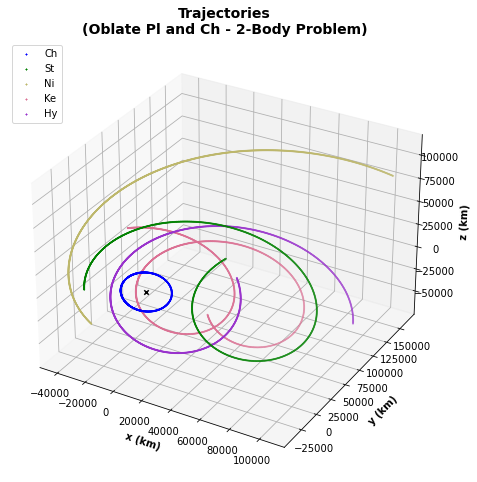

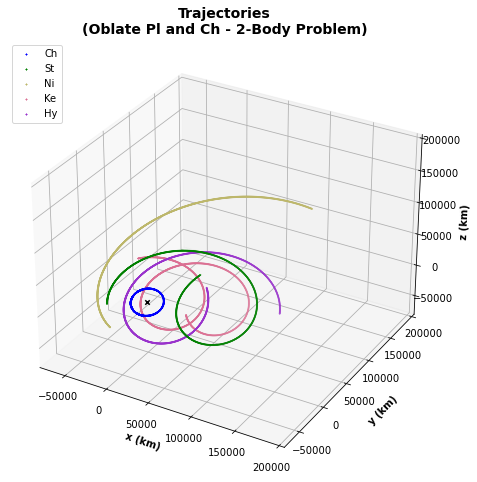

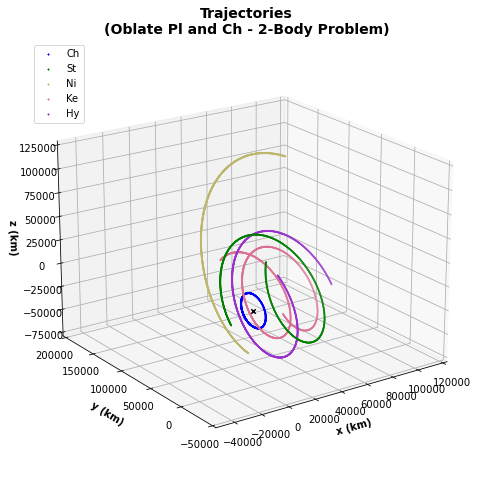

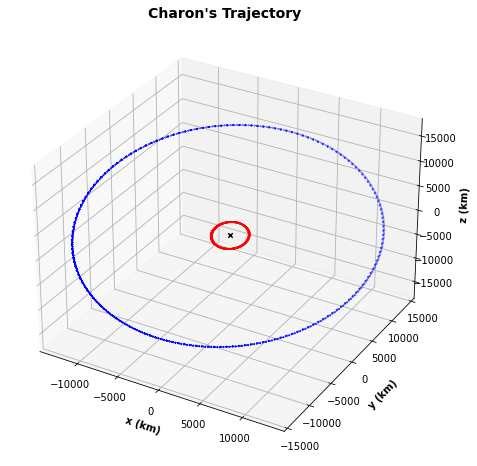

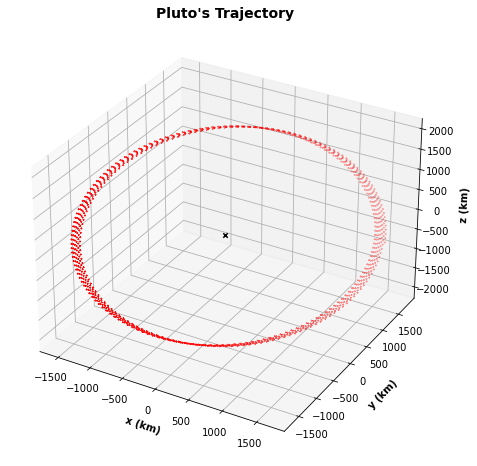

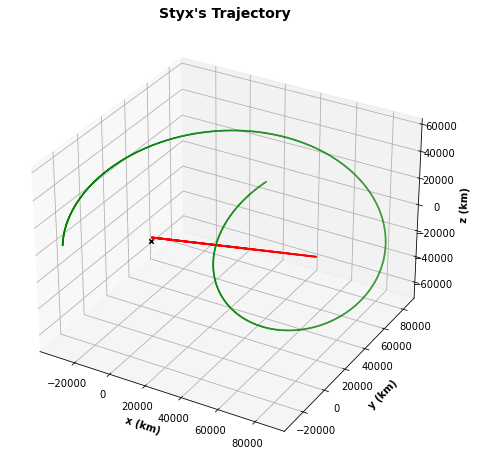

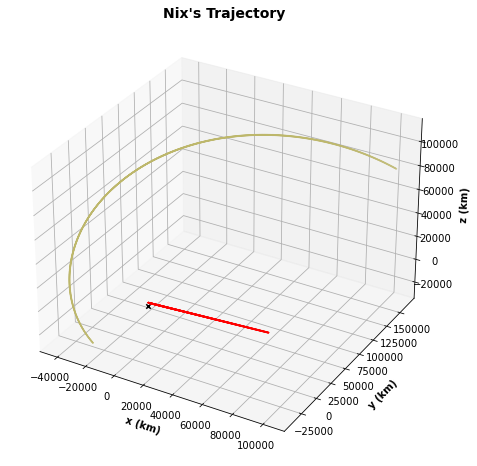

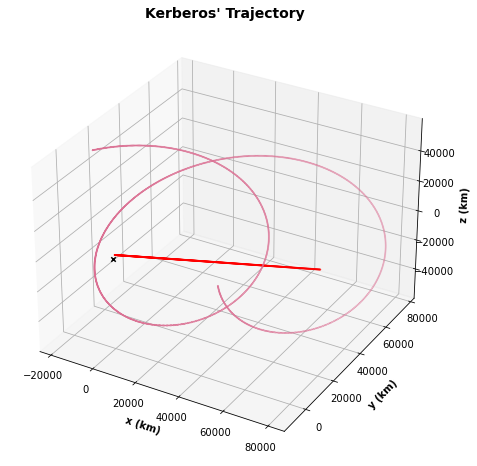

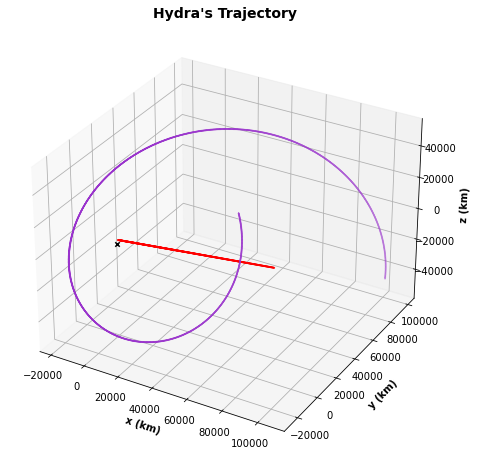

In [118]:
#-------------------------------------------------------------------------------------------------------------------------------
#Printing the approximated parameters for each body´s ellipse.
print("ELLIPTIC TRAJECTORIES' APPROXIMATED PARAMETERS:")
print("CHARON:   \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (ch_a_RK22, ch_b_RK22, ch_c_RK22, ch_e_RK22))
print("STYX:     \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (st_a_RK22, st_b_RK22, st_c_RK22, st_e_RK22))
print("NIX:      \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (ni_a_RK22, ni_b_RK22, ni_c_RK22, ni_e_RK22))
print("KERBEROS: \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (ke_a_RK22, ke_b_RK22, ke_c_RK22, ke_e_RK22))
print("HYDRA:    \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (hy_a_RK22, hy_b_RK22, hy_c_RK22, hy_e_RK22))

#-------------------------------------------------------------------------------------------------------------------------------
#PLOTS:

#Loop to plot only certain points (to ease the graphcator's job).

T = 1000                         # Amount of elements to plot (T=1000 means plotting every 1000).

pl_ch_r_RK22_g = points_plot(h_RK22, T, pl_ch_x_RK22, pl_ch_y_RK22, pl_ch_z_RK22, "Pl-Ch")
pl_st_r_RK22_g = points_plot(h_RK22, T, pl_st_x_RK22, pl_st_y_RK22, pl_st_z_RK22, "Pl-St")
pl_ni_r_RK22_g = points_plot(h_RK22, T, pl_ni_x_RK22, pl_ni_y_RK22, pl_ni_z_RK22, "Pl-Ni")
pl_ke_r_RK22_g = points_plot(h_RK22, T, pl_ke_x_RK22, pl_ke_y_RK22, pl_ke_z_RK22, "Pl-Ke")
pl_hy_r_RK22_g = points_plot(h_RK22, T, pl_hy_x_RK22, pl_hy_y_RK22, pl_hy_z_RK22, "Pl-Hy")

ch_r_RK22_g = points_plot(h_RK22, T, ch_x_RK22, ch_y_RK22, ch_z_RK22, "Ch")
st_r_RK22_g = points_plot(h_RK22, T, st_x_RK22, st_y_RK22, st_z_RK22, "St")
ni_r_RK22_g = points_plot(h_RK22, T, ni_x_RK22, ni_y_RK22, ni_z_RK22, "Ni")
ke_r_RK22_g = points_plot(h_RK22, T, ke_x_RK22, ke_y_RK22, ke_z_RK22, "Ke")
hy_r_RK22_g = points_plot(h_RK22, T, hy_x_RK22, hy_y_RK22, hy_z_RK22, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting all orbits together.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Trajectories\n(Oblate Pl and Ch - 2-Body Problem)", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(ch_r_RK22_g[:,0], ch_r_RK22_g[:,1], ch_r_RK22_g[:,2], marker="x", c=col_ch, s=1, label="Ch");
ax.scatter(st_r_RK22_g[:,0], st_r_RK22_g[:,1], st_r_RK22_g[:,2], marker="x", c=col_st, s=1, label="St");
ax.scatter(ni_r_RK22_g[:,0], ni_r_RK22_g[:,1], ni_r_RK22_g[:,2], marker="x", c=col_ni, s=1, label="Ni");
ax.scatter(ke_r_RK22_g[:,0], ke_r_RK22_g[:,1], ke_r_RK22_g[:,2], marker="x", c=col_ke, s=1, label="Ke");
ax.scatter(hy_r_RK22_g[:,0], hy_r_RK22_g[:,1], hy_r_RK22_g[:,2], marker="x", c=col_hy, s=1, label="Hy");
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
ax.legend(loc='upper left')
fig.set_size_inches(8, 8)
plt.show()

#Plotting all orbits together with axes at the same scale.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Trajectories\n(Oblate Pl and Ch - 2-Body Problem)", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(ch_r_RK22_g[:,0], ch_r_RK22_g[:,1], ch_r_RK22_g[:,2], marker="x", c=col_ch, s=1, label="Ch");
ax.scatter(st_r_RK22_g[:,0], st_r_RK22_g[:,1], st_r_RK22_g[:,2], marker="x", c=col_st, s=1, label="St");
ax.scatter(ni_r_RK22_g[:,0], ni_r_RK22_g[:,1], ni_r_RK22_g[:,2], marker="x", c=col_ni, s=1, label="Ni");
ax.scatter(ke_r_RK22_g[:,0], ke_r_RK22_g[:,1], ke_r_RK22_g[:,2], marker="x", c=col_ke, s=1, label="Ke");
ax.scatter(hy_r_RK22_g[:,0], hy_r_RK22_g[:,1], hy_r_RK22_g[:,2], marker="x", c=col_hy, s=1, label="Hy");
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
ax.set_xlim3d(-75000, 200000)
ax.set_ylim3d(-75000, 200000)
ax.set_zlim3d(-75000, 200000)
ax.legend(loc='upper left')
fig.set_size_inches(8, 8)
plt.show()

#Plotting all orbits together, from a different perspective.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Trajectories\n(Oblate Pl and Ch - 2-Body Problem)", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(ch_r_RK22_g[:,0], ch_r_RK22_g[:,1], ch_r_RK22_g[:,2], marker="x", c=col_ch, s=1, label="Ch");
ax.scatter(st_r_RK22_g[:,0], st_r_RK22_g[:,1], st_r_RK22_g[:,2], marker="x", c=col_st, s=1, label="St");
ax.scatter(ni_r_RK22_g[:,0], ni_r_RK22_g[:,1], ni_r_RK22_g[:,2], marker="x", c=col_ni, s=1, label="Ni");
ax.scatter(ke_r_RK22_g[:,0], ke_r_RK22_g[:,1], ke_r_RK22_g[:,2], marker="x", c=col_ke, s=1, label="Ke");
ax.scatter(hy_r_RK22_g[:,0], hy_r_RK22_g[:,1], hy_r_RK22_g[:,2], marker="x", c=col_hy, s=1, label="Hy");
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
ax.set_xlim3d(-50000, 120000)
ax.set_ylim3d(-50000, 200000)
ax.set_zlim3d(-75000, 125000)
ax.legend(loc='upper left')
ax.view_init(20, -125)
fig.set_size_inches(8, 8)
plt.show()

#Plotting all individual orbits.
plot_orbit_kepler2("Charon",   ch_r_RK22_g[:,0], ch_r_RK22_g[:,1], ch_r_RK22_g[:,2], pl_ch_r_RK22_g[:,0], pl_ch_r_RK22_g[:,1], pl_ch_r_RK22_g[:,2], col_ch, "Ch")

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Pluto's Trajectory", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(pl_ch_r_RK22_g[:,0], pl_ch_r_RK22_g[:,1], pl_ch_r_RK22_g[:,2], marker="x", c=col_pl, s=1, label="Pl");
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
fig.set_size_inches(8, 8)
plt.show()

plot_orbit_kepler2("Styx",     st_r_RK22_g[:,0], st_r_RK22_g[:,1], st_r_RK22_g[:,2], pl_st_r_RK22_g[:,0], pl_st_r_RK22_g[:,1], pl_st_r_RK22_g[:,2], col_st, "St")
plot_orbit_kepler2("Nix",      ni_r_RK22_g[:,0], ni_r_RK22_g[:,1], ni_r_RK22_g[:,2], pl_ni_r_RK22_g[:,0], pl_ni_r_RK22_g[:,1], pl_ni_r_RK22_g[:,2], col_ni, "Ni")
    
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Kerberos' Trajectory", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(ke_r_RK22_g[:,0], ke_r_RK22_g[:,1], ke_r_RK22_g[:,2], marker="x", c=col_ke, s=1, label="Ke");
ax.scatter(pl_ke_r_RK22_g[:,0], pl_ke_r_RK22_g[:,1], pl_ke_r_RK22_g[:,2], marker="x", c=col_pl, s=1, label="Pl");
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
fig.set_size_inches(8, 8)
plt.show()

plot_orbit_kepler2("Hydra",    hy_r_RK22_g[:,0], hy_r_RK22_g[:,1], hy_r_RK22_g[:,2], pl_hy_r_RK22_g[:,0], pl_hy_r_RK22_g[:,1], pl_hy_r_RK22_g[:,2], col_hy, "Hy")


## Animations - Oblate Pl and Ch (2-Body Problem)

#### IMPORTANT: The following code are exclusivley to generate GIF animations that we used in presentations (PowerPoint, Prezi, etc.). It is NOT necessary to run these lines if you are only interested in the results.

##### The animations are saved in GIF format directly in the folder where this notebook is located. The path can be changed for each animation, as well as the file name.

In [87]:
#-------------------------------------------------------------------------------------------------------------------------------
#Orbits around barycenter - rotating perspective.
del filenames   #If this is the first animation, comment this line.
filenames = []
T = 108
k = 360/T
lim = tqdm((range(T)), desc="GIF: ")
for i in lim:
    #Creating each frame.
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("Trajectories\nOblate Pl and Ch (2-Body Problem)", fontsize=16)
    ax.scatter(0, 0, 0, marker="x", c="black");
    ax.scatter(ch_r_RK22_g[:,0], ch_r_RK22_g[:,1], ch_r_RK22_g[:,2], marker="x", c=col_ch, s=1, label="Ch");
    ax.scatter(st_r_RK22_g[:,0], st_r_RK22_g[:,1], st_r_RK22_g[:,2], marker="x", c=col_st, s=1, label="St");
    ax.scatter(ni_r_RK22_g[:,0], ni_r_RK22_g[:,1], ni_r_RK22_g[:,2], marker="x", c=col_ni, s=1, label="Ni");
    ax.scatter(ke_r_RK22_g[:,0], ke_r_RK22_g[:,1], ke_r_RK22_g[:,2], marker="x", c=col_ke, s=1, label="Ke");
    ax.scatter(hy_r_RK22_g[:,0], hy_r_RK22_g[:,1], hy_r_RK22_g[:,2], marker="x", c=col_hy, s=1, label="Hy");
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    ax.set_xlim3d(-75000, 200000)
    ax.set_ylim3d(-75000, 200000)
    ax.set_zlim3d(-75000, 200000)
    ax.legend(loc='upper left')
    ax.view_init(20, -k*i)
    fig.set_size_inches(8, 8)
    
    # The PNG file to save the current frame is created.
    filename = f'{i}.png'
    filenames.append(filename)
    
    # The frame is saved in the PNG file.
    plt.savefig(filename)
    plt.close()
    
# The GIF is created.
with imageio.get_writer('Rotation_OPC(2BP).gif', mode='I', fps=10) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# The individual frame files are eliminated.
for filename in set(filenames):
    os.remove(filename)


GIF:   0%|          | 0/108 [00:00<?, ?it/s]

In [88]:
#-------------------------------------------------------------------------------------------------------------------------------
#Orbits around barycenter - rotating perspective (Pl and Ch 2-body system).
del filenames   #If this is the first animation, comment this line.
filenames = []
T = 108
k = 360/T
lim = tqdm((range(T)), desc="GIF: ")
for i in lim:
    #Creating each frame.
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("Charon's Trajectory\nOblate Pl and Ch (2-Body Problem)", fontsize=16)
    ax.scatter(0, 0, 0, marker="x", c="black");
    ax.scatter(ch_r_RK22_g[:,0], ch_r_RK22_g[:,1], ch_r_RK22_g[:,2], marker="x", c=col_ch, s=1, label="Ch");
    ax.scatter(pl_ch_r_RK22_g[:,0], pl_ch_r_RK22_g[:,1], pl_ch_r_RK22_g[:,2], marker="x", c=col_pl, s=1, label="Pl");
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    ax.set_xlim3d(-20000, 20000)
    ax.set_ylim3d(-20000, 20000)
    ax.set_zlim3d(-20000, 20000)
    ax.legend(loc='upper left')
    ax.view_init(20, -k*i)
    fig.set_size_inches(8, 8)
    
    # The PNG file to save the current frame is created.
    filename = f'{i}.png'
    filenames.append(filename)
    
    # The frame is saved in the PNG file.
    plt.savefig(filename)
    plt.close()
    
# The GIF is created.
with imageio.get_writer('Rotation_ch_OPC(2BP).gif', mode='I', fps=10) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# The individual frame files are eliminated.
for filename in set(filenames):
    os.remove(filename)


GIF:   0%|          | 0/108 [00:00<?, ?it/s]

In [89]:
#-------------------------------------------------------------------------------------------------------------------------------
#Orbits around barycenter - movement animation.
T = 200
k = math.floor(len(ch_r_RK22_g[:,0])/T)         # Amount of data in each of the T partitions.

del filenames   #If this is the first animation, comment this line.
filenames = []
lim = tqdm((range(T)), desc="GIF: ")
i = 0
d = 1
for j in lim:
    
    if i == 5:
        d = d + 1
        i = 0
    i = i + 1
    
    #Creating each frame.
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("Trajectories\nOblate Pl and Ch (2-Body Problem)\n2 days /s   (Day "+str(d)+")", fontsize=16)
    ax.scatter(0, 0, 0, marker="x", c="black");
    ax.plot(ch_r_RK22_g[:j*k,0], ch_r_RK22_g[:j*k,1], ch_r_RK22_g[:j*k,2], lw=1, alpha=0.5, c=col_ch);
    ax.scatter(ch_r_RK22_g[j*k,0], ch_r_RK22_g[j*k,1], ch_r_RK22_g[j*k,2], c=col_ch, label="Ch", s=40);
    ax.plot(st_r_RK22_g[:j*k,0], st_r_RK22_g[:j*k,1], st_r_RK22_g[:j*k,2], lw=1, alpha=0.5, c=col_st);
    ax.scatter(st_r_RK22_g[j*k,0], st_r_RK22_g[j*k,1], st_r_RK22_g[j*k,2], c=col_st, label="St", s=40);
    ax.plot(ni_r_RK22_g[:j*k,0], ni_r_RK22_g[:j*k,1], ni_r_RK22_g[:j*k,2], lw=1, alpha=0.5, c=col_ni);
    ax.scatter(ni_r_RK22_g[j*k,0], ni_r_RK22_g[j*k,1], ni_r_RK22_g[j*k,2], c=col_ni, label="Ni", s=40);
    ax.plot(ke_r_RK22_g[:j*k,0], ke_r_RK22_g[:j*k,1], ke_r_RK22_g[:j*k,2], lw=1, alpha=0.5, c=col_ke);
    ax.scatter(ke_r_RK22_g[j*k,0], ke_r_RK22_g[j*k,1], ke_r_RK22_g[j*k,2], c=col_ke, label="Ke", s=40);
    ax.plot(hy_r_RK22_g[:j*k,0], hy_r_RK22_g[:j*k,1], hy_r_RK22_g[:j*k,2], lw=1, alpha=0.5, c=col_hy);
    ax.scatter(hy_r_RK22_g[j*k,0], hy_r_RK22_g[j*k,1], hy_r_RK22_g[j*k,2], c=col_hy, label="Hy", s=40);
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    ax.set_xlim3d(-75000, 200000)
    ax.set_ylim3d(-75000, 200000)
    ax.set_zlim3d(-75000, 200000)
    ax.legend(loc='upper left')
    fig.set_size_inches(8, 8)
    
    # The PNG file to save the current frame is created.
    filename = f'{j}.png'
    filenames.append(filename)
    
    # The frame is saved in the PNG file.
    plt.savefig(filename)
    plt.close()
    
# The GIF is created.
with imageio.get_writer('Orbits_OPC(2BP).gif', mode='I', fps=10) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# The individual frame files are eliminated.
for filename in set(filenames):
    os.remove(filename)


GIF:   0%|          | 0/200 [00:00<?, ?it/s]

In [90]:
#-------------------------------------------------------------------------------------------------------------------------------
#Orbits around barycenter - movement animation (Pl and Ch 2-body system).
T = 200
k = math.floor(len(ch_r_RK22_g[:,0])/T)         # Amount of data in each of the T partitions.

del filenames   #If this is the first animation, comment this line.
filenames = []
lim = tqdm((range(T)), desc="GIF: ")
i = 0
d = 1
for j in lim:
    
    if i == 5:
        d = d + 1
        i = 0
    i = i + 1
    
    #Creating each frame.
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("Charon's Trajectory\nOblate Pl y Ch (2-Body Problem)\n2 days /s   (Day "+str(d)+")", fontsize=16)
    ax.scatter(0, 0, 0, marker="x", c="black");
    ax.plot(ch_r_RK22_g[:j*k,0], ch_r_RK22_g[:j*k,1], ch_r_RK22_g[:j*k,2], lw=1, alpha=0.5, c=col_ch);
    ax.scatter(ch_r_RK22_g[j*k,0], ch_r_RK22_g[j*k,1], ch_r_RK22_g[j*k,2], c=col_ch, label="Ca", s=40);
    ax.plot(pl_ch_r_RK22_g[:j*k,0], pl_ch_r_RK22_g[:j*k,1], pl_ch_r_RK22_g[:j*k,2], lw=1, alpha=0.5, c=col_pl);
    ax.scatter(pl_ch_r_RK22_g[j*k,0], pl_ch_r_RK22_g[j*k,1], pl_ch_r_RK22_g[j*k,2], c=col_pl, label="Pl", s=40);
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    ax.set_xlim3d(-20000, 20000)
    ax.set_ylim3d(-20000, 20000)
    ax.set_zlim3d(-20000, 20000)
    ax.legend(loc='upper left')
    fig.set_size_inches(8, 8)
    
    # The PNG file to save the current frame is created.
    filename = f'{j}.png'
    filenames.append(filename)
    
    # The frame is saved in the PNG file.
    plt.savefig(filename)
    plt.close()
    
# The GIF is created.
with imageio.get_writer('Orbits_ch_OPC(2BP).gif', mode='I', fps=10) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# The individual frame files are eliminated.
for filename in set(filenames):
    os.remove(filename)


GIF:   0%|          | 0/200 [00:00<?, ?it/s]

In [92]:
#-------------------------------------------------------------------------------------------------------------------------------
#Orbits around barycenter - movement animation (Pl and Ke 2-body system).
T = 200
k = math.floor(len(ke_r_RK22_g[:,0])/T)         # Amount of data in each of the T partitions.

del filenames   #If this is the first animation, comment this line.
filenames = []
lim = tqdm((range(T)), desc="GIF: ")
i = 0
d = 1
for j in lim:
    
    if i == 5:
        d = d + 1
        i = 0
    i = i + 1
    
    #Creating each frame.
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("Kerberos' Trajectory\nOblate Pl and Ch (2-Body Problem)\n2 days /s   (Day "+str(d)+")", fontsize=16)
    ax.scatter(0, 0, 0, marker="x", c="black");
    ax.plot(ke_r_RK22_g[:j*k,0], ke_r_RK22_g[:j*k,1], ke_r_RK22_g[:j*k,2], lw=1, alpha=0.5, c=col_ke);
    ax.scatter(ke_r_RK22_g[j*k,0], ke_r_RK22_g[j*k,1], ke_r_RK22_g[j*k,2], c=col_ke, label="Es", s=40);
    ax.plot(pl_ke_r_RK22_g[:j*k,0], pl_ke_r_RK22_g[:j*k,1], pl_ke_r_RK22_g[:j*k,2], lw=1, alpha=0.5, c=col_pl);
    ax.scatter(pl_ke_r_RK22_g[j*k,0], pl_ke_r_RK22_g[j*k,1], pl_ke_r_RK22_g[j*k,2], c=col_pl, label="Pl", s=40);
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    ax.set_xlim3d(-20000, 80000)
    ax.set_ylim3d(-20000, 80000)
    ax.set_zlim3d(-60000, 60000)
    ax.legend(loc='upper left')
    fig.set_size_inches(8, 8)
    
    # The PNG file to save the current frame is created.
    filename = f'{j}.png'
    filenames.append(filename)
    
    # The frame is saved in the PNG file.
    plt.savefig(filename)
    plt.close()
    
# The GIF is created.
with imageio.get_writer('Orbits_ke_OPC(2BP).gif', mode='I', fps=10) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# The individual frame files are eliminated.
for filename in set(filenames):
    os.remove(filename)


GIF:   0%|          | 0/200 [00:00<?, ?it/s]

### Fitted Planes and Orbital Periods - Oblate Pl and Ch (2-Body Problem)

##### As we mentioned, besides the Pluto-Charon system, all other trajectories are not stable because of Pluto's high initial velocity. Therefore, all analysis made for this model is only made for the 2-body system of Pluto and Charon.

##### First, we can notice that the orbital periods in this model differ a little more than model 2. This is already an indicator that this version can be improved. 

In [119]:
#-------------------------------------------------------------------------------------------------------------------------------
#Storing the data from the first orbit.
p_r_pl_RK22 = one_orbit(pl_ch_x_RK22, pl_ch_y_RK22, pl_ch_z_RK22, "Pl")
p_r_ch_RK22 = one_orbit(ch_x_RK22, ch_y_RK22, ch_z_RK22, "Ch")

#-------------------------------------------------------------------------------------------------------------------------------
#Generating the fitted plane.
print("FITTED PLANES:\n")
pln_pl_RK22 = plane("Pluto",  p_r_pl_RK22[:,0], p_r_pl_RK22[:,1], p_r_pl_RK22[:,2])
pln_ch_RK22 = plane("Charon", p_r_ch_RK22[:,0], p_r_ch_RK22[:,1], p_r_ch_RK22[:,2])

#-------------------------------------------------------------------------------------------------------------------------------
#Calculating the orbital period for each body.
per_pl_RK22 = period(h_RK22, p_r_pl_RK22[:,3])
per_ch_RK22 = period(h_RK22, p_r_ch_RK22[:,3])

print("\nORBITAL PERIOD (and amount of data for 1st orbit)\n")
print_per(h_RK22, "Pluto",  p_r_pl_RK22, per_pl_RK22)
print_per(h_RK22, "Charon", p_r_ch_RK22, per_ch_RK22)


1st Orbit (Pl):   0%|          | 0/1000001 [00:00<?, ?it/s]

1st Orbit (Ch):   0%|          | 0/1000001 [00:00<?, ?it/s]

FITTED PLANES:

Pluto: -1.742602 x + 1.602642 y + 0.028478 = z
Charon: -1.742645 x + 1.602684 y + 0.028440 = z

ORBITAL PERIOD (and amount of data for 1st orbit)

Pluto:
Amount of Data: 159632
Period (days):  6.385300000000001 +/- 2e-05

Charon:
Amount of Data: 159962
Period (days):  6.3985 +/- 2e-05



### Plotting Pluto's and Charon's Trajectory - Oblate Pl and Ch (2-Body Problem)

##### This model also presents the slight orbital precession noticeable in Pluto, as well as a less noticeable precession for Charon.

P. Proj. (Pl) ::   0%|          | 0/1000 [00:00<?, ?it/s]

P. Proj. (Ch) ::   0%|          | 0/1000 [00:00<?, ?it/s]

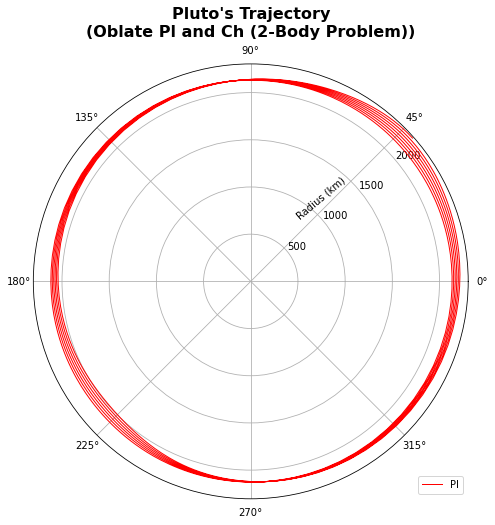

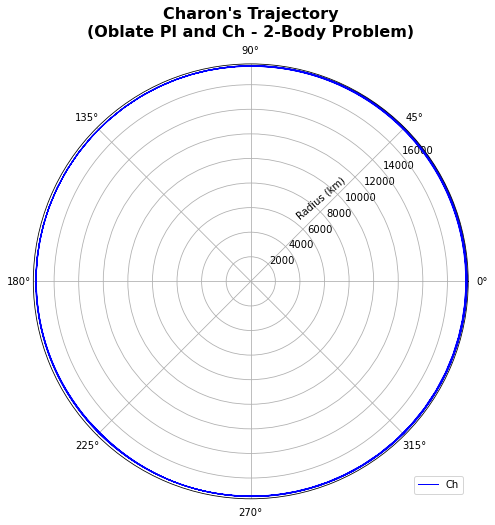

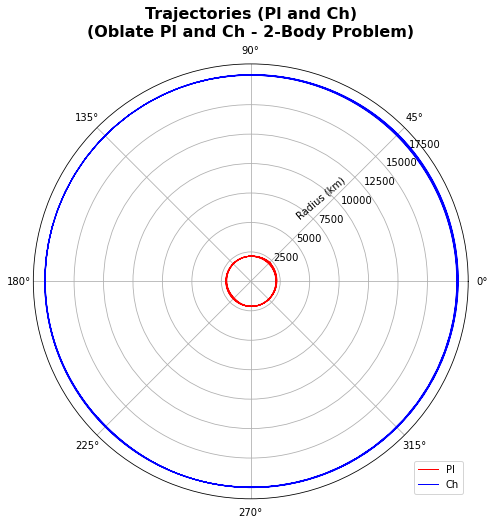

In [120]:
#-------------------------------------------------------------------------------------------------------------------------------
#Projecting the coordinates onto Pluto's and Charon's planes.
p_pl_r_RK22_g = points_proj(pl_ch_r_RK22_g[:,0], pl_ch_r_RK22_g[:,1], pl_ch_r_RK22_g[:,2], pln_pl_RK22, "Pl")
p_ch_r_RK22_g = points_proj(ch_r_RK22_g[:,0], ch_r_RK22_g[:,1], ch_r_RK22_g[:,2], pln_ch_RK22, "Ch")

#Plotting (polar) Pluto's trajectory.
fig = plt.figure()
ax = plt.subplot(111, polar=True)
fig.set_size_inches(8, 8)
ax.set_title("Pluto's Trajectory\n(Oblate Pl and Ch (2-Body Problem))", va='bottom', fontweight="bold", fontsize=16)
plt.polar(p_pl_r_RK22_g[:,4], p_pl_r_RK22_g[:,3], color=col_pl, lw=1, label="Pl")
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()

#Plotting (polar) Charon's trajectory.
fig = plt.figure()
ax = plt.subplot(111, polar=True)
fig.set_size_inches(8, 8)
ax.set_title("Charon's Trajectory\n(Oblate Pl and Ch - 2-Body Problem)", va='bottom', fontweight="bold", fontsize=16)
plt.polar(p_ch_r_RK22_g[:,4], p_ch_r_RK22_g[:,3], color=col_ch, lw=1, label="Ch")
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()

#Plotting (polar) both trajectories together.
fig = plt.figure()
ax = plt.subplot(111, polar=True)
fig.set_size_inches(8, 8)
ax.set_title("Trajectories (Pl and Ch)\n(Oblate Pl and Ch - 2-Body Problem)", va='bottom', fontweight="bold", fontsize=16)
plt.polar(p_pl_r_RK22_g[:,4], p_pl_r_RK22_g[:,3], color=col_pl, lw=1, label="Pl")
plt.polar(p_ch_r_RK22_g[:,4], p_ch_r_RK22_g[:,3], color=col_ch, lw=1, label="Ch")
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()


### Projecting the Points to the Fitted Plane - Oblate Pl and Ch (2-Body Problem)

P. Proj. (Pl) ::   0%|          | 0/159632 [00:00<?, ?it/s]

P. Proj. (Ch) ::   0%|          | 0/159962 [00:00<?, ?it/s]

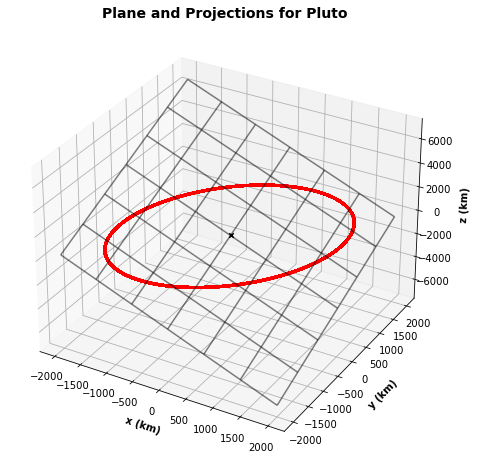

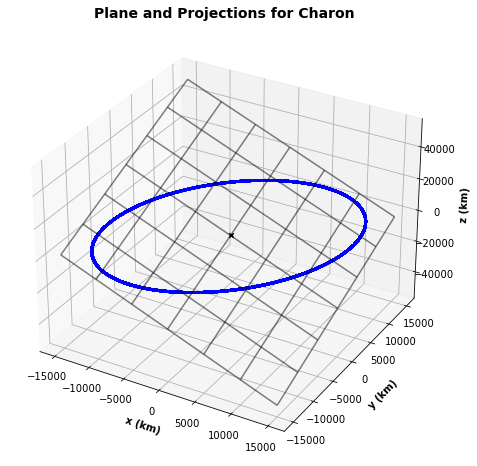

In [121]:
#-------------------------------------------------------------------------------------------------------------------------------
#Projecting the points to the corresponding plane.
p_pl_r_RK22 = points_proj(p_r_pl_RK22[:,0], p_r_pl_RK22[:,1], p_r_pl_RK22[:,2], pln_pl_RK22, "Pl")
p_ch_r_RK22 = points_proj(p_r_ch_RK22[:,0], p_r_ch_RK22[:,1], p_r_ch_RK22[:,2], pln_ch_RK22, "Ch")

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the points with the fitted plane.

#Limits for the grid to represent the fitted plane.
grid_pl = ([-2000, 2000, 7])
grid_ca = ([-15000,15000,7])
grid_es = ([-55000,55000,7])
grid_ni = ([-60000,60000,7])
grid_ce = ([-65000,65000,7])
grid_hi = ([-70000,70000,7])

#Plotting points with planes.
plot_plane("Pluto",  pln_pl_RK22, col_pl, p_pl_r_RK22, grid_pl)
plot_plane("Charon", pln_ch_RK22, col_ch, p_ch_r_RK22, grid_ch)


### Fitting Ellipses - Oblate Pl and Ch (2-Body Problem)

2D Points (Pl) ::   0%|          | 0/159632 [00:00<?, ?it/s]

2D Points (Ch) ::   0%|          | 0/159962 [00:00<?, ?it/s]

<ipython-input-8-8163926b49f2>:23: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  x = np.linalg.lstsq(A, b)[0].squeeze()      # The constants are stored. They are for the equation of the form:


ELLIPSES' EQUATIONS:
PLUTO:   2.21e-07x^2 + 9.44e-10xy+2.21e-07y^2+-4.18e-06x+-1.77e-06y = 1
CHARON:  3.27e-09x^2 + -7.54e-13xy+3.27e-09y^2+-3.58e-08x+-1.13e-07y = 1


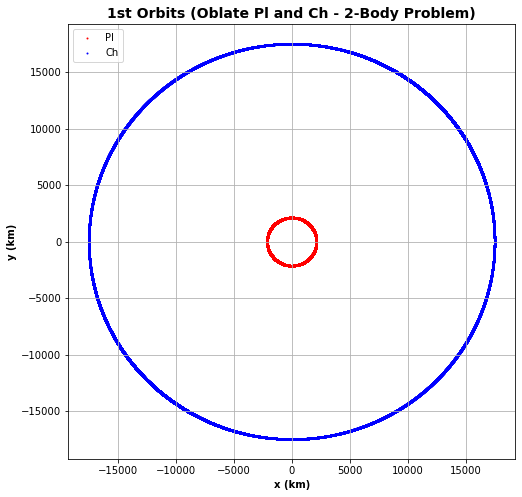

In [122]:
#-------------------------------------------------------------------------------------------------------------------------------
#Generating 2D points.
pl_2d_r_RK22 = points_2d(p_pl_r_RK22, "Pl")
ch_2d_r_RK22 = points_2d(p_ch_r_RK22, "Ch")

#-------------------------------------------------------------------------------------------------------------------------------
#Fitting the ellipses.

#Calculating the constants of the ellipse equation for each body.
ell_pl_RK22 = fit_ellipse(pl_2d_r_RK22)
ell_ch_RK22 = fit_ellipse(ch_2d_r_RK22)

#Printing the ellipse's equation for each body.
print("ELLIPSES' EQUATIONS:")
print('PLUTO:   {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_pl_RK22[0], ell_pl_RK22[1], ell_pl_RK22[2], ell_pl_RK22[3], ell_pl_RK22[4]))
print('CHARON:  {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_ch_RK22[0], ell_ch_RK22[1], ell_ch_RK22[2], ell_ch_RK22[3], ell_ch_RK22[4]))

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting all points in a single graph (approximating all planes as equal).
fig = plt.figure()
plt.scatter(pl_2d_r_RK22[:,0], pl_2d_r_RK22[:,1], c=col_pl, s=1, label="Pl")
plt.scatter(ch_2d_r_RK22[:,0], ch_2d_r_RK22[:,1], c=col_ch, s=1, label="Ch")
plt.title("1st Orbits (Oblate Pl and Ch - 2-Body Problem)", fontweight="bold", fontsize=14)
plt.xlabel("x (km)", fontweight="bold")
plt.ylabel("y (km)", fontweight="bold")
plt.legend(loc='upper left')
fig.set_size_inches(8, 8)
plt.grid()
plt.xlim([min(ch_2d_r_RK22[:,0]) - (abs(min(ch_2d_r_RK22[:,0]))/10), max(ch_2d_r_RK22[:,0]) + (abs(max(ch_2d_r_RK22[:,0]))/10)])
plt.ylim([min(ch_2d_r_RK22[:,1]) - (abs(min(ch_2d_r_RK22[:,1]))/10), max(ch_2d_r_RK22[:,1]) + (abs(max(ch_2d_r_RK22[:,1]))/10)])
plt.show()


### Fitted Ellipses' Parameters - Oblate Pl and Ch (2-Body Problem)

##### Even though we only considered 2 bodies from the PLS, the resulting parameters were very similar to those of the JPL/NASA analysis. This was a sign that all the other moons, Styx, Nix, Kerberos and Hydra, do not contribute as much to the dynamic of the two most massive bodies, Pluto and Charon.

In [123]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to print the parameters (OPC(2BP) vs. JPL/NASA).
def print_param_RK22(title, ell_a, ell_b, ell_c, ell_e, a, b, c, e):
    print(title + ':')
    print('OPC(2BP):    a: ' + str(ell_a) + '   b: ' + str(ell_b) + '   c: ' + str(ell_c) + '   e: ' + str(ell_e))
    print('JPL/NASA:    a: ' + str(a)     + '   b: ' + str(b)     + '   c: ' + str(c)     + '   e: ' + str(e))
    print("")
    

In [124]:
#-------------------------------------------------------------------------------------------------------------------------------
#Calculating the fitted ellipses' parameters.
ell_pl_a_RK22, ell_pl_b_RK22, ell_pl_c_RK22, ell_pl_e_RK22 = param_ellipse(ell_pl_RK22)
ell_ch_a_RK22, ell_ch_b_RK22, ell_ch_c_RK22, ell_ch_e_RK22 = param_ellipse(ell_ch_RK22)

#-------------------------------------------------------------------------------------------------------------------------------
#Printing the parameters to compare (OPC(2BP) vs. JPL/NASA).
print("ELLIPTIC TRAJECTORIES' PARAMETERS:")
print_param_RK22("Pluto",  ell_pl_a_RK22, ell_pl_b_RK22, ell_pl_c_RK22, ell_pl_e_RK22, ell_pl_a, ell_pl_b, ell_pl_c, ell_pl_e)
print_param_RK22("Charon", ell_ch_a_RK22, ell_ch_b_RK22, ell_ch_c_RK22, ell_ch_e_RK22, ell_ch_a, ell_ch_b, ell_ch_c, ell_ch_e)


ELLIPTIC TRAJECTORIES' PARAMETERS:
Pluto:
OPC(2BP):    a: 2129.6261255842455   b: 2124.033966246548   c: 154.2308172899396   e: 0.07242154640999579
JPL/NASA:    a: 2131.9525780276717   b: 2131.9404376378916   c: 7.194812241535554   e: 0.0033747524760581117

Charon:
OPC(2BP):    a: 17493.784983006455   b: 17487.66671597434   c: 462.62929291750993   e: 0.02644535149865647
JPL/NASA:    a: 17468.581965799047   b: 17468.569148617305   c: 21.161186529791404   e: 0.0012113854788459602



### Trajectory Comparison (Oblate Pl and Ch (2-Body Problem) vs. JPL/NASA)

##### As with the previous models, it is visually hard to identify any differences between the model results and the JPL/NASA data. The differences are much more evident by looking at the paramenters.

In [125]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to plot each body's trajectory to compare.
def plot_OPC_KP(title, th_k, r_k, th_o, r_o, col):
    fig = plt.figure()
    ax = plt.axes(polar = True)
    fig.set_size_inches(8, 8)
    ax.set_title(title+"'s Trajectories", va='bottom', fontweight="bold", fontsize=16)
    plt.polar(th_k, r_k, color=col, lw=2, label="OPC(2BP)")
    plt.polar(th_o, r_o, color=col, lw=3, linestyle='dashed')
    plt.polar(0, 0, color=col, label="JPL/NASA", linestyle="dashed")
    ax.legend(loc='lower right')
    ax.set_rlabel_position(40)
    label_position=ax.get_rlabel_position()
    ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
    plt.show()


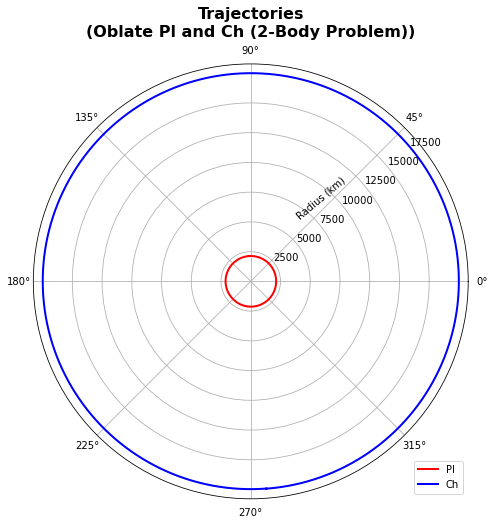

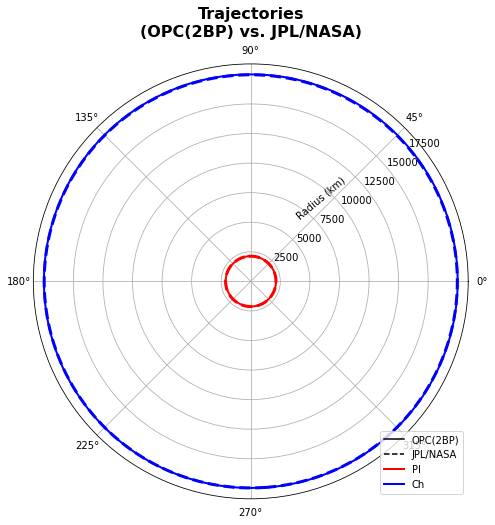

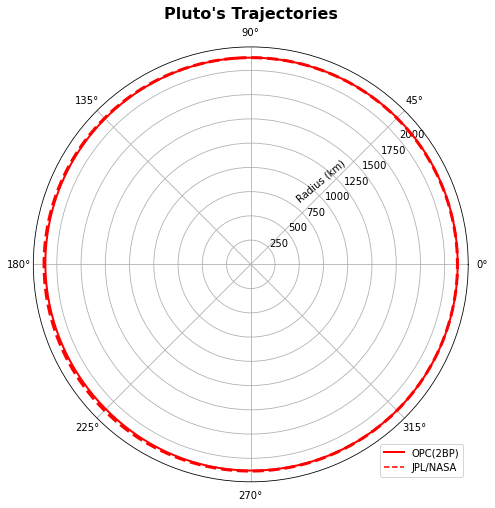

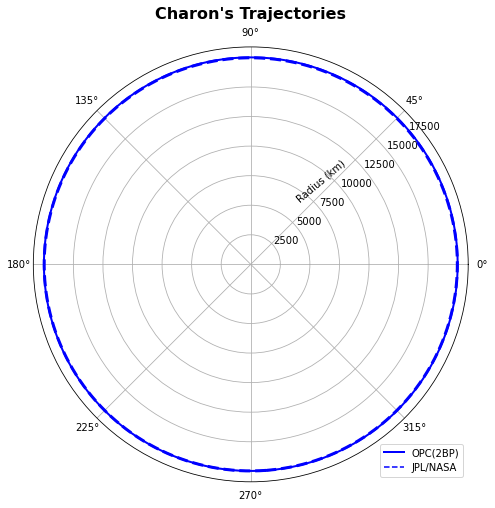

In [126]:
#-------------------------------------------------------------------------------------------------------------------------------
#Plotting all orbits together (OPC(2BP)).
fig = plt.figure()
ax = plt.subplot(111, polar=True)
fig.set_size_inches(8, 8)
ax.set_title("Trajectories\n(Oblate Pl and Ch (2-Body Problem))", va='bottom', fontweight="bold", fontsize=16)
plt.polar(p_pl_r_RK22[:,4], p_pl_r_RK22[:,3], color=col_pl, lw=2, label="Pl")
plt.polar(p_ch_r_RK22[:,4], p_ch_r_RK22[:,3], color=col_ch, lw=2, label="Ch")
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()

#Plotting all orbits together to compare (OPC(2BP) vs. JPL/NASA).
fig = plt.figure()
ax = plt.axes(polar = True)
fig.set_size_inches(8, 8)
ax.set_title("Trajectories\n(OPC(2BP) vs. JPL/NASA)", va='bottom', fontweight="bold", fontsize=16)
plt.plot(0, 0, color="black", label="OPC(2BP)")                         # These plots are
plt.plot(0, 0, color="black", label="JPL/NASA", linestyle="dashed")     # just for the labels.
plt.polar(p_pl_r_RK22[:,4], p_pl_r_RK22[:,3], color=col_pl, lw=2, label="Pl")
plt.polar(p_ch_r_RK22[:,4], p_ch_r_RK22[:,3], color=col_ch, lw=2, label="Ch")
plt.polar(p_pl_r[:,4], p_pl_r[:,3], color=col_pl, lw=3, linestyle='dashed')
plt.polar(p_ch_r[:,4], p_ch_r[:,3], color=col_ch, lw=3, linestyle='dashed')
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()

#Plotting the trajectories of each body.
plot_OPC_KP("Pluto",  p_pl_r_RK22[:,4], p_pl_r_RK22[:,3], p_pl_r[:,4], p_pl_r[:,3], col_pl)
plot_OPC_KP("Charon", p_ch_r_RK22[:,4], p_ch_r_RK22[:,3], p_ch_r[:,4], p_ch_r[:,3], col_ch)


### Angular Momentum Conservation - Oblate Pl and Ch (2-Body Problem)

##### Improving from the previous version, the angular momentum stays relatively constant around an average value. Again, this proves that the other moons do not affect the PLS in a considerable manner.

In [127]:
#-------------------------------------------------------------------------------------------------------------------------------
#Calculating the angular momentum for each body.
pl_L_RK22 = momentum(pl_ch_x_RK22, pl_ch_y_RK22, pl_ch_z_RK22, pl_ch_vx_RK22, pl_ch_vy_RK22, pl_ch_vz_RK22, pl_m, "Pl")
ch_L_RK22 = momentum(ch_x_RK22, ch_y_RK22, ch_z_RK22, ch_vx_RK22, ch_vy_RK22, ch_vz_RK22, ch_m, "Ch")

#-------------------------------------------------------------------------------------------------------------------------------
#PLS's total angular momentum.
L_t_RK22 = np.empty((len(ch_L_RK22)), float)
lim = tqdm(range(len(ch_L_RK22)), desc="Total Momentum: ")
for i in lim:
    L_t_RK22[i] = pl_L_RK22[i] + ch_L_RK22[i]


Pl's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Ch's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Total Momentum:   0%|          | 0/1000001 [00:00<?, ?it/s]

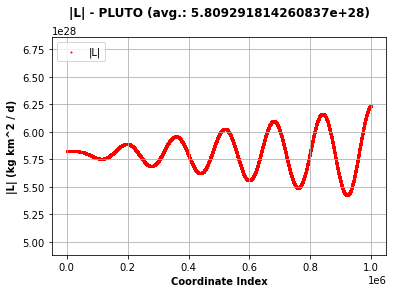

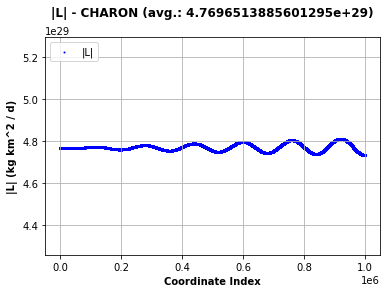

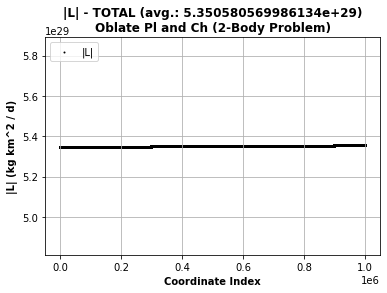

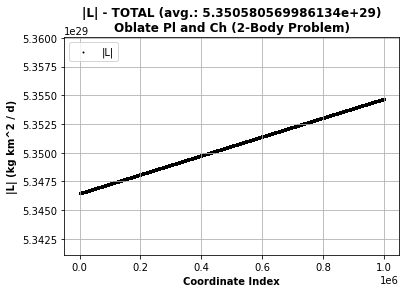

In [128]:
#-------------------------------------------------------------------------------------------------------------------------------
#Plotting each body's and the PLS's angular momentum.

#Averages.
aver_L_pl_RK22 = avg(pl_L_RK22)
aver_L_ch_RK22 = avg(ch_L_RK22)
aver_L_t_RK22  = avg(L_t_RK22)

#Plotting each body's angular momentum.
plot_L_RK("PLUTO",  pl_L_RK22, col_pl, aver_L_pl_RK22)
plot_L_RK("CHARON", ch_L_RK22, col_ch, aver_L_ch_RK22)

#Plotting the PLS's angular momentum.
fig = plt.figure()
plt.scatter(range(len(L_t_RK22)), L_t_RK22, c="black", s=1, label="|L|")
plt.title("|L| - TOTAL (avg.: " + str(aver_L_t_RK22) + ")\nOblate Pl and Ch (2-Body Problem)", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("|L| (kg km^2 / d)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
plt.ylim([min(L_t_RK22) - (min(L_t_RK22)/10), max(L_t_RK22) + (max(L_t_RK22)/10)])   # Keeps the limits 10% above and under
plt.show()                                                                           # the highest and lowest value plotted.

#Zoom to appreciate variation.
fig = plt.figure()
plt.scatter(range(len(L_t_RK22)), L_t_RK22, c="black", s=1, label="|L|")
plt.title("|L| - TOTAL (avg.: " + str(aver_L_t_RK22) + ")\nOblate Pl and Ch (2-Body Problem)", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("|L| (kg km^2 / d)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
plt.ylim([min(L_t_RK22) - (min(L_t_RK22)/1000), max(L_t_RK22) + (max(L_t_RK22)/1000)])  # Establishing limits to make the zoom.
plt.show()


### Energy Conservation - Oblate Pl and Ch (2-Body Problem)

In [129]:
#-------------------------------------------------------------------------------------------------------------------------------
#Universal Gravitational Constant (days).
G = 4.982174e-10  #(km^3 / kg d^2)

#Transformation matrices for the new system whose XY plane aligns with the body's equator.
A_pl, Ainv_pl = plane_equator(RA_pl, dec_pl)
A_pl, Ainv_pl = np.array(A_pl), np.array(Ainv_pl)

A_ch, Ainv_ch = plane_equator(RA_ch, dec_ch)
A_ch, Ainv_ch = np.array(A_ch), np.array(Ainv_ch)


#-------------------------------------------------------------------------------------------------------------------------------
#Calculating the eneregies for each body.

#Pluto
pl_T_RK22, pl_U_RK22, pl_E_RK22 = np.empty((len(pl_ch_x_RK22)), float), np.empty((len(pl_ch_x_RK22)), float), np.empty((len(pl_ch_x_RK22)), float)
lim = tqdm(range(len(pl_ch_x_RK22)), desc="Energies (Pl): ")
for i in lim:
    # The position vector from Pluto is calculated.
    rn = Ainv_pl.dot([pl_ch_x_RK22[i] - ch_x_RK22[i], pl_ch_y_RK22[i] - ch_y_RK22[i], pl_ch_z_RK22[i] - ch_z_RK22[i]])
    r = mag(rn[0], rn[1], rn[2])        # Distance between the bodies.
    ru = unitary(rn[0], rn[1], rn[2])   # The unitary vector in the radial direction is calculated.

    #Perturbative term (Pluto)
    U_p_pl = - (1/2)*(J2_pl)*(G*pl_m/(r**2))*((r_eq_pl/r)**2)*(3*(ru[2]**2) - 1)
    
    # The position vector from Charon is calculated.
    rn = Ainv_ch.dot([ch_x_RK22[i] - pl_ch_x_RK22[i], ch_y_RK22[i] - pl_ch_y_RK22[i], ch_z_RK22[i] - pl_ch_z_RK22[i]])
    r = mag(rn[0], rn[1], rn[2])        # Distance between the bodies.
    ru = unitary(rn[0], rn[1], rn[2])   # The unitary vector in the radial direction is calculated.
    
    #Perturbative term (Charon)
    U_p_ch = - (1/2)*(J2_ch)*(G*ch_m/(r**2))*((r_eq_ch/r)**2)*(3*(ru[2]**2) - 1)
    
    pl_T_RK22[i] = 0.5*pl_m*(pl_ch_v_RK22[i]**2)
    pl_U_RK22[i] = (((-G*pl_m*ch_m)/r) + U_p_pl - U_p_ch)  # The perturbative terms are included.
    pl_E_RK22[i] = pl_T_RK22[i] + pl_U_RK22[i]

    
#Charon
ch_T_RK22, ch_U_RK22, ch_E_RK22 = np.empty((len(ch_x_RK22)), float), np.empty((len(ch_x_RK22)), float), np.empty((len(ch_x_RK22)), float)
lim = tqdm(range(len(ch_x_RK22)), desc="Energies (Ch): ")
for i in lim:
    rn = Ainv_pl.dot([ch_x_RK22[i] - pl_ch_x_RK22[i], ch_y_RK22[i] - pl_ch_y_RK22[i], ch_z_RK22[i] - pl_ch_z_RK22[i]])
    r = mag(rn[0], rn[1], rn[2])
    ru = unitary(rn[0], rn[1], rn[2])

    U_p_pl = - (1/2)*(J2_pl)*(G*pl_m/(r**2))*((r_eq_pl/r)**2)*(3*(ru[2]**2) - 1)
    
    rn = Ainv_ch.dot([pl_ch_x_RK22[i] - ch_x_RK22[i], pl_ch_y_RK22[i] - ch_y_RK22[i], pl_ch_z_RK22[i] - ch_z_RK22[i]])
    r = mag(rn[0], rn[1], rn[2])
    ru = unitary(rn[0], rn[1], rn[2])
    
    U_p_ch = - (1/2)*(J2_ch)*(G*ch_m/(r**2))*((r_eq_ch/r)**2)*(3*(ru[2]**2) - 1)
    
    ch_T_RK22[i] = 0.5*ch_m*(ch_v_RK22[i]**2)
    ch_U_RK22[i] = (((-G*pl_m*ch_m)/r) - U_p_pl + U_p_ch)
    ch_E_RK22[i] = ch_T_RK22[i] + ch_U_RK22[i]

#-------------------------------------------------------------------------------------------------------------------------------
#PLS's total energy.
T_t_RK22, U_t_RK22, E_t_RK22 = np.empty((len(ch_E_RK22)), float), np.empty((len(ch_E_RK22)), float), np.empty((len(ch_E_RK22)), float)
lim = tqdm(range(len(ch_E_RK22)), desc="Energies (Tot.): ")
for i in lim:
    T_t_RK22[i] = pl_T_RK22[i] + ch_T_RK22[i]
    U_t_RK22[i] = pl_T_RK22[i] + ch_U_RK22[i]
    E_t_RK22[i] = pl_T_RK22[i] + ch_E_RK22[i]


Energies (Pl):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energies (Ch):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energies (Tot.):   0%|          | 0/1000001 [00:00<?, ?it/s]

ENERGY AVERAGES:
Pl:      T =2.847639918431314e+28    U = -5.2451103101147184e+29    E = -4.960346318271524e+29
Ch:      T =2.337867319805323e+29    U = -5.2451103101147184e+29    E = -2.90724299030946e+29
Total:   T =2.622631311648351e+29    U = -4.960346318271524e+29    E = -2.6224789984662393e+29


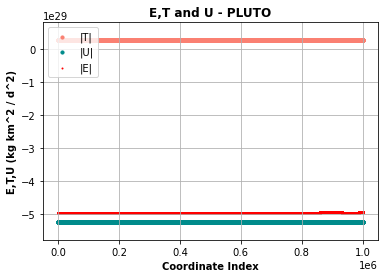

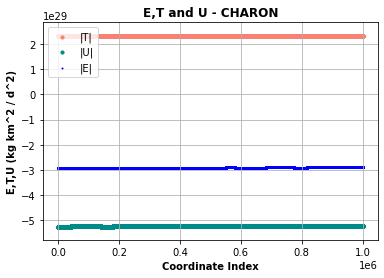

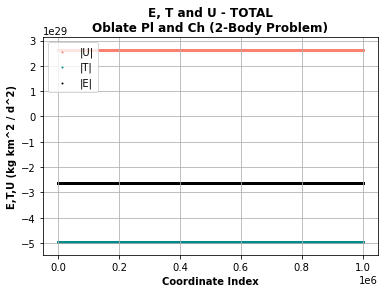

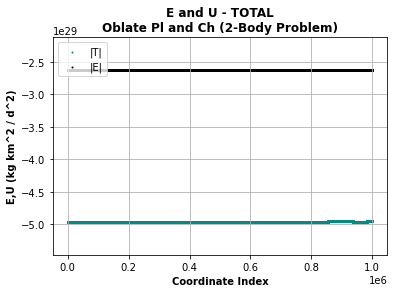

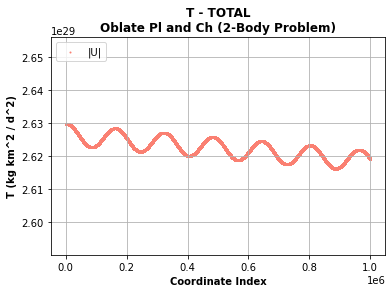

In [130]:
#-------------------------------------------------------------------------------------------------------------------------------
#Energy averages for each body.
print("ENERGY AVERAGES:")
print("Pl:      T =" + str(avg(pl_T_RK22)) + "    U = " + str(avg(pl_U_RK22)) + "    E = " +  str(avg(pl_E_RK22)))
print("Ch:      T =" + str(avg(ch_T_RK22)) + "    U = " + str(avg(ch_U_RK22)) + "    E = " +  str(avg(ch_E_RK22)))
print("Total:   T =" + str(avg(T_t_RK22))  + "    U = " + str(avg(U_t_RK22))  + "    E = " +  str(avg(E_t_RK22)))


#-------------------------------------------------------------------------------------------------------------------------------
#PLOTS:

#Plotting each body's energies.
plot_E_RK("PLUTO",  pl_T_RK22, pl_U_RK22, pl_E_RK22, col_pl)
plot_E_RK("CHARON", ch_T_RK22, ch_U_RK22, ch_E_RK22, col_ch)

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the PLS's total complete energies.
fig = plt.figure()
ax1 = fig.add_subplot(111)
ax1.scatter(range(len(T_t_RK22)), T_t_RK22, c="salmon", s=1, label="|U|")
ax1.scatter(range(len(U_t_RK22)), U_t_RK22, c="darkcyan", s=1, label="|T|")
ax1.scatter(range(len(E_t_RK22)), E_t_RK22, c="black", s=1, label="|E|")
plt.title("E, T and U - TOTAL\nOblate Pl and Ch (2-Body Problem)", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("E,T,U (kg km^2 / d^2)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
lim_inf = min(np.array([min(E_t_RK22), min(U_t_RK22), min(T_t_RK22)]))
lim_sup = max(np.array([max(E_t_RK22), max(U_t_RK22), max(T_t_RK22)]))
extra = max(np.array([abs(lim_inf), abs(lim_sup)]))
plt.ylim([lim_inf - extra/10, lim_sup + extra/10])
plt.show()

#Zoom to the total and potential energies of the PLS.
fig = plt.figure()
ax1 = fig.add_subplot(111)  
ax1.scatter(range(len(U_t_RK22)), U_t_RK22, c="darkcyan", s=1, label="|T|")
ax1.scatter(range(len(E_t_RK22)), E_t_RK22, c="black", s=1, label="|E|")
plt.title("E and U - TOTAL\nOblate Pl and Ch (2-Body Problem)", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("E,U (kg km^2 / d^2)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
lim_inf = min(np.array([min(E_t_RK22), min(U_t_RK22)]))
lim_sup = max(np.array([max(E_t_RK22), max(U_t_RK22)]))
extra = max(np.array([abs(lim_inf), abs(lim_sup)]))
plt.ylim([lim_inf - extra/10, lim_sup + extra/10])
plt.show()

#Zoom to the kinetic energy of the PLS.
fig = plt.figure()
ax1 = fig.add_subplot(111)  
ax1.scatter(range(len(T_t_RK22)), T_t_RK22, c="salmon", s=1, label="|U|")
plt.title("T - TOTAL\nOblate Pl and Ch (2-Body Problem)", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("T (kg km^2 / d^2)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
plt.ylim([min(T_t_RK22) - abs(min(T_t_RK22)/100), max(T_t_RK22) + abs(max(T_t_RK22)/100)])
plt.show()


## Model 4: Oblate Pl and Ch (6-Body Problem)

##### Now, we go back to the 6-body problem model to add the perturbative terms corresponding to Pluto and CHaron.

### Generating the Data - Oblate Pl and Ch (6-Body Problem)

In [141]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Universal Gravitational Constant (days).
G = 4.982174e-10  #(km^3 / kg d^2)

#-------------------------------------------------------------------------------------------------------------------------------
#Function for the acceleration for normal moons, considering Pl and Ch as oblates.
def func_6BP_OPC_m(A, Ainv, rpl, rch, x1, y1, z1, x2, y2, z2, x3, y3, z3, x4, y4, z4, x5, y5, z5, x6, y6, z6, m2, m3, m4, m5, m6):
    
    mu = G*pl_m     # Mass gravitational constant (Pluto).
    rn = Ainv.dot(rpl)                   # The position vector from Pluto is calculated.
    rm = mag(rn[0], rn[1], rn[2])        # Distance between bodies.
    ru = unitary(rn[0], rn[1], rn[2])    # The unitary vector in the radial direction is calculated.
    
    ax_p = - (3/2)*(J2_pl)*(mu/(rm**2))*((r_eq_pl/rm)**2)*(1 - 5*(ru[2]**2))*ru[0]    # The perturbative terms are
    ay_p = - (3/2)*(J2_pl)*(mu/(rm**2))*((r_eq_pl/rm)**2)*(1 - 5*(ru[2]**2))*ru[1]    # calculated for each
    az_p = - (3/2)*(J2_pl)*(mu/(rm**2))*((r_eq_pl/rm)**2)*(3 - 5*(ru[2]**2))*ru[2]    # component.
    
    a_p_pl = A.dot([ax_p, ay_p, az_p])   # The perturbative term is stored in an array.
    
    mu = G*ch_m    # Mass gravitational constant (Charon).
    
    rn = Ainv.dot(rch)                   # The position vector from Charon is calculated.
    rm = mag(rn[0], rn[1], rn[2])        # Distance between bodies.
    ru = unitary(rn[0], rn[1], rn[2])    # The unitary vector in the radial direction is calculated.
    
    ax_p = - (3/2)*(J2_ch)*(mu/(rm**2))*((r_eq_ch/rm)**2)*(1 - 5*(ru[2]**2))*ru[0]
    ay_p = - (3/2)*(J2_ch)*(mu/(rm**2))*((r_eq_ch/rm)**2)*(1 - 5*(ru[2]**2))*ru[1]
    az_p = - (3/2)*(J2_ch)*(mu/(rm**2))*((r_eq_ch/rm)**2)*(3 - 5*(ru[2]**2))*ru[2]
    
    a_p_ch = A.dot([ax_p, ay_p, az_p])

    d12 = math.sqrt((x2 - x1)**2 + (y2 - y1)**2 + (z2 - z1)**2)
    d13 = math.sqrt((x3 - x1)**2 + (y3 - y1)**2 + (z3 - z1)**2)   # Distances between all bodies.
    d14 = math.sqrt((x4 - x1)**2 + (y4 - y1)**2 + (z4 - z1)**2)
    d15 = math.sqrt((x5 - x1)**2 + (y5 - y1)**2 + (z5 - z1)**2)
    d16 = math.sqrt((x6 - x1)**2 + (y6 - y1)**2 + (z6 - z1)**2)

    # The acceleration according to a 6-body problem is calculated.
    ax = (((G*m2) / (d12**3))*(x2 - x1)) + (((G*m3) / (d13**3))*(x3 - x1)) + (((G*m4) / (d14**3))*(x4 - x1)) + (((G*m5) / (d15**3))*(x5 - x1)) + (((G*m6) / (d16**3))*(x6 - x1))
    ay = (((G*m2) / (d12**3))*(y2 - y1)) + (((G*m3) / (d13**3))*(y3 - y1)) + (((G*m4) / (d14**3))*(y4 - y1)) + (((G*m5) / (d15**3))*(y5 - y1)) + (((G*m6) / (d16**3))*(y6 - y1))
    az = (((G*m2) / (d12**3))*(z2 - z1)) + (((G*m3) / (d13**3))*(z3 - z1)) + (((G*m4) / (d14**3))*(z4 - z1)) + (((G*m5) / (d15**3))*(z5 - z1)) + (((G*m6) / (d16**3))*(z6 - z1))
    
    ax = ax + a_p_pl[0] + a_p_ch[0]
    ay = ay + a_p_pl[1] + a_p_ch[1]    # Adding the perturbative terms.
    az = az + a_p_pl[2] + a_p_ch[2]

    return ax, ay, az

#Function for the acceleration for Pluto, considering Pluto and Charon as oblates.
def func_6BP_OPC_pl(Apl, Ainvpl, Ach, Ainvch, x1, y1, z1, x2, y2, z2, x3, y3, z3, x4, y4, z4, x5, y5, z5, x6, y6, z6):
    d12 = math.sqrt((x2 - x1)**2 + (y2 - y1)**2 + (z2 - z1)**2)
    d13 = math.sqrt((x3 - x1)**2 + (y3 - y1)**2 + (z3 - z1)**2)   # Distances between bodies.
    d14 = math.sqrt((x4 - x1)**2 + (y4 - y1)**2 + (z4 - z1)**2)
    d15 = math.sqrt((x5 - x1)**2 + (y5 - y1)**2 + (z5 - z1)**2)
    d16 = math.sqrt((x6 - x1)**2 + (y6 - y1)**2 + (z6 - z1)**2)

    # The acceleration according to a 6-body problem is aclculated.
    ax = (((G*ch_m) / (d12**3))*(x2 - x1)) + (((G*st_m) / (d13**3))*(x3 - x1)) + (((G*ni_m) / (d14**3))*(x4 - x1)) + (((G*ke_m) / (d15**3))*(x5 - x1)) + (((G*hy_m) / (d16**3))*(x6 - x1))
    ay = (((G*ch_m) / (d12**3))*(y2 - y1)) + (((G*st_m) / (d13**3))*(y3 - y1)) + (((G*ni_m) / (d14**3))*(y4 - y1)) + (((G*ke_m) / (d15**3))*(y5 - y1)) + (((G*hy_m) / (d16**3))*(y6 - y1))
    az = (((G*ch_m) / (d12**3))*(z2 - z1)) + (((G*st_m) / (d13**3))*(z3 - z1)) + (((G*ni_m) / (d14**3))*(z4 - z1)) + (((G*ke_m) / (d15**3))*(z5 - z1)) + (((G*hy_m) / (d16**3))*(z6 - z1))
    
    
    #Charon
    mu = G*pl_m*ch_m    # Mass gravitational constant.
    
    rnpl = Ainvpl.dot([x2 - x1, y2 - y1, z2 - z1])     # The position vector from Pluto is calculated.
    rupl = unitary(rnpl[0], rnpl[1], rnpl[2])          # The unitary vector in the radial direction is calculated.
    
    rnch = Ainvch.dot([x1 - x2, y1 - y2, z1 - z2])   # The position vector from Charon is calculated.
    ruch = unitary(rnch[0], rnch[1], rnch[2])        # The unitary vector in the radial direction is calculated.
    
    ax_p = - (3/2)*(J2_pl/ch_m)*(mu/(d12**2))*((r_eq_pl/d12)**2)*(1 - 5*(rupl[2]**2))*rupl[0]    # The perturbative terms are
    ay_p = - (3/2)*(J2_pl/ch_m)*(mu/(d12**2))*((r_eq_pl/d12)**2)*(1 - 5*(rupl[2]**2))*rupl[1]    # calculated for each
    az_p = - (3/2)*(J2_pl/ch_m)*(mu/(d12**2))*((r_eq_pl/d12)**2)*(3 - 5*(rupl[2]**2))*rupl[2]    # component.
    a_p_pl = Apl.dot([ax_p, ay_p, az_p])     # Storing the perturbative term in an array.
    
    ax_p = - (3/2)*(J2_ch/pl_m)*(mu/(d12**2))*((r_eq_ch/d12)**2)*(1 - 5*(ruch[2]**2))*ruch[0]
    ay_p = - (3/2)*(J2_ch/pl_m)*(mu/(d12**2))*((r_eq_ch/d12)**2)*(1 - 5*(ruch[2]**2))*ruch[1]
    az_p = - (3/2)*(J2_ch/pl_m)*(mu/(d12**2))*((r_eq_ch/d12)**2)*(3 - 5*(ruch[2]**2))*ruch[2]
    a_p_ch = Ach.dot([ax_p, ay_p, az_p])

    ax = ax - a_p_pl[0] + a_p_ch[0]
    ay = ay - a_p_pl[1] + a_p_ch[1]    # Adding the perturbative terms.
    az = az - a_p_pl[2] + a_p_ch[2]

    
    #Styx
    mu = G*pl_m*st_m
    
    rn = Ainvpl.dot([x1 - x3, y1 - y3, z1 - z3])
    ru = unitary(rn[0], rn[1], rn[2])
    
    ax_p = - (3/2)*(J2_pl/st_m)*(mu/(d13**2))*((r_eq_pl/d13)**2)*(1 - 5*(ru[2]**2))*ru[0]
    ay_p = - (3/2)*(J2_pl/st_m)*(mu/(d13**2))*((r_eq_pl/d13)**2)*(1 - 5*(ru[2]**2))*ru[1]
    az_p = - (3/2)*(J2_pl/st_m)*(mu/(d13**2))*((r_eq_pl/d13)**2)*(3 - 5*(ru[2]**2))*ru[2]
    a_p = Apl.dot([ax_p, ay_p, az_p])

    ax = ax + a_p[0]
    ay = ay + a_p[1]
    az = az + a_p[2]
    
    
    #Nix
    mu = G*pl_m*ni_m

    rn = Ainvpl.dot([x1 - x4, y1 - y4, z1 - z4])
    ru = unitary(rn[0], rn[1], rn[2])
    
    ax_p = - (3/2)*(J2_pl/ni_m)*(mu/(d14**2))*((r_eq_pl/d14)**2)*(1 - 5*(ru[2]**2))*ru[0]
    ay_p = - (3/2)*(J2_pl/ni_m)*(mu/(d14**2))*((r_eq_pl/d14)**2)*(1 - 5*(ru[2]**2))*ru[1]
    az_p = - (3/2)*(J2_pl/ni_m)*(mu/(d14**2))*((r_eq_pl/d14)**2)*(3 - 5*(ru[2]**2))*ru[2]
    a_p = Apl.dot([ax_p, ay_p, az_p])

    ax = ax + a_p[0]
    ay = ay + a_p[1]
    az = az + a_p[2]
    
    
    #Kerberos
    mu = G*pl_m*ke_m
    
    rn = Ainvpl.dot([x1 - x5, y1 - y5, z1 - z5])
    ru = unitary(rn[0], rn[1], rn[2])
    
    ax_p = - (3/2)*(J2_pl/ke_m)*(mu/(d15**2))*((r_eq_pl/d15)**2)*(1 - 5*(ru[2]**2))*ru[0]
    ay_p = - (3/2)*(J2_pl/ke_m)*(mu/(d15**2))*((r_eq_pl/d15)**2)*(1 - 5*(ru[2]**2))*ru[1]
    az_p = - (3/2)*(J2_pl/ke_m)*(mu/(d15**2))*((r_eq_pl/d15)**2)*(3 - 5*(ru[2]**2))*ru[2]
    a_p = Apl.dot([ax_p, ay_p, az_p])

    ax = ax + a_p[0]
    ay = ay + a_p[1]
    az = az + a_p[2]

    
    #Hydra
    mu = G*pl_m*hy_m
    
    rn = Ainvpl.dot([x1 - x6, y1 - y6, z1 - z6])
    ru = unitary(rn[0], rn[1], rn[2])
    
    ax_p = - (3/2)*(J2_pl/hy_m)*(mu/(d16**2))*((r_eq_pl/d16)**2)*(1 - 5*(ru[2]**2))*ru[0]
    ay_p = - (3/2)*(J2_pl/hy_m)*(mu/(d16**2))*((r_eq_pl/d16)**2)*(1 - 5*(ru[2]**2))*ru[1]
    az_p = - (3/2)*(J2_pl/hy_m)*(mu/(d16**2))*((r_eq_pl/d16)**2)*(3 - 5*(ru[2]**2))*ru[2]
    a_p = Apl.dot([ax_p, ay_p, az_p])

    ax = ax + a_p[0]
    ay = ay + a_p[1]
    az = az + a_p[2]

    return ax, ay, az

#Function for the acceleration for Charon, considering Pluto and Charon as oblates.
def func_6BP_OPC_ch(Ach, Ainvch, Apl, Ainvpl, x1, y1, z1, x2, y2, z2, x3, y3, z3, x4, y4, z4, x5, y5, z5, x6, y6, z6):
    d12 = math.sqrt((x2 - x1)**2 + (y2 - y1)**2 + (z2 - z1)**2)
    d13 = math.sqrt((x3 - x1)**2 + (y3 - y1)**2 + (z3 - z1)**2)   # Distances between bodies.
    d14 = math.sqrt((x4 - x1)**2 + (y4 - y1)**2 + (z4 - z1)**2)
    d15 = math.sqrt((x5 - x1)**2 + (y5 - y1)**2 + (z5 - z1)**2)
    d16 = math.sqrt((x6 - x1)**2 + (y6 - y1)**2 + (z6 - z1)**2)

    # The acceleration according to a 6-body problem is calculated.
    ax = (((G*pl_m) / (d12**3))*(x2 - x1)) + (((G*st_m) / (d13**3))*(x3 - x1)) + (((G*ni_m) / (d14**3))*(x4 - x1)) + (((G*ke_m) / (d15**3))*(x5 - x1)) + (((G*hy_m) / (d16**3))*(x6 - x1))
    ay = (((G*pl_m) / (d12**3))*(y2 - y1)) + (((G*st_m) / (d13**3))*(y3 - y1)) + (((G*ni_m) / (d14**3))*(y4 - y1)) + (((G*ke_m) / (d15**3))*(y5 - y1)) + (((G*hy_m) / (d16**3))*(y6 - y1))
    az = (((G*pl_m) / (d12**3))*(z2 - z1)) + (((G*st_m) / (d13**3))*(z3 - z1)) + (((G*ni_m) / (d14**3))*(z4 - z1)) + (((G*ke_m) / (d15**3))*(z5 - z1)) + (((G*hy_m) / (d16**3))*(z6 - z1))
    
        
    #Pluto.
    mu = G*ch_m*pl_m    # Mass gravitational constant.
    
    rnpl = Ainvpl.dot([x2 - x1, y2 - y1, z2 - z1])     # The position vector from Pluto is calculated.
    rupl = unitary(rnpl[0], rnpl[1], rnpl[2])          # The unitary vector in the radial direction is calculated.
    
    rnch = Ainvch.dot([x1 - x2, y1 - y2, z1 - z2])   # The position vector from Charon is calculated.
    ruch = unitary(rnch[0], rnch[1], rnch[2])        # The unitary vector in the radial direction is calculated.
    
    ax_p = - (3/2)*(J2_pl/ch_m)*(mu/(d12**2))*((r_eq_pl/d12)**2)*(1 - 5*(rupl[2]**2))*rupl[0]    # The perturbative terms are
    ay_p = - (3/2)*(J2_pl/ch_m)*(mu/(d12**2))*((r_eq_pl/d12)**2)*(1 - 5*(rupl[2]**2))*rupl[1]    # calculated for each
    az_p = - (3/2)*(J2_pl/ch_m)*(mu/(d12**2))*((r_eq_pl/d12)**2)*(3 - 5*(rupl[2]**2))*rupl[2]    # component.
    a_p_pl = Apl.dot([ax_p, ay_p, az_p])     # Storing the perturbative term in an array.
    
    ax_p = - (3/2)*(J2_ch/pl_m)*(mu/(d12**2))*((r_eq_ch/d12)**2)*(1 - 5*(ruch[2]**2))*ruch[0]
    ay_p = - (3/2)*(J2_ch/pl_m)*(mu/(d12**2))*((r_eq_ch/d12)**2)*(1 - 5*(ruch[2]**2))*ruch[1]
    az_p = - (3/2)*(J2_ch/pl_m)*(mu/(d12**2))*((r_eq_ch/d12)**2)*(3 - 5*(ruch[2]**2))*ruch[2]
    a_p_ch = Ach.dot([ax_p, ay_p, az_p])

    ax = ax + a_p_pl[0] - a_p_ch[0]
    ay = ay + a_p_pl[1] - a_p_ch[1]    # Adding the perturbative terms.
    az = az + a_p_pl[2] - a_p_ch[2]
    
        
    #Styx.
    mu = G*ch_m*st_m
    
    rn = Ainvch.dot([x1 - x3, y1 - y3, z1 - z3])
    ru = unitary(rn[0], rn[1], rn[2])
    
    ax_p = - (3/2)*(J2_ch/st_m)*(mu/(d13**2))*((r_eq_ch/d13)**2)*(1 - 5*(ru[2]**2))*ru[0]
    ay_p = - (3/2)*(J2_ch/st_m)*(mu/(d13**2))*((r_eq_ch/d13)**2)*(1 - 5*(ru[2]**2))*ru[1]
    az_p = - (3/2)*(J2_ch/st_m)*(mu/(d13**2))*((r_eq_ch/d13)**2)*(3 - 5*(ru[2]**2))*ru[2]
    a_p = Ach.dot([ax_p, ay_p, az_p])

    ax = ax + a_p[0]
    ay = ay + a_p[1]
    az = az + a_p[2]
    
    
    #Nix.
    mu = G*ch_m*ni_m

    rn = Ainvch.dot([x1 - x4, y1 - y4, z1 - z4])
    ru = unitary(rn[0], rn[1], rn[2])
    
    ax_p = - (3/2)*(J2_ch/ni_m)*(mu/(d14**2))*((r_eq_ch/d14)**2)*(1 - 5*(ru[2]**2))*ru[0]
    ay_p = - (3/2)*(J2_ch/ni_m)*(mu/(d14**2))*((r_eq_ch/d14)**2)*(1 - 5*(ru[2]**2))*ru[1]
    az_p = - (3/2)*(J2_ch/ni_m)*(mu/(d14**2))*((r_eq_ch/d14)**2)*(3 - 5*(ru[2]**2))*ru[2]
    a_p = Ach.dot([ax_p, ay_p, az_p])

    ax = ax + a_p[0]
    ay = ay + a_p[1]
    az = az + a_p[2]
    
    
    #Kerberos.
    mu = G*ch_m*ke_m
    
    rn = Ainvch.dot([x1 - x5, y1 - y5, z1 - z5])
    ru = unitary(rn[0], rn[1], rn[2])
    
    ax_p = - (3/2)*(J2_ch/ke_m)*(mu/(d15**2))*((r_eq_ch/d15)**2)*(1 - 5*(ru[2]**2))*ru[0]
    ay_p = - (3/2)*(J2_ch/ke_m)*(mu/(d15**2))*((r_eq_ch/d15)**2)*(1 - 5*(ru[2]**2))*ru[1]
    az_p = - (3/2)*(J2_ch/ke_m)*(mu/(d15**2))*((r_eq_ch/d15)**2)*(3 - 5*(ru[2]**2))*ru[2]
    a_p = Ach.dot([ax_p, ay_p, az_p])

    ax = ax + a_p[0]
    ay = ay + a_p[1]
    az = az + a_p[2]

    
    #Hydra.
    mu = G*ch_m*hy_m
    
    rn = Ainvpl.dot([x1 - x6, y1 - y6, z1 - z6])
    ru = unitary(rn[0], rn[1], rn[2])
    
    ax_p = - (3/2)*(J2_ch/hy_m)*(mu/(d16**2))*((r_eq_ch/d16)**2)*(1 - 5*(ru[2]**2))*ru[0]
    ay_p = - (3/2)*(J2_ch/hy_m)*(mu/(d16**2))*((r_eq_ch/d16)**2)*(1 - 5*(ru[2]**2))*ru[1]
    az_p = - (3/2)*(J2_ch/hy_m)*(mu/(d16**2))*((r_eq_ch/d16)**2)*(3 - 5*(ru[2]**2))*ru[2]
    a_p = Ach.dot([ax_p, ay_p, az_p])

    ax = ax + a_p[0]
    ay = ay + a_p[1]
    az = az + a_p[2]

    return ax, ay, az
    

In [144]:
#-------------------------------------------------------------------------------------------------------------------------------
#Universal Gravitational Constant (days).
G = 4.982174e-10  #(km^3 / kg d^2)

#-------------------------------------------------------------------------------------------------------------------------------
#Transformation matrices for the new system whose XY plane aligns with the body's equator.
A_pl, Ainv_pl = plane_equator(RA_pl, dec_pl)
A_pl, Ainv_pl = np.array(A_pl), np.array(Ainv_pl)

A_ch, Ainv_ch = plane_equator(RA_ch, dec_ch)
A_ch, Ainv_ch = np.array(A_ch), np.array(Ainv_ch)

#-------------------------------------------------------------------------------------------------------------------------------
#Step settings.

N = 1000000      # Amount of iterations.
a = 0            # Initial time = 0.
b = 40           # Amount of days.

h_RK3 = (b-a)/N      # Step.

t_RK3 = np.empty((N+1), float)
t_RK3[0] = a        # Array to store time.

#-------------------------------------------------------------------------------------------------------------------------------
#Declaring the arrays.

pl_x_RK3, pl_y_RK3, pl_z_RK3 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ch_x_RK3, ch_y_RK3, ch_z_RK3 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
st_x_RK3, st_y_RK3, st_z_RK3 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ni_x_RK3, ni_y_RK3, ni_z_RK3 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ke_x_RK3, ke_y_RK3, ke_z_RK3 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
hy_x_RK3, hy_y_RK3, hy_z_RK3 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)

pl_vx_RK3, pl_vy_RK3, pl_vz_RK3 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ch_vx_RK3, ch_vy_RK3, ch_vz_RK3 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
st_vx_RK3, st_vy_RK3, st_vz_RK3 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ni_vx_RK3, ni_vy_RK3, ni_vz_RK3 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
ke_vx_RK3, ke_vy_RK3, ke_vz_RK3 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)
hy_vx_RK3, hy_vy_RK3, hy_vz_RK3 = np.empty((N+1), float), np.empty((N+1), float), np.empty((N+1), float)

#-------------------------------------------------------------------------------------------------------------------------------
#Initial conditions (00:00:00 1/Ene/2021).

#Initial positions.
pl_x_RK3[0], pl_y_RK3[0], pl_z_RK3[0] = pl_r[0,0], pl_r[0,1], pl_r[0,2]
ch_x_RK3[0], ch_y_RK3[0], ch_z_RK3[0] = ch_r[0,0], ch_r[0,1], ch_r[0,2]
st_x_RK3[0], st_y_RK3[0], st_z_RK3[0] = st_r[0,0], st_r[0,1], st_r[0,2]
ni_x_RK3[0], ni_y_RK3[0], ni_z_RK3[0] = ni_r[0,0], ni_r[0,1], ni_r[0,2]
ke_x_RK3[0], ke_y_RK3[0], ke_z_RK3[0] = ke_r[0,0], ke_r[0,1], ke_r[0,2]
hy_x_RK3[0], hy_y_RK3[0], hy_z_RK3[0] = hy_r[0,0], hy_r[0,1], hy_r[0,2]

#Initial velocitist
n = 86400   # Converting from sec. to days.

pl_vx_RK3[0], pl_vy_RK3[0], pl_vz_RK3[0] = n*pl_v[0,0], n*pl_v[0,1], n*pl_v[0,2]
ch_vx_RK3[0], ch_vy_RK3[0], ch_vz_RK3[0] = n*ch_v[0,0], n*ch_v[0,1], n*ch_v[0,2]
st_vx_RK3[0], st_vy_RK3[0], st_vz_RK3[0] = n*st_v[0,0], n*st_v[0,1], n*st_v[0,2]
ni_vx_RK3[0], ni_vy_RK3[0], ni_vz_RK3[0] = n*ni_v[0,0], n*ni_v[0,1], n*ni_v[0,2]
ke_vx_RK3[0], ke_vy_RK3[0], ke_vz_RK3[0] = n*ke_v[0,0], n*ke_v[0,1], n*ke_v[0,2]
hy_vx_RK3[0], hy_vy_RK3[0], hy_vz_RK3[0] = n*hy_v[0,0], n*hy_v[0,1], n*hy_v[0,2]

#-------------------------------------------------------------------------------------------------------------------------------
#Loop for the trajectorist.
lim = tqdm(range(int(N)), desc="RK Loop: ")
for i in lim:
    
    #Pluto
    
    # Generating the "k" constants for the velocitist.
    k1x, k1y, k1z = func_6BP_OPC_pl(A_pl, Ainv_pl, A_ch, Ainv_ch, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i])
    k1x, k1y, k1z = h_RK3*k1x, h_RK3*k1y, h_RK3*k1z
    k2x, k2y, k2z = func_6BP_OPC_pl(A_pl, Ainv_pl, A_ch, Ainv_ch, pl_x_RK3[i] + k1x/2, pl_y_RK3[i] + k1y/2, pl_z_RK3[i] + k1z/2, ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i])
    k2x, k2y, k2z = h_RK3*k2x, h_RK3*k2y, h_RK3*k2z
    k3x, k3y, k3z = func_6BP_OPC_pl(A_pl, Ainv_pl, A_ch, Ainv_ch, pl_x_RK3[i] + k2x/2, pl_y_RK3[i] + k2y/2, pl_z_RK3[i] + k2z/2, ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i])
    k3x, k3y, k3z = h_RK3*k3x, h_RK3*k3y, h_RK3*k3z
    k4x, k4y, k4z = func_6BP_OPC_pl(A_pl, Ainv_pl, A_ch, Ainv_ch, pl_x_RK3[i] + k3x, pl_y_RK3[i] + k3y, pl_z_RK3[i] + k3z, ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i])
    k4x, k4y, k4z = h_RK3*k4x, h_RK3*k4y, h_RK3*k4z
    
    # Generating the next value for the velocity.
    pl_vx_RK3[i+1] = pl_vx_RK3[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    pl_vy_RK3[i+1] = pl_vy_RK3[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    pl_vz_RK3[i+1] = pl_vz_RK3[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    # Generating the "k" constants for the positions.
    k1x, k1y, k1z = h_RK3*pl_vx_RK3[i], h_RK3*pl_vy_RK3[i], h_RK3*pl_vz_RK3[i]
    k2x, k2y, k2z = h_RK3*(pl_vx_RK3[i] + k1x/2), h_RK3*(pl_vy_RK3[i] + k1y/2), h_RK3*(pl_vz_RK3[i] + k1z/2)
    k3x, k3y, k3z = h_RK3*(pl_vx_RK3[i] + k2x/2), h_RK3*(pl_vy_RK3[i] + k2y/2), h_RK3*(pl_vz_RK3[i] + k2z/2)
    k4x, k4y, k4z = h_RK3*(pl_vx_RK3[i] + k3x), h_RK3*(pl_vy_RK3[i] + k3y), h_RK3*(pl_vz_RK3[i] + k3z)

    # Generating the next value for the position.
    pl_x_RK3[i+1] = pl_x_RK3[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    pl_y_RK3[i+1] = pl_y_RK3[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    pl_z_RK3[i+1] = pl_z_RK3[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
    #Charon
    k1x, k1y, k1z = func_6BP_OPC_ch(A_ch, Ainv_ch, A_pl, Ainv_pl, ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i])
    k1x, k1y, k1z = h_RK3*k1x, h_RK3*k1y, h_RK3*k1z
    k2x, k2y, k2z = func_6BP_OPC_ch(A_ch, Ainv_ch, A_pl, Ainv_pl, ch_x_RK3[i] + k1x/2, ch_y_RK3[i] + k1y/2, ch_z_RK3[i] + k1z/2, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i])
    k2x, k2y, k2z = h_RK3*k2x, h_RK3*k2y, h_RK3*k2z
    k3x, k3y, k3z = func_6BP_OPC_ch(A_ch, Ainv_ch, A_pl, Ainv_pl, ch_x_RK3[i] + k2x/2, ch_y_RK3[i] + k2y/2, ch_z_RK3[i] + k2z/2, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i])
    k3x, k3y, k3z = h_RK3*k3x, h_RK3*k3y, h_RK3*k3z
    k4x, k4y, k4z = func_6BP_OPC_ch(A_ch, Ainv_ch, A_pl, Ainv_pl, ch_x_RK3[i] + k3x, ch_y_RK3[i] + k3y, ch_z_RK3[i] + k3z, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i])
    k4x, k4y, k4z = h_RK3*k4x, h_RK3*k4y, h_RK3*k4z
    
    ch_vx_RK3[i+1] = ch_vx_RK3[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ch_vy_RK3[i+1] = ch_vy_RK3[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ch_vz_RK3[i+1] = ch_vz_RK3[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK3*ch_vx_RK3[i], h_RK3*ch_vy_RK3[i], h_RK3*ch_vz_RK3[i]
    k2x, k2y, k2z = h_RK3*(ch_vx_RK3[i] + k1x/2), h_RK3*(ch_vy_RK3[i] + k1y/2), h_RK3*(ch_vz_RK3[i] + k1z/2)
    k3x, k3y, k3z = h_RK3*(ch_vx_RK3[i] + k2x/2), h_RK3*(ch_vy_RK3[i] + k2y/2), h_RK3*(ch_vz_RK3[i] + k2z/2)
    k4x, k4y, k4z = h_RK3*(ch_vx_RK3[i] + k3x), h_RK3*(ch_vy_RK3[i] + k3y), h_RK3*(ch_vz_RK3[i] + k3z)

    ch_x_RK3[i+1] = ch_x_RK3[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ch_y_RK3[i+1] = ch_y_RK3[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ch_z_RK3[i+1] = ch_z_RK3[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)

    
    #Styx
    rpl = ([pl_x_RK3[i] - st_x_RK3[i], pl_y_RK3[i] - st_y_RK3[i], pl_z_RK3[i] - st_z_RK3[i]])
    rch = ([ch_x_RK3[i] - st_x_RK3[i], ch_y_RK3[i] - st_y_RK3[i], ch_z_RK3[i] - st_z_RK3[i]])
    k1x, k1y, k1z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i], pl_m, ch_m, ni_m, ke_m, hy_m)
    k1x, k1y, k1z = h_RK3*k1x, h_RK3*k1y, h_RK3*k1z
    rpl = ([pl_x_RK3[i] - st_x_RK3[i] - k1x/2, pl_y_RK3[i] - st_y_RK3[i] - k1y/2, pl_z_RK3[i] - st_z_RK3[i] - k1z/2])
    rch = ([ch_x_RK3[i] - st_x_RK3[i] - k1x/2, ch_y_RK3[i] - st_y_RK3[i] - k1y/2, ch_z_RK3[i] - st_z_RK3[i] - k1z/2])
    k2x, k2y, k2z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, st_x_RK3[i] + k1x/2, st_y_RK3[i] + k1y/2, st_z_RK3[i] + k1z/2, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i], pl_m, ch_m, ni_m, ke_m, hy_m)
    k2x, k2y, k2z = h_RK3*k2x, h_RK3*k2y, h_RK3*k2z
    rpl = ([pl_x_RK3[i] - st_x_RK3[i] - k2x/2, pl_y_RK3[i] - st_y_RK3[i] - k2y/2, pl_z_RK3[i] - st_z_RK3[i] - k2z/2])
    rch = ([ch_x_RK3[i] - st_x_RK3[i] - k2x/2, ch_y_RK3[i] - st_y_RK3[i] - k2y/2, ch_z_RK3[i] - st_z_RK3[i] - k2z/2])
    k3x, k3y, k3z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, st_x_RK3[i] + k2x/2, st_y_RK3[i] + k2y/2, st_z_RK3[i] + k2z/2, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i], pl_m, ch_m, ni_m, ke_m, hy_m)
    k3x, k3y, k3z = h_RK3*k3x, h_RK3*k3y, h_RK3*k3z
    rpl = ([pl_x_RK3[i] - st_x_RK3[i] - k3x, pl_y_RK3[i] - st_y_RK3[i] - k3y, pl_z_RK3[i] - st_z_RK3[i] - k3z])
    rch = ([ch_x_RK3[i] - st_x_RK3[i] - k3x, ch_y_RK3[i] - st_y_RK3[i] - k3y, ch_z_RK3[i] - st_z_RK3[i] - k3z])
    k4x, k4y, k4z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, st_x_RK3[i] + k3x, st_y_RK3[i] + k3y, st_z_RK3[i] + k3z, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i], pl_m, ch_m, ni_m, ke_m, hy_m)
    k4x, k4y, k4z = h_RK3*k4x, h_RK3*k4y, h_RK3*k4z
    
    st_vx_RK3[i+1] = st_vx_RK3[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    st_vy_RK3[i+1] = st_vy_RK3[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    st_vz_RK3[i+1] = st_vz_RK3[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK3*st_vx_RK3[i], h_RK3*st_vy_RK3[i], h_RK3*st_vz_RK3[i]
    k2x, k2y, k2z = h_RK3*(st_vx_RK3[i] + k1x/2), h_RK3*(st_vy_RK3[i] + k1y/2), h_RK3*(st_vz_RK3[i] + k1z/2)
    k3x, k3y, k3z = h_RK3*(st_vx_RK3[i] + k2x/2), h_RK3*(st_vy_RK3[i] + k2y/2), h_RK3*(st_vz_RK3[i] + k2z/2)
    k4x, k4y, k4z = h_RK3*(st_vx_RK3[i] + k3x), h_RK3*(st_vy_RK3[i] + k3y), h_RK3*(st_vz_RK3[i] + k3z)

    st_x_RK3[i+1] = st_x_RK3[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    st_y_RK3[i+1] = st_y_RK3[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    st_z_RK3[i+1] = st_z_RK3[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
    #Nix
    rpl = ([pl_x_RK3[i] - ni_x_RK3[i], pl_y_RK3[i] - ni_y_RK3[i], pl_z_RK3[i] - ni_z_RK3[i]])
    rch = ([ch_x_RK3[i] - ni_x_RK3[i], ch_y_RK3[i] - ni_y_RK3[i], ch_z_RK3[i] - ni_z_RK3[i]])
    k1x, k1y, k1z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i], pl_m, ch_m, st_m, ke_m, hy_m)
    k1x, k1y, k1z = h_RK3*k1x, h_RK3*k1y, h_RK3*k1z
    rpl = ([pl_x_RK3[i] - ni_x_RK3[i] - k1x/2, pl_y_RK3[i] - ni_y_RK3[i] - k1y/2, pl_z_RK3[i] - ni_z_RK3[i] - k1z/2])
    rch = ([ch_x_RK3[i] - ni_x_RK3[i] - k1x/2, ch_y_RK3[i] - ni_y_RK3[i] - k1y/2, ch_z_RK3[i] - ni_z_RK3[i] - k1z/2])
    k2x, k2y, k2z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, ni_x_RK3[i] + k1x/2, ni_y_RK3[i] + k1y/2, ni_z_RK3[i] + k1z/2, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i], pl_m, ch_m, st_m, ke_m, hy_m)
    k2x, k2y, k2z = h_RK3*k2x, h_RK3*k2y, h_RK3*k2z
    rpl = ([pl_x_RK3[i] - ni_x_RK3[i] - k2x/2, pl_y_RK3[i] - ni_y_RK3[i] - k2y/2, pl_z_RK3[i] - ni_z_RK3[i] - k2z/2])
    rch = ([ch_x_RK3[i] - ni_x_RK3[i] - k2x/2, ch_y_RK3[i] - ni_y_RK3[i] - k2y/2, ch_z_RK3[i] - ni_z_RK3[i] - k2z/2])
    k3x, k3y, k3z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, ni_x_RK3[i] + k2x/2, ni_y_RK3[i] + k2y/2, ni_z_RK3[i] + k2z/2, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i], pl_m, ch_m, st_m, ke_m, hy_m)
    k3x, k3y, k3z = h_RK3*k3x, h_RK3*k3y, h_RK3*k3z
    rpl = ([pl_x_RK3[i] - ni_x_RK3[i] - k3x, pl_y_RK3[i] - ni_y_RK3[i] - k3y, pl_z_RK3[i] - ni_z_RK3[i] - k3z])
    rch = ([ch_x_RK3[i] - ni_x_RK3[i] - k3x, ch_y_RK3[i] - ni_y_RK3[i] - k3y, ch_z_RK3[i] - ni_z_RK3[i] - k3z])
    k4x, k4y, k4z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, ni_x_RK3[i] + k3x, ni_y_RK3[i] + k3y, ni_z_RK3[i] + k3z, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i], pl_m, ch_m, st_m, ke_m, hy_m)
    k4x, k4y, k4z = h_RK3*k4x, h_RK3*k4y, h_RK3*k4z
    
    ni_vx_RK3[i+1] = ni_vx_RK3[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ni_vy_RK3[i+1] = ni_vy_RK3[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ni_vz_RK3[i+1] = ni_vz_RK3[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK3*ni_vx_RK3[i], h_RK3*ni_vy_RK3[i], h_RK3*ni_vz_RK3[i]
    k2x, k2y, k2z = h_RK3*(ni_vx_RK3[i] + k1x/2), h_RK3*(ni_vy_RK3[i] + k1y/2), h_RK3*(ni_vz_RK3[i] + k1z/2)
    k3x, k3y, k3z = h_RK3*(ni_vx_RK3[i] + k2x/2), h_RK3*(ni_vy_RK3[i] + k2y/2), h_RK3*(ni_vz_RK3[i] + k2z/2)
    k4x, k4y, k4z = h_RK3*(ni_vx_RK3[i] + k3x), h_RK3*(ni_vy_RK3[i] + k3y), h_RK3*(ni_vz_RK3[i] + k3z)

    ni_x_RK3[i+1] = ni_x_RK3[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ni_y_RK3[i+1] = ni_y_RK3[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ni_z_RK3[i+1] = ni_z_RK3[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
    #Kerberos
    rpl = ([pl_x_RK3[i] - ke_x_RK3[i], pl_y_RK3[i] - ke_y_RK3[i], pl_z_RK3[i] - ke_z_RK3[i]])
    rch = ([ch_x_RK3[i] - ke_x_RK3[i], ch_y_RK3[i] - ke_y_RK3[i], ch_z_RK3[i] - ke_z_RK3[i]])
    k1x, k1y, k1z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i], pl_m, ch_m, st_m, ni_m, hy_m)
    k1x, k1y, k1z = h_RK3*k1x, h_RK3*k1y, h_RK3*k1z
    rpl = ([pl_x_RK3[i] - ke_x_RK3[i] - k1x/2, pl_y_RK3[i] - ke_y_RK3[i] - k1y/2, pl_z_RK3[i] - ke_z_RK3[i] - k1z/2])
    rch = ([ch_x_RK3[i] - ke_x_RK3[i] - k1x/2, ch_y_RK3[i] - ke_y_RK3[i] - k1y/2, ch_z_RK3[i] - ke_z_RK3[i] - k1z/2])
    k2x, k2y, k2z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, ke_x_RK3[i] + k1x/2, ke_y_RK3[i] + k1y/2, ke_z_RK3[i] + k1z/2, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i], pl_m, ch_m, st_m, ni_m, hy_m)
    k2x, k2y, k2z = h_RK3*k2x, h_RK3*k2y, h_RK3*k2z
    rpl = ([pl_x_RK3[i] - ke_x_RK3[i] - k2x/2, pl_y_RK3[i] - ke_y_RK3[i] - k2y/2, pl_z_RK3[i] - ke_z_RK3[i] - k2z/2])
    rch = ([ch_x_RK3[i] - ke_x_RK3[i] - k2x/2, ch_y_RK3[i] - ke_y_RK3[i] - k2y/2, ch_z_RK3[i] - ke_z_RK3[i] - k2z/2])
    k3x, k3y, k3z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, ke_x_RK3[i] + k2x/2, ke_y_RK3[i] + k2y/2, ke_z_RK3[i] + k2z/2, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i], pl_m, ch_m, st_m, ni_m, hy_m)
    k3x, k3y, k3z = h_RK3*k3x, h_RK3*k3y, h_RK3*k3z
    rpl = ([pl_x_RK3[i] - ke_x_RK3[i] - k3x, pl_y_RK3[i] - ke_y_RK3[i] - k3y, pl_z_RK3[i] - ke_z_RK3[i] - k3z])
    rch = ([ch_x_RK3[i] - ke_x_RK3[i] - k3x, ch_y_RK3[i] - ke_y_RK3[i] - k3y, ch_z_RK3[i] - ke_z_RK3[i] - k3z])
    k4x, k4y, k4z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, ke_x_RK3[i] + k3x, ke_y_RK3[i] + k3y, ke_z_RK3[i] + k3z, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i], pl_m, ch_m, st_m, ni_m, hy_m)
    k4x, k4y, k4z = h_RK3*k4x, h_RK3*k4y, h_RK3*k4z
    
    ke_vx_RK3[i+1] = ke_vx_RK3[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ke_vy_RK3[i+1] = ke_vy_RK3[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ke_vz_RK3[i+1] = ke_vz_RK3[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK3*ke_vx_RK3[i], h_RK3*ke_vy_RK3[i], h_RK3*ke_vz_RK3[i]
    k2x, k2y, k2z = h_RK3*(ke_vx_RK3[i] + k1x/2), h_RK3*(ke_vy_RK3[i] + k1y/2), h_RK3*(ke_vz_RK3[i] + k1z/2)
    k3x, k3y, k3z = h_RK3*(ke_vx_RK3[i] + k2x/2), h_RK3*(ke_vy_RK3[i] + k2y/2), h_RK3*(ke_vz_RK3[i] + k2z/2)
    k4x, k4y, k4z = h_RK3*(ke_vx_RK3[i] + k3x), h_RK3*(ke_vy_RK3[i] + k3y), h_RK3*(ke_vz_RK3[i] + k3z)

    ke_x_RK3[i+1] = ke_x_RK3[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    ke_y_RK3[i+1] = ke_y_RK3[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    ke_z_RK3[i+1] = ke_z_RK3[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    
    #Hydra
    rpl = ([pl_x_RK3[i] - hy_x_RK3[i], pl_y_RK3[i] - hy_y_RK3[i], pl_z_RK3[i] - hy_z_RK3[i]])
    rch = ([ch_x_RK3[i] - hy_x_RK3[i], ch_y_RK3[i] - hy_y_RK3[i], ch_z_RK3[i] - hy_z_RK3[i]])
    k1x, k1y, k1z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, hy_x_RK3[i], hy_y_RK3[i], hy_z_RK3[i], pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], pl_m, ch_m, st_m, ni_m, ke_m)
    k1x, k1y, k1z = h_RK3*k1x, h_RK3*k1y, h_RK3*k1z
    rpl = ([pl_x_RK3[i] - hy_x_RK3[i] - k1x/2, pl_y_RK3[i] - hy_y_RK3[i] - k1y/2, pl_z_RK3[i] - hy_z_RK3[i] - k1z/2])
    rch = ([ch_x_RK3[i] - hy_x_RK3[i] - k1x/2, ch_y_RK3[i] - hy_y_RK3[i] - k1y/2, ch_z_RK3[i] - hy_z_RK3[i] - k1z/2])
    k2x, k2y, k2z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, hy_x_RK3[i] + k1x/2, hy_y_RK3[i] + k1y/2, hy_z_RK3[i] + k1z/2, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], pl_m, ch_m, st_m, ni_m, ke_m)
    k2x, k2y, k2z = h_RK3*k2x, h_RK3*k2y, h_RK3*k2z
    rpl = ([pl_x_RK3[i] - hy_x_RK3[i] - k2x/2, pl_y_RK3[i] - hy_y_RK3[i] - k2y/2, pl_z_RK3[i] - hy_z_RK3[i] - k2z/2])
    rch = ([ch_x_RK3[i] - hy_x_RK3[i] - k2x/2, ch_y_RK3[i] - hy_y_RK3[i] - k2y/2, ch_z_RK3[i] - hy_z_RK3[i] - k2z/2])
    k3x, k3y, k3z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, hy_x_RK3[i] + k2x/2, hy_y_RK3[i] + k2y/2, hy_z_RK3[i] + k2z/2, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], pl_m, ch_m, st_m, ni_m, ke_m)
    k3x, k3y, k3z = h_RK3*k3x, h_RK3*k3y, h_RK3*k3z
    rpl = ([pl_x_RK3[i] - hy_x_RK3[i] - k3x, pl_y_RK3[i] - hy_y_RK3[i] - k3y, pl_z_RK3[i] - hy_z_RK3[i] - k3z])
    rch = ([ch_x_RK3[i] - hy_x_RK3[i] - k3x, ch_y_RK3[i] - hy_y_RK3[i] - k3y, ch_z_RK3[i] - hy_z_RK3[i] - k3z])
    k4x, k4y, k4z = func_6BP_OPC_m(A_pl, Ainv_pl, rpl, rch, hy_x_RK3[i] + k3x, hy_y_RK3[i] + k3y, hy_z_RK3[i] + k3z, pl_x_RK3[i], pl_y_RK3[i], pl_z_RK3[i], ch_x_RK3[i], ch_y_RK3[i], ch_z_RK3[i], st_x_RK3[i], st_y_RK3[i], st_z_RK3[i], ni_x_RK3[i], ni_y_RK3[i], ni_z_RK3[i], ke_x_RK3[i], ke_y_RK3[i], ke_z_RK3[i], pl_m, ch_m, st_m, ni_m, ke_m)
    k4x, k4y, k4z = h_RK3*k4x, h_RK3*k4y, h_RK3*k4z
    
    hy_vx_RK3[i+1] = hy_vx_RK3[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    hy_vy_RK3[i+1] = hy_vy_RK3[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    hy_vz_RK3[i+1] = hy_vz_RK3[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    
    k1x, k1y, k1z = h_RK3*hy_vx_RK3[i], h_RK3*hy_vy_RK3[i], h_RK3*hy_vz_RK3[i]
    k2x, k2y, k2z = h_RK3*(hy_vx_RK3[i] + k1x/2), h_RK3*(hy_vy_RK3[i] + k1y/2), h_RK3*(hy_vz_RK3[i] + k1z/2)
    k3x, k3y, k3z = h_RK3*(hy_vx_RK3[i] + k2x/2), h_RK3*(hy_vy_RK3[i] + k2y/2), h_RK3*(hy_vz_RK3[i] + k2z/2)
    k4x, k4y, k4z = h_RK3*(hy_vx_RK3[i] + k3x), h_RK3*(hy_vy_RK3[i] + k3y), h_RK3*(hy_vz_RK3[i] + k3z)

    hy_x_RK3[i+1] = hy_x_RK3[i] + (1/6)*(k1x + 2*k2x + 2*k3x + k4x)
    hy_y_RK3[i+1] = hy_y_RK3[i] + (1/6)*(k1y + 2*k2y + 2*k3y + k4y)
    hy_z_RK3[i+1] = hy_z_RK3[i] + (1/6)*(k1z + 2*k2z + 2*k3z + k4z)
    

    # Updating time:
    t_RK3[i+1] = t_RK3[i] + h_RK3
    
#-------------------------------------------------------------------------------------------------------------------------------
#Initial approximation of the elliptic trajectorist' parameters.

#The same functions used in previous models are used here.

#calculating the distanke to the origin for each coordinate.
pl_r_RK3 = radii(pl_x_RK3, pl_y_RK3, pl_z_RK3, "Pl r")
ch_r_RK3 = radii(ch_x_RK3, ch_y_RK3, ch_z_RK3, "Ch r")
st_r_RK3 = radii(st_x_RK3, st_y_RK3, st_z_RK3, "St r")
ni_r_RK3 = radii(ni_x_RK3, ni_y_RK3, ni_z_RK3, "Ni r")
ke_r_RK3 = radii(ke_x_RK3, ke_y_RK3, ke_z_RK3, "Ke r")
hy_r_RK3 = radii(hy_x_RK3, hy_y_RK3, hy_z_RK3, "Hy r")

#calculating the magnitude of the velocity for each point.
pl_v_RK3 = radii(pl_vx_RK3, pl_vy_RK3, pl_vz_RK3, "Pl v")
ch_v_RK3 = radii(ch_vx_RK3, ch_vy_RK3, ch_vz_RK3, "Ch v")
st_v_RK3 = radii(st_vx_RK3, st_vy_RK3, st_vz_RK3, "St v")
ni_v_RK3 = radii(ni_vx_RK3, ni_vy_RK3, ni_vz_RK3, "Ni v")
ke_v_RK3 = radii(ke_vx_RK3, ke_vy_RK3, ke_vz_RK3, "Ke v")
hy_v_RK3 = radii(hy_vx_RK3, hy_vy_RK3, hy_vz_RK3, "Hy v")

#calculating the approximated parameters (assuming an elliptic trajectory).
pl_a_RK3, pl_b_RK3, pl_c_RK3, pl_e_RK3 = param_RK(pl_r_RK3)
ch_a_RK3, ch_b_RK3, ch_c_RK3, ch_e_RK3 = param_RK(ch_r_RK3)
st_a_RK3, st_b_RK3, st_c_RK3, st_e_RK3 = param_RK(st_r_RK3)
ni_a_RK3, ni_b_RK3, ni_c_RK3, ni_e_RK3 = param_RK(ni_r_RK3)
ke_a_RK3, ke_b_RK3, ke_c_RK3, ke_e_RK3 = param_RK(ke_r_RK3)
hy_a_RK3, hy_b_RK3, hy_c_RK3, hy_e_RK3 = param_RK(hy_r_RK3)


RK Loop:   0%|          | 0/1000000 [00:00<?, ?it/s]

Pl r's Radii ::   0%|          | 0/1000001 [00:01<?, ?it/s]

Ch r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

St r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ni r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ke r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Hy r's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Pl v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ch v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

St v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ni v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Ke v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

Hy v's Radii ::   0%|          | 0/1000001 [00:00<?, ?it/s]

ELLIPTIC TRAJECTORIES' APPROXIMATED PARAMETERS:
Pluto:    \ a: 2141.570323 \ b: 2136.483324 \ c: 147.521033 \ e: 0.068885
Charon:   \ a: 17528.386645 \ b: 17527.766145 \ c: 147.486775 \ e: 0.008414
Styx:     \ a: 42562.980576 \ b: 42561.124125 \ c: 397.528247 \ e: 0.009340
Nix:      \ a: 48804.278374 \ b: 48804.029116 \ c: 155.979587 \ e: 0.003196
Kerberos: \ a: 57740.871938 \ b: 57740.711940 \ c: 135.929500 \ e: 0.002354
Hydra:    \ a: 64739.524822 \ b: 64738.476677 \ c: 368.390595 \ e: 0.005690


Points to Plot (Pl x):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Ch x):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (St x):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Ni x):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Ke x):   0%|          | 0/1000 [00:00<?, ?it/s]

Points to Plot (Hy x):   0%|          | 0/1000 [00:00<?, ?it/s]

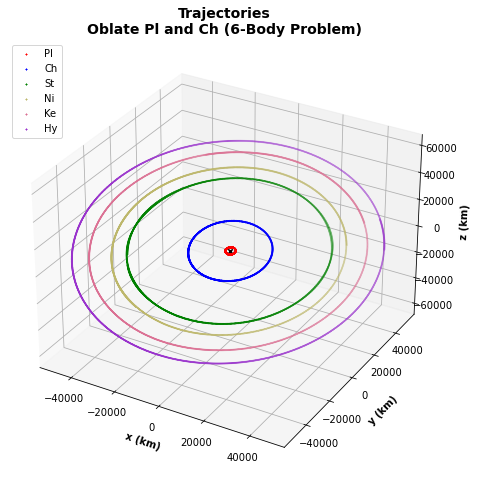

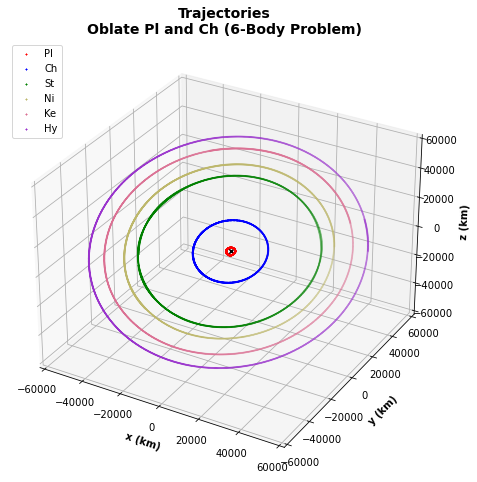

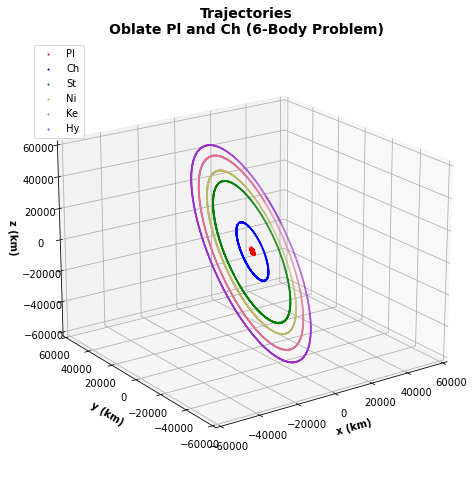

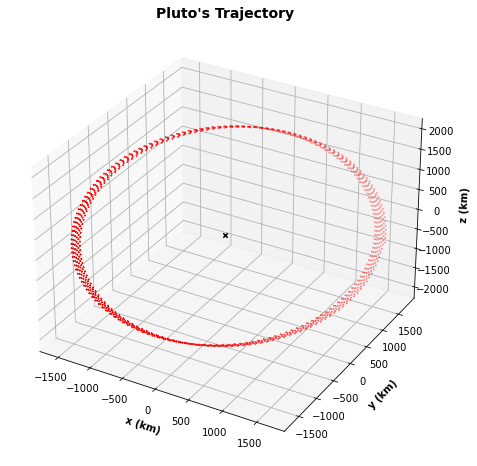

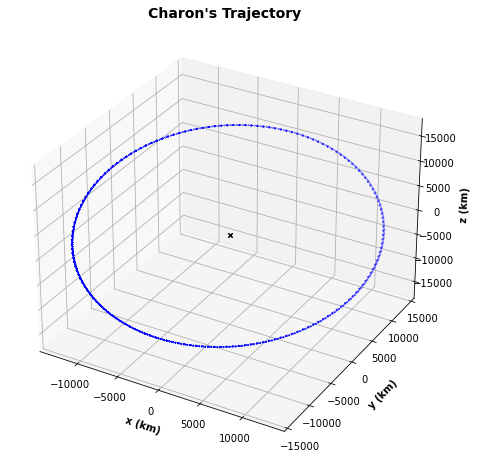

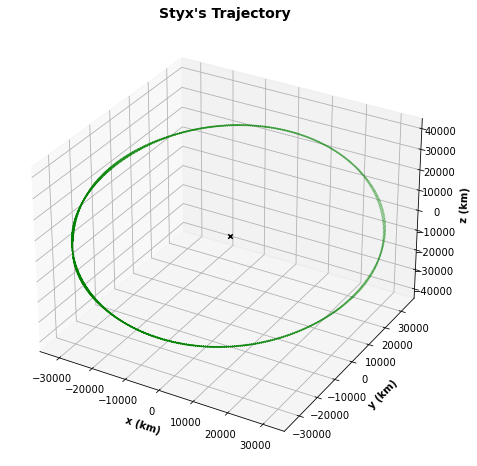

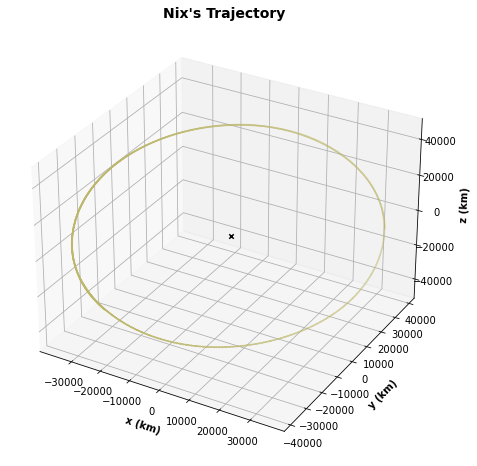

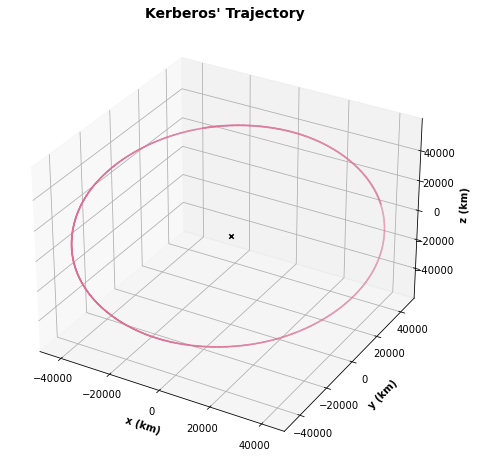

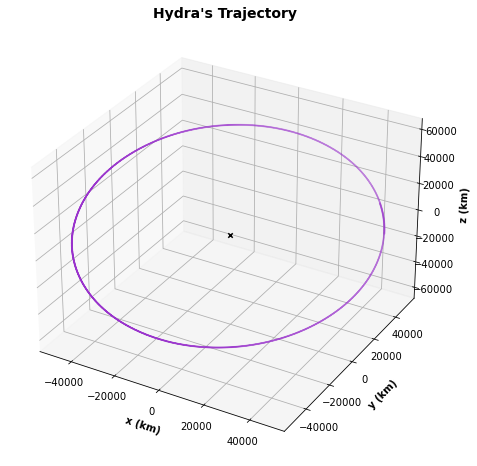

In [145]:
#-------------------------------------------------------------------------------------------------------------------------------
#Printing the approximated parameters for each ellipse.
print("ELLIPTIC TRAJECTORIES' APPROXIMATED PARAMETERS:")
print("Pluto:    \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (pl_a_RK3, pl_b_RK3, pl_c_RK3, pl_e_RK3))
print("Charon:   \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (ch_a_RK3, ch_b_RK3, ch_c_RK3, ch_e_RK3))
print("Styx:     \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (st_a_RK3, st_b_RK3, st_c_RK3, st_e_RK3))
print("Nix:      \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (ni_a_RK3, ni_b_RK3, ni_c_RK3, ni_e_RK3))
print("Kerberos: \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (ke_a_RK3, ke_b_RK3, ke_c_RK3, ke_e_RK3))
print("Hydra:    \\ a: %f \\ b: %f \\ c: %f \\ e: %f" % (hy_a_RK3, hy_b_RK3, hy_c_RK3, hy_e_RK3))

#-------------------------------------------------------------------------------------------------------------------------------
#PLOTS:

#Loop to plot only certain points (to ease the graphcator's job).

T = 1000                         # Amount of elements to plot (T=1000 means plotting every 1000).

pl_r_RK3_g = points_plot(h_RK3, T, pl_x_RK3, pl_y_RK3, pl_z_RK3, "Pl x")
ch_r_RK3_g = points_plot(h_RK3, T, ch_x_RK3, ch_y_RK3, ch_z_RK3, "Ch x")
st_r_RK3_g = points_plot(h_RK3, T, st_x_RK3, st_y_RK3, st_z_RK3, "St x")
ni_r_RK3_g = points_plot(h_RK3, T, ni_x_RK3, ni_y_RK3, ni_z_RK3, "Ni x")
ke_r_RK3_g = points_plot(h_RK3, T, ke_x_RK3, ke_y_RK3, ke_z_RK3, "Ke x")
hy_r_RK3_g = points_plot(h_RK3, T, hy_x_RK3, hy_y_RK3, hy_z_RK3, "Hy x")

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting all orbits together.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Trajectories\nOblate Pl and Ch (6-Body Problem)", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(pl_r_RK3_g[:,0], pl_r_RK3_g[:,1], pl_r_RK3_g[:,2], marker="x", c=col_pl, s=1, label="Pl");
ax.scatter(ch_r_RK3_g[:,0], ch_r_RK3_g[:,1], ch_r_RK3_g[:,2], marker="x", c=col_ch, s=1, label="Ch");
ax.scatter(st_r_RK3_g[:,0], st_r_RK3_g[:,1], st_r_RK3_g[:,2], marker="x", c=col_st, s=1, label="St");
ax.scatter(ni_r_RK3_g[:,0], ni_r_RK3_g[:,1], ni_r_RK3_g[:,2], marker="x", c=col_ni, s=1, label="Ni");
ax.scatter(ke_r_RK3_g[:,0], ke_r_RK3_g[:,1], ke_r_RK3_g[:,2], marker="x", c=col_ke, s=1, label="Ke");
ax.scatter(hy_r_RK3_g[:,0], hy_r_RK3_g[:,1], hy_r_RK3_g[:,2], marker="x", c=col_hy, s=1, label="Hy");
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
ax.legend(loc='upper left')
fig.set_size_inches(8, 8)
plt.show()

#Plotting all orbits together with axes at the same scale.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Trajectories\nOblate Pl and Ch (6-Body Problem)", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(pl_r_RK3_g[:,0], pl_r_RK3_g[:,1], pl_r_RK3_g[:,2], marker="x", c=col_pl, s=1, label="Pl");
ax.scatter(ch_r_RK3_g[:,0], ch_r_RK3_g[:,1], ch_r_RK3_g[:,2], marker="x", c=col_ch, s=1, label="Ch");
ax.scatter(st_r_RK3_g[:,0], st_r_RK3_g[:,1], st_r_RK3_g[:,2], marker="x", c=col_st, s=1, label="St");
ax.scatter(ni_r_RK3_g[:,0], ni_r_RK3_g[:,1], ni_r_RK3_g[:,2], marker="x", c=col_ni, s=1, label="Ni");
ax.scatter(ke_r_RK3_g[:,0], ke_r_RK3_g[:,1], ke_r_RK3_g[:,2], marker="x", c=col_ke, s=1, label="Ke");
ax.scatter(hy_r_RK3_g[:,0], hy_r_RK3_g[:,1], hy_r_RK3_g[:,2], marker="x", c=col_hy, s=1, label="Hy");
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
ax.set_xlim3d(-60000, 60000)
ax.set_ylim3d(-60000, 60000)
ax.set_zlim3d(-60000, 60000)
ax.legend(loc='upper left')
fig.set_size_inches(8, 8)
plt.show()

#Plotting all orbits together, from a different perspective.
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Trajectories\nOblate Pl and Ch (6-Body Problem)", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(pl_r_RK3_g[:,0], pl_r_RK3_g[:,1], pl_r_RK3_g[:,2], marker="x", c=col_pl, s=1, label="Pl");
ax.scatter(ch_r_RK3_g[:,0], ch_r_RK3_g[:,1], ch_r_RK3_g[:,2], marker="x", c=col_ch, s=1, label="Ch");
ax.scatter(st_r_RK3_g[:,0], st_r_RK3_g[:,1], st_r_RK3_g[:,2], marker="x", c=col_st, s=1, label="St");
ax.scatter(ni_r_RK3_g[:,0], ni_r_RK3_g[:,1], ni_r_RK3_g[:,2], marker="x", c=col_ni, s=1, label="Ni");
ax.scatter(ke_r_RK3_g[:,0], ke_r_RK3_g[:,1], ke_r_RK3_g[:,2], marker="x", c=col_ke, s=1, label="Ke");
ax.scatter(hy_r_RK3_g[:,0], hy_r_RK3_g[:,1], hy_r_RK3_g[:,2], marker="x", c=col_hy, s=1, label="Hy");
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
ax.set_xlim3d(-60000, 60000)
ax.set_ylim3d(-60000, 60000)
ax.set_zlim3d(-60000, 60000)
ax.legend(loc='upper left')
ax.view_init(20, -125)
fig.set_size_inches(8, 8)
plt.show()

#Plotting all individual orbits.
plot_orbit("Pluto",    pl_r_RK3_g[:,0], pl_r_RK3_g[:,1], pl_r_RK3_g[:,2], col_pl, "Pl")
plot_orbit("Charon",   ch_r_RK3_g[:,0], ch_r_RK3_g[:,1], ch_r_RK3_g[:,2], col_ch, "Ch")
plot_orbit("Styx",     st_r_RK3_g[:,0], st_r_RK3_g[:,1], st_r_RK3_g[:,2], col_st, "St")
plot_orbit("Nix",      ni_r_RK3_g[:,0], ni_r_RK3_g[:,1], ni_r_RK3_g[:,2], col_ni, "Ni")

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_title("Kerberos' Trajectory", fontweight="bold", fontsize=14)
ax.scatter(0, 0, 0, marker="x", c="black");
ax.scatter(ke_r_RK3_g[:,0], ke_r_RK3_g[:,1], ke_r_RK3_g[:,2], marker="x", c=col_ke, s=1, label="Ke");
ax.set_xlabel("x (km)", fontweight="bold")
ax.set_ylabel("\ny (km)", fontweight="bold")
ax.set_zlabel("\nz (km)", fontweight="bold")
fig.set_size_inches(8, 8)
plt.show()

plot_orbit("Hydra",    hy_r_RK3_g[:,0], hy_r_RK3_g[:,1], hy_r_RK3_g[:,2], col_hy, "Hy")


## Animations - Oblate Pl and Ch (6-Body Problem)

#### IMPORTANT: The following code are exclusivley to generate GIF animations that we used in presentations (PowerPoint, Prezi, etc.). It is NOT necessary to run these lines if you are only interested in the results.

##### The animations are saved in GIF format directly in the folder where this notebook is located. The path can be changed for each animation, as well as the file name.

In [146]:
#-------------------------------------------------------------------------------------------------------------------------------
#Orbits around barycenter - rotating perspective.
del filenames   #If this is the first animation, comment this line.
filenames = []
T = 108
k = 360/T
lim = tqdm((range(T)), desc="GIF: ")
for i in lim:
    #Creating each frame.
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("Trajectories\nOblate Pl and Ch (6-Body Problem)", fontsize=16)
    ax.scatter(0, 0, 0, marker="x", c="black");
    ax.scatter(pl_r_RK3_g[:,0], pl_r_RK3_g[:,1], pl_r_RK3_g[:,2], marker="x", c=col_pl, s=1, label="Pl");
    ax.scatter(ch_r_RK3_g[:,0], ch_r_RK3_g[:,1], ch_r_RK3_g[:,2], marker="x", c=col_ch, s=1, label="Ch");
    ax.scatter(st_r_RK3_g[:,0], st_r_RK3_g[:,1], st_r_RK3_g[:,2], marker="x", c=col_st, s=1, label="St");
    ax.scatter(ni_r_RK3_g[:,0], ni_r_RK3_g[:,1], ni_r_RK3_g[:,2], marker="x", c=col_ni, s=1, label="Ni");
    ax.scatter(ke_r_RK3_g[:,0], ke_r_RK3_g[:,1], ke_r_RK3_g[:,2], marker="x", c=col_ke, s=1, label="Ke");
    ax.scatter(hy_r_RK3_g[:,0], hy_r_RK3_g[:,1], hy_r_RK3_g[:,2], marker="x", c=col_hy, s=1, label="Hy");
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    ax.set_xlim3d(-60000, 60000)
    ax.set_ylim3d(-60000, 60000)
    ax.set_zlim3d(-60000, 60000)
    ax.legend(loc='upper left')
    ax.view_init(20, -k*i)
    fig.set_size_inches(8, 8)
    
    # The PNG file to save the current frame is created.
    filename = f'{i}.png'
    filenames.append(filename)
    
    # The frame is saved in the PNG file.
    plt.savefig(filename)
    plt.close()
    
# The GIF is created.
with imageio.get_writer('Rotation_OPC(6BP).gif', mode='I', fps=10) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# The individual frame files are eliminated.
for filename in set(filenames):
    os.remove(filename)


GIF:   0%|          | 0/108 [00:00<?, ?it/s]

In [147]:
#-------------------------------------------------------------------------------------------------------------------------------
#Orbits around barycenter - movement animation.
T = 200
k = math.floor(len(pl_r_RK3_g[:,0])/T)         # Amount of data in each of the T partitions.

del filenames   #If this is the first animation, comment this line.
filenames = []
lim = tqdm((range(T)), desc="GIF: ")
i = 0
d = 1
for j in lim:
    
    if i == 5:
        d = d + 1
        i = 0
    i = i + 1
    
    #Creating each frame.
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("Trajectories\nOblate Pl and Ch (6-Body Problem)\n2 days /s   (Day "+str(d)+")", fontsize=14)
    ax.scatter(0, 0, 0, marker="x", c="black");
    ax.plot(pl_r_RK3_g[:j*k,0], pl_r_RK3_g[:j*k,1], pl_r_RK3_g[:j*k,2], lw=1, alpha=0.5, c=col_pl);
    ax.scatter(pl_r_RK3_g[j*k,0], pl_r_RK3_g[j*k,1], pl_r_RK3_g[j*k,2], c=col_pl, label="Pl", s=40);
    ax.plot(ch_r_RK3_g[:j*k,0], ch_r_RK3_g[:j*k,1], ch_r_RK3_g[:j*k,2], lw=1, alpha=0.5, c=col_ch);
    ax.scatter(ch_r_RK3_g[j*k,0], ch_r_RK3_g[j*k,1], ch_r_RK3_g[j*k,2], c=col_ch, label="Ch", s=40);
    ax.plot(st_r_RK3_g[:j*k,0], st_r_RK3_g[:j*k,1], st_r_RK3_g[:j*k,2], lw=1, alpha=0.5, c=col_st);
    ax.scatter(st_r_RK3_g[j*k,0], st_r_RK3_g[j*k,1], st_r_RK3_g[j*k,2], c=col_st, label="St", s=40);
    ax.plot(ni_r_RK3_g[:j*k,0], ni_r_RK3_g[:j*k,1], ni_r_RK3_g[:j*k,2], lw=1, alpha=0.5, c=col_ni);
    ax.scatter(ni_r_RK3_g[j*k,0], ni_r_RK3_g[j*k,1], ni_r_RK3_g[j*k,2], c=col_ni, label="Ni", s=40);
    ax.plot(ke_r_RK3_g[:j*k,0], ke_r_RK3_g[:j*k,1], ke_r_RK3_g[:j*k,2], lw=1, alpha=0.5, c=col_ke);
    ax.scatter(ke_r_RK3_g[j*k,0], ke_r_RK3_g[j*k,1], ke_r_RK3_g[j*k,2], c=col_ke, label="Ke", s=40);
    ax.plot(hy_r_RK3_g[:j*k,0], hy_r_RK3_g[:j*k,1], hy_r_RK3_g[:j*k,2], lw=1, alpha=0.5, c=col_hy);
    ax.scatter(hy_r_RK3_g[j*k,0], hy_r_RK3_g[j*k,1], hy_r_RK3_g[j*k,2], c=col_hy, label="Hy", s=40);
    ax.set_xlabel("x (km)", fontweight="bold")
    ax.set_ylabel("\ny (km)", fontweight="bold")
    ax.set_zlabel("\nz (km)", fontweight="bold")
    ax.set_xlim3d(-60000, 60000)
    ax.set_ylim3d(-60000, 60000)
    ax.set_zlim3d(-60000, 60000)
    ax.legend(loc='upper left')
    fig.set_size_inches(8, 8)
    
    # The PNG file to save the current frame is created.
    filename = f'{j}.png'
    filenames.append(filename)
    
    # The frame is saved in the PNG file.
    plt.savefig(filename)
    plt.close()
    
# The GIF is created.
with imageio.get_writer('Orbitas_PCO(P6C).gif', mode='I', fps=10) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# The individual frame files are eliminated.
for filename in set(filenames):
    os.remove(filename)


GIF:   0%|          | 0/200 [00:00<?, ?it/s]

### Fitted Planes and Orbital Periods - Oblate Pl and Ch (6-Body Problem)

In [148]:
#-------------------------------------------------------------------------------------------------------------------------------
#Storing the first orbit's data.
p_r_pl_RK3 = one_orbit(pl_x_RK3, pl_y_RK3, pl_z_RK3, "Pl")
p_r_ch_RK3 = one_orbit(ch_x_RK3, ch_y_RK3, ch_z_RK3, "Ch")
p_r_st_RK3 = one_orbit(st_x_RK3, st_y_RK3, st_z_RK3, "St")
p_r_ni_RK3 = one_orbit(ni_x_RK3, ni_y_RK3, ni_z_RK3, "Ni")
p_r_ke_RK3 = one_orbit(ke_x_RK3, ke_y_RK3, ke_z_RK3, "Ke")
p_r_hy_RK3 = one_orbit(hy_x_RK3, hy_y_RK3, hy_z_RK3, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#Fitting the plane to each orbits points.
print("FITTED PLANES:\n")
pln_pl_RK3 = plane("Pluto",    p_r_pl_RK3[:,0], p_r_pl_RK3[:,1], p_r_pl_RK3[:,2])
pln_ch_RK3 = plane("Charon",   p_r_ch_RK3[:,0], p_r_ch_RK3[:,1], p_r_ch_RK3[:,2])
pln_st_RK3 = plane("Styx",     p_r_st_RK3[:,0], p_r_st_RK3[:,1], p_r_st_RK3[:,2])
pln_ni_RK3 = plane("Nix",      p_r_ni_RK3[:,0], p_r_ni_RK3[:,1], p_r_ni_RK3[:,2])
pln_ke_RK3 = plane("Kerberos", p_r_ke_RK3[:,0], p_r_ke_RK3[:,1], p_r_ke_RK3[:,2])
pln_hy_RK3 = plane("Hydra",    p_r_hy_RK3[:,0], p_r_hy_RK3[:,1], p_r_hy_RK3[:,2])

#-------------------------------------------------------------------------------------------------------------------------------
#Calculating the orbital period for each body.
per_pl_RK3 = period(h_RK3, p_r_pl_RK3[:,3])
per_ch_RK3 = period(h_RK3, p_r_ch_RK3[:,3])
per_st_RK3 = period(h_RK3, p_r_st_RK3[:,3])
per_ni_RK3 = period(h_RK3, p_r_ni_RK3[:,3])
per_ke_RK3 = period(h_RK3, p_r_ke_RK3[:,3])
per_hy_RK3 = period(h_RK3, p_r_hy_RK3[:,3])

print("\nORBITAL PERIOD (and amount of data for 1st orbit)\n")
print_per(h_RK3, "Pluto",    p_r_pl_RK3, per_pl_RK3)
print_per(h_RK3, "Charon",   p_r_ch_RK3, per_ch_RK3)
print_per(h_RK3, "Styx",     p_r_st_RK3, per_st_RK3)
print_per(h_RK3, "Nix",      p_r_ni_RK3, per_ni_RK3)
print_per(h_RK3, "Kerberos", p_r_ke_RK3, per_ke_RK3)
print_per(h_RK3, "Hydra",    p_r_hy_RK3, per_hy_RK3)


1st Orbit (Pl):   0%|          | 0/1000001 [00:00<?, ?it/s]

1st Orbit (Ch):   0%|          | 0/1000001 [00:00<?, ?it/s]

1st Orbit (St):   0%|          | 0/1000001 [00:00<?, ?it/s]

1st Orbit (Ni):   0%|          | 0/1000001 [00:00<?, ?it/s]

1st Orbit (Ke):   0%|          | 0/1000001 [00:00<?, ?it/s]

1st Orbit (Hy):   0%|          | 0/1000001 [00:00<?, ?it/s]

FITTED PLANES:

Pluto: -1.742600 x + 1.602641 y + 0.026696 = z
Charon: -1.742645 x + 1.602684 y + 0.025304 = z
Styx: -1.745970 x + 1.604350 y + 1.568633 = z
Nix: -1.741807 x + 1.598750 y + 1.846494 = z
Kerberos: -1.763609 x + 1.638548 y + 7.707091 = z
Hydra: -1.720569 x + 1.596007 y + 3.475385 = z

ORBITAL PERIOD (and amount of data for 1st orbit)

Pluto:
Amount of Data: 159634
Period (days):  6.3853800000000005 +/- 2e-05

Charon:
Amount of Data: 159962
Period (days):  6.3985 +/- 2e-05

Styx:
Amount of Data: 504948
Period (days):  20.197940000000003 +/- 2e-05

Nix:
Amount of Data: 622964
Period (days):  24.918580000000002 +/- 2e-05

Kerberos:
Amount of Data: 803995
Period (days):  32.15982 +/- 2e-05

Hydra:
Amount of Data: 955567
Period (days):  38.2227 +/- 2e-05



### Pluto's Trajectory - Oblate Pl and Ch (6-Body Problem)

##### Even when adding the perturbative terms, the orbital precession is still noticeable.

P. Proj. (Pl) ::   0%|          | 0/1000 [00:00<?, ?it/s]

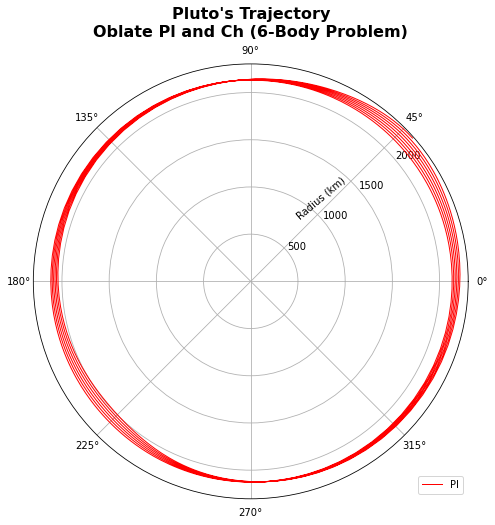

In [149]:
#-------------------------------------------------------------------------------------------------------------------------------
#Projecting the points to Pluto's plane.
p_pl_r_RK3_g = points_proj(pl_r_RK3_g[:,0], pl_r_RK3_g[:,1], pl_r_RK3_g[:,2], pln_pl_RK3, "Pl")

#Plotting (polar) Pluto's trajectory.
fig = plt.figure()
ax = plt.subplot(111, polar=True)
fig.set_size_inches(8, 8)
ax.set_title("Pluto's Trajectory\nOblate Pl and Ch (6-Body Problem)", va='bottom', fontweight="bold", fontsize=16)
plt.polar(p_pl_r_RK3_g[:,4], p_pl_r_RK3_g[:,3], color=col_pl, lw=1, label="Pl")
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()


### Projecting the Points to the Fitted Plane - Oblate Pl and Ch (6-Body Problem)

P. Proj. (Pl) ::   0%|          | 0/159634 [00:00<?, ?it/s]

P. Proj. (Ch) ::   0%|          | 0/159962 [00:00<?, ?it/s]

P. Proj. (St) ::   0%|          | 0/504948 [00:00<?, ?it/s]

P. Proj. (Ni) ::   0%|          | 0/622964 [00:00<?, ?it/s]

P. Proj. (Ke) ::   0%|          | 0/803995 [00:00<?, ?it/s]

P. Proj. (Hy) ::   0%|          | 0/955567 [00:00<?, ?it/s]

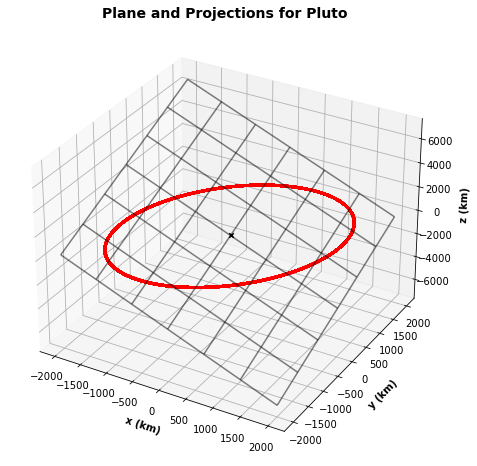

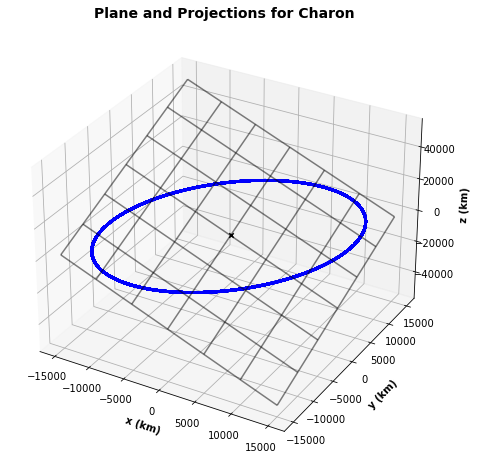

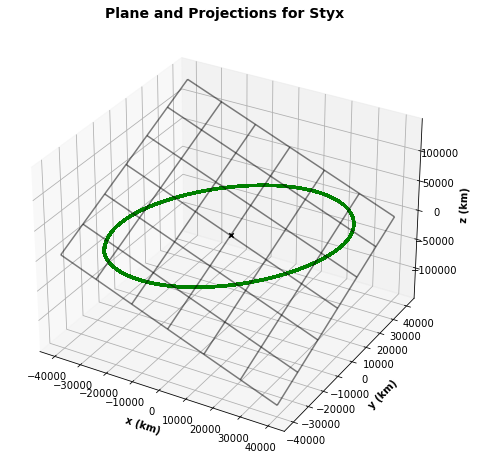

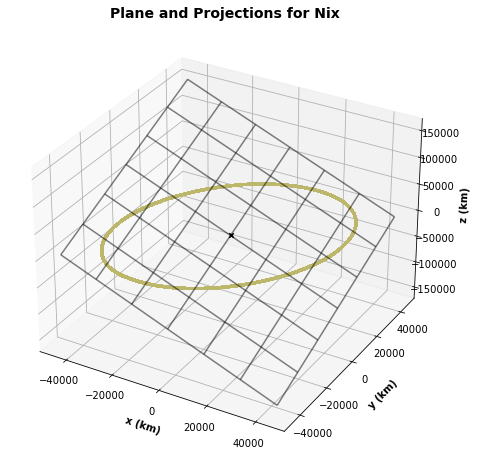

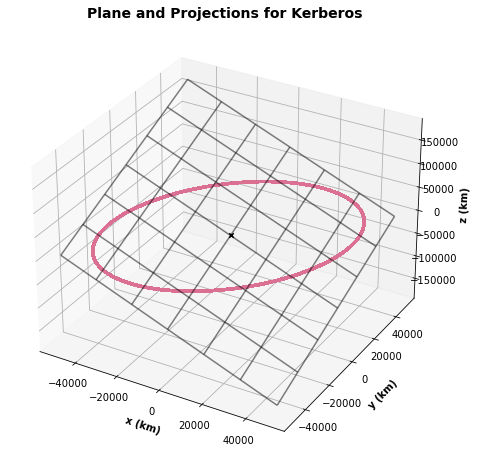

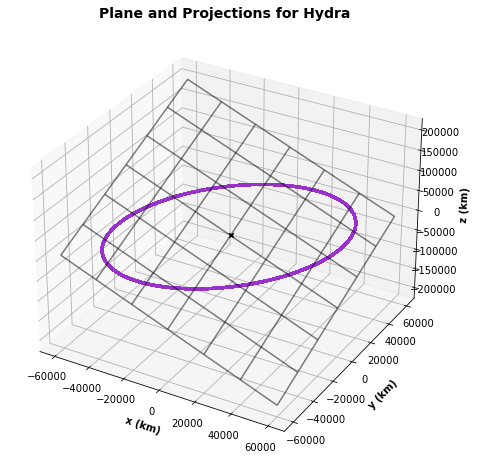

In [150]:
#-------------------------------------------------------------------------------------------------------------------------------
#Projecting the points to the fitted plane.
p_pl_r_RK3 = points_proj(p_r_pl_RK3[:,0], p_r_pl_RK3[:,1], p_r_pl_RK3[:,2], pln_pl_RK3, "Pl")
p_ch_r_RK3 = points_proj(p_r_ch_RK3[:,0], p_r_ch_RK3[:,1], p_r_ch_RK3[:,2], pln_ch_RK3, "Ch")
p_st_r_RK3 = points_proj(p_r_st_RK3[:,0], p_r_st_RK3[:,1], p_r_st_RK3[:,2], pln_st_RK3, "St")
p_ni_r_RK3 = points_proj(p_r_ni_RK3[:,0], p_r_ni_RK3[:,1], p_r_ni_RK3[:,2], pln_ni_RK3, "Ni")
p_ke_r_RK3 = points_proj(p_r_ke_RK3[:,0], p_r_ke_RK3[:,1], p_r_ke_RK3[:,2], pln_ke_RK3, "Ke")
p_hy_r_RK3 = points_proj(p_r_hy_RK3[:,0], p_r_hy_RK3[:,1], p_r_hy_RK3[:,2], pln_hy_RK3, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the points in their planes.

#Limits for the grid to represent the plane.
grid_pl = ([-2000, 2000, 7])
grid_ch = ([-15000,15000,7])
grid_st = ([-40000,40000,7])
grid_ni = ([-45000,45000,7])
grid_ke = ([-50000,50000,7])
grid_hy = ([-60000,60000,7])

#Plotting the points in their planes.
plot_plane("Pluto",    pln_pl_RK3, col_pl, p_pl_r_RK3, grid_pl)
plot_plane("Charon",   pln_ch_RK3, col_ch, p_ch_r_RK3, grid_ch)
plot_plane("Styx",     pln_st_RK3, col_st, p_st_r_RK3, grid_st)
plot_plane("Nix",      pln_ni_RK3, col_ni, p_ni_r_RK3, grid_ni)
plot_plane("Kerberos", pln_ke_RK3, col_ke, p_ke_r_RK3, grid_ke)
plot_plane("Hydra",    pln_hy_RK3, col_hy, p_hy_r_RK3, grid_hy)


### Fitting Ellipses - Oblate Pl and Ch (6-Body Problem)

2D Points (Pl) ::   0%|          | 0/159634 [00:00<?, ?it/s]

2D Points (Ch) ::   0%|          | 0/159962 [00:00<?, ?it/s]

2D Points (St) ::   0%|          | 0/504948 [00:00<?, ?it/s]

2D Points (Ni) ::   0%|          | 0/622964 [00:00<?, ?it/s]

2D Points (Ke) ::   0%|          | 0/803995 [00:00<?, ?it/s]

2D Points (Hy) ::   0%|          | 0/955567 [00:00<?, ?it/s]

<ipython-input-8-8163926b49f2>:23: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  x = np.linalg.lstsq(A, b)[0].squeeze()      # The constants are stored. They are for the equation of the form:


ELLIPTIC TRAJECTORY EQUATION:
Pluto:     2.21e-07x^2 + 9.43e-10xy+2.21e-07y^2+-4.16e-06x+-1.77e-06y = 1
Charon:    3.27e-09x^2 + -7.51e-13xy+3.27e-09y^2+-3.53e-08x+-1.13e-07y = 1
Styx:      5.53e-10x^2 + -5.4e-12xy+5.59e-10y^2+7.19e-08x+-1.12e-07y = 1
Nix:       4.2e-10x^2 + -1.72e-13xy+4.2e-10y^2+2.55e-08x+-2.4e-08y = 1
Kerberos:  3e-10x^2 + 1.97e-13xy+3e-10y^2+6.6e-08x+-2.18e-08y = 1
Hydra:     2.39e-10x^2 + -1.61e-14xy+2.38e-10y^2+-1.66e-07x+1.47e-07y = 1


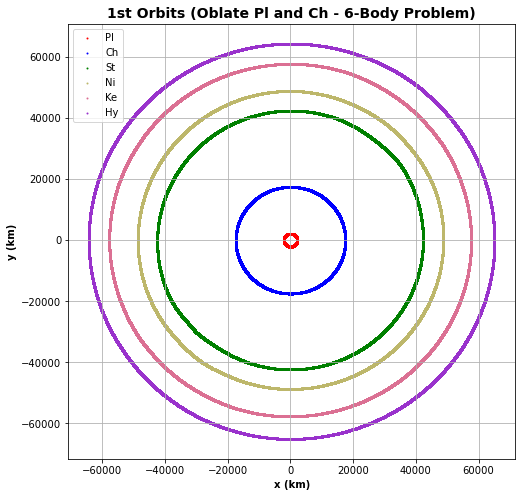

In [151]:
#-------------------------------------------------------------------------------------------------------------------------------
#Generating the 2D points.
pl_2d_r_RK3 = points_2d(p_pl_r_RK3, "Pl")
ch_2d_r_RK3 = points_2d(p_ch_r_RK3, "Ch")
st_2d_r_RK3 = points_2d(p_st_r_RK3, "St")
ni_2d_r_RK3 = points_2d(p_ni_r_RK3, "Ni")
ke_2d_r_RK3 = points_2d(p_ke_r_RK3, "Ke")
hy_2d_r_RK3 = points_2d(p_hy_r_RK3, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#Fitting the Ellipses.

#Calculating the constants for the ellipse equation for each body.
ell_pl_RK3 = fit_ellipse(pl_2d_r_RK3)
ell_ch_RK3 = fit_ellipse(ch_2d_r_RK3)
ell_st_RK3 = fit_ellipse(st_2d_r_RK3)
ell_ni_RK3 = fit_ellipse(ni_2d_r_RK3)
ell_ke_RK3 = fit_ellipse(ke_2d_r_RK3)
ell_hy_RK3 = fit_ellipse(hy_2d_r_RK3)

#Printing the ellipse equation for each trajectory.
print("ELLIPTIC TRAJECTORY EQUATION:")
print('Pluto:     {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_pl_RK3[0], ell_pl_RK3[1], ell_pl_RK3[2], ell_pl_RK3[3], ell_pl_RK3[4]))
print('Charon:    {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_ch_RK3[0], ell_ch_RK3[1], ell_ch_RK3[2], ell_ch_RK3[3], ell_ch_RK3[4]))
print('Styx:      {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_st_RK3[0], ell_st_RK3[1], ell_st_RK3[2], ell_st_RK3[3], ell_st_RK3[4]))
print('Nix:       {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_ni_RK3[0], ell_ni_RK3[1], ell_ni_RK3[2], ell_ni_RK3[3], ell_ni_RK3[4]))
print('Kerberos:  {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_ke_RK3[0], ell_ke_RK3[1], ell_ke_RK3[2], ell_ke_RK3[3], ell_ke_RK3[4]))
print('Hydra:     {0:.3}x^2 + {1:.3}xy+{2:.3}y^2+{3:.3}x+{4:.3}y = 1'.format(ell_hy_RK3[0], ell_hy_RK3[1], ell_hy_RK3[2], ell_hy_RK3[3], ell_hy_RK3[4]))

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting all points no one graph (approximating all planes as equal).
fig = plt.figure()
plt.scatter(pl_2d_r_RK3[:,0], pl_2d_r_RK3[:,1], c=col_pl, s=1, label="Pl")
plt.scatter(ch_2d_r_RK3[:,0], ch_2d_r_RK3[:,1], c=col_ch, s=1, label="Ch")
plt.scatter(st_2d_r_RK3[:,0], st_2d_r_RK3[:,1], c=col_st, s=1, label="St")
plt.scatter(ni_2d_r_RK3[:,0], ni_2d_r_RK3[:,1], c=col_ni, s=1, label="Ni")
plt.scatter(ke_2d_r_RK3[:,0], ke_2d_r_RK3[:,1], c=col_ke, s=1, label="Ke")
plt.scatter(hy_2d_r_RK3[:,0], hy_2d_r_RK3[:,1], c=col_hy, s=1, label="Hy")
plt.title("1st Orbits (Oblate Pl and Ch - 6-Body Problem)", fontweight="bold", fontsize=14)
plt.xlabel("x (km)", fontweight="bold")
plt.ylabel("y (km)", fontweight="bold")
plt.legend(loc='upper left')
fig.set_size_inches(8, 8)
plt.grid()
plt.xlim([min(hy_2d_r_RK3[:,0]) - (abs(min(hy_2d_r_RK3[:,0]))/10), max(hy_2d_r_RK3[:,0]) + (abs(max(hy_2d_r_RK3[:,0]))/10)])
plt.ylim([min(hy_2d_r_RK3[:,1]) - (abs(min(hy_2d_r_RK3[:,1]))/10), max(hy_2d_r_RK3[:,1]) + (abs(max(hy_2d_r_RK3[:,1]))/10)])
plt.show()  


### Fitted Ellipses' Parameters - Oblate Pl and Ch (6-Body Problem)

##### Even though all parameters improved by a few decimals, the difference is really small.

In [154]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to print parameters (OPC(6BP) vs. 6BP vs. JPL/NASA).
def print_param_RK3(title, ell_a, ell_b, ell_c, ell_e, a, b, c, e, ao, bo, co, eo):
    print(title + ':')
    print('OPC(6BP):  a: ' + str(ell_a) + '   b: ' + str(ell_b) + '   c: ' + str(ell_c) + '   e: ' + str(ell_e))
    print('6BP:       a: ' + str(a)     + '   b: ' + str(b)     + '   c: ' + str(c)     + '   e: ' + str(e))
    print('JPL/NASA:  a: ' + str(ao)    + '   b: ' + str(bo)    + '   c: ' + str(co)    + '   e: ' + str(eo))
    print("")


In [155]:
#-------------------------------------------------------------------------------------------------------------------------------
#Calculating the fitted ellipses' parameters.
ell_pl_a_RK3, ell_pl_b_RK3, ell_pl_c_RK3, ell_pl_e_RK3 = param_ellipse(ell_pl_RK3)
ell_ch_a_RK3, ell_ch_b_RK3, ell_ch_c_RK3, ell_ch_e_RK3 = param_ellipse(ell_ch_RK3)
ell_st_a_RK3, ell_st_b_RK3, ell_st_c_RK3, ell_st_e_RK3 = param_ellipse(ell_st_RK3)
ell_ni_a_RK3, ell_ni_b_RK3, ell_ni_c_RK3, ell_ni_e_RK3 = param_ellipse(ell_ni_RK3)
ell_ke_a_RK3, ell_ke_b_RK3, ell_ke_c_RK3, ell_ke_e_RK3 = param_ellipse(ell_ke_RK3)
ell_hy_a_RK3, ell_hy_b_RK3, ell_hy_c_RK3, ell_hy_e_RK3 = param_ellipse(ell_hy_RK3)

#-------------------------------------------------------------------------------------------------------------------------------
#Printing parameters (OPC(6BP) vs. 6BP vs. JPL/NASA).
print("ELLIPTIC TRAJECTORIES' PARAMETERS:")
print_param_RK3("Pluto",    ell_pl_a_RK3, ell_pl_b_RK3, ell_pl_c_RK3, ell_pl_e_RK3, ell_pl_a_RK, ell_pl_b_RK, ell_pl_c_RK, ell_pl_e_RK, ell_pl_a, ell_pl_b, ell_pl_c, ell_pl_e)
print_param_RK3("Charon",   ell_ch_a_RK3, ell_ch_b_RK3, ell_ch_c_RK3, ell_ch_e_RK3, ell_ch_a_RK, ell_ch_b_RK, ell_ch_c_RK, ell_ch_e_RK, ell_ch_a, ell_ch_b, ell_ch_c, ell_ch_e)
print_param_RK3("Styx",     ell_st_a_RK3, ell_st_b_RK3, ell_st_c_RK3, ell_st_e_RK3, ell_st_a_RK, ell_st_b_RK, ell_st_c_RK, ell_st_e_RK, ell_st_a, ell_st_b, ell_st_c, ell_st_e)
print_param_RK3("Nix",      ell_ni_a_RK3, ell_ni_b_RK3, ell_ni_c_RK3, ell_ni_e_RK3, ell_ni_a_RK, ell_ni_b_RK, ell_ni_c_RK, ell_ni_e_RK, ell_ni_a, ell_ni_b, ell_ni_c, ell_ni_e)
print_param_RK3("Kerberos", ell_ke_a_RK3, ell_ke_b_RK3, ell_ke_c_RK3, ell_ke_e_RK3, ell_ke_a_RK, ell_ke_b_RK, ell_ke_c_RK, ell_ke_e_RK, ell_ke_a, ell_ke_b, ell_ke_c, ell_ke_e)
print_param_RK3("Hydra",    ell_hy_a_RK3, ell_hy_b_RK3, ell_hy_c_RK3, ell_hy_e_RK3, ell_hy_a_RK, ell_hy_b_RK, ell_hy_c_RK, ell_hy_e_RK, ell_hy_a, ell_hy_b, ell_hy_c, ell_hy_e)


ELLIPTIC TRAJECTORIES' PARAMETERS:
Pluto:
OPC(6BP):  a: 2129.640215049045   b: 2124.0636086504996   c: 154.01698594881853   e: 0.07232066001593235
6BP:       a: 2129.6116009394364   b: 2123.995437354353   c: 154.5605155067764   e: 0.07257685647401403
JPL/NASA:  a: 2131.9525780276717   b: 2131.9404376378916   c: 7.194812241535554   e: 0.0033747524760581117

Charon:
OPC(6BP):  a: 17493.75263261466   b: 17487.67451217406   c: 461.1088020957383   e: 0.026358484184580675
6BP:       a: 17493.817078995406   b: 17487.699841038626   c: 462.59081604474335   e: 0.02644310352371181
JPL/NASA:  a: 17468.581965799047   b: 17468.569148617305   c: 21.161186529791404   e: 0.0012113854788459602

Styx:
OPC(6BP):  a: 42580.72907776271   b: 42270.2686279769   c: 5132.531433172055   e: 0.12053648550260414
6BP:       a: 42580.860031286546   b: 42270.26251740858   c: 5133.6680564075605   e: 0.1205628080934853
JPL/NASA:  a: 42525.54676510166   b: 42227.76810928481   c: 5023.716570360756   e: 0.11813408533252373

### Trajectory Comparison (Oblate Pl and Ch (6-Body Problem) vs. JPL/NASA)

##### As with the previous models, it is not easy to distinguish differences among the results of this model and the JPL/NASA data. Again, it is better to compare with the fitted ellipses' parameters.

In [157]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function to plot the compared trajectories of each body.
def plot_OPC_6BP_JPL(title, th_k, r_k, th_o, r_o, col):
    fig = plt.figure()
    ax = plt.axes(polar = True)
    fig.set_size_inches(8, 8)
    ax.set_title(title+"'s Trajectories", va='bottom', fontweight="bold", fontsize=16)
    plt.polar(th_k, r_k, color=col, lw=2, label="OPC(6BP)")
    plt.polar(th_o, r_o, color=col, lw=3, linestyle='dashed')
    plt.polar(0, 0, color=col, label="JPL/NASA", linestyle="dashed")
    ax.legend(loc='lower right')
    ax.set_rlabel_position(40)
    label_position=ax.get_rlabel_position()
    ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
    plt.show()


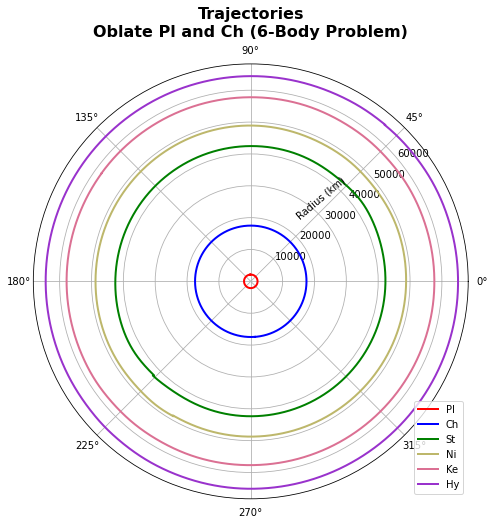

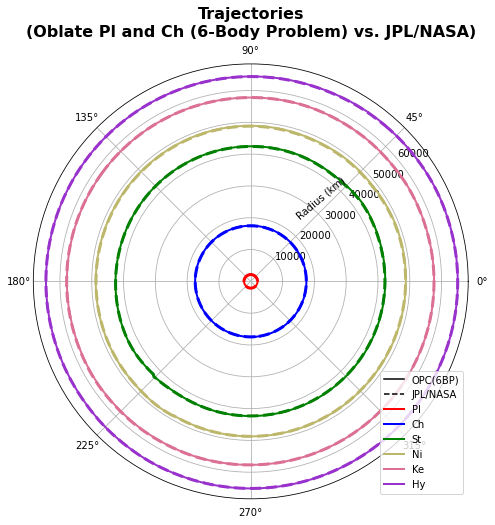

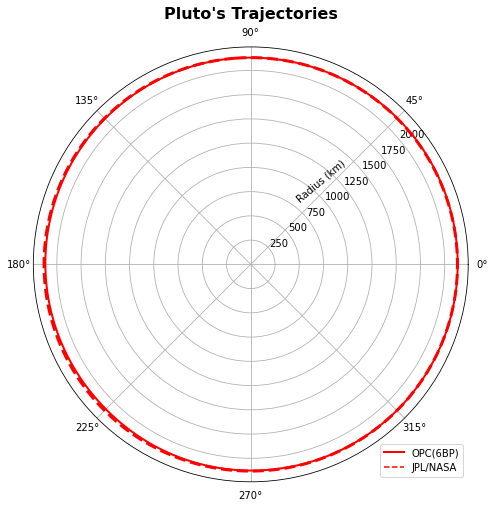

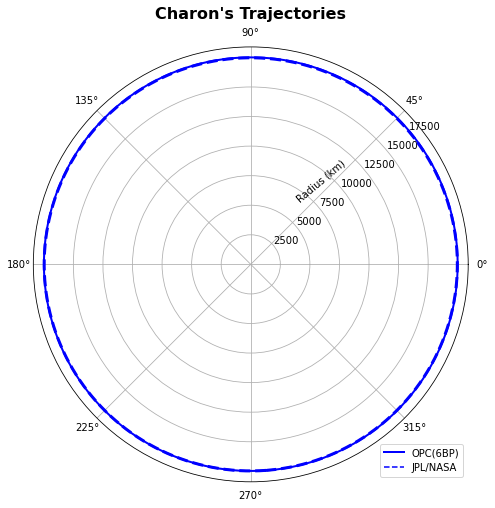

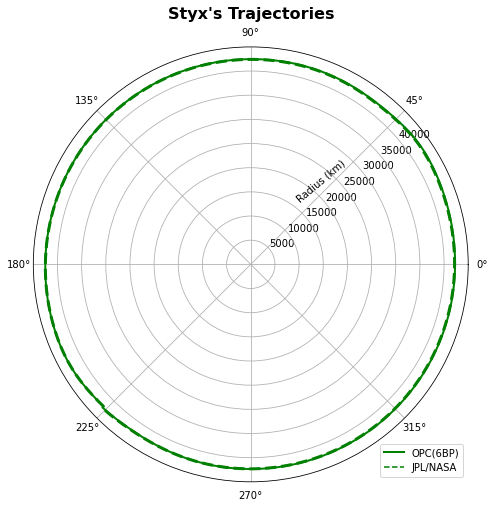

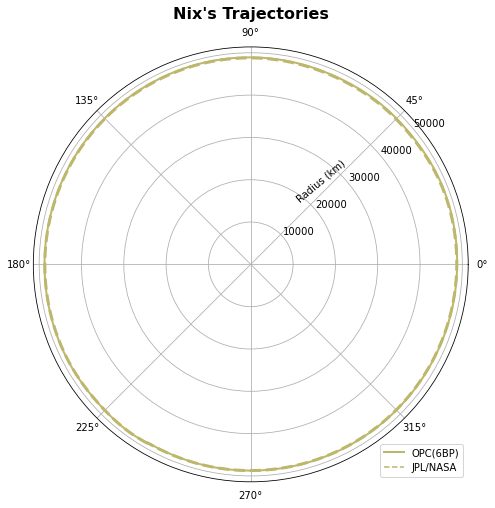

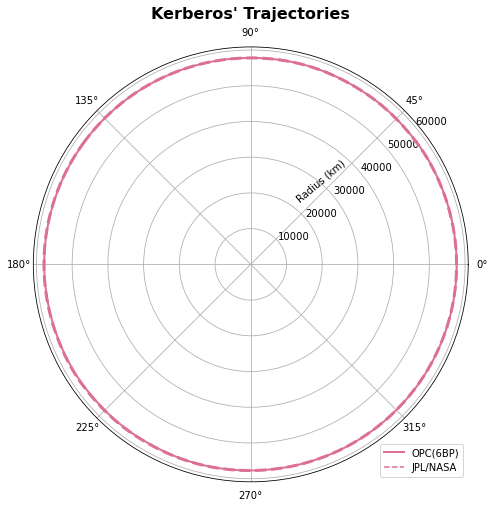

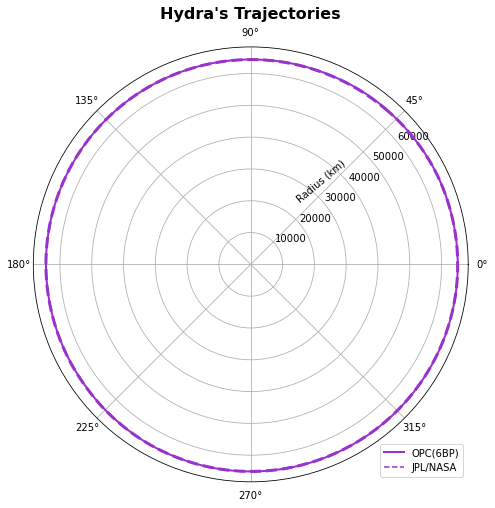

In [158]:
#Plotting all trajectories of this model.
fig = plt.figure()
ax = plt.subplot(111, polar=True)
fig.set_size_inches(8, 8)
ax.set_title("Trajectories\nOblate Pl and Ch (6-Body Problem)", va='bottom', fontweight="bold", fontsize=16)
plt.polar(p_pl_r_RK3[:,4], p_pl_r_RK3[:,3], color=col_pl, lw=2, label="Pl")
plt.polar(p_ch_r_RK3[:,4], p_ch_r_RK3[:,3], color=col_ch, lw=2, label="Ch")
plt.polar(p_st_r_RK3[:,4], p_st_r_RK3[:,3], color=col_st, lw=2, label="St")
plt.polar(p_ni_r_RK3[:,4], p_ni_r_RK3[:,3], color=col_ni, lw=2, label="Ni")
plt.polar(p_ke_r_RK3[:,4], p_ke_r_RK3[:,3], color=col_ke, lw=2, label="Ke")
plt.polar(p_hy_r_RK3[:,4], p_hy_r_RK3[:,3], color=col_hy, lw=2, label="Hy")
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()

#Plotting all trajectories to compare.
fig = plt.figure()
ax = plt.axes(polar = True)
fig.set_size_inches(8, 8)
ax.set_title("Trajectories\n(Oblate Pl and Ch (6-Body Problem) vs. JPL/NASA)", va='bottom', fontweight="bold", fontsize=16)
plt.plot(0, 0, color="black", label="OPC(6BP)")                        # These plots are
plt.plot(0, 0, color="black", label="JPL/NASA", linestyle="dashed")    # just for the labels.
plt.polar(p_pl_r_RK3[:,4], p_pl_r_RK3[:,3], color=col_pl, lw=2, label="Pl")
plt.polar(p_ch_r_RK3[:,4], p_ch_r_RK3[:,3], color=col_ch, lw=2, label="Ch")
plt.polar(p_st_r_RK3[:,4], p_st_r_RK3[:,3], color=col_st, lw=2, label="St")
plt.polar(p_ni_r_RK3[:,4], p_ni_r_RK3[:,3], color=col_ni, lw=2, label="Ni")
plt.polar(p_ke_r_RK3[:,4], p_ke_r_RK3[:,3], color=col_ke, lw=2, label="Ke")
plt.polar(p_hy_r_RK3[:,4], p_hy_r_RK3[:,3], color=col_hy, lw=2, label="Hy")
plt.polar(p_pl_r[:,4], p_pl_r[:,3], color=col_pl, lw=3, linestyle='dashed')
plt.polar(p_ch_r[:,4], p_ch_r[:,3], color=col_ch, lw=3, linestyle='dashed')
plt.polar(p_st_r[:,4], p_st_r[:,3], color=col_st, lw=3, linestyle='dashed')
plt.polar(p_ni_r[:,4], p_ni_r[:,3], color=col_ni, lw=3, linestyle='dashed')
plt.polar(p_ke_r[:,4], p_ke_r[:,3], color=col_ke, lw=3, linestyle='dashed')
plt.polar(p_hy_r[:,4], p_hy_r[:,3], color=col_hy, lw=3, linestyle='dashed')
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()

#Plotting the trajectories of all individual bodies.
plot_OPC_6BP_JPL("Pluto",    p_pl_r_RK3[:,4], p_pl_r_RK3[:,3], p_pl_r[:,4], p_pl_r[:,3], col_pl)
plot_OPC_6BP_JPL("Charon",   p_ch_r_RK3[:,4], p_ch_r_RK3[:,3], p_ch_r[:,4], p_ch_r[:,3], col_ch)
plot_OPC_6BP_JPL("Styx",     p_st_r_RK3[:,4], p_st_r_RK3[:,3], p_st_r[:,4], p_st_r[:,3], col_st)
plot_OPC_6BP_JPL("Nix",      p_ni_r_RK3[:,4], p_ni_r_RK3[:,3], p_ni_r[:,4], p_ni_r[:,3], col_ni)

fig = plt.figure()
ax = plt.axes(polar = True)
fig.set_size_inches(8, 8)
ax.set_title("Kerberos' Trajectories", va='bottom', fontweight="bold", fontsize=16)
plt.polar(p_ke_r_RK3[:,4], p_ke_r_RK3[:,3], color=col_ke, lw=2, label="OPC(6BP)")
plt.polar(p_ke_r[:,4], p_ke_r[:,3], color=col_ke, lw=3, linestyle='dashed')
plt.polar(0, 0, color=col_ke, label="JPL/NASA", linestyle="dashed")
ax.legend(loc='lower right')
ax.set_rlabel_position(40)
label_position=ax.get_rlabel_position()
ax.text(np.radians(label_position+10),ax.get_rmax()/2.,'Radius (km)', rotation=label_position,ha='center',va='center')
plt.show()
    
plot_OPC_6BP_JPL("Hydra",    p_hy_r_RK3[:,4], p_hy_r_RK3[:,3], p_hy_r[:,4], p_hy_r[:,3], col_hy)


### Angular Momentum Conservation - Oblate Pl and Ch (6-Body Problem)

##### As was expected, the angulra momentum stayed around an average value with very small variations.

In [159]:
#-------------------------------------------------------------------------------------------------------------------------------
#Calculating the angular momentum for each body.
pl_L_RK3 = momentum(pl_x_RK3, pl_y_RK3, pl_z_RK3, pl_vx_RK3, pl_vy_RK3, pl_vz_RK3, pl_m, "Pl")
ch_L_RK3 = momentum(ch_x_RK3, ch_y_RK3, ch_z_RK3, ch_vx_RK3, ch_vy_RK3, ch_vz_RK3, ch_m, "Ch")
st_L_RK3 = momentum(st_x_RK3, st_y_RK3, st_z_RK3, st_vx_RK3, st_vy_RK3, st_vz_RK3, st_m, "St")
ni_L_RK3 = momentum(ni_x_RK3, ni_y_RK3, ni_z_RK3, ni_vx_RK3, ni_vy_RK3, ni_vz_RK3, ni_m, "Ni")
ke_L_RK3 = momentum(ke_x_RK3, ke_y_RK3, ke_z_RK3, ke_vx_RK3, ke_vy_RK3, ke_vz_RK3, ke_m, "Ke")
hy_L_RK3 = momentum(hy_x_RK3, hy_y_RK3, hy_z_RK3, hy_vx_RK3, hy_vy_RK3, hy_vz_RK3, hy_m, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#PLS's total angular momentum.
L_t_RK3 = np.empty((len(pl_L_RK3)), float)
lim = tqdm(range(len(pl_L_RK3)), desc="Total Momentum: ")
for i in lim:
    L_t_RK3[i] = pl_L_RK3[i] + ch_L_RK3[i] + st_L_RK3[i] + ni_L_RK3[i] + ke_L_RK3[i] + hy_L_RK3[i]


Pl's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Ch's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

St's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Ni's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Ke's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Hy's Momentum :   0%|          | 0/1000001 [00:00<?, ?it/s]

Total Momentum:   0%|          | 0/1000001 [00:00<?, ?it/s]

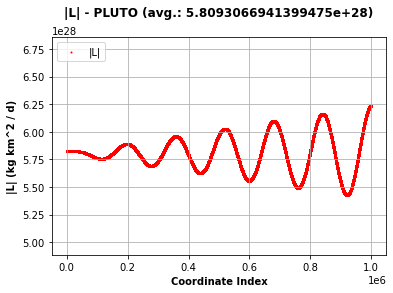

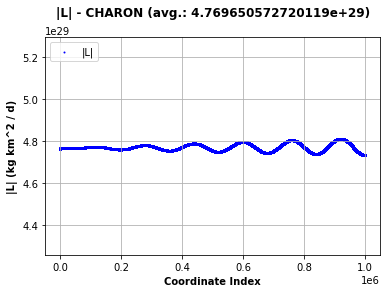

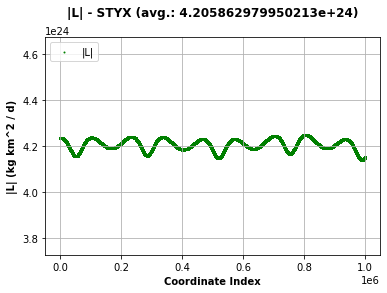

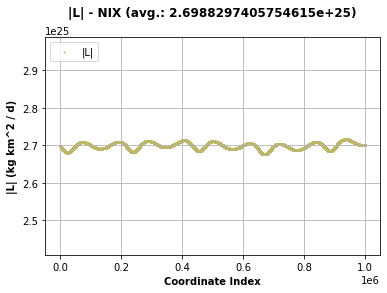

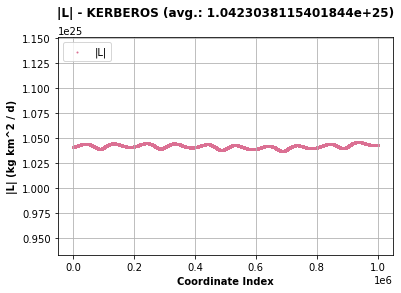

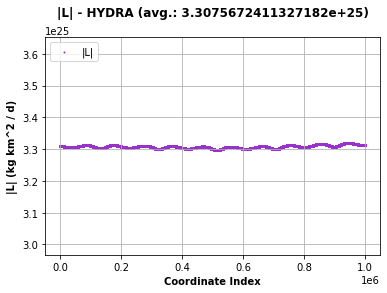

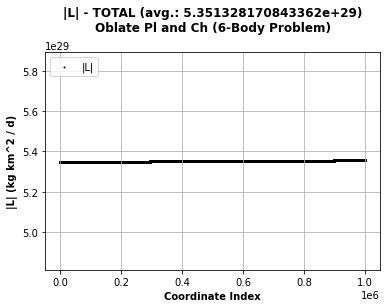

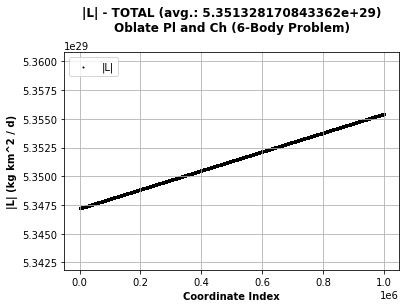

In [160]:
#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the angular momentum for each body and for the PLS.

#Averages.
aver_L_pl_RK3 = avg(pl_L_RK3)
aver_L_ch_RK3 = avg(ch_L_RK3)
aver_L_st_RK3 = avg(st_L_RK3)
aver_L_ni_RK3 = avg(ni_L_RK3)
aver_L_ke_RK3 = avg(ke_L_RK3)
aver_L_hy_RK3 = avg(hy_L_RK3)
aver_L_t_RK3  = avg(L_t_RK3)

#Plotting each body's angular momentum.
plot_L_RK("PLUTO",    pl_L_RK3, col_pl, aver_L_pl_RK3)
plot_L_RK("CHARON",   ch_L_RK3, col_ch, aver_L_ch_RK3)
plot_L_RK("STYX",     st_L_RK3, col_st, aver_L_st_RK3)
plot_L_RK("NIX",      ni_L_RK3, col_ni, aver_L_ni_RK3)
plot_L_RK("KERBEROS", ke_L_RK3, col_ke, aver_L_ke_RK3)
plot_L_RK("HYDRA",    hy_L_RK3, col_hy, aver_L_hy_RK3)

#Plotting the total angular momentum.
fig = plt.figure()
plt.scatter(range(len(L_t_RK3)), L_t_RK3, c="black", s=1, label="|L|")
plt.title("|L| - TOTAL (avg.: " + str(aver_L_t_RK3) + ")\nOblate Pl and Ch (6-Body Problem)\n", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("|L| (kg km^2 / d)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
plt.ylim([min(L_t_RK3) - (min(L_t_RK3)/10), max(L_t_RK3) + (max(L_t_RK3)/10)])   # Keeps the limits 10% above and under
plt.show()                                                                       # the highest and lowest values plotted.

#Zoom to appreciate variaton.
fig = plt.figure()
plt.scatter(range(len(L_t_RK3)), L_t_RK3, c="black", s=1, label="|L|")
plt.title("|L| - TOTAL (avg.: " + str(aver_L_t_RK3) + ")\nOblate Pl and Ch (6-Body Problem)\n", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("|L| (kg km^2 / d)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
plt.ylim([min(L_t_RK3) - (min(L_t_RK3)/1000), max(L_t_RK3) + (max(L_t_RK3)/1000)])  # Established limits to get the zoom.
plt.show()


### Energy Conservation - Oblate Pl and Ch (6-Body Problem)

##### Again, the energies stayed around an average value without varying much.

In [161]:
#FUNCTIONS:

#-------------------------------------------------------------------------------------------------------------------------------
#Function for the energy of a moon (excluding Charon).
def energy_OPC_6BP_m(ds, x, y, z, plx, ply, plz, chx, chy, chz, v, m1, m2, m3, m4, m5, m6, title):
    T, U, E = np.zeros((len(v)), float), np.zeros((len(v)), float), np.zeros((len(v)), float)
    
    lim = tqdm(range(len(v)), desc="Energy ("+title+"): ")
    for i in lim:
        
        mu = G*pl_m   # Mass gravitational constant (Pluto).
        rnpl = Ainv_pl.dot([x[i] - plx[i], y[i] - ply[i], z[i] - plz[i]])  # The position vector from Pluto is calculated.
        r = math.sqrt(rnpl[0]**2 + rnpl[1]**2 + rnpl[2]**2)
        ru = rnpl/r    # The unitary vector in the radial direction is calculated.

        U_p_pl = - (1/2)*(J2_pl)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 3*(ru[2]**2))  # Perturbative term (Pluto).
        
        mu = G*ch_m   # Mass gravitational constant (Charon).
        rnch = Ainv_ch.dot([x[i] - chx[i], y[i] - chy[i], z[i] - chz[i]])  # The position vector from Charon is calculated.
        r = math.sqrt(rnch[0]**2 + rnch[1]**2 + rnch[2]**2)
        ru = rnch/r    # The unitary vector in the radial direction is calculated.

        U_p_ch = - (1/2)*(J2_ch)*(mu/(r**2))*((r_eq_ch/r)**2)*(1 - 3*(ru[2]**2))  # Perturbative term (Charon).
        
        # Including the perturbative terms in the potential energy.
        T[i] = 0.5*m1*(v[i]**2)
        U[i] = - U_p_ch - U_p_pl + ((-G*m1*m2) / (ds[i,0])) + ((-G*m1*m3) / (ds[i,1])) + ((-G*m1*m4) / (ds[i,2])) + ((-G*m1*m5) / (ds[i,3])) + ((-G*m1*m6) / (ds[i,4]))
        E[i] = T[i] + U[i]
        
    return T, U, E


In [162]:
#-------------------------------------------------------------------------------------------------------------------------------
#Distances between bodies.
pl_d_RK3, ch_d_RK3, st_d_RK3, ni_d_RK3, ke_d_RK3, hy_d_RK3 = dist(pl_x_RK3, pl_y_RK3, pl_z_RK3, ch_x_RK3, ch_y_RK3, ch_z_RK3, st_x_RK3, st_y_RK3, st_z_RK3, ni_x_RK3, ni_y_RK3, ni_z_RK3, ke_x_RK3, ke_y_RK3, ke_z_RK3, hy_x_RK3, hy_y_RK3, hy_z_RK3)


Dist. Loop:   0%|          | 0/1000001 [00:00<?, ?it/s]

In [164]:
#-------------------------------------------------------------------------------------------------------------------------------
#Universal Gravitational Constant (days).
G = 4.982174e-10  #(km^3 / kg d^2)

#Transformation matrices for the new system whose XY plane is aligned to the body's equator.
A_pl, Ainv_pl = plane_equator(RA_pl, dec_pl)
A_pl, Ainv_pl = np.array(A_pl), np.array(Ainv_pl)

A_ch, Ainv_ch = plane_equator(RA_ch, dec_ch)
A_ch, Ainv_ch = np.array(A_ch), np.array(Ainv_ch)

#-------------------------------------------------------------------------------------------------------------------------------
#Calculating the energies for each body.

pl_T_RK3, pl_U_RK3, pl_E_RK3 = np.zeros((len(pl_v_RK3)), float), np.zeros((len(pl_v_RK3)), float), np.zeros((len(pl_v_RK3)), float)
ch_T_RK3, ch_U_RK3, ch_E_RK3 = np.zeros((len(pl_v_RK3)), float), np.zeros((len(pl_v_RK3)), float), np.zeros((len(pl_v_RK3)), float)


#Pluto.
mu = G*pl_m   # Mass gravitational constant (Pluto).
lim = tqdm(range(len(pl_v_RK3)), desc="Energy (Pl): ")
for i in lim:        # Loop to calculate the energy in each coordinate.
    
    #Charon's terms.
    
    # The position vector from Charon is calculated.
    rn = Ainv_ch.dot([pl_x_RK3[i] - ch_x_RK3[i], pl_y_RK3[i] - ch_y_RK3[i], pl_z_RK3[i] - ch_z_RK3[i]])
    r = math.sqrt(rn[0]**2 + rn[1]**2 + rn[2]**2)
    ru = rn/r      # The unitary vector in the radila direction is calculated.
    U_p = - (1/2)*(J2_ch)*(G*ch_m/(r**2))*((r_eq_ch/r)**2)*(1 - 3*(ru[2]**2))  # Perturbative term (Charon).
    
    # The position vector from Pluto is calculated.
    rn = Ainv_pl.dot([ch_x_RK3[i] - pl_x_RK3[i], ch_y_RK3[i] - pl_y_RK3[i], ch_z_RK3[i] - pl_z_RK3[i]])
    r = math.sqrt(rn[0]**2 + rn[1]**2 + rn[2]**2)
    ru = rn/r      # The unitary vector in the radila direction is calculated.
    U_p = U_p + (1/2)*(J2_pl)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 3*(ru[2]**2))  # Perturbative term (Pluto).
    
    
    #Styx's term.
    rn = Ainv_pl.dot([st_x_RK3[i] - pl_x_RK3[i], st_y_RK3[i] - pl_y_RK3[i], st_z_RK3[i] - pl_z_RK3[i]])
    r = math.sqrt(rn[0]**2 + rn[1]**2 + rn[2]**2)
    ru = rn/r
    U_p = U_p + (1/2)*(J2_pl)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 3*(ru[2]**2))
    
    
    #Nix's term.
    rn = Ainv_pl.dot([ni_x_RK3[i] - pl_x_RK3[i], ni_y_RK3[i] - pl_y_RK3[i], ni_z_RK3[i] - pl_z_RK3[i]])
    r = math.sqrt(rn[0]**2 + rn[1]**2 + rn[2]**2)
    ru = rn/r
    U_p = U_p + (1/2)*(J2_pl)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 3*(ru[2]**2))
      
    
    #Kerberos' term.
    rn = Ainv_pl.dot([ke_x_RK3[i] - pl_x_RK3[i], ke_y_RK3[i] - pl_y_RK3[i], ke_z_RK3[i] - pl_z_RK3[i]])
    r = math.sqrt(rn[0]**2 + rn[1]**2 + rn[2]**2)
    ru = rn/r
    U_p = U_p + (1/2)*(J2_pl)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 3*(ru[2]**2))

    
    #Hydra's term.
    rn = Ainv_pl.dot([hy_x_RK3[i] - pl_x_RK3[i], hy_y_RK3[i] - pl_y_RK3[i], hy_z_RK3[i] - pl_z_RK3[i]])
    r = math.sqrt(rn[0]**2 + rn[1]**2 + rn[2]**2)
    ru = rn/r
    U_p = U_p + (1/2)*(J2_pl)*(mu/(r**2))*((r_eq_pl/r)**2)*(1 - 3*(ru[2]**2))
    
    
    # Including the perturbative terms in the potential energy.
    pl_T_RK3[i] = 0.5*pl_m*(pl_v_RK3[i]**2)
    pl_U_RK3[i] = - U_p + ((-mu*ch_m) / (pl_d_RK3[i,0])) + ((-mu*st_m) / (pl_d_RK3[i,1])) + ((-mu*ni_m) / (pl_d_RK3[i,2])) + ((-mu*ke_m) / (pl_d_RK3[i,3])) + ((-mu*hy_m) / (pl_d_RK3[i,4]))
    pl_E_RK3[i] = pl_T_RK3[i] + pl_U_RK3[i]

    
#Charon.
mu = G*ch_m    # Mass gravitational constant (Charon).
lim = tqdm(range(len(pl_v_RK3)), desc="Energy (Ch): ")
for i in lim:
    
    #Pluto's terms.
    
    # The position vector from Pluto is calculated.
    rn = Ainv_pl.dot([ch_x_RK3[i] - pl_x_RK3[i], ch_y_RK3[i] - pl_y_RK3[i], ch_z_RK3[i] - pl_z_RK3[i]])
    r = math.sqrt(rn[0]**2 + rn[1]**2 + rn[2]**2)
    ru = rn/r      # The unitary vector in the radila direction is calculated.
    U_p = - (1/2)*(J2_pl)*(G*pl_m/(r**2))*((r_eq_pl/r)**2)*(1 - 3*(ru[2]**2))  # Perturbative term (Pluto).
    
    # The position vector from Charon is calculated.
    rn = Ainv_ch.dot([pl_x_RK3[i] - ch_x_RK3[i], pl_y_RK3[i] - ch_y_RK3[i], pl_z_RK3[i] - ch_z_RK3[i]])
    r = math.sqrt(rn[0]**2 + rn[1]**2 + rn[2]**2)
    ru = rn/r      # The unitary vector in the radila direction is calculated.
    U_p = U_p + (1/2)*(J2_ch)*(mu/(r**2))*((r_eq_ch/r)**2)*(1 - 3*(ru[2]**2))  # Perturbative term (Charon).
    
        
    #Styx's term.
    rn = Ainv_ch.dot([st_x_RK3[i] - ch_x_RK3[i], st_y_RK3[i] - ch_y_RK3[i], st_z_RK3[i] - ch_z_RK3[i]])
    r = math.sqrt(rn[0]**2 + rn[1]**2 + rn[2]**2)
    ru = rn/r
    U_p = U_p + (1/2)*(J2_ca)*(mu/(r**2))*((r_eq_ca/r)**2)*(1 - 3*(ru[2]**2))

    
    #Nix's term.
    rn = Ainv_ch.dot([ni_x_RK3[i] - ch_x_RK3[i], ni_y_RK3[i] - ch_y_RK3[i], ni_z_RK3[i] - ch_z_RK3[i]])
    r = math.sqrt(rn[0]**2 + rn[1]**2 + rn[2]**2)
    ru = rn/r
    U_p = U_p + (1/2)*(J2_ca)*(mu/(r**2))*((r_eq_ca/r)**2)*(1 - 3*(ru[2]**2))
    
    
    #Kerberos' term.
    rn = Ainv_ch.dot([ke_x_RK3[i] - ch_x_RK3[i], ke_y_RK3[i] - ch_y_RK3[i], ke_z_RK3[i] - ch_z_RK3[i]])
    r = math.sqrt(rn[0]**2 + rn[1]**2 + rn[2]**2)
    ru = rn/r
    U_p = U_p + (1/2)*(J2_ca)*(mu/(r**2))*((r_eq_ca/r)**2)*(1 - 3*(ru[2]**2))

    
    #Hydra's term.
    rn = Ainv_ch.dot([hy_x_RK3[i] - ch_x_RK3[i], hy_y_RK3[i] - ch_y_RK3[i], hy_z_RK3[i] - ch_z_RK3[i]])
    r = math.sqrt(rn[0]**2 + rn[1]**2 + rn[2]**2)
    ru = rn/r
    U_p = U_p + (1/2)*(J2_ca)*(mu/(r**2))*((r_eq_ca/r)**2)*(1 - 3*(ru[2]**2))
    
    
    # Including the perturbative terms in the potential energy.
    ch_T_RK3[i] = 0.5*ch_m*(ch_v_RK3[i]**2)
    ch_U_RK3[i] = - U_p + ((-mu*pl_m) / (ch_d_RK3[i,0])) + ((-mu*st_m) / (ch_d_RK3[i,1])) + ((-mu*ni_m) / (ch_d_RK3[i,2])) + ((-mu*ke_m) / (ch_d_RK3[i,3])) + ((-mu*hy_m) / (ch_d_RK3[i,4]))
    ch_E_RK3[i] = ch_T_RK3[i] + ch_U_RK3[i]
    
# Calculating the energy for the rest of the moons.
st_T_RK3, st_U_RK3, st_E_RK3 = energy_OPC_6BP_m(st_d_RK3, st_x_RK3, st_y_RK3, st_z_RK3, pl_x_RK3, pl_y_RK3, pl_z_RK3, ch_x_RK3, ch_y_RK3, ch_z_RK3, st_v_RK3, st_m, pl_m, ch_m, ni_m, ke_m, hy_m, "St")
ni_T_RK3, ni_U_RK3, ni_E_RK3 = energy_OPC_6BP_m(ni_d_RK3, ni_x_RK3, ni_y_RK3, ni_z_RK3, pl_x_RK3, pl_y_RK3, pl_z_RK3, ch_x_RK3, ch_y_RK3, ch_z_RK3, ni_v_RK3, ni_m, pl_m, ch_m, st_m, ke_m, hy_m, "Ni")
ke_T_RK3, ke_U_RK3, ke_E_RK3 = energy_OPC_6BP_m(ke_d_RK3, ke_x_RK3, ke_y_RK3, ke_z_RK3, pl_x_RK3, pl_y_RK3, pl_z_RK3, ch_x_RK3, ch_y_RK3, ch_z_RK3, ke_v_RK3, ke_m, pl_m, ch_m, st_m, ni_m, hy_m, "Ke")
hy_T_RK3, hy_U_RK3, hy_E_RK3 = energy_OPC_6BP_m(hy_d_RK3, hy_x_RK3, hy_y_RK3, hy_z_RK3, pl_x_RK3, pl_y_RK3, pl_z_RK3, ch_x_RK3, ch_y_RK3, ch_z_RK3, hy_v_RK3, ke_m, pl_m, ch_m, st_m, ni_m, ke_m, "Hy")

#-------------------------------------------------------------------------------------------------------------------------------
#PLS's total energy.
T_t_RK3, U_t_RK3, E_t_RK3 = np.zeros((len(pl_T_RK3)), float), np.zeros((len(pl_T_RK3)), float), np.zeros((len(pl_T_RK3)), float)
lim = tqdm(range(len(ch_E_RK3)), desc="Energies (Tot.): ")
for i in lim:
    T_t_RK3[i] = pl_T_RK3[i] + ch_T_RK3[i] + st_T_RK3[i] + ni_T_RK3[i] + ke_T_RK3[i] + hy_T_RK3[i]
    U_t_RK3[i] = pl_U_RK3[i] + ch_U_RK3[i] + st_U_RK3[i] + ni_U_RK3[i] + ke_U_RK3[i] + hy_U_RK3[i]
    E_t_RK3[i] = pl_E_RK3[i] + ch_E_RK3[i] + st_E_RK3[i] + ni_E_RK3[i] + ke_E_RK3[i] + hy_E_RK3[i]


Energy (Pl):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energy (Ch):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energy (St):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energy (Ni):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energy (Ke):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energy (Hy):   0%|          | 0/1000001 [00:00<?, ?it/s]

Energies (Tot.):   0%|          | 0/1000001 [00:00<?, ?it/s]

ENERGY AVERAGES:
Pl:      T =2.847637264742528e+28    U = -5.245245196884323e+29    E = -4.960481470410241e+29
Ch:      T =2.3378656037587196e+29    U = -5.245124954917047e+29    E = -2.9072593511585336e+29
St:      T =6.538512699751035e+23    U = -1.2936016738484895e+24    E = -6.397504038733951e+23
Ni:      T =3.401819420929135e+24    U = -6.748634912072565e+24    E = -3.3468154911432717e+24
Ke:      T =1.0179470550676765e+24    U = -2.0233677609158343e+24    E = -1.0054207058481611e+24
Hy:      T =9.060974135291939e+23    U = -1.8037461693249338e+24    E = -8.976487557956166e+23
Total:   T =2.6226891273845858e+29    U = -1.0490488845306554e+30    E = -7.867799717922638e+29


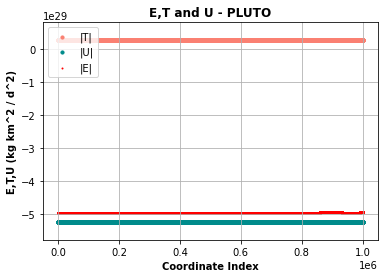

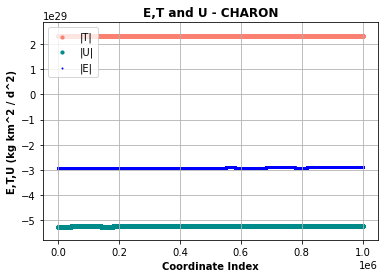

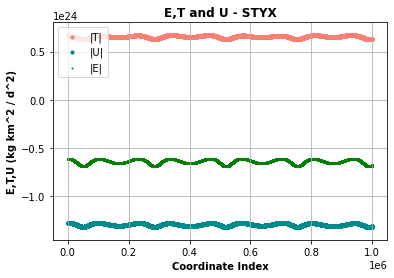

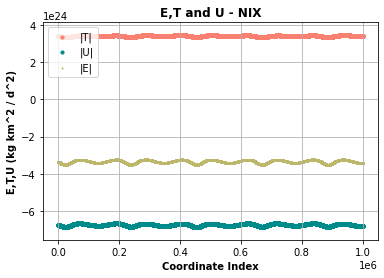

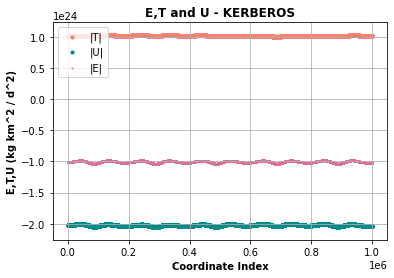

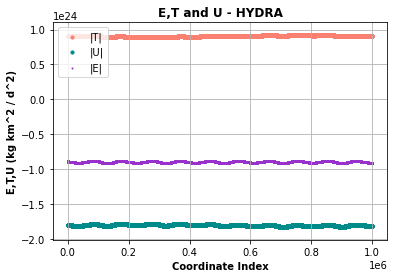

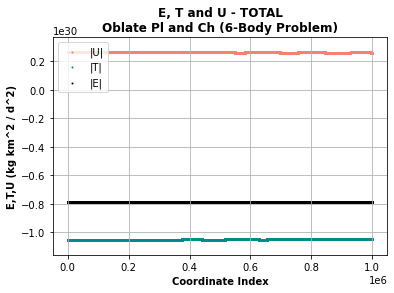

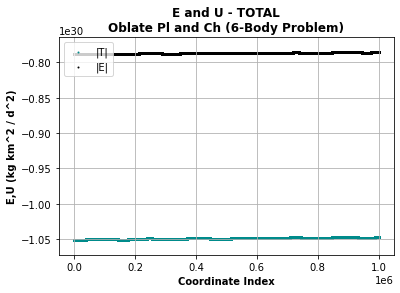

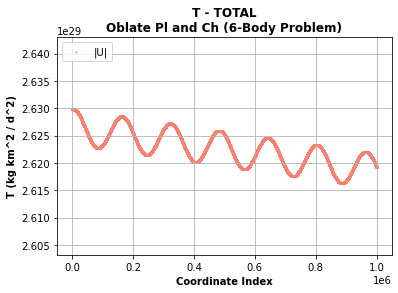

In [165]:
#-------------------------------------------------------------------------------------------------------------------------------
#Energy averages for each body.
print("ENERGY AVERAGES:")
print("Pl:      T =" + str(avg(pl_T_RK3)) + "    U = " + str(avg(pl_U_RK3)) + "    E = " +  str(avg(pl_E_RK3)))
print("Ch:      T =" + str(avg(ch_T_RK3)) + "    U = " + str(avg(ch_U_RK3)) + "    E = " +  str(avg(ch_E_RK3)))
print("St:      T =" + str(avg(st_T_RK3)) + "    U = " + str(avg(st_U_RK3)) + "    E = " +  str(avg(st_E_RK3)))
print("Ni:      T =" + str(avg(ni_T_RK3)) + "    U = " + str(avg(ni_U_RK3)) + "    E = " +  str(avg(ni_E_RK3)))
print("Ke:      T =" + str(avg(ke_T_RK3)) + "    U = " + str(avg(ke_U_RK3)) + "    E = " +  str(avg(ke_E_RK3)))
print("Hy:      T =" + str(avg(hy_T_RK3)) + "    U = " + str(avg(hy_U_RK3)) + "    E = " +  str(avg(hy_E_RK3)))
print("Total:   T =" + str(avg(T_t_RK3))  + "    U = " + str(avg(U_t_RK3))  + "    E = " +  str(avg(E_t_RK3)))

#-------------------------------------------------------------------------------------------------------------------------------
#PLOTS:

#Plotting the energies for each body and for the PLS.
plot_E_RK("PLUTO",    pl_T_RK3, pl_U_RK3, pl_E_RK3, col_pl)
plot_E_RK("CHARON",   ch_T_RK3, ch_U_RK3, ch_E_RK3, col_ch)
plot_E_RK("STYX",     st_T_RK3, st_U_RK3, st_E_RK3, col_st)
plot_E_RK("NIX",      ni_T_RK3, ni_U_RK3, ni_E_RK3, col_ni)
plot_E_RK("KERBEROS", ke_T_RK3, ke_U_RK3, ke_E_RK3, col_ke)
plot_E_RK("HYDRA",    hy_T_RK3, hy_U_RK3, hy_E_RK3, col_hy)

#-------------------------------------------------------------------------------------------------------------------------------
#Plotting the PLS's total energies.
fig = plt.figure()
ax1 = fig.add_subplot(111)
ax1.scatter(range(len(T_t_RK3)), T_t_RK3, c="salmon", s=1, label="|U|")
ax1.scatter(range(len(U_t_RK3)), U_t_RK3, c="darkcyan", s=1, label="|T|")
ax1.scatter(range(len(E_t_RK3)), E_t_RK3, c="black", s=1, label="|E|")
plt.title("E, T and U - TOTAL\nOblate Pl and Ch (6-Body Problem)", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("E,T,U (kg km^2 / d^2)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
lim_inf = min(np.array([min(E_t_RK3), min(U_t_RK3), min(T_t_RK3)]))
lim_sup = max(np.array([max(E_t_RK3), max(U_t_RK3), max(T_t_RK3)]))
extra = max(np.array([abs(lim_inf), abs(lim_sup)]))
plt.ylim([lim_inf - extra/10, lim_sup + extra/10])
plt.show()

#Zoom to the total and potential energies.
fig = plt.figure()
ax1 = fig.add_subplot(111)  
ax1.scatter(range(len(U_t_RK3)), U_t_RK3, c="darkcyan", s=1, label="|T|")
ax1.scatter(range(len(E_t_RK3)), E_t_RK3, c="black", s=1, label="|E|")
plt.title("E and U - TOTAL\nOblate Pl and Ch (6-Body Problem)", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("E,U (kg km^2 / d^2)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
lim_inf = min(np.array([min(E_t_RK3), min(U_t_RK3)]))
lim_sup = max(np.array([max(E_t_RK3), max(U_t_RK3)]))
extra = max(np.array([abs(lim_inf), abs(lim_sup)]))
plt.ylim([lim_inf - extra/50, lim_sup + extra/50])
plt.show()

#Zoom to the kinetic energy.
fig = plt.figure()
ax1 = fig.add_subplot(111)  
ax1.scatter(range(len(T_t_RK3)), T_t_RK3, c="salmon", s=1, label="|U|")
plt.title("T - TOTAL\nOblate Pl and Ch (6-Body Problem)", fontweight="bold", fontsize=12)
plt.xlabel("Coordinate Index", fontweight="bold")
plt.ylabel("T (kg km^2 / d^2)", fontweight="bold")
plt.legend(loc='upper left')
plt.grid()
plt.ylim([min(T_t_RK3) - abs(min(T_t_RK3)/200), max(T_t_RK3) + abs(max(T_t_RK3)/200)])
plt.show()
